## import models

In [ ]:
# install pydrive to load data
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import datetime
%matplotlib inline

In [ ]:
from pylab import rcParams

import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error

from plotly import tools

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

## XJ_MODIS_2015_2020 time series

In [ ]:
#https://drive.google.com/file/d/1EMitPSO0rCwk1t3eiwPoeBUBhfh9Q-tv/view?usp=share_link

id = "1EMitPSO0rCwk1t3eiwPoeBUBhfh9Q-tv"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XinJiang_2015_2020_144points_MODIS.csv')


In [ ]:
XJ_MODIS = pd.read_csv('XinJiang_2015_2020_144points_MODIS.csv', parse_dates=['date'], index_col='date')

In [ ]:
XJ_MODIS.head()

,system:index,temp1,temp10,temp11,temp12,temp13,temp14,temp15,temp16,temp17,...,temp22.5,temp23.5,temp24.5,temp3.5,temp4.5,temp5.5,temp6.5,temp7.5,temp8.5,temp9.5
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,0,9.57,no data,no data,4.29,9.91,10.53,10.93,10.33,9.93,...,no data,no data,no data,-3.11,4.19,7.15,3.69,6.03,-2.43,-7.23
2015-01-02,1,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,-4.45,-0.35,-0.01,6.69,9.89,11.67,10.25,6.43,2.63,-0.93
2015-01-03,2,4.55,no data,no data,no data,no data,no data,no data,no data,3.15,...,-4.79,no data,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39
2015-01-04,3,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,no data,no data,no data,no data,no data,no data,no data,no data,no data,no data
2015-01-05,4,no data,no data,-2.29,no data,no data,no data,no data,no data,no data,...,no data,no data,no data,1.73,4.23,4.81,no data,no data,-4.55,no data


In [ ]:
missing_values=['no data']
XJ_MODIS = XJ_MODIS.replace(missing_values,np.NaN)
XJ_MODIS = XJ_MODIS.drop(columns=['system:index'])
XJ_MODIS


,temp1,temp10,temp11,temp12,temp13,temp14,temp15,temp16,temp17,temp18,...,temp22.5,temp23.5,temp24.5,temp3.5,temp4.5,temp5.5,temp6.5,temp7.5,temp8.5,temp9.5
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,9.57,NaN,NaN,4.29,9.91,10.53,10.93,10.33,9.93,8.19,...,NaN,NaN,NaN,-3.11,4.19,7.15,3.69,6.03,-2.43,-7.23
2015-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-4.45,-0.35,-0.01,6.69,9.89,11.67,10.25,6.43,2.63,-0.93
2015-01-03,4.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.15,-4.47,...,-4.79,NaN,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39
2015-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,NaN,NaN,-2.29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.73,4.23,4.81,NaN,NaN,-4.55,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,7.45,NaN,NaN,NaN,9.13,9.71,NaN,NaN,NaN,NaN,...,-4.57,-3.59,-2.93,NaN,4.79,4.37,6.33,6.71,6.09,2.11
2020-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-4.51,4.07,-0.03,NaN,NaN,2.73,1.39,8.81,3.55,0.63
2020-12-28,2.67,4.67,5.19,5.91,4.19,4.89,4.39,2.99,4.35,4.27,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
XJ_MODIS.isnull().sum()

temp1      1002
temp10      932
temp11      949
temp12      956
temp13     1006
           ... 
temp5.5     965
temp6.5    1002
temp7.5     832
temp8.5     867
temp9.5     899
Length: 144, dtype: int64

In [ ]:
#CA_MODIS.dropna()
# fill the missing with last valid observation forward 
XJ_MODIS = XJ_MODIS.ffill()
XJ_MODIS

,temp1,temp10,temp11,temp12,temp13,temp14,temp15,temp16,temp17,temp18,...,temp22.5,temp23.5,temp24.5,temp3.5,temp4.5,temp5.5,temp6.5,temp7.5,temp8.5,temp9.5
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,9.57,NaN,NaN,4.29,9.91,10.53,10.93,10.33,9.93,8.19,...,NaN,NaN,NaN,-3.11,4.19,7.15,3.69,6.03,-2.43,-7.23
2015-01-02,9.57,NaN,NaN,4.29,9.91,10.53,10.93,10.33,9.93,8.19,...,-4.45,-0.35,-0.01,6.69,9.89,11.67,10.25,6.43,2.63,-0.93
2015-01-03,4.55,NaN,NaN,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-4.79,-0.35,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39
2015-01-04,4.55,NaN,NaN,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-4.79,-0.35,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39
2015-01-05,4.55,NaN,-2.29,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-4.79,-0.35,-9.51,1.73,4.23,4.81,9.21,11.31,-4.55,1.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,7.45,6.79,7.09,6.61,9.13,9.71,8.09,7.35,7.13,6.75,...,-4.57,-3.59,-2.93,-1.39,4.79,4.37,6.33,6.71,6.09,2.11
2020-12-27,7.45,6.79,7.09,6.61,9.13,9.71,8.09,7.35,7.13,6.75,...,-4.51,4.07,-0.03,-1.39,4.79,2.73,1.39,8.81,3.55,0.63
2020-12-28,2.67,4.67,5.19,5.91,4.19,4.89,4.39,2.99,4.35,4.27,...,-4.51,4.07,-0.03,-1.39,4.79,2.73,1.39,8.81,3.55,0.63


In [ ]:

# backward fill the rest missing values in the dataset. 
XJ_MODIS = XJ_MODIS.bfill()
XJ_MODIS

,temp1,temp10,temp11,temp12,temp13,temp14,temp15,temp16,temp17,temp18,...,temp22.5,temp23.5,temp24.5,temp3.5,temp4.5,temp5.5,temp6.5,temp7.5,temp8.5,temp9.5
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,9.57,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,9.93,8.19,...,-4.45,-0.35,-0.01,-3.11,4.19,7.15,3.69,6.03,-2.43,-7.23
2015-01-02,9.57,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,9.93,8.19,...,-4.45,-0.35,-0.01,6.69,9.89,11.67,10.25,6.43,2.63,-0.93
2015-01-03,4.55,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-4.79,-0.35,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39
2015-01-04,4.55,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-4.79,-0.35,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39
2015-01-05,4.55,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-4.79,-0.35,-9.51,1.73,4.23,4.81,9.21,11.31,-4.55,1.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,7.45,6.79,7.09,6.61,9.13,9.71,8.09,7.35,7.13,6.75,...,-4.57,-3.59,-2.93,-1.39,4.79,4.37,6.33,6.71,6.09,2.11
2020-12-27,7.45,6.79,7.09,6.61,9.13,9.71,8.09,7.35,7.13,6.75,...,-4.51,4.07,-0.03,-1.39,4.79,2.73,1.39,8.81,3.55,0.63
2020-12-28,2.67,4.67,5.19,5.91,4.19,4.89,4.39,2.99,4.35,4.27,...,-4.51,4.07,-0.03,-1.39,4.79,2.73,1.39,8.81,3.55,0.63


In [ ]:
XJ_MODIS.isnull().sum()

temp1      0
temp10     0
temp11     0
temp12     0
temp13     0
          ..
temp5.5    0
temp6.5    0
temp7.5    0
temp8.5    0
temp9.5    0
Length: 144, dtype: int64

In [ ]:
#transfer data to float
XJ_MODIS = XJ_MODIS.astype(float)

In [ ]:
#average temp
XJ_MODIS['average'] = XJ_MODIS.mean(axis=1)

In [ ]:
XJ_MODIS

,temp1,temp10,temp11,temp12,temp13,temp14,temp15,temp16,temp17,temp18,...,temp23.5,temp24.5,temp3.5,temp4.5,temp5.5,temp6.5,temp7.5,temp8.5,temp9.5,average
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,9.57,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,9.93,8.19,...,-0.35,-0.01,-3.11,4.19,7.15,3.69,6.03,-2.43,-7.23,6.287639
2015-01-02,9.57,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,9.93,8.19,...,-0.35,-0.01,6.69,9.89,11.67,10.25,6.43,2.63,-0.93,7.175694
2015-01-03,4.55,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-0.35,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39,6.244722
2015-01-04,4.55,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-0.35,-9.51,8.39,9.91,10.91,9.21,11.31,2.81,1.39,6.244722
2015-01-05,4.55,4.29,-2.29,4.29,9.91,10.53,10.93,10.33,3.15,-4.47,...,-0.35,-9.51,1.73,4.23,4.81,9.21,11.31,-4.55,1.39,4.544306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-26,7.45,6.79,7.09,6.61,9.13,9.71,8.09,7.35,7.13,6.75,...,-3.59,-2.93,-1.39,4.79,4.37,6.33,6.71,6.09,2.11,6.610556
2020-12-27,7.45,6.79,7.09,6.61,9.13,9.71,8.09,7.35,7.13,6.75,...,4.07,-0.03,-1.39,4.79,2.73,1.39,8.81,3.55,0.63,5.275833
2020-12-28,2.67,4.67,5.19,5.91,4.19,4.89,4.39,2.99,4.35,4.27,...,4.07,-0.03,-1.39,4.79,2.73,1.39,8.81,3.55,0.63,3.998889


In [ ]:
XJ_Monthly_data_month = XJ_MODIS['average'].resample('M').mean()
XJ_Monthly_data_month

date
2015-01-31     6.682988
2015-02-28    13.602073
2015-03-31    23.015556
2015-04-30    34.044523
2015-05-31    40.155193
                ...    
2020-08-31    45.147195
2020-09-30    37.665532
2020-10-31    26.922016
2020-11-30    16.911977
2020-12-31     5.554528
Freq: M, Name: average, Length: 72, dtype: float64

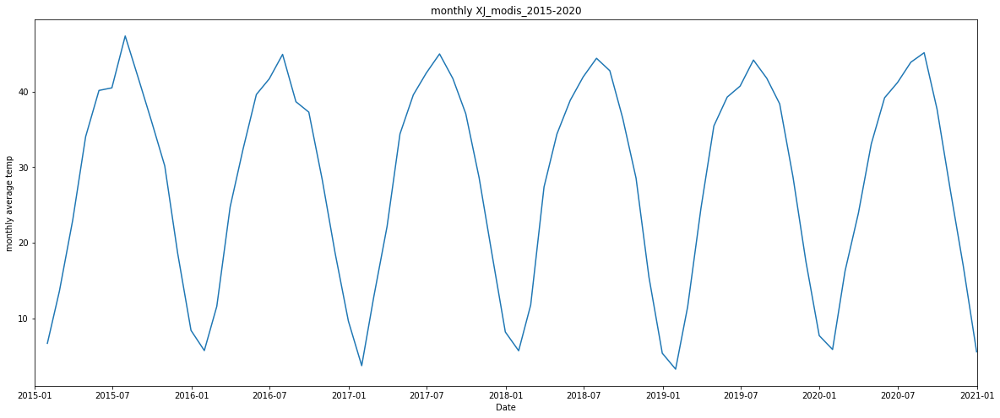

In [ ]:

fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp",
    title="monthly XJ_modis_2015-2020")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month)
plt.show()


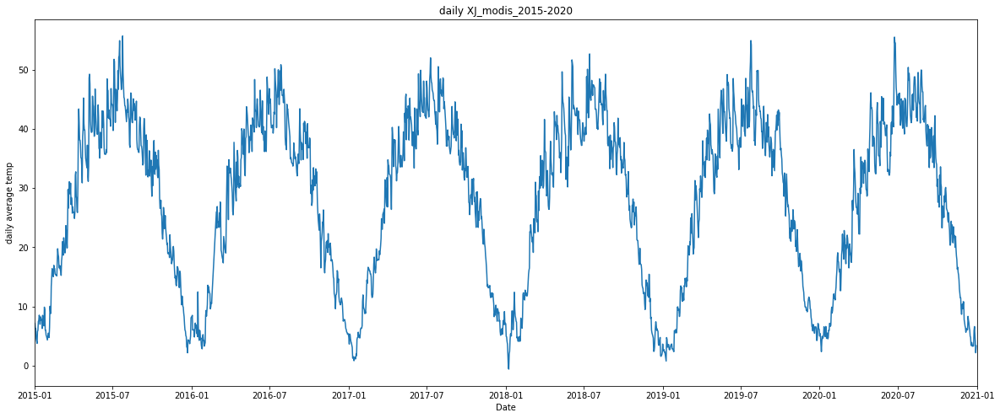

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="daily average temp",
    title="daily XJ_modis_2015-2020")
ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_MODIS['average'])
plt.show()


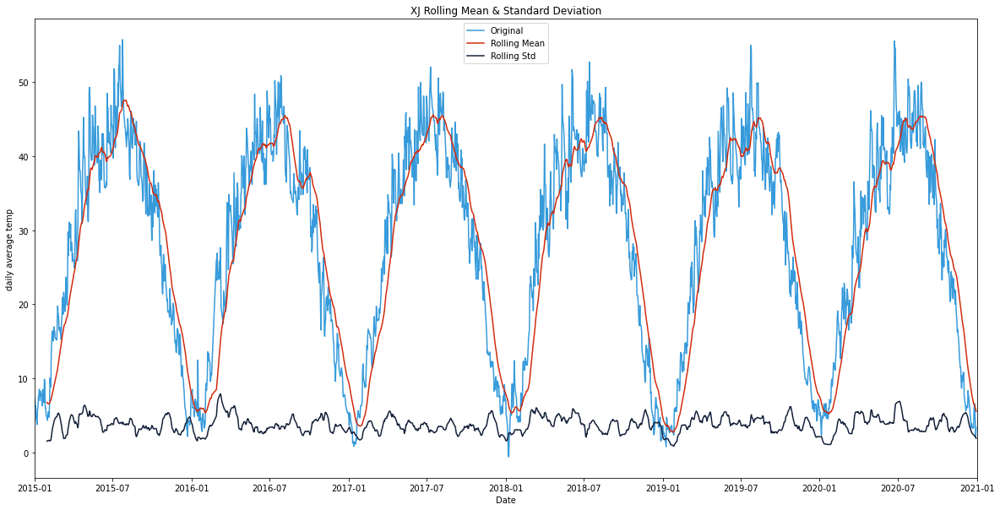

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))

XJ_MODIS["rolling_avg"] = XJ_MODIS["average"].rolling(window=30).mean() #window size 30 denotes 1 months, giving rolling mean at monthly level
XJ_MODIS["rolling_std"] = XJ_MODIS["average"].rolling(window=30).std()

# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="daily average temp")
ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_MODIS["average"], color='#379BDB', label='Original')
ax.plot(XJ_MODIS["rolling_avg"], color='#D22A0D', label='Rolling Mean')
ax.plot(XJ_MODIS["rolling_std"], color='#142039', label='Rolling Std')
ax.legend(loc='best')
plt.title('XJ Rolling Mean & Standard Deviation')
plt.show(block=False)
plt.show()

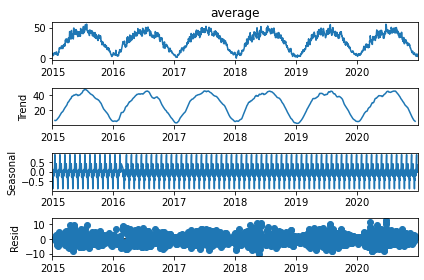

In [ ]:
XJ_Daily_deco = sm.tsa.seasonal_decompose(XJ_MODIS["average"], model='additive',period = 30)
fig = XJ_Daily_deco.plot()
plt.rcParams["figure.figsize"] = (200,20)

plt.show()

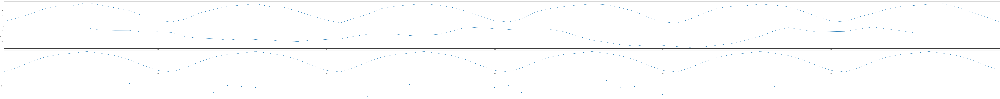

In [ ]:
XJ_Monthly_deco = sm.tsa.seasonal_decompose(XJ_Monthly_data_month, model='additive')
fig = XJ_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

Text(0, 0.5, 'Residual')

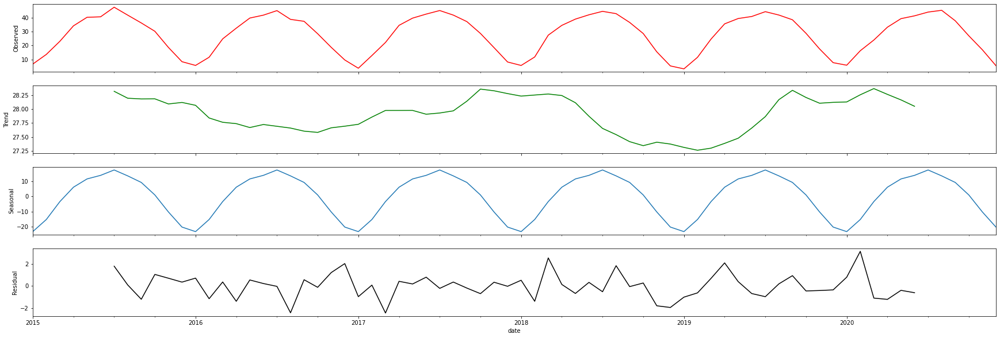

In [ ]:
fig, axes = plt.subplots(4, 1, sharex=True)
XJ_Monthly_deco.observed.plot(ax=axes[0], legend=False, color='r')
axes[0].set_ylabel('Observed')
XJ_Monthly_deco.trend.plot(ax=axes[1], legend=False, color='g')
axes[1].set_ylabel('Trend')
XJ_Monthly_deco.seasonal.plot(ax=axes[2], legend=False)
axes[2].set_ylabel('Seasonal')
XJ_Monthly_deco.resid.plot(ax=axes[3], legend=False, color='k')
axes[3].set_ylabel('Residual')

###seasonal data






In [ ]:
month = XJ_Monthly_data_month.index.month
XJ_winter = pd.concat([XJ_Monthly_data_month[month == 1], XJ_Monthly_data_month[month == 2],XJ_Monthly_data_month[month == 12]])
XJ_spring = pd.concat([XJ_Monthly_data_month[month == 3], XJ_Monthly_data_month[month == 4],XJ_Monthly_data_month[month == 5]])
XJ_summer = pd.concat([XJ_Monthly_data_month[month == 6], XJ_Monthly_data_month[month == 7],XJ_Monthly_data_month[month == 8]])
XJ_fall = pd.concat([XJ_Monthly_data_month[month == 9], XJ_Monthly_data_month[month == 10],XJ_Monthly_data_month[month == 11]])
XJ_winter.sort_index()
XJ_spring.sort_index()
XJ_summer.sort_index()
XJ_fall.sort_index()

date
2015-09-30    36.109958
2015-10-31    30.157101
2015-11-30    18.603750
2016-09-30    37.281185
2016-10-31    28.399409
2016-11-30    18.678907
2017-09-30    37.071963
2017-10-31    28.610797
2017-11-30    18.482134
2018-09-30    36.474880
2018-10-31    28.547352
2018-11-30    15.446347
2019-09-30    38.379907
2019-10-31    28.700896
2019-11-30    17.515819
2020-09-30    37.665532
2020-10-31    26.922016
2020-11-30    16.911977
Name: average, dtype: float64

## XJ_NEX_2015_2020

### XJ_NEX_UKESM1-0-LL

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1yKLtTP5vYVi13xQ_JI2a_kr8MScf6hdp/view?usp=share_link
id = "1yKLtTP5vYVi13xQ_JI2a_kr8MScf6hdp"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp585_UKESM1-0-LL.csv')

XJ_ssp585_UKESM1_0_LL = pd.read_csv('tas_XJ_daily_ssp585_UKESM1-0-LL.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_UKESM1_0_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.089478
2015-01-01,39.125,82.375,-4.188202
2015-01-01,39.125,82.625,-4.379944
2015-01-01,39.125,82.875,-4.363220
2015-01-01,39.125,83.125,-4.210785


In [ ]:
XJ_ssp585_UKESM1_0_LL

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.089478
2015-01-01,39.125,82.375,-4.188202
2015-01-01,39.125,82.625,-4.379944
2015-01-01,39.125,82.875,-4.363220
2015-01-01,39.125,83.125,-4.210785
...,...,...,...
2020-11-29,36.375,83.875,-13.978455
2020-11-29,36.375,84.125,-13.705872
2020-11-29,36.375,84.375,-12.719605


In [ ]:
XJ_ssp585_UKESM1_0_LL['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_UKESM1_0_LL_avg_temp = XJ_ssp585_UKESM1_0_LL.groupby(XJ_ssp585_UKESM1_0_LL.index)['tas'].mean()
XJ_ssp585_UKESM1_0_LL_avg_temp

time
2015-01-01   -6.890978
2015-01-02   -7.129692
2015-01-03   -7.151679
2015-01-04   -5.592279
2015-01-05   -5.250619
                ...   
2020-11-25   -3.358726
2020-11-26   -1.268776
2020-11-27   -2.937506
2020-11-28   -2.933110
2020-11-29   -4.532900
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp585_UKESM1_0_LL_monthly_avg_temp = XJ_ssp585_UKESM1_0_LL_avg_temp.resample('M').mean()
XJ_ssp585_UKESM1_0_LL_monthly_avg_temp

time
2015-01-31    -6.463169
2015-02-28    -2.394116
2015-03-31     1.858343
2015-04-30    14.236429
2015-05-31    19.294141
                ...    
2020-07-31    24.259385
2020-08-31    19.304356
2020-09-30    12.410598
2020-10-31     3.660071
2020-11-30    -3.386808
Freq: M, Name: tas, Length: 71, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1fC5bvFu6aAuSLJ5tjv_bSXbox498GyVm/view?usp=share_link
id = "1fC5bvFu6aAuSLJ5tjv_bSXbox498GyVm"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp126_UKESM1-0-LL.csv')

XJ_ssp126_UKESM1_0_LL = pd.read_csv('tas_XJ_daily_ssp126_UKESM1-0-LL.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_UKESM1_0_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.989075
2015-01-01,39.125,82.375,-4.085083
2015-01-01,39.125,82.625,-4.274109
2015-01-01,39.125,82.875,-4.254639
2015-01-01,39.125,83.125,-4.099487


In [ ]:
XJ_ssp126_UKESM1_0_LL['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_UKESM1_0_LL_avg_temp = XJ_ssp126_UKESM1_0_LL.groupby(XJ_ssp126_UKESM1_0_LL.index)['tas'].mean()
XJ_ssp126_UKESM1_0_LL_avg_temp

time
2015-01-01   -7.208204
2015-01-02   -7.472500
2015-01-03   -7.299117
2015-01-04   -5.831105
2015-01-05   -5.550660
                ...   
2020-11-25   -7.259733
2020-11-26   -7.368332
2020-11-27   -5.380819
2020-11-28   -4.787406
2020-11-29   -4.124823
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp126_UKESM1_0_LL_monthly_avg_temp = XJ_ssp126_UKESM1_0_LL_avg_temp.resample('M').mean()
XJ_ssp126_UKESM1_0_LL_monthly_avg_temp 

time
2015-01-31    -7.852654
2015-02-28    -4.177109
2015-03-31     7.818586
2015-04-30    14.349841
2015-05-31    17.499765
                ...    
2020-07-31    25.470958
2020-08-31    19.515446
2020-09-30    10.521305
2020-10-31     1.445333
2020-11-30    -4.355537
Freq: M, Name: tas, Length: 71, dtype: float64

#### compare modis with ssp585 and ssp126

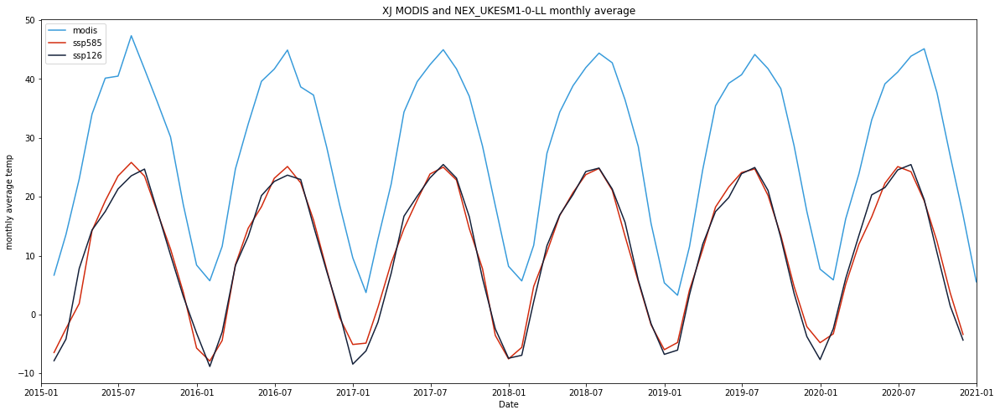

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_UKESM1_0_LL_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_UKESM1_0_LL_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_UKESM1-0-LL monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_UKESM1_0_LL_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp585_UKESM1_0_LL_monthly_avg_temp)) 
XJ_ssp585_UKESM1_0_LL_monthly_rmse

18.05905689042984

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_UKESM1_0_LL_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp126_UKESM1_0_LL_monthly_avg_temp)) 
XJ_ssp126_UKESM1_0_LL_monthly_rmse

18.242749150337364

#### time series analysis

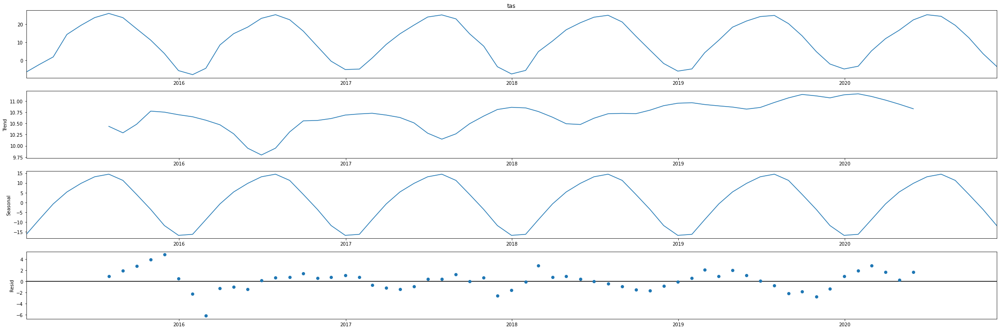

In [ ]:

XJ_ssp585_UKESM1_0_LL_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_UKESM1_0_LL_monthly_avg_temp, model='additive')
fig = XJ_ssp585_UKESM1_0_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

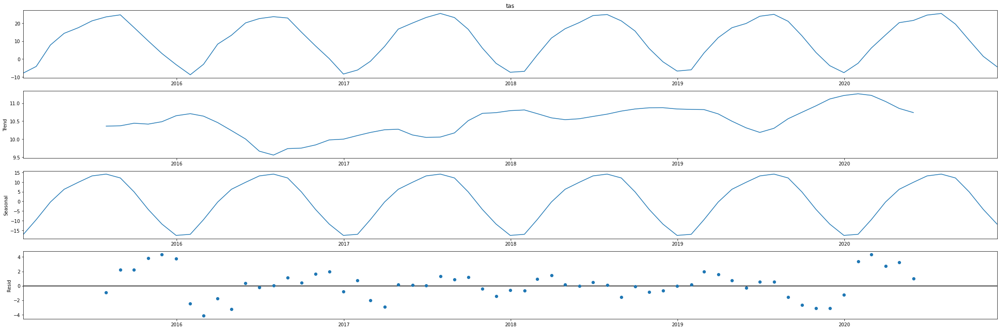

In [ ]:

XJ_ssp126_UKESM1_0_LL_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_UKESM1_0_LL_monthly_avg_temp, model='additive')
fig = XJ_ssp126_UKESM1_0_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_UKESM1_0_LL_model = LinearRegression()
x = XJ_ssp585_UKESM1_0_LL_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
XJ_ssp585_UKESM1_0_LL_model.fit(x, y)
XJ_ssp585_UKESM1_0_LL_r_squared =XJ_ssp585_UKESM1_0_LL_model.score(x, y)
XJ_ssp585_UKESM1_0_LL_r_squared

0.917528334900381

In [ ]:
XJ_ssp126_UKESM1_0_LL_model = LinearRegression()
x = XJ_ssp126_UKESM1_0_LL_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)


In [ ]:
XJ_ssp126_UKESM1_0_LL_model.fit(x, y)
XJ_ssp126_UKESM1_0_LL_r_squared = XJ_ssp126_UKESM1_0_LL_model.score(x, y)
XJ_ssp126_UKESM1_0_LL_r_squared

0.9121475863623731

#### seasonal analysis

In [ ]:
month = XJ_ssp585_UKESM1_0_LL_monthly_avg_temp.index.month
XJ_ssp585_UKESM1_0_LL_winter = pd.concat([XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 1], XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 2],XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 12]])
XJ_ssp585_UKESM1_0_LL_spring = pd.concat([XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 3], XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 4],XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 5]])
XJ_ssp585_UKESM1_0_LL_summer = pd.concat([XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 6], XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 7],XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 8]])
XJ_ssp585_UKESM1_0_LL_fall = pd.concat([XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 9], XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 10],XJ_ssp585_UKESM1_0_LL_monthly_avg_temp[month == 11]])
XJ_ssp585_UKESM1_0_LL_winter.sort_index()
XJ_ssp585_UKESM1_0_LL_spring.sort_index()
XJ_ssp585_UKESM1_0_LL_summer.sort_index()
XJ_ssp585_UKESM1_0_LL_fall.sort_index()

time
2015-09-30    17.372943
2015-10-31    11.114178
2015-11-30     3.732435
2016-09-30    16.062677
2016-10-31     7.617810
2016-11-30    -0.502031
2017-09-30    14.603987
2017-10-31     7.780471
2017-11-30    -3.556315
2018-09-30    13.298146
2018-10-31     5.593486
2018-11-30    -1.767209
2019-09-30    13.455826
2019-10-31     4.796159
2019-11-30    -2.065163
2020-09-30    12.410598
2020-10-31     3.660071
2020-11-30    -3.386808
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_UKESM1_0_LL_monthly_avg_temp.index.month
XJ_ssp126_UKESM1_0_LL_winter = pd.concat([XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 1], XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 2],XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 12]])
XJ_ssp126_UKESM1_0_LL_spring = pd.concat([XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 3], XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 4],XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 5]])
XJ_ssp126_UKESM1_0_LL_summer = pd.concat([XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 6], XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 7],XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 8]])
XJ_ssp126_UKESM1_0_LL_fall = pd.concat([XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 9], XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 10],XJ_ssp126_UKESM1_0_LL_monthly_avg_temp[month == 11]])
XJ_ssp126_UKESM1_0_LL_winter.sort_index()
XJ_ssp126_UKESM1_0_LL_spring.sort_index()
XJ_ssp126_UKESM1_0_LL_summer.sort_index()
XJ_ssp126_UKESM1_0_LL_fall.sort_index()

time
2015-09-30    17.594481
2015-10-31    10.099701
2015-11-30     3.057365
2016-09-30    15.059238
2016-10-31     7.307245
2016-11-30     0.199142
2017-09-30    16.618351
2017-10-31     6.114571
2017-11-30    -2.445367
2018-09-30    15.659169
2018-10-31     5.853068
2018-11-30    -1.562715
2019-09-30    13.024154
2019-10-31     3.607560
2019-11-30    -3.746725
2020-09-30    10.521305
2020-10-31     1.445333
2020-11-30    -4.355537
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_UKESM1_0_LL_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5080100983785021
coef:  [[0.59692564]]
intercept:  [11.10079345]


In [ ]:
x = XJ_ssp126_UKESM1_0_LL_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8237585687187617
coef:  [[1.25995542]]
intercept:  [13.04640919]


In [ ]:
x = XJ_ssp126_UKESM1_0_LL_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.02119491982147903
coef:  [[0.18426565]]
intercept:  [38.47203165]


In [ ]:
x = XJ_ssp126_UKESM1_0_LL_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8690388727374472
coef:  [[1.05782454]]
intercept:  [21.073038]


#####ssp585

In [ ]:
x = XJ_ssp585_UKESM1_0_LL_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5227428209633509
coef:  [[0.62913261]]
intercept:  [10.67520021]


In [ ]:
x = XJ_ssp585_UKESM1_0_LL_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8381980480376855
coef:  [[1.11092074]]
intercept:  [15.92986346]


In [ ]:
x = XJ_ssp585_UKESM1_0_LL_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.0729943255210449
coef:  [[0.3223836]]
intercept:  [35.20730658]


In [ ]:
x = XJ_ssp585_UKESM1_0_LL_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9036297724085997
coef:  [[1.12336305]]
intercept:  [20.27265604]


### XJ_NEX_TaiESM1

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1xEPsRE65pRA42gaZfVn4OExrNxpgx17f/view?usp=share_link
id = "1xEPsRE65pRA42gaZfVn4OExrNxpgx17f"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp585_TaiESM1.csv')

XJ_ssp585_TaiESM1 = pd.read_csv('tas_XJ_daily_ssp585_TaiESM1.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_TaiESM1.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.114258
2015-01-01,39.125,82.375,-4.150055
2015-01-01,39.125,82.625,-4.510956
2015-01-01,39.125,82.875,-4.895416
2015-01-01,39.125,83.125,-5.144226


In [ ]:
XJ_ssp585_TaiESM1

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.114258
2015-01-01,39.125,82.375,-4.150055
2015-01-01,39.125,82.625,-4.510956
2015-01-01,39.125,82.875,-4.895416
2015-01-01,39.125,83.125,-5.144226
...,...,...,...
2020-12-29,36.375,83.875,-21.352692
2020-12-29,36.375,84.125,-21.015106
2020-12-29,36.375,84.375,-19.962845


In [ ]:
XJ_ssp585_TaiESM1['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_TaiESM1_avg_temp = XJ_ssp585_TaiESM1.groupby(XJ_ssp585_TaiESM1.index)['tas'].mean()
XJ_ssp585_TaiESM1_avg_temp

time
2015-01-01    -9.001187
2015-01-02    -8.873034
2015-01-03    -8.289733
2015-01-04    -7.138143
2015-01-05    -7.695602
                ...    
2020-12-25    -9.844542
2020-12-26   -11.431503
2020-12-27   -12.687042
2020-12-28   -11.954047
2020-12-29    -8.797532
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_TaiESM1_monthly_avg_temp = XJ_ssp585_TaiESM1_avg_temp.resample('M').mean()
XJ_ssp585_TaiESM1_monthly_avg_temp

time
2015-01-31   -10.414120
2015-02-28   -11.201144
2015-03-31     1.092951
2015-04-30    12.412684
2015-05-31    20.411147
                ...    
2020-08-31    26.155529
2020-09-30    19.344808
2020-10-31     8.451346
2020-11-30    -1.954335
2020-12-31    -9.852682
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/160zeh_4ZiyXSiXj4CiQ7gbdbe9_ZmHWz/view?usp=share_link
id = "160zeh_4ZiyXSiXj4CiQ7gbdbe9_ZmHWz"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp126_TaiESM1.csv')

XJ_ssp126_TaiESM1 = pd.read_csv('tas_XJ_daily_ssp126_TaiESM1.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_TaiESM1.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-5.396423
2015-01-01,39.125,82.375,-5.489197
2015-01-01,39.125,82.625,-5.792725
2015-01-01,39.125,82.875,-6.005554
2015-01-01,39.125,83.125,-6.082703


In [ ]:
XJ_ssp126_TaiESM1['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_TaiESM1_avg_temp = XJ_ssp126_TaiESM1.groupby(XJ_ssp126_TaiESM1.index)['tas'].mean()
XJ_ssp126_TaiESM1_avg_temp

time
2015-01-01    -6.797214
2015-01-02    -8.429619
2015-01-03    -9.366028
2015-01-04   -10.387650
2015-01-05    -8.001482
                ...    
2020-12-25   -11.352423
2020-12-26   -11.196534
2020-12-27   -11.449242
2020-12-28   -10.366411
2020-12-29   -11.217887
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_TaiESM1_monthly_avg_temp = XJ_ssp126_TaiESM1_avg_temp.resample('M').mean()
XJ_ssp126_TaiESM1_monthly_avg_temp 

time
2015-01-31    -9.665998
2015-02-28    -8.886096
2015-03-31     1.315470
2015-04-30    12.116955
2015-05-31    14.379801
                ...    
2020-08-31    26.278349
2020-09-30    18.540622
2020-10-31    11.074442
2020-11-30    -0.361225
2020-12-31    -7.913121
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

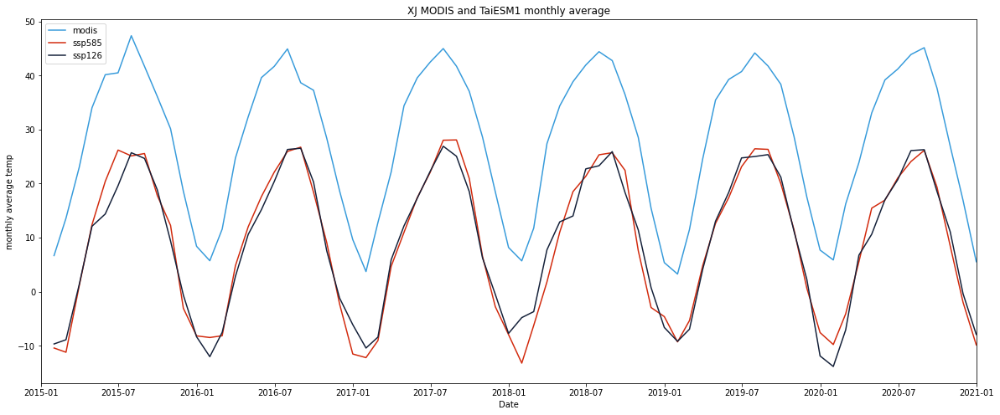

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_TaiESM1_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_TaiESM1_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and TaiESM1 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_TaiESM1_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_TaiESM1_monthly_avg_temp)) 
XJ_ssp585_TaiESM1_monthly_rmse

18.98007721505576

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_TaiESM1_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_TaiESM1_monthly_avg_temp)) 
XJ_ssp126_TaiESM1_monthly_rmse

19.054504435679952

#### time series analysis

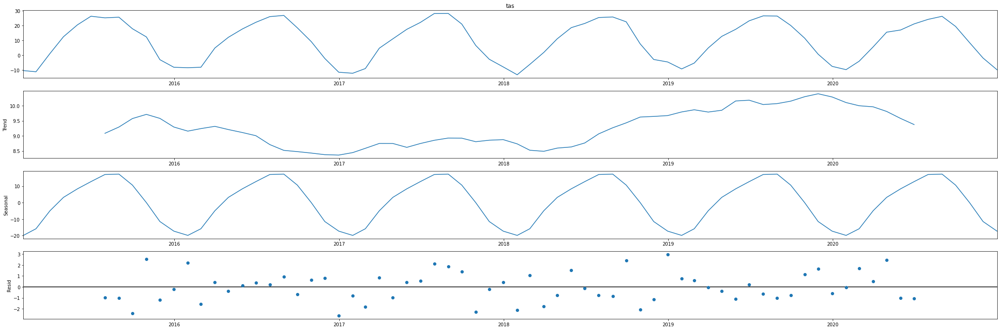

In [ ]:

XJ_ssp585_TaiESM1_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_TaiESM1_monthly_avg_temp, model='additive')
fig = XJ_ssp585_TaiESM1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

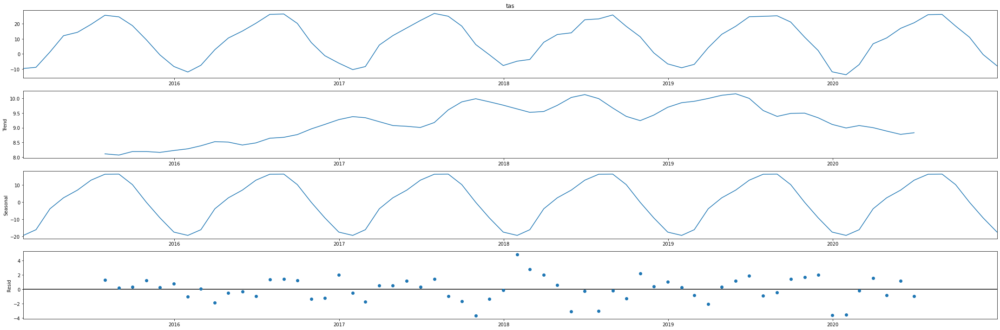

In [ ]:

XJ_ssp126_TaiESM1_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_TaiESM1_monthly_avg_temp, model='additive')
fig = XJ_ssp126_TaiESM1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_TaiESM1_model = LinearRegression()
x = XJ_ssp585_TaiESM1_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_TaiESM1_model.fit(x, y)
XJ_ssp585_TaiESM1_r_squared =XJ_ssp585_TaiESM1_model.score(x, y)
XJ_ssp585_TaiESM1_r_squared

0.9516634226261205

In [ ]:
XJ_ssp126_TaiESM1_model = LinearRegression()
x = XJ_ssp126_TaiESM1_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_TaiESM1_model.fit(x, y)
XJ_ssp126_TaiESM1_r_squared = XJ_ssp126_TaiESM1_model.score(x, y)
XJ_ssp126_TaiESM1_r_squared

0.9493179438495325

#### seasonal analysis

In [ ]:
month = XJ_ssp585_TaiESM1_monthly_avg_temp.index.month
XJ_ssp585_TaiESM1_winter = pd.concat([XJ_ssp585_TaiESM1_monthly_avg_temp[month == 1], XJ_ssp585_TaiESM1_monthly_avg_temp[month == 2],XJ_ssp585_TaiESM1_monthly_avg_temp[month == 12]])
XJ_ssp585_TaiESM1_spring = pd.concat([XJ_ssp585_TaiESM1_monthly_avg_temp[month == 3], XJ_ssp585_TaiESM1_monthly_avg_temp[month == 4],XJ_ssp585_TaiESM1_monthly_avg_temp[month == 5]])
XJ_ssp585_TaiESM1_summer = pd.concat([XJ_ssp585_TaiESM1_monthly_avg_temp[month == 6], XJ_ssp585_TaiESM1_monthly_avg_temp[month == 7],XJ_ssp585_TaiESM1_monthly_avg_temp[month == 8]])
XJ_ssp585_TaiESM1_fall = pd.concat([XJ_ssp585_TaiESM1_monthly_avg_temp[month == 9], XJ_ssp585_TaiESM1_monthly_avg_temp[month == 10],XJ_ssp585_TaiESM1_monthly_avg_temp[month == 11]])
XJ_ssp585_TaiESM1_winter.sort_index()
XJ_ssp585_TaiESM1_spring.sort_index()
XJ_ssp585_TaiESM1_summer.sort_index()
XJ_ssp585_TaiESM1_fall.sort_index()

time
2015-09-30    17.791316
2015-10-31    12.275953
2015-11-30    -3.060692
2016-09-30    18.411446
2016-10-31     9.090903
2016-11-30    -2.234208
2017-09-30    20.945874
2017-10-31     6.536296
2017-11-30    -2.770051
2018-09-30    22.450783
2018-10-31     7.590810
2018-11-30    -2.923935
2019-09-30    20.018273
2019-10-31    11.451324
2019-11-30     0.630616
2020-09-30    19.344808
2020-10-31     8.451346
2020-11-30    -1.954335
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_TaiESM1_monthly_avg_temp.index.month
XJ_ssp126_TaiESM1_winter = pd.concat([XJ_ssp126_TaiESM1_monthly_avg_temp[month == 1], XJ_ssp126_TaiESM1_monthly_avg_temp[month == 2],XJ_ssp126_TaiESM1_monthly_avg_temp[month == 12]])
XJ_ssp126_TaiESM1_spring = pd.concat([XJ_ssp126_TaiESM1_monthly_avg_temp[month == 3], XJ_ssp126_TaiESM1_monthly_avg_temp[month == 4],XJ_ssp126_TaiESM1_monthly_avg_temp[month == 5]])
XJ_ssp126_TaiESM1_summer = pd.concat([XJ_ssp126_TaiESM1_monthly_avg_temp[month == 6], XJ_ssp126_TaiESM1_monthly_avg_temp[month == 7],XJ_ssp126_TaiESM1_monthly_avg_temp[month == 8]])
XJ_ssp126_TaiESM1_fall = pd.concat([XJ_ssp126_TaiESM1_monthly_avg_temp[month == 9], XJ_ssp126_TaiESM1_monthly_avg_temp[month == 10],XJ_ssp126_TaiESM1_monthly_avg_temp[month == 11]])
XJ_ssp126_TaiESM1_winter.sort_index()
XJ_ssp126_TaiESM1_spring.sort_index()
XJ_ssp126_TaiESM1_summer.sort_index()
XJ_ssp126_TaiESM1_fall.sort_index()

time
2015-09-30    18.836571
2015-10-31     9.388949
2015-11-30    -0.623151
2016-09-30    20.305853
2016-10-31     7.561068
2016-11-30    -1.152567
2017-09-30    18.516849
2017-10-31     6.252772
2017-11-30    -0.496986
2018-09-30    18.350094
2018-10-31    11.422965
2018-11-30     0.759937
2019-09-30    21.210300
2019-10-31    11.155157
2019-11-30     2.273313
2020-09-30    18.540622
2020-10-31    11.074442
2020-11-30    -0.361225
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_TaiESM1_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.13586205505931692
coef:  [[0.53192751]]
intercept:  [12.98154121]


In [ ]:
x = XJ_ssp126_TaiESM1_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9020223702446981
coef:  [[1.22135478]]
intercept:  [19.23320658]


In [ ]:
x = XJ_ssp126_TaiESM1_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.160590534130155
coef:  [[0.37230709]]
intercept:  [33.72683112]


In [ ]:
x = XJ_ssp126_TaiESM1_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9417280981450573
coef:  [[0.97988122]]
intercept:  [18.35699001]


#####ssp585

In [ ]:
x = XJ_ssp585_TaiESM1_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.16733798164649705
coef:  [[0.59013399]]
intercept:  [13.66995585]


In [ ]:
x = XJ_ssp585_TaiESM1_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8938736865908999
coef:  [[0.99579769]]
intercept:  [21.19092583]


In [ ]:
x = XJ_ssp585_TaiESM1_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.04005906527582026
coef:  [[0.19436761]]
intercept:  [37.92531128]


In [ ]:
x = XJ_ssp585_TaiESM1_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9599834384116421
coef:  [[0.86942602]]
intercept:  [19.94847029]


### XJ_NEX_NorESM2-MM

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1GOhuE_hIBz96g3f6W0YBkDwLndgoZYCk/view?usp=share_link
id = "1GOhuE_hIBz96g3f6W0YBkDwLndgoZYCk"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp585_NorESM2-MM.csv')

XJ_ssp585_NorESM2_MM = pd.read_csv('tas_XJ_daily_ssp585_NorESM2-MM.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_NorESM2_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.911285
2015-01-01,39.125,82.375,-5.562134
2015-01-01,39.125,82.625,-6.178406
2015-01-01,39.125,82.875,-6.458557
2015-01-01,39.125,83.125,-6.603088


In [ ]:
XJ_ssp585_NorESM2_MM

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.911285
2015-01-01,39.125,82.375,-5.562134
2015-01-01,39.125,82.625,-6.178406
2015-01-01,39.125,82.875,-6.458557
2015-01-01,39.125,83.125,-6.603088
...,...,...,...
2020-12-29,36.375,83.875,-17.045227
2020-12-29,36.375,84.125,-16.758850
2020-12-29,36.375,84.375,-15.757812


In [ ]:
XJ_ssp585_NorESM2_MM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_NorESM2_MM_avg_temp = XJ_ssp585_NorESM2_MM.groupby(XJ_ssp585_NorESM2_MM.index)['tas'].mean()
XJ_ssp585_NorESM2_MM_avg_temp

time
2015-01-01    -7.262633
2015-01-02    -8.156884
2015-01-03    -9.131798
2015-01-04    -7.776178
2015-01-05    -3.787892
                ...    
2020-12-25   -10.109825
2020-12-26   -10.084268
2020-12-27    -8.839876
2020-12-28    -7.375587
2020-12-29    -8.173682
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_NorESM2_MM_monthly_avg_temp = XJ_ssp585_NorESM2_MM_avg_temp.resample('M').mean()
XJ_ssp585_NorESM2_MM_monthly_avg_temp

time
2015-01-31    -8.709149
2015-02-28    -4.919224
2015-03-31     4.435984
2015-04-30    13.152501
2015-05-31    18.886928
                ...    
2020-08-31    23.449721
2020-09-30    18.822040
2020-10-31     9.812907
2020-11-30     2.698168
2020-12-31    -6.869237
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1oB0LLj3D6MDnUjufwNOaYALIwh1nn7K3/view?usp=share_link
id = "1oB0LLj3D6MDnUjufwNOaYALIwh1nn7K3"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp126_NorESM2-MM.csv')

XJ_ssp126_NorESM2_MM = pd.read_csv('tas_XJ_daily_ssp126_NorESM2-MM.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_NorESM2_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.872131
2015-01-01,39.125,82.375,-5.493408
2015-01-01,39.125,82.625,-6.103790
2015-01-01,39.125,82.875,-6.401703
2015-01-01,39.125,83.125,-6.563965


In [ ]:
XJ_ssp126_NorESM2_MM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_NorESM2_MM_avg_temp = XJ_ssp126_NorESM2_MM.groupby(XJ_ssp126_NorESM2_MM.index)['tas'].mean()
XJ_ssp126_NorESM2_MM_avg_temp

time
2015-01-01   -7.238677
2015-01-02   -8.178968
2015-01-03   -9.129242
2015-01-04   -7.876508
2015-01-05   -3.893555
                ...   
2020-12-25   -5.530059
2020-12-26   -4.141046
2020-12-27   -4.075299
2020-12-28   -6.081597
2020-12-29   -7.129231
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_NorESM2_MM_monthly_avg_temp = XJ_ssp126_NorESM2_MM_avg_temp.resample('M').mean()
XJ_ssp126_NorESM2_MM_monthly_avg_temp 

time
2015-01-31    -8.562094
2015-02-28    -3.919655
2015-03-31     5.015255
2015-04-30    13.782373
2015-05-31    17.500633
                ...    
2020-08-31    22.828744
2020-09-30    17.516247
2020-10-31    10.504550
2020-11-30     3.359457
2020-12-31    -4.558141
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

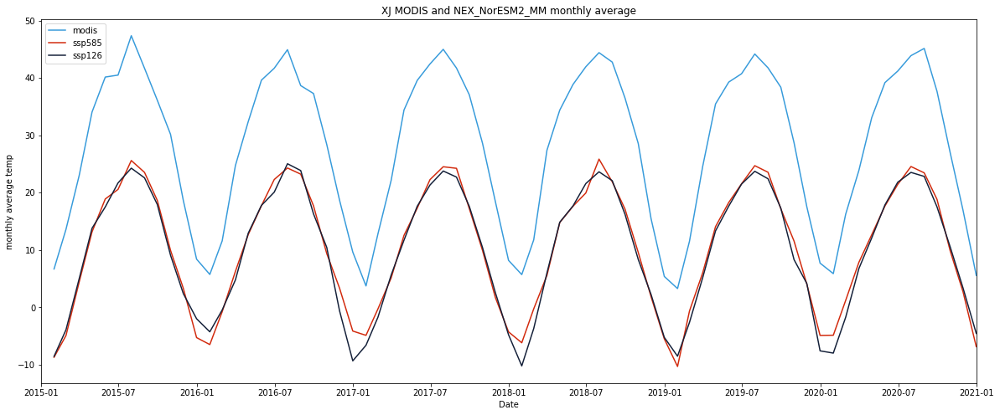

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_NorESM2_MM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_NorESM2_MM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_NorESM2_MM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_NorESM2_MM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_NorESM2_MM_monthly_avg_temp)) 
XJ_ssp585_NorESM2_MM_monthly_rmse

17.893952080056465

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_NorESM2_MM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_NorESM2_MM_monthly_avg_temp)) 
XJ_ssp126_NorESM2_MM_monthly_rmse

18.432760814053985

#### time series analysis

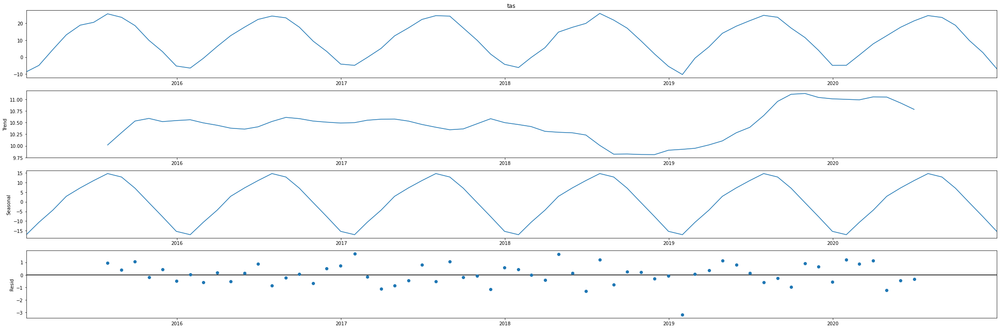

In [ ]:

XJ_ssp585_NorESM2_MM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_NorESM2_MM_monthly_avg_temp, model='additive')
fig = XJ_ssp585_NorESM2_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

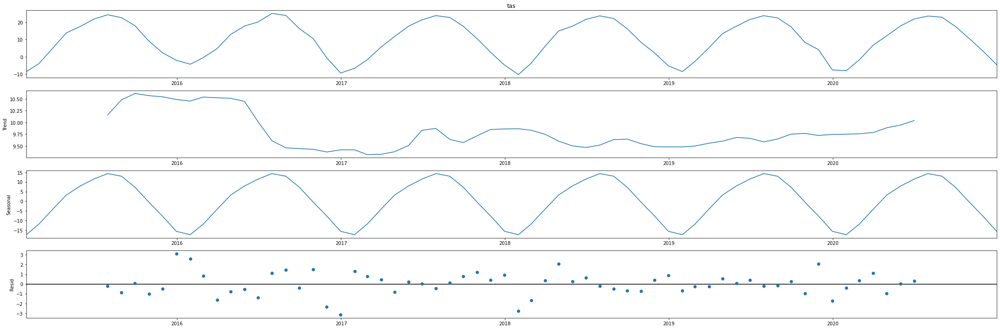

In [ ]:

XJ_ssp126_NorESM2_MM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_NorESM2_MM_monthly_avg_temp, model='additive')
fig = XJ_ssp126_NorESM2_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_NorESM2_MM_model = LinearRegression()
x = XJ_ssp585_NorESM2_MM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_NorESM2_MM_model.fit(x, y)
XJ_ssp585_NorESM2_MM_r_squared =XJ_ssp585_NorESM2_MM_model.score(x, y)
XJ_ssp585_NorESM2_MM_r_squared

0.974959425945803

In [ ]:
XJ_ssp126_NorESM2_MM_model = LinearRegression()
x = XJ_ssp126_NorESM2_MM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_NorESM2_MM_model.fit(x, y)
XJ_ssp126_NorESM2_MM_r_squared = XJ_ssp126_NorESM2_MM_model.score(x, y)
XJ_ssp126_NorESM2_MM_r_squared

0.968756439537614

#### seasonal analysis

In [ ]:
month = XJ_ssp585_NorESM2_MM_monthly_avg_temp.index.month
XJ_ssp585_NorESM2_MM_winter = pd.concat([XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 1], XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 2],XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 12]])
XJ_ssp585_NorESM2_MM_spring = pd.concat([XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 3], XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 4],XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 5]])
XJ_ssp585_NorESM2_MM_summer = pd.concat([XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 6], XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 7],XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 8]])
XJ_ssp585_NorESM2_MM_fall = pd.concat([XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 9], XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 10],XJ_ssp585_NorESM2_MM_monthly_avg_temp[month == 11]])
XJ_ssp585_NorESM2_MM_winter.sort_index()
XJ_ssp585_NorESM2_MM_spring.sort_index()
XJ_ssp585_NorESM2_MM_summer.sort_index()
XJ_ssp585_NorESM2_MM_fall.sort_index()

time
2015-09-30    18.633935
2015-10-31     9.924630
2015-11-30     3.286514
2016-09-30    17.690963
2016-10-31     9.378974
2016-11-30     3.338212
2017-09-30    17.217289
2017-10-31     9.923449
2017-11-30     1.741161
2018-09-30    17.110529
2018-10-31     9.556206
2018-11-30     1.825637
2019-09-30    17.187135
2019-10-31    11.551249
2019-11-30     4.020523
2020-09-30    18.822040
2020-10-31     9.812907
2020-11-30     2.698168
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_NorESM2_MM_monthly_avg_temp.index.month
XJ_ssp126_NorESM2_MM_winter = pd.concat([XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 1], XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 2],XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 12]])
XJ_ssp126_NorESM2_MM_spring = pd.concat([XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 3], XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 4],XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 5]])
XJ_ssp126_NorESM2_MM_summer = pd.concat([XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 6], XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 7],XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 8]])
XJ_ssp126_NorESM2_MM_fall = pd.concat([XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 9], XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 10],XJ_ssp126_NorESM2_MM_monthly_avg_temp[month == 11]])
XJ_ssp126_NorESM2_MM_winter.sort_index()
XJ_ssp126_NorESM2_MM_spring.sort_index()
XJ_ssp126_NorESM2_MM_summer.sort_index()
XJ_ssp126_NorESM2_MM_fall.sort_index()

time
2015-09-30    17.927857
2015-10-31     9.073432
2015-11-30     2.377442
2016-09-30    16.293810
2016-10-31    10.455111
2016-11-30    -0.608192
2017-09-30    17.609417
2017-10-31    10.424330
2017-11-30     2.589280
2018-09-30    16.211012
2018-10-31     8.336292
2018-11-30     2.229056
2019-09-30    17.289982
2019-10-31     8.316484
2019-11-30     4.140997
2020-09-30    17.516247
2020-10-31    10.504550
2020-11-30     3.359457
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_NorESM2_MM_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.41840759770607194
coef:  [[0.80420912]]
intercept:  [12.71516771]


In [ ]:
x = XJ_ssp126_NorESM2_MM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9567459502030828
coef:  [[1.23308749]]
intercept:  [17.62364848]


In [ ]:
x = XJ_ssp126_NorESM2_MM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3024624024850805
coef:  [[0.92864645]]
intercept:  [21.70803643]


In [ ]:
x = XJ_ssp126_NorESM2_MM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9342918122351731
coef:  [[1.26948708]]
intercept:  [15.50055928]


#####ssp585

In [ ]:
x = XJ_ssp585_NorESM2_MM_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6751901392520491
coef:  [[0.97588504]]
intercept:  [12.75595811]


In [ ]:
x = XJ_ssp585_NorESM2_MM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9599460061687884
coef:  [[1.24052566]]
intercept:  [17.22294706]


In [ ]:
x = XJ_ssp585_NorESM2_MM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4181269271128243
coef:  [[0.81377582]]
intercept:  [23.90761726]


In [ ]:
x = XJ_ssp585_NorESM2_MM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9679576301962438
coef:  [[1.28877568]]
intercept:  [14.62148237]


### XJ_NEX_INM-CM4-8

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1HuKBRdl_BY9ugWax-Lc3rKVnNc-ad74t/view?usp=share_link
id = "1HuKBRdl_BY9ugWax-Lc3rKVnNc-ad74t"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp585_INM-CM4-8.csv.csv')

XJ_ssp585_INM_CM4_8 = pd.read_csv('tas_XJ_daily_ssp585_INM-CM4-8.csv.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_INM_CM4_8.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-5.973084
2015-01-01,39.125,82.375,-6.157318
2015-01-01,39.125,82.625,-6.434570
2015-01-01,39.125,82.875,-6.503326
2015-01-01,39.125,83.125,-6.436401


In [ ]:
XJ_ssp585_INM_CM4_8

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-5.973084
2015-01-01,39.125,82.375,-6.157318
2015-01-01,39.125,82.625,-6.434570
2015-01-01,39.125,82.875,-6.503326
2015-01-01,39.125,83.125,-6.436401
...,...,...,...
2020-12-29,36.375,83.875,-16.092010
2020-12-29,36.375,84.125,-16.268860
2020-12-29,36.375,84.375,-15.633667


In [ ]:
XJ_ssp585_INM_CM4_8['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_INM_CM4_8_avg_temp = XJ_ssp585_INM_CM4_8.groupby(XJ_ssp585_INM_CM4_8.index)['tas'].mean()
XJ_ssp585_INM_CM4_8_avg_temp

time
2015-01-01    -9.110217
2015-01-02   -10.830083
2015-01-03   -10.875924
2015-01-04    -8.685725
2015-01-05    -8.776609
                ...    
2020-12-25    -8.044274
2020-12-26    -7.240303
2020-12-27    -4.587244
2020-12-28    -5.590393
2020-12-29    -6.881223
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_INM_CM4_8_monthly_avg_temp = XJ_ssp585_INM_CM4_8_avg_temp.resample('M').mean()
XJ_ssp585_INM_CM4_8_monthly_avg_temp

time
2015-01-31    -8.291489
2015-02-28    -5.390500
2015-03-31     1.951727
2015-04-30    13.769699
2015-05-31    16.587791
                ...    
2020-08-31    22.996733
2020-09-30    17.817938
2020-10-31     7.840573
2020-11-30     0.150842
2020-12-31    -2.924742
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1wV8bpsV6GUDI93a4tk4wPW1XiQBaMYE8/view?usp=share_link
id = "1wV8bpsV6GUDI93a4tk4wPW1XiQBaMYE8"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp126_INM-CM4-8.csv')

XJ_ssp126_INM_CM4_8 = pd.read_csv('tas_XJ_daily_ssp126_INM-CM4-8.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_INM_CM4_8.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-5.966675
2015-01-01,39.125,82.375,-6.136597
2015-01-01,39.125,82.625,-6.399597
2015-01-01,39.125,82.875,-6.454040
2015-01-01,39.125,83.125,-6.372833


In [ ]:
XJ_ssp126_INM_CM4_8['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_INM_CM4_8_avg_temp = XJ_ssp126_INM_CM4_8.groupby(XJ_ssp126_INM_CM4_8.index)['tas'].mean()
XJ_ssp126_INM_CM4_8_avg_temp

time
2015-01-01    -9.096256
2015-01-02   -10.708774
2015-01-03   -10.861858
2015-01-04    -8.600289
2015-01-05    -8.795255
                ...    
2020-12-25    -6.911648
2020-12-26    -5.405146
2020-12-27    -5.214302
2020-12-28    -6.519763
2020-12-29    -6.655620
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_INM_CM4_8_monthly_avg_temp = XJ_ssp126_INM_CM4_8_avg_temp.resample('M').mean()
XJ_ssp126_INM_CM4_8_monthly_avg_temp 

time
2015-01-31    -7.975937
2015-02-28    -4.614198
2015-03-31     4.332056
2015-04-30    14.386688
2015-05-31    17.124275
                ...    
2020-08-31    21.842470
2020-09-30    17.286514
2020-10-31     9.948571
2020-11-30     1.247942
2020-12-31    -5.929854
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

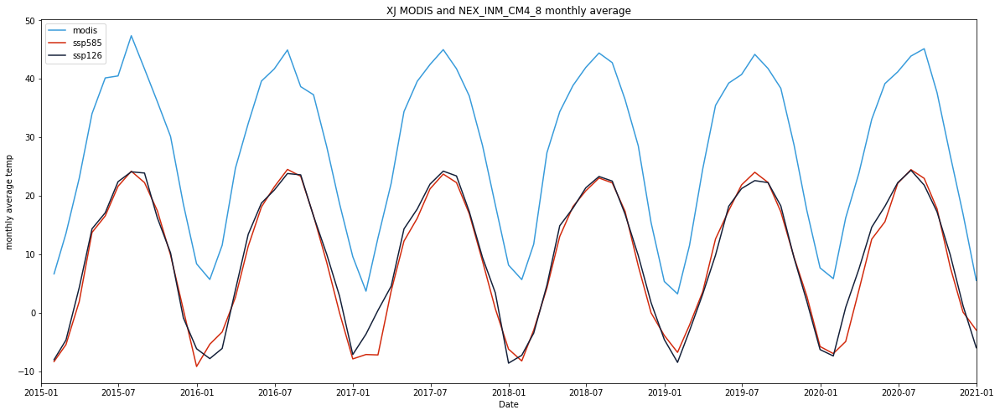

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_INM_CM4_8_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_INM_CM4_8_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_INM_CM4_8 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_INM_CM4_8_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_INM_CM4_8_monthly_avg_temp)) 
XJ_ssp585_INM_CM4_8_monthly_rmse

19.01836483431705

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_INM_CM4_8_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_INM_CM4_8_monthly_avg_temp)) 
XJ_ssp126_INM_CM4_8_monthly_rmse

18.449175691104504

#### time series analysis

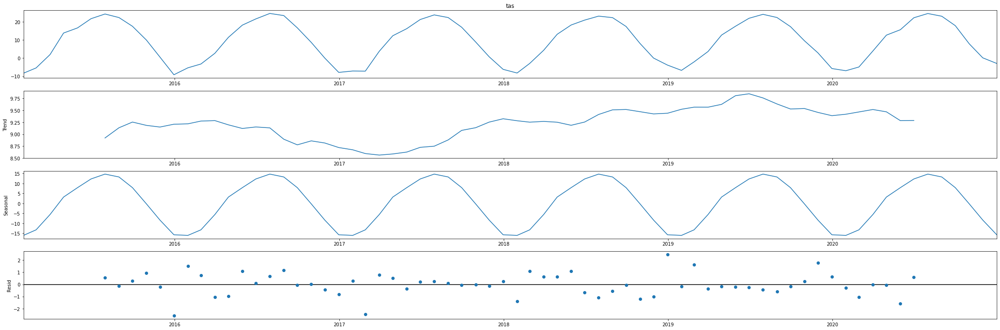

In [ ]:

XJ_ssp585_INM_CM4_8_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_INM_CM4_8_monthly_avg_temp, model='additive')
fig = XJ_ssp585_INM_CM4_8_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

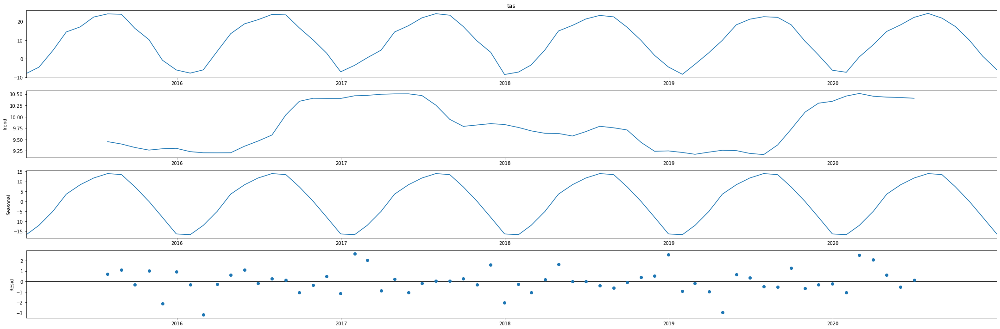

In [ ]:

XJ_ssp126_INM_CM4_8_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_INM_CM4_8_monthly_avg_temp, model='additive')
fig = XJ_ssp126_INM_CM4_8_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_INM_CM4_8_model = LinearRegression()
x = XJ_ssp585_INM_CM4_8_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_INM_CM4_8_model.fit(x, y)
XJ_ssp585_INM_CM4_8_r_squared =XJ_ssp585_INM_CM4_8_model.score(x, y)
XJ_ssp585_INM_CM4_8_r_squared

0.9596289729078855

In [ ]:
XJ_ssp126_INM_CM4_8_model = LinearRegression()
x = XJ_ssp126_INM_CM4_8_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_INM_CM4_8_model.fit(x, y)
XJ_ssp126_INM_CM4_8_r_squared = XJ_ssp126_INM_CM4_8_model.score(x, y)
XJ_ssp126_INM_CM4_8_r_squared

0.9681569286556286

#### seasonal analysis

In [ ]:
month = XJ_ssp585_INM_CM4_8_monthly_avg_temp.index.month
XJ_ssp585_INM_CM4_8_winter = pd.concat([XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 1], XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 2],XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 12]])
XJ_ssp585_INM_CM4_8_spring = pd.concat([XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 3], XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 4],XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 5]])
XJ_ssp585_INM_CM4_8_summer = pd.concat([XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 6], XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 7],XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 8]])
XJ_ssp585_INM_CM4_8_fall = pd.concat([XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 9], XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 10],XJ_ssp585_INM_CM4_8_monthly_avg_temp[month == 11]])
XJ_ssp585_INM_CM4_8_winter.sort_index()
XJ_ssp585_INM_CM4_8_spring.sort_index()
XJ_ssp585_INM_CM4_8_summer.sort_index()
XJ_ssp585_INM_CM4_8_fall.sort_index()

time
2015-09-30    17.474535
2015-10-31     9.902073
2015-11-30     0.568311
2016-09-30    16.625192
2016-10-31     8.625378
2016-11-30     0.026433
2017-09-30    16.946111
2017-10-31     8.864998
2017-11-30     0.733565
2018-09-30    17.372882
2018-10-31     8.034055
2018-11-30     0.026930
2019-09-30    17.288257
2019-10-31     9.530989
2019-11-30     2.879620
2020-09-30    17.817938
2020-10-31     7.840573
2020-11-30     0.150842
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_INM_CM4_8_monthly_avg_temp.index.month
XJ_ssp126_INM_CM4_8_winter = pd.concat([XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 1], XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 2],XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 12]])
XJ_ssp126_INM_CM4_8_spring = pd.concat([XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 3], XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 4],XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 5]])
XJ_ssp126_INM_CM4_8_summer = pd.concat([XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 6], XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 7],XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 8]])
XJ_ssp126_INM_CM4_8_fall = pd.concat([XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 9], XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 10],XJ_ssp126_INM_CM4_8_monthly_avg_temp[month == 11]])
XJ_ssp126_INM_CM4_8_winter.sort_index()
XJ_ssp126_INM_CM4_8_spring.sort_index()
XJ_ssp126_INM_CM4_8_summer.sort_index()
XJ_ssp126_INM_CM4_8_fall.sort_index()

time
2015-09-30    16.278039
2015-10-31    10.275340
2015-11-30    -0.824086
2016-09-30    16.561647
2016-10-31    10.027987
2016-11-30     2.884631
2017-09-30    17.314868
2017-10-31     9.488515
2017-11-30     3.446634
2018-09-30    16.899070
2018-10-31     9.809278
2018-11-30     1.769650
2019-09-30    18.297873
2019-10-31     9.417521
2019-11-30     1.980685
2020-09-30    17.286514
2020-10-31     9.948571
2020-11-30     1.247942
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_INM_CM4_8_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.4537449263497182
coef:  [[0.88940074]]
intercept:  [13.29239641]


In [ ]:
x = XJ_ssp126_INM_CM4_8_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8968261414410601
coef:  [[1.06186714]]
intercept:  [19.70385445]


In [ ]:
x = XJ_ssp126_INM_CM4_8_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.15227965376821295
coef:  [[0.76344805]]
intercept:  [25.37218597]


In [ ]:
x = XJ_ssp126_INM_CM4_8_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9720099153865849
coef:  [[1.25471778]]
intercept:  [15.77831121]


#####ssp585

In [ ]:
x = XJ_ssp585_INM_CM4_8_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.08935104771640201
coef:  [[0.52309152]]
intercept:  [11.53788226]


In [ ]:
x = XJ_ssp585_INM_CM4_8_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9602219247335736
coef:  [[1.08368141]]
intercept:  [20.63371563]


In [ ]:
x = XJ_ssp585_INM_CM4_8_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3760223792619021
coef:  [[1.13751698]]
intercept:  [16.94467263]


In [ ]:
x = XJ_ssp585_INM_CM4_8_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9755860290265534
coef:  [[1.17299654]]
intercept:  [17.3027336]


### XJ_NEX_CMCC_ESM2

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1S-ChI9fpRs2UFaX5aRPZHqR1ZmS7ezOn/view?usp=share_link
id = "1S-ChI9fpRs2UFaX5aRPZHqR1ZmS7ezOn"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp585_CMCC-ESM2.csv')

XJ_ssp585_CMCC_ESM2 = pd.read_csv('tas_XJ_daily_ssp585_CMCC-ESM2.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_CMCC_ESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-6.974304
2015-01-01,39.125,82.375,-7.029175
2015-01-01,39.125,82.625,-7.198608
2015-01-01,39.125,82.875,-7.181030
2015-01-01,39.125,83.125,-7.027771


In [ ]:
XJ_ssp585_CMCC_ESM2

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-6.974304
2015-01-01,39.125,82.375,-7.029175
2015-01-01,39.125,82.625,-7.198608
2015-01-01,39.125,82.875,-7.181030
2015-01-01,39.125,83.125,-7.027771
...,...,...,...
2020-12-29,36.375,83.875,-21.247635
2020-12-29,36.375,84.125,-21.157670
2020-12-29,36.375,84.375,-20.353027


In [ ]:
XJ_ssp585_CMCC_ESM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_CMCC_ESM2_avg_temp = XJ_ssp585_CMCC_ESM2.groupby(XJ_ssp585_CMCC_ESM2.index)['tas'].mean()
XJ_ssp585_CMCC_ESM2_avg_temp

time
2015-01-01    -7.089858
2015-01-02    -6.756281
2015-01-03    -7.391734
2015-01-04    -7.557675
2015-01-05    -7.534543
                ...    
2020-12-25   -11.794215
2020-12-26   -13.606340
2020-12-27   -15.007350
2020-12-28   -15.397822
2020-12-29   -15.041991
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_CMCC_ESM2_monthly_avg_temp = XJ_ssp585_CMCC_ESM2_avg_temp.resample('M').mean()
XJ_ssp585_CMCC_ESM2_monthly_avg_temp

time
2015-01-31    -8.709317
2015-02-28    -4.385436
2015-03-31     3.985369
2015-04-30    11.506551
2015-05-31    17.520437
                ...    
2020-08-31    21.908186
2020-09-30    17.189039
2020-10-31     8.468617
2020-11-30    -0.351003
2020-12-31    -9.012010
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/103x1R6r__hMXzAFBjSgHK3AmbNy_OsYr/view?usp=share_link
id = "103x1R6r__hMXzAFBjSgHK3AmbNy_OsYr"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp126_CMCC-ESM2.csv')

XJ_ssp126_CMCC_ESM2 = pd.read_csv('tas_XJ_daily_ssp126_CMCC-ESM2.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_CMCC_ESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-6.836609
2015-01-01,39.125,82.375,-6.893127
2015-01-01,39.125,82.625,-7.065033
2015-01-01,39.125,82.875,-7.050720
2015-01-01,39.125,83.125,-6.900757


In [ ]:
XJ_ssp126_CMCC_ESM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_CMCC_ESM2_avg_temp = XJ_ssp126_CMCC_ESM2.groupby(XJ_ssp126_CMCC_ESM2.index)['tas'].mean()
XJ_ssp126_CMCC_ESM2_avg_temp

time
2015-01-01   -7.432711
2015-01-02   -7.030913
2015-01-03   -7.774951
2015-01-04   -7.946432
2015-01-05   -7.827651
                ...   
2020-12-25   -1.401617
2020-12-26   -2.212071
2020-12-27   -2.398771
2020-12-28   -3.061244
2020-12-29   -3.035904
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_CMCC_ESM2_monthly_avg_temp = XJ_ssp126_CMCC_ESM2_avg_temp.resample('M').mean()
XJ_ssp126_CMCC_ESM2_monthly_avg_temp 

time
2015-01-31    -9.459886
2015-02-28    -2.328752
2015-03-31     5.645898
2015-04-30    14.203774
2015-05-31    19.881966
                ...    
2020-08-31    23.096379
2020-09-30    16.296402
2020-10-31     8.385820
2020-11-30     1.405187
2020-12-31    -4.267409
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

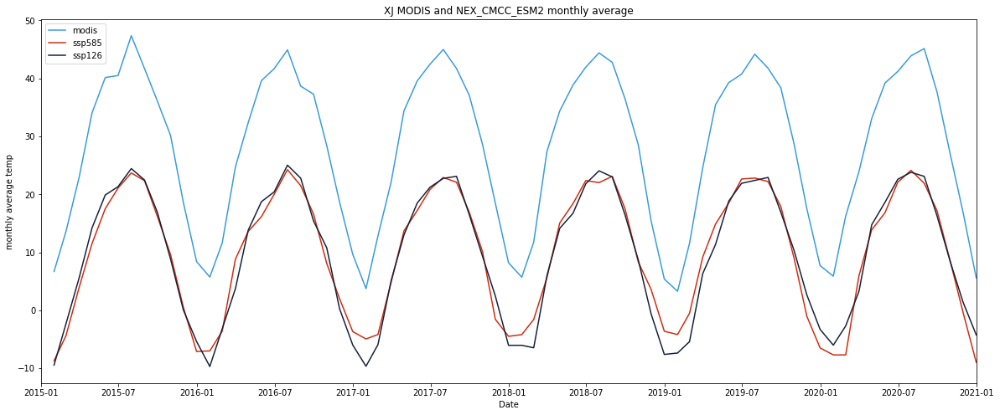

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_CMCC_ESM2_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_CMCC_ESM2_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_CMCC_ESM2 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_CMCC_ESM2_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_CMCC_ESM2_monthly_avg_temp)) 
XJ_ssp585_CMCC_ESM2_monthly_rmse

18.654827914816707

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_CMCC_ESM2_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_CMCC_ESM2_monthly_avg_temp)) 
XJ_ssp126_CMCC_ESM2_monthly_rmse

18.649506567814335

#### time series analysis

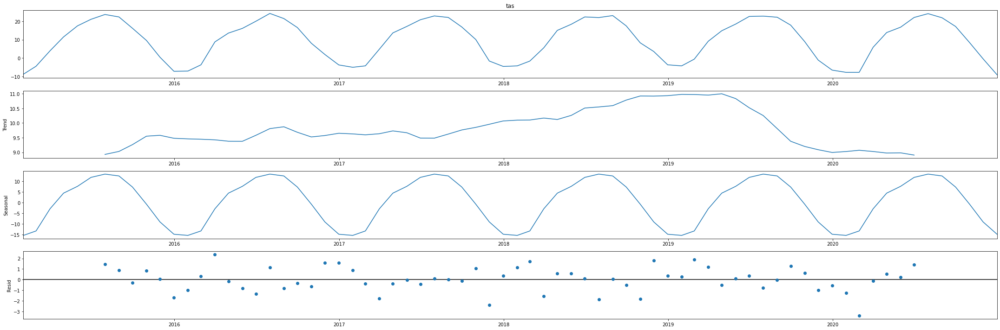

In [ ]:

XJ_ssp585_CMCC_ESM2_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_CMCC_ESM2_monthly_avg_temp, model='additive')
fig = XJ_ssp585_CMCC_ESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

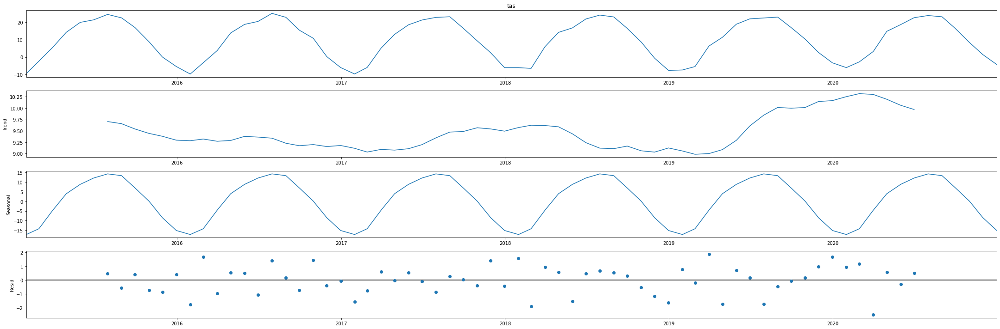

In [ ]:

XJ_ssp126_CMCC_ESM2_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_CMCC_ESM2_monthly_avg_temp, model='additive')
fig = XJ_ssp126_CMCC_ESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_CMCC_ESM2_model = LinearRegression()
x = XJ_ssp585_CMCC_ESM2_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_CMCC_ESM2_model.fit(x, y)
XJ_ssp585_CMCC_ESM2_r_squared =XJ_ssp585_CMCC_ESM2_model.score(x, y)
XJ_ssp585_CMCC_ESM2_r_squared

0.9601705525788118

In [ ]:
XJ_ssp126_CMCC_ESM2_model = LinearRegression()
x = XJ_ssp126_CMCC_ESM2_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp126_CMCC_ESM2_model.fit(x, y)
XJ_ssp126_CMCC_ESM2_r_squared = XJ_ssp126_CMCC_ESM2_model.score(x, y)
XJ_ssp126_CMCC_ESM2_r_squared

0.9746843297821767

#### seasonal analysis

In [ ]:
month = XJ_ssp585_CMCC_ESM2_monthly_avg_temp.index.month
XJ_ssp585_CMCC_ESM2_winter = pd.concat([XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 1], XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 2],XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 12]])
XJ_ssp585_CMCC_ESM2_spring = pd.concat([XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 3], XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 4],XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 5]])
XJ_ssp585_CMCC_ESM2_summer = pd.concat([XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 6], XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 7],XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 8]])
XJ_ssp585_CMCC_ESM2_fall = pd.concat([XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 9], XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 10],XJ_ssp585_CMCC_ESM2_monthly_avg_temp[month == 11]])
XJ_ssp585_CMCC_ESM2_winter.sort_index()
XJ_ssp585_CMCC_ESM2_spring.sort_index()
XJ_ssp585_CMCC_ESM2_summer.sort_index()
XJ_ssp585_CMCC_ESM2_fall.sort_index()

time
2015-09-30    16.216961
2015-10-31     9.613037
2015-11-30     0.522830
2016-09-30    16.599835
2016-10-31     8.085861
2016-11-30     2.006006
2017-09-30    16.903115
2017-10-31    10.115444
2017-11-30    -1.556096
2018-09-30    17.502533
2018-10-31     8.320762
2018-11-30     3.616539
2019-09-30    17.904589
2019-10-31     9.007879
2019-11-30    -1.038102
2020-09-30    17.189039
2020-10-31     8.468617
2020-11-30    -0.351003
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_CMCC_ESM2_monthly_avg_temp.index.month
XJ_ssp126_CMCC_ESM2_winter = pd.concat([XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 1], XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 2],XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 12]])
XJ_ssp126_CMCC_ESM2_spring = pd.concat([XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 3], XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 4],XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 5]])
XJ_ssp126_CMCC_ESM2_summer = pd.concat([XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 6], XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 7],XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 8]])
XJ_ssp126_CMCC_ESM2_fall = pd.concat([XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 9], XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 10],XJ_ssp126_CMCC_ESM2_monthly_avg_temp[month == 11]])
XJ_ssp126_CMCC_ESM2_winter.sort_index()
XJ_ssp126_CMCC_ESM2_spring.sort_index()
XJ_ssp126_CMCC_ESM2_summer.sort_index()
XJ_ssp126_CMCC_ESM2_fall.sort_index()

time
2015-09-30    16.914291
2015-10-31     8.847055
2015-11-30     0.043959
2016-09-30    15.412280
2016-10-31    10.771681
2016-11-30     0.279478
2017-09-30    16.490795
2017-10-31     9.311377
2017-11-30     2.475119
2018-09-30    16.450543
2018-10-31     8.681800
2018-11-30    -0.613765
2019-09-30    16.913440
2019-10-31    10.319269
2019-11-30     2.648934
2020-09-30    16.296402
2020-10-31     8.385820
2020-11-30     1.405187
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_CMCC_ESM2_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.42743172023848586
coef:  [[1.06382525]]
intercept:  [14.84584789]


In [ ]:
x = XJ_ssp126_CMCC_ESM2_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9332098813716142
coef:  [[1.08040993]]
intercept:  [19.20642648]


In [ ]:
x = XJ_ssp126_CMCC_ESM2_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.35854036917161014
coef:  [[1.09491764]]
intercept:  [17.89157055]


In [ ]:
x = XJ_ssp126_CMCC_ESM2_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9715310969202277
coef:  [[1.25114409]]
intercept:  [16.5824231]


#####ssp585

In [ ]:
x = XJ_ssp585_CMCC_ESM2_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.06522678402405913
coef:  [[0.39876692]]
intercept:  [10.58657876]


In [ ]:
x = XJ_ssp585_CMCC_ESM2_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9116268376801147
coef:  [[1.26747162]]
intercept:  [16.68313783]


In [ ]:
x = XJ_ssp585_CMCC_ESM2_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3193492368669085
coef:  [[1.09510579]]
intercept:  [18.32265742]


In [ ]:
x = XJ_ssp585_CMCC_ESM2_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9490894470181612
coef:  [[1.14748357]]
intercept:  [17.63129684]


### XJ_NEX_CanESM5

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1WgeTkQj5dWeN3wznf5gp8cKkBXGsqvYj/view?usp=share_link
id = "1WgeTkQj5dWeN3wznf5gp8cKkBXGsqvYj"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp585_CanESM5.csv')

XJ_ssp585_CanESM5 = pd.read_csv('tas_XJ_daily_ssp585_CanESM5.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_CanESM5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-7.767761
2015-01-01,39.125,82.375,-7.758179
2015-01-01,39.125,82.625,-7.841614
2015-01-01,39.125,82.875,-7.716553
2015-01-01,39.125,83.125,-7.455811


In [ ]:
XJ_ssp585_CanESM5

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-7.767761
2015-01-01,39.125,82.375,-7.758179
2015-01-01,39.125,82.625,-7.841614
2015-01-01,39.125,82.875,-7.716553
2015-01-01,39.125,83.125,-7.455811
...,...,...,...
2020-12-29,36.375,83.875,-17.661713
2020-12-29,36.375,84.125,-17.627563
2020-12-29,36.375,84.375,-16.878784


In [ ]:
XJ_ssp585_CanESM5['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_CanESM5_avg_temp = XJ_ssp585_CanESM5.groupby(XJ_ssp585_CanESM5.index)['tas'].mean()
XJ_ssp585_CanESM5_avg_temp

time
2015-01-01    -9.589711
2015-01-02    -7.917287
2015-01-03    -9.717921
2015-01-04    -9.976295
2015-01-05   -10.150573
                ...    
2020-12-25    -2.308925
2020-12-26    -9.957963
2020-12-27   -11.727330
2020-12-28   -10.562008
2020-12-29    -9.258799
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_CanESM5_monthly_avg_temp = XJ_ssp585_CanESM5_avg_temp.resample('M').mean()
XJ_ssp585_CanESM5_monthly_avg_temp

time
2015-01-31    -5.803688
2015-02-28    -2.884254
2015-03-31     5.831520
2015-04-30    12.263494
2015-05-31    17.170392
                ...    
2020-08-31    21.049844
2020-09-30    17.747734
2020-10-31    11.804628
2020-11-30     2.372952
2020-12-31    -5.515788
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/10eVDk6WI6yXVeBJ6BHBZuhd2oDoBwLlg/view?usp=share_link
id = "10eVDk6WI6yXVeBJ6BHBZuhd2oDoBwLlg"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('tas_XJ_daily_ssp126_CanESM5.csv')

XJ_ssp126_CanESM5 = pd.read_csv('tas_XJ_daily_ssp126_CanESM5.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_CanESM5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-8.027374
2015-01-01,39.125,82.375,-8.026917
2015-01-01,39.125,82.625,-8.119507
2015-01-01,39.125,82.875,-8.003601
2015-01-01,39.125,83.125,-7.751984


In [ ]:
XJ_ssp126_CanESM5['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_CanESM5_avg_temp = XJ_ssp126_CanESM5.groupby(XJ_ssp126_CanESM5.index)['tas'].mean()
XJ_ssp126_CanESM5_avg_temp

time
2015-01-01    -9.884553
2015-01-02    -8.227885
2015-01-03    -9.957840
2015-01-04   -10.145239
2015-01-05   -10.249279
                ...    
2020-12-25    -3.871253
2020-12-26    -6.283716
2020-12-27    -4.835680
2020-12-28    -7.374199
2020-12-29    -6.693037
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_CanESM5_monthly_avg_temp = XJ_ssp126_CanESM5_avg_temp.resample('M').mean()
XJ_ssp126_CanESM5_monthly_avg_temp 

time
2015-01-31    -6.869990
2015-02-28    -0.602750
2015-03-31     6.500484
2015-04-30    14.708581
2015-05-31    20.276153
                ...    
2020-08-31    21.280719
2020-09-30    16.514142
2020-10-31     7.862717
2020-11-30     1.006712
2020-12-31    -4.781866
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

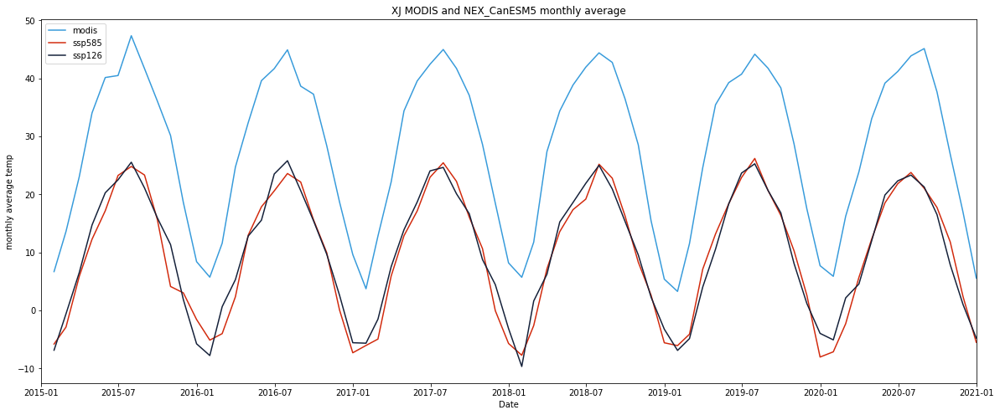

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_CanESM5_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_CanESM5_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_CanESM5 monthly average')
plt.show()

#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_CanESM5_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_CanESM5_monthly_avg_temp)) 
XJ_ssp585_CanESM5_monthly_rmse

18.54498875447908

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_CanESM5_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_CanESM5_monthly_avg_temp)) 
XJ_ssp126_CanESM5_monthly_rmse

18.15254847252151

#### R square

In [ ]:
XJ_ssp585_CanESM5_model = LinearRegression()
x = XJ_ssp585_CanESM5_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_CanESM5_model.fit(x, y)
XJ_ssp585_CanESM5_r_squared =XJ_ssp585_CanESM5_model.score(x, y)
XJ_ssp585_CanESM5_r_squared

0.9606188002652527

In [ ]:
XJ_ssp126_CanESM5_model = LinearRegression()
x = XJ_ssp126_CanESM5_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_CanESM5_model.fit(x, y)
XJ_ssp126_CanESM5_r_squared = XJ_ssp126_CanESM5_model.score(x, y)
XJ_ssp126_CanESM5_r_squared

0.9650719064880459

#### time series analysis

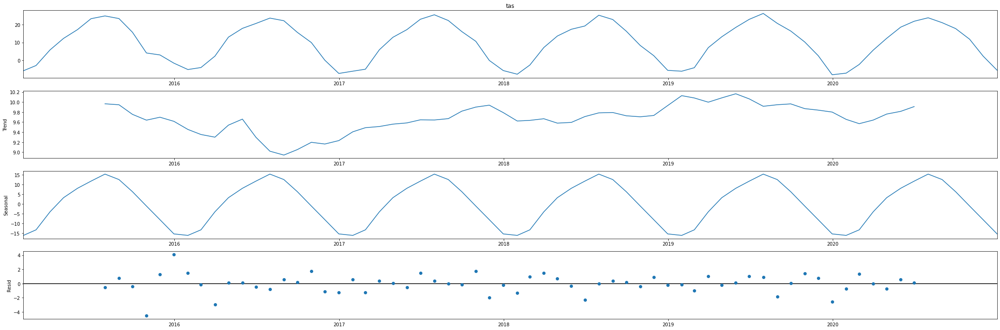

In [ ]:

XJ_ssp585_CanESM5_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_CanESM5_monthly_avg_temp, model='additive')
fig = XJ_ssp585_CanESM5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

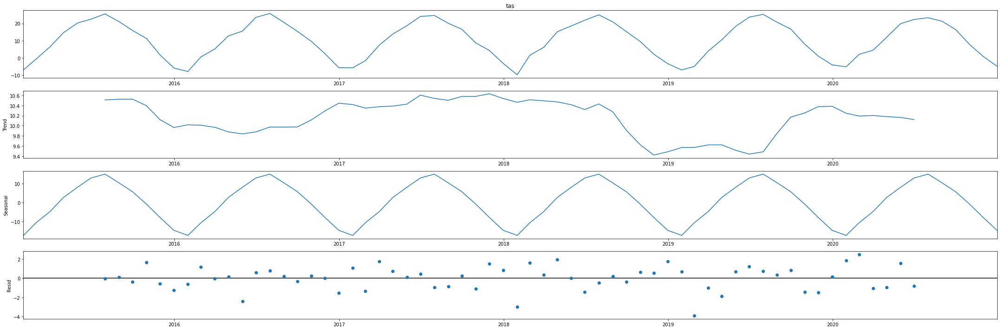

In [ ]:

XJ_ssp126_CanESM5_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_CanESM5_monthly_avg_temp, model='additive')
fig = XJ_ssp126_CanESM5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

### XJ_NEX_NorESM2-LM

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1iJ4cV8y4EyELilbkEZITJgbzwm_Wj1_x/view?usp=share_link
id = "1iJ4cV8y4EyELilbkEZITJgbzwm_Wj1_x"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_NorESM2-LM.csv')

XJ_ssp585_NorESM2_LM = pd.read_csv('XJ_ssp585_NorESM2-LM.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_NorESM2_LM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-1.649292
2015-01-01,39.125,82.375,-2.042603
2015-01-01,39.125,82.625,-2.381897
2015-01-01,39.125,82.875,-2.365540
2015-01-01,39.125,83.125,-2.213562


In [ ]:
XJ_ssp585_NorESM2_LM

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-1.649292
2015-01-01,39.125,82.375,-2.042603
2015-01-01,39.125,82.625,-2.381897
2015-01-01,39.125,82.875,-2.365540
2015-01-01,39.125,83.125,-2.213562
...,...,...,...
2020-12-29,36.375,83.875,-17.759949
2020-12-29,36.375,84.125,-17.632385
2020-12-29,36.375,84.375,-16.790130


In [ ]:
XJ_ssp585_NorESM2_LM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_NorESM2_LM_avg_temp = XJ_ssp585_NorESM2_LM.groupby(XJ_ssp585_NorESM2_LM.index)['tas'].mean()
XJ_ssp585_NorESM2_LM_avg_temp

time
2015-01-01    -3.806984
2015-01-02    -3.947957
2015-01-03    -3.440808
2015-01-04    -4.106749
2015-01-05    -4.238177
                ...    
2020-12-25    -3.262328
2020-12-26    -7.145735
2020-12-27   -10.423944
2020-12-28   -11.184462
2020-12-29   -10.784629
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_NorESM2_LM_monthly_avg_temp = XJ_ssp585_NorESM2_LM_avg_temp.resample('M').mean()
XJ_ssp585_NorESM2_LM_monthly_avg_temp

time
2015-01-31    -4.823804
2015-02-28     0.069177
2015-03-31     5.844424
2015-04-30    11.248611
2015-05-31    18.998261
                ...    
2020-08-31    23.243993
2020-09-30    17.985030
2020-10-31    11.158446
2020-11-30     1.551393
2020-12-31    -3.616386
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1inWdzEP25h--RnP0O7LXgzpP4md68ASO/view?usp=share_link
id = "1inWdzEP25h--RnP0O7LXgzpP4md68ASO"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_NorESM2-LM.csv')

XJ_ssp126_NorESM2_LM= pd.read_csv('XJ_ssp126_NorESM2-LM.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_NorESM2_LM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-1.708801
2015-01-01,39.125,82.375,-2.119385
2015-01-01,39.125,82.625,-2.468933
2015-01-01,39.125,82.875,-2.455994
2015-01-01,39.125,83.125,-2.307373


In [ ]:
XJ_ssp126_NorESM2_LM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_NorESM2_LM_avg_temp = XJ_ssp126_NorESM2_LM.groupby(XJ_ssp126_NorESM2_LM.index)['tas'].mean()
XJ_ssp126_NorESM2_LM_avg_temp

time
2015-01-01   -3.821305
2015-01-02   -3.825570
2015-01-03   -3.393389
2015-01-04   -4.053916
2015-01-05   -4.321630
                ...   
2020-12-25   -4.694242
2020-12-26   -4.776913
2020-12-27   -5.122521
2020-12-28   -5.797247
2020-12-29   -6.522510
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_NorESM2_LM_monthly_avg_temp = XJ_ssp126_NorESM2_LM_avg_temp.resample('M').mean()
XJ_ssp126_NorESM2_LM_monthly_avg_temp 

time
2015-01-31    -4.473744
2015-02-28    -1.395577
2015-03-31     5.839789
2015-04-30    12.805673
2015-05-31    17.720571
                ...    
2020-08-31    22.878295
2020-09-30    17.385504
2020-10-31    10.166595
2020-11-30     1.524082
2020-12-31    -5.978479
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

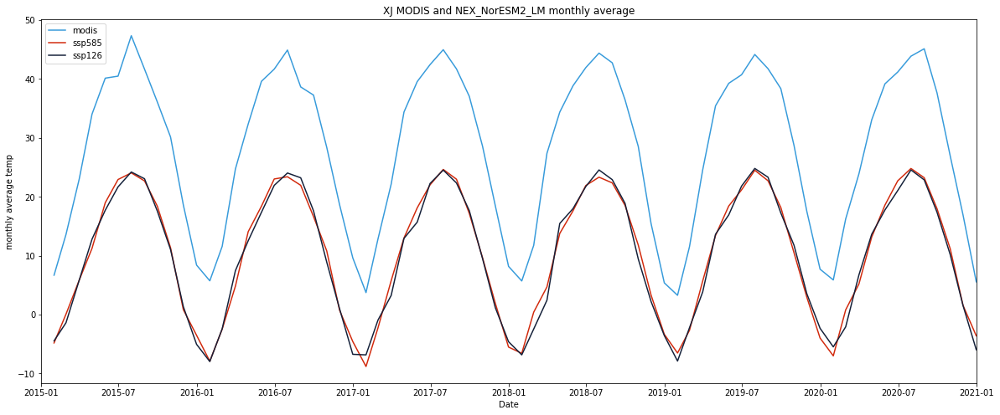

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_NorESM2_LM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_NorESM2_LM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_NorESM2_LM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_NorESM2_LM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_NorESM2_LM_monthly_avg_temp)) 
XJ_ssp585_NorESM2_LM_monthly_rmse

17.900004361971593

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_NorESM2_LM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_NorESM2_LM_monthly_avg_temp)) 
XJ_ssp126_NorESM2_LM_monthly_rmse

18.16492023020714

#### time series analysis

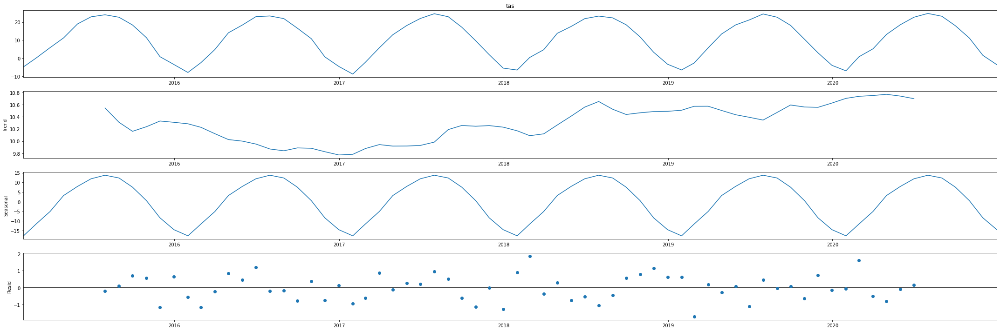

In [ ]:

XJ_ssp585_NorESM2_LM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_NorESM2_LM_monthly_avg_temp, model='additive')
fig = XJ_ssp585_NorESM2_LM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

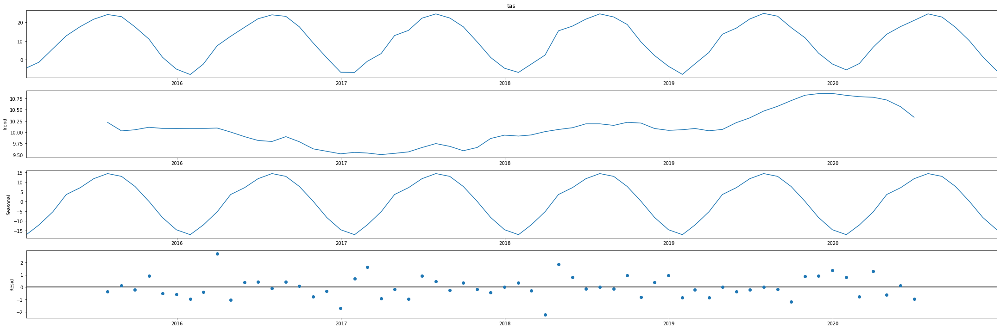

In [ ]:

XJ_ssp126_NorESM2_LM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_NorESM2_LM_monthly_avg_temp, model='additive')
fig = XJ_ssp126_NorESM2_LM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_NorESM2_LM_model = LinearRegression()
x = XJ_ssp585_NorESM2_LM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_NorESM2_LM_model.fit(x, y)
XJ_ssp585_NorESM2_LM_r_squared =XJ_ssp585_NorESM2_LM_model.score(x, y)
XJ_ssp585_NorESM2_LM_r_squared

0.9742276537935685

In [ ]:
XJ_ssp126_NorESM2_LM_model = LinearRegression()
x = XJ_ssp126_NorESM2_LM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_NorESM2_LM_model.fit(x, y)
XJ_ssp126_NorESM2_LM_r_squared = XJ_ssp126_NorESM2_LM_model.score(x, y)
XJ_ssp126_NorESM2_LM_r_squared

0.9686185799399585

#### seasonal analysis

In [ ]:
month = XJ_ssp585_NorESM2_LM_monthly_avg_temp.index.month
XJ_ssp585_NorESM2_LM_winter = pd.concat([XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 1], XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 2],XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 12]])
XJ_ssp585_NorESM2_LM_spring = pd.concat([XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 3], XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 4],XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 5]])
XJ_ssp585_NorESM2_LM_summer = pd.concat([XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 6], XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 7],XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 8]])
XJ_ssp585_NorESM2_LM_fall = pd.concat([XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 9], XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 10],XJ_ssp585_NorESM2_LM_monthly_avg_temp[month == 11]])
XJ_ssp585_NorESM2_LM_winter.sort_index()
XJ_ssp585_NorESM2_LM_spring.sort_index()
XJ_ssp585_NorESM2_LM_summer.sort_index()
XJ_ssp585_NorESM2_LM_fall.sort_index()

time
2015-09-30    18.409818
2015-10-31    11.350268
2015-11-30     0.817855
2016-09-30    16.638934
2016-10-31    10.814196
2016-11-30     0.736088
2017-09-30    17.184341
2017-10-31     9.667302
2017-11-30     1.913730
2018-09-30    18.536930
2018-10-31    11.799347
2018-11-30     3.293702
2019-09-30    18.192669
2019-10-31    10.477530
2019-11-30     2.933078
2020-09-30    17.985030
2020-10-31    11.158446
2020-11-30     1.551393
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_NorESM2_LM_monthly_avg_temp.index.month
XJ_ssp126_NorESM2_LM_winter = pd.concat([XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 1], XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 2],XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 12]])
XJ_ssp126_NorESM2_LM_spring = pd.concat([XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 3], XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 4],XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 5]])
XJ_ssp126_NorESM2_LM_summer = pd.concat([XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 6], XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 7],XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 8]])
XJ_ssp126_NorESM2_LM_fall = pd.concat([XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 9], XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 10],XJ_ssp126_NorESM2_LM_monthly_avg_temp[month == 11]])
XJ_ssp126_NorESM2_LM_winter.sort_index()
XJ_ssp126_NorESM2_LM_spring.sort_index()
XJ_ssp126_NorESM2_LM_summer.sort_index()
XJ_ssp126_NorESM2_LM_fall.sort_index()

time
2015-09-30    17.581061
2015-10-31    11.047300
2015-11-30     1.337419
2016-09-30    17.613100
2016-10-31     8.902252
2016-11-30     1.004425
2017-09-30    17.654851
2017-10-31     9.526387
2017-11-30     1.174951
2018-09-30    18.883560
2018-10-31     9.433032
2018-11-30     2.210516
2019-09-30    17.256303
2019-10-31    11.754700
2019-11-30     3.528561
2020-09-30    17.385504
2020-10-31    10.166595
2020-11-30     1.524082
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_NorESM2_LM_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6333593906209483
coef:  [[1.27012521]]
intercept:  [14.12380269]


In [ ]:
x = XJ_ssp126_NorESM2_LM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8966782400029409
coef:  [[1.13370102]]
intercept:  [19.08315324]


In [ ]:
x = XJ_ssp126_NorESM2_LM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.43270140262195356
coef:  [[1.17677409]]
intercept:  [15.6448511]


In [ ]:
x = XJ_ssp126_NorESM2_LM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9639763908558774
coef:  [[1.20686613]]
intercept:  [15.84201924]


#####ssp585

In [ ]:
x = XJ_ssp585_NorESM2_LM_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.7345282306605257
coef:  [[1.13590114]]
intercept:  [13.09437777]


In [ ]:
x = XJ_ssp585_NorESM2_LM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9406669363553479
coef:  [[1.14544849]]
intercept:  [18.50781934]


In [ ]:
x = XJ_ssp585_NorESM2_LM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4881839985967662
coef:  [[1.48101509]]
intercept:  [8.66890925]


In [ ]:
x = XJ_ssp585_NorESM2_LM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9597921985046152
coef:  [[1.20067029]]
intercept:  [15.53800955]


### XJ_NEX_NESM3

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1owMMCX5wP8EIHNLUIeEE7YbayDDoEsNs/view?usp=share_link
id = "1owMMCX5wP8EIHNLUIeEE7YbayDDoEsNs"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_NESM3.csv')

XJ_ssp585_NESM3 = pd.read_csv('XJ_ssp585_NESM3.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_NESM3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-2.349854
2015-01-01,1,39.125,82.375,-2.319458
2015-01-01,2,39.125,82.625,-2.522278
2015-01-01,3,39.125,82.875,-2.656799
2015-01-01,4,39.125,83.125,-2.655609


In [ ]:
XJ_ssp585_NESM3

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-2.349854
2015-01-01,1,39.125,82.375,-2.319458
2015-01-01,2,39.125,82.625,-2.522278
2015-01-01,3,39.125,82.875,-2.656799
2015-01-01,4,39.125,83.125,-2.655609
...,...,...,...,...
2020-12-31,315643,36.375,83.875,-16.806671
2020-12-31,315644,36.375,84.125,-16.426575
2020-12-31,315645,36.375,84.375,-15.331665


In [ ]:
XJ_ssp585_NESM3['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_NESM3_avg_temp = XJ_ssp585_NESM3.groupby(XJ_ssp585_NESM3.index)['tas'].mean()
XJ_ssp585_NESM3_avg_temp

time
2015-01-01    -5.722678
2015-01-02    -7.673305
2015-01-03   -10.214685
2015-01-04    -9.350129
2015-01-05    -6.888432
                ...    
2020-12-27    -7.276498
2020-12-28    -7.956414
2020-12-29    -8.528673
2020-12-30    -8.681118
2020-12-31    -8.835072
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp585_NESM3_monthly_avg_temp = XJ_ssp585_NESM3_avg_temp.resample('M').mean()
XJ_ssp585_NESM3_monthly_avg_temp

time
2015-01-31    -6.683754
2015-02-28    -1.869685
2015-03-31     5.759713
2015-04-30    10.080368
2015-05-31    16.405703
                ...    
2020-08-31    24.660461
2020-09-30    17.962796
2020-10-31    11.982215
2020-11-30     3.807766
2020-12-31    -3.563073
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1zxLKHz3vEoD0unLFfHJhcksPleDhi9rZ/view?usp=share_link
id = "1zxLKHz3vEoD0unLFfHJhcksPleDhi9rZ"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_NESM3_ssp126.csv')

XJ_ssp126_NESM3= pd.read_csv('XJ_NESM3_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_NESM3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-13.083435
2015-01-01,1,36.375,82.375,-16.529602
2015-01-01,2,36.375,82.625,-16.899902
2015-01-01,3,36.375,82.875,-16.218628
2015-01-01,4,36.375,83.125,-18.357513


In [ ]:
XJ_ssp126_NESM3['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_NESM3_avg_temp = XJ_ssp126_NESM3.groupby(XJ_ssp126_NESM3.index)['tas'].mean()
XJ_ssp126_NESM3_avg_temp

time
2015-01-01    -5.718438
2015-01-02    -7.654819
2015-01-03   -10.175719
2015-01-04    -9.323996
2015-01-05    -6.722754
                ...    
2020-12-27   -10.322142
2020-12-28    -6.778032
2020-12-29    -2.894535
2020-12-30    -3.543232
2020-12-31    -4.425028
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_NESM3_monthly_avg_temp = XJ_ssp126_NESM3_avg_temp.resample('M').mean()
XJ_ssp126_NESM3_monthly_avg_temp 

time
2015-01-31    -6.851163
2015-02-28    -3.912727
2015-03-31     3.481026
2015-04-30    13.098362
2015-05-31    19.622821
                ...    
2020-08-31    24.663353
2020-09-30    18.678786
2020-10-31     9.579208
2020-11-30    -0.690082
2020-12-31    -5.111284
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

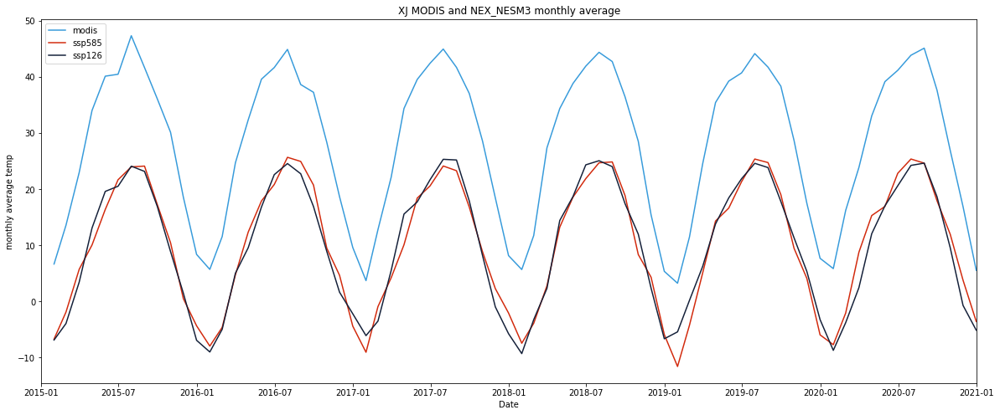

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_NESM3_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_NESM3_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_NESM3 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_NESM3_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_NESM3_monthly_avg_temp)) 
XJ_ssp585_NESM3_monthly_rmse

18.085621026763846

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_NESM3_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_NESM3_monthly_avg_temp)) 
XJ_ssp126_NESM3_monthly_rmse

18.295385706020795

#### time series analysis

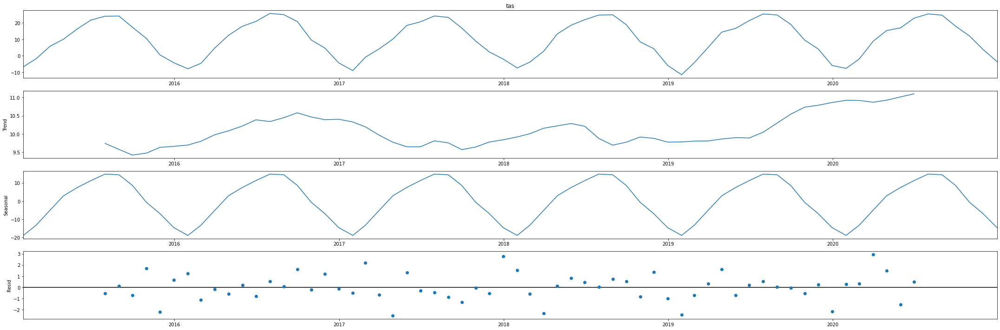

In [ ]:

XJ_ssp585_NESM3_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_NESM3_monthly_avg_temp, model='additive')
fig = XJ_ssp585_NESM3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

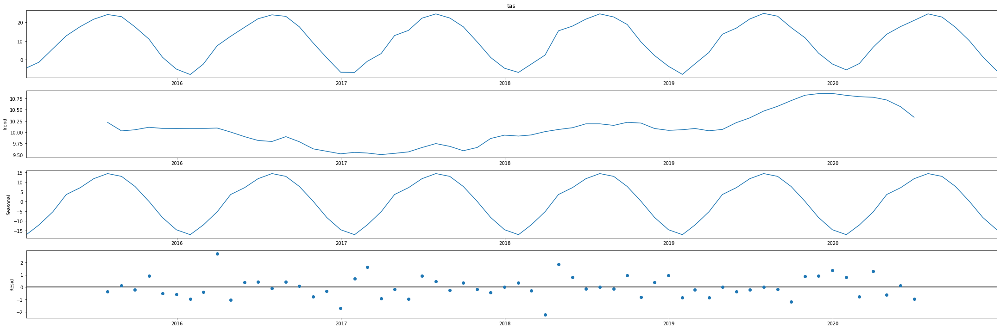

In [ ]:

XJ_ssp126_NESM3_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_NESM3_monthly_avg_temp, model='additive')
fig = XJ_ssp126_NorESM2_LM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_NESM3_model = LinearRegression()
x = XJ_ssp585_NESM3_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_NESM3_model.fit(x, y)
XJ_ssp585_NESM3_r_squared =XJ_ssp585_NorESM2_LM_model.score(x, y)
XJ_ssp585_NESM3_r_squared

0.9532359552739189

In [ ]:
XJ_ssp126_NESM3_model = LinearRegression()
x = XJ_ssp126_NESM3_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_NESM3_model.fit(x, y)
XJ_ssp126_NESM3_r_squared = XJ_ssp126_NorESM2_LM_model.score(x, y)
XJ_ssp126_NESM3_r_squared

0.9565850312824177

#### seasonal analysis

In [ ]:
month = XJ_ssp585_NESM3_monthly_avg_temp.index.month
XJ_ssp585_NESM3_winter = pd.concat([XJ_ssp585_NESM3_monthly_avg_temp[month == 1], XJ_ssp585_NESM3_monthly_avg_temp[month == 2],XJ_ssp585_NESM3_monthly_avg_temp[month == 12]])
XJ_ssp585_NESM3_spring = pd.concat([XJ_ssp585_NESM3_monthly_avg_temp[month == 3], XJ_ssp585_NESM3_monthly_avg_temp[month == 4],XJ_ssp585_NESM3_monthly_avg_temp[month == 5]])
XJ_ssp585_NESM3_summer = pd.concat([XJ_ssp585_NESM3_monthly_avg_temp[month == 6], XJ_ssp585_NESM3_monthly_avg_temp[month == 7],XJ_ssp585_NESM3_monthly_avg_temp[month == 8]])
XJ_ssp585_NESM3_fall = pd.concat([XJ_ssp585_NESM3_monthly_avg_temp[month == 9], XJ_ssp585_NESM3_monthly_avg_temp[month == 10],XJ_ssp585_NESM3_monthly_avg_temp[month == 11]])
XJ_ssp585_NESM3_winter.sort_index()
XJ_ssp585_NESM3_spring.sort_index()
XJ_ssp585_NESM3_summer.sort_index()
XJ_ssp585_NESM3_fall.sort_index()

time
2015-09-30    17.279571
2015-10-31    10.475513
2015-11-30     0.519325
2016-09-30    20.748121
2016-10-31     9.532448
2016-11-30     4.673397
2017-09-30    16.818645
2017-10-31     8.880818
2017-11-30     2.312268
2018-09-30    18.883651
2018-10-31     8.377555
2018-11-30     4.336739
2019-09-30    19.073670
2019-10-31     9.494002
2019-11-30     4.127813
2020-09-30    17.962796
2020-10-31    11.982215
2020-11-30     3.807766
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_NESM3_monthly_avg_temp.index.month
XJ_ssp126_NESM3_winter = pd.concat([XJ_ssp126_NESM3_monthly_avg_temp[month == 1], XJ_ssp126_NESM3_monthly_avg_temp[month == 2],XJ_ssp126_NESM3_monthly_avg_temp[month == 12]])
XJ_ssp126_NESM3_spring = pd.concat([XJ_ssp126_NESM3_monthly_avg_temp[month == 3], XJ_ssp126_NESM3_monthly_avg_temp[month == 4],XJ_ssp126_NESM3_monthly_avg_temp[month == 5]])
XJ_ssp126_NESM3_summer = pd.concat([XJ_ssp126_NESM3_monthly_avg_temp[month == 6], XJ_ssp126_NESM3_monthly_avg_temp[month == 7],XJ_ssp126_NESM3_monthly_avg_temp[month == 8]])
XJ_ssp126_NESM3_fall = pd.concat([XJ_ssp126_NESM3_monthly_avg_temp[month == 9], XJ_ssp126_NESM3_monthly_avg_temp[month == 10],XJ_ssp126_NESM3_monthly_avg_temp[month == 11]])
XJ_ssp126_NESM3_winter.sort_index()
XJ_ssp126_NESM3_spring.sort_index()
XJ_ssp126_NESM3_summer.sort_index()
XJ_ssp126_NESM3_fall.sort_index()

time
2015-09-30    16.936310
2015-10-31     8.897788
2015-11-30     1.491183
2016-09-30    16.919886
2016-10-31     8.963635
2016-11-30     1.665625
2017-09-30    17.923075
2017-10-31     8.210717
2017-11-30    -0.941037
2018-09-30    17.438495
2018-10-31    12.008683
2018-11-30     2.380311
2019-09-30    17.841077
2019-10-31    11.361030
2019-11-30     5.368733
2020-09-30    18.678786
2020-10-31     9.579208
2020-11-30    -0.690082
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_NESM3_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.3688711195332527
coef:  [[0.89923337]]
intercept:  [13.22440392]


In [ ]:
x = XJ_ssp126_NESM3_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.916198458100244
coef:  [[1.02585311]]
intercept:  [20.46884349]


In [ ]:
x = XJ_ssp126_NESM3_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.37975914797983124
coef:  [[0.85948906]]
intercept:  [22.55626224]


In [ ]:
x = XJ_ssp126_NESM3_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9308346258484531
coef:  [[1.15521378]]
intercept:  [16.6063403]


#####ssp585

In [ ]:
x = XJ_ssp585_NESM3_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6505646201139177
coef:  [[1.05770955]]
intercept:  [14.04198135]


In [ ]:
x = XJ_ssp585_NESM3_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.846328018243622
coef:  [[1.1067324]]
intercept:  [19.53307174]


In [ ]:
x = XJ_ssp585_NESM3_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.17020424526387024
coef:  [[0.52203325]]
intercept:  [30.44323493]


In [ ]:
x = XJ_ssp585_NESM3_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9106787337108592
coef:  [[1.21157051]]
intercept:  [15.03478983]


### XJ_NEX_MRI-ESM2-0

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1gGcIKztzBEclTjK18HI5u4XkXydvU8f7/view?usp=share_link
id = "1gGcIKztzBEclTjK18HI5u4XkXydvU8f7"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_MRI-ESM2-0.csv')

XJ_ssp585_MRI_ESM2_0 = pd.read_csv('XJ_ssp585_MRI-ESM2-0.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_MRI_ESM2_0.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-8.743195
2015-01-01,1,39.125,82.375,-8.772064
2015-01-01,2,39.125,82.625,-8.893982
2015-01-01,3,39.125,82.875,-8.807373
2015-01-01,4,39.125,83.125,-8.585114


In [ ]:
XJ_ssp585_MRI_ESM2_0

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-8.743195
2015-01-01,1,39.125,82.375,-8.772064
2015-01-01,2,39.125,82.625,-8.893982
2015-01-01,3,39.125,82.875,-8.807373
2015-01-01,4,39.125,83.125,-8.585114
...,...,...,...,...
2020-12-31,315643,36.375,83.875,-23.020935
2020-12-31,315644,36.375,84.125,-23.141113
2020-12-31,315645,36.375,84.375,-22.546494


In [ ]:
XJ_ssp585_MRI_ESM2_0['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_MRI_ESM2_0_avg_temp = XJ_ssp585_MRI_ESM2_0.groupby(XJ_ssp585_MRI_ESM2_0.index)['tas'].mean()
XJ_ssp585_MRI_ESM2_0_avg_temp

time
2015-01-01   -10.169515
2015-01-02    -7.402194
2015-01-03    -5.421381
2015-01-04    -4.691453
2015-01-05    -6.454928
                ...    
2020-12-27   -10.406458
2020-12-28    -9.436847
2020-12-29   -10.425110
2020-12-30   -10.532478
2020-12-31   -10.652232
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp585_MRI_ESM2_0_monthly_avg_temp = XJ_ssp585_MRI_ESM2_0_avg_temp.resample('M').mean()
XJ_ssp585_MRI_ESM2_0_monthly_avg_temp

time
2015-01-31    -6.384847
2015-02-28    -2.806975
2015-03-31     4.595251
2015-04-30    12.164546
2015-05-31    17.787022
                ...    
2020-08-31    23.115493
2020-09-30    17.857620
2020-10-31    11.310747
2020-11-30     1.519273
2020-12-31    -4.560452
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1thXOTFfhWT9oYCCfmCpgJzYVwAisTRxW/view?usp=share_link
id = "1thXOTFfhWT9oYCCfmCpgJzYVwAisTRxW"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_MRI-ESM2-0_ssp126.csv')

XJ_ssp126_MRI_ESM2_0= pd.read_csv('XJ_MRI-ESM2-0_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_MRI_ESM2_0.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-16.235900
2015-01-01,1,36.375,82.375,-19.468018
2015-01-01,2,36.375,82.625,-19.745209
2015-01-01,3,36.375,82.875,-19.091736
2015-01-01,4,36.375,83.125,-21.258438


In [ ]:
XJ_ssp126_MRI_ESM2_0['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_MRI_ESM2_0_avg_temp = XJ_ssp126_MRI_ESM2_0.groupby(XJ_ssp126_MRI_ESM2_0.index)['tas'].mean()
XJ_ssp126_MRI_ESM2_0_avg_temp

time
2015-01-01   -10.328437
2015-01-02    -7.552045
2015-01-03    -5.724492
2015-01-04    -4.868056
2015-01-05    -6.603420
                ...    
2020-12-27    -1.308743
2020-12-28    -1.293883
2020-12-29    -2.540521
2020-12-30    -4.521040
2020-12-31    -5.171933
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_MRI_ESM2_0_monthly_avg_temp = XJ_ssp126_MRI_ESM2_0_avg_temp.resample('M').mean()
XJ_ssp126_MRI_ESM2_0_monthly_avg_temp 

time
2015-01-31    -7.847778
2015-02-28    -6.681225
2015-03-31     4.355515
2015-04-30    14.389158
2015-05-31    17.982350
                ...    
2020-08-31    23.382212
2020-09-30    18.445008
2020-10-31     9.573019
2020-11-30     1.832722
2020-12-31    -3.514092
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

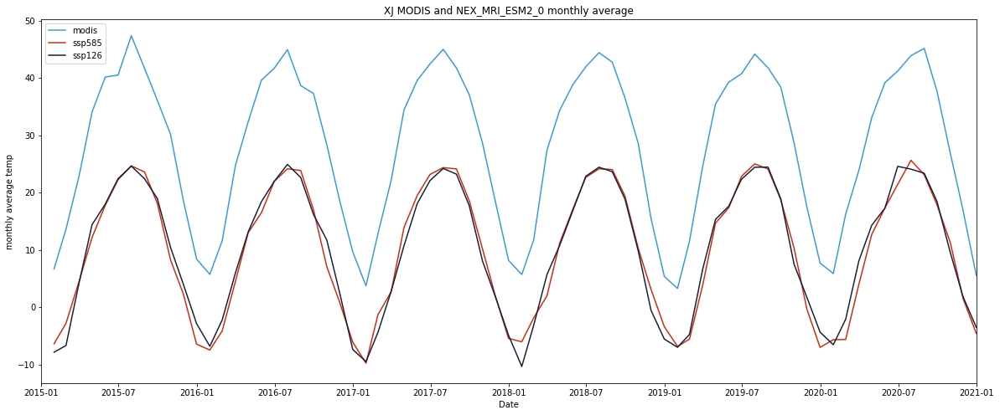

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_MRI_ESM2_0_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_MRI_ESM2_0_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_MRI_ESM2_0 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_MRI_ESM2_0_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_MRI_ESM2_0_monthly_avg_temp)) 
XJ_ssp585_MRI_ESM2_0_monthly_rmse

18.373698625356194

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_MRI_ESM2_0_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_MRI_ESM2_0_monthly_avg_temp)) 
XJ_ssp126_MRI_ESM2_0_monthly_rmse

18.215449712088926

#### time series analysis

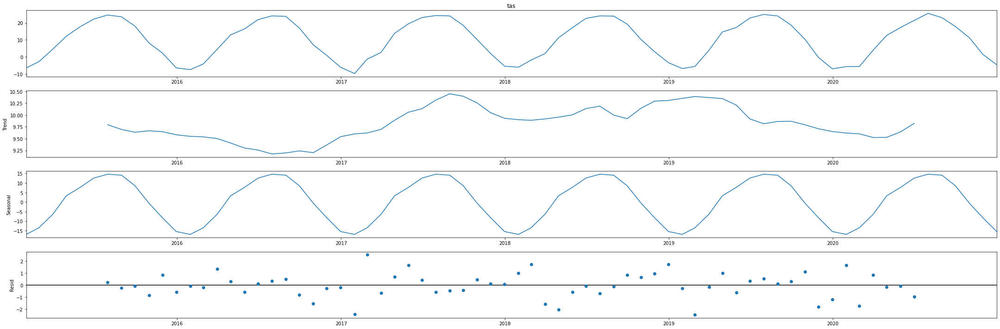

In [ ]:

XJ_ssp585_MRI_ESM2_0_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_MRI_ESM2_0_monthly_avg_temp, model='additive')
fig = XJ_ssp585_MRI_ESM2_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

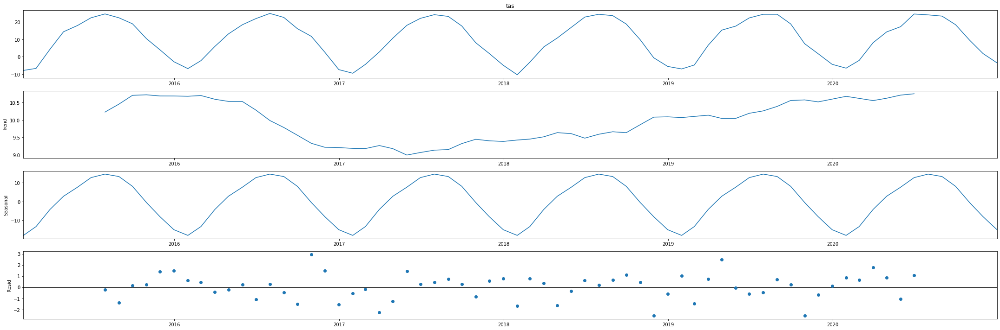

In [ ]:

XJ_ssp126_MRI_ESM2_0_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_MRI_ESM2_0_monthly_avg_temp, model='additive')
fig = XJ_ssp126_MRI_ESM2_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_MRI_ESM2_0_model = LinearRegression()
x = XJ_ssp585_MRI_ESM2_0_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_MRI_ESM2_0_model.fit(x, y)
XJ_ssp585_MRI_ESM2_0_r_squared =XJ_ssp585_MRI_ESM2_0_model.score(x, y)
XJ_ssp585_MRI_ESM2_0_r_squared

0.9576811022949607

In [ ]:
XJ_ssp126_MRI_ESM2_0_model = LinearRegression()
x = XJ_ssp126_MRI_ESM2_0_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_MRI_ESM2_0_model.fit(x, y)
XJ_ssp126_MRI_ESM2_0_r_squared = XJ_ssp126_MRI_ESM2_0_model.score(x, y)
XJ_ssp126_MRI_ESM2_0_r_squared

0.9674993959234046

#### seasonal analysis

In [ ]:
month = XJ_ssp585_MRI_ESM2_0_monthly_avg_temp.index.month
XJ_ssp585_MRI_ESM2_0_winter = pd.concat([XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 1], XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 2],XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 12]])
XJ_ssp585_MRI_ESM2_0_spring = pd.concat([XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 3], XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 4],XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 5]])
XJ_ssp585_MRI_ESM2_0_summer = pd.concat([XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 6], XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 7],XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 8]])
XJ_ssp585_MRI_ESM2_0_fall = pd.concat([XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 9], XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 10],XJ_ssp585_MRI_ESM2_0_monthly_avg_temp[month == 11]])
XJ_ssp585_MRI_ESM2_0_winter.sort_index()
XJ_ssp585_MRI_ESM2_0_spring.sort_index()
XJ_ssp585_MRI_ESM2_0_summer.sort_index()
XJ_ssp585_MRI_ESM2_0_fall.sort_index()

time
2015-09-30    18.123378
2015-10-31     8.254304
2015-11-30     2.298825
2016-09-30    16.993869
2016-10-31     7.117196
2016-11-30     0.917604
2017-09-30    18.548431
2017-10-31    10.167997
2017-11-30     1.982625
2018-09-30    19.344421
2018-10-31    10.250245
2018-11-30     3.092279
2019-09-30    18.734321
2019-10-31    10.341788
2019-11-30    -0.307791
2020-09-30    17.857620
2020-10-31    11.310747
2020-11-30     1.519273
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_MRI_ESM2_0_monthly_avg_temp.index.month
XJ_ssp126_MRI_ESM2_0_winter = pd.concat([XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 1], XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 2],XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 12]])
XJ_ssp126_MRI_ESM2_0_spring = pd.concat([XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 3], XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 4],XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 5]])
XJ_ssp126_MRI_ESM2_0_summer = pd.concat([XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 6], XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 7],XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 8]])
XJ_ssp126_MRI_ESM2_0_fall = pd.concat([XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 9], XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 10],XJ_ssp126_MRI_ESM2_0_monthly_avg_temp[month == 11]])
XJ_ssp126_MRI_ESM2_0_winter.sort_index()
XJ_ssp126_MRI_ESM2_0_spring.sort_index()
XJ_ssp126_MRI_ESM2_0_summer.sort_index()
XJ_ssp126_MRI_ESM2_0_fall.sort_index()

time
2015-09-30    18.961645
2015-10-31    10.429563
2015-11-30     3.999064
2016-09-30    16.171506
2016-10-31    11.749100
2016-11-30     2.601936
2017-09-30    17.691089
2017-10-31     8.058986
2017-11-30     1.873520
2018-09-30    18.838299
2018-10-31     9.797138
2018-11-30    -0.572478
2019-09-30    18.898156
2019-10-31     7.506920
2019-11-30     1.742877
2020-09-30    18.445008
2020-10-31     9.573019
2020-11-30     1.832722
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_MRI_ESM2_0_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.3390289021216999
coef:  [[0.89648865]]
intercept:  [13.49187316]


In [ ]:
x = XJ_ssp126_MRI_ESM2_0_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9208508869657351
coef:  [[1.17404986]]
intercept:  [18.30587018]


In [ ]:
x = XJ_ssp126_MRI_ESM2_0_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.39965538410851564
coef:  [[1.32962998]]
intercept:  [11.55860523]


In [ ]:
x = XJ_ssp126_MRI_ESM2_0_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9570261251176566
coef:  [[1.16643302]]
intercept:  [16.26687095]


#####ssp585

In [ ]:
x = XJ_ssp585_MRI_ESM2_0_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.326802024057111
coef:  [[1.01141338]]
intercept:  [13.93643554]


In [ ]:
x = XJ_ssp585_MRI_ESM2_0_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9359059983975624
coef:  [[1.04291067]]
intercept:  [20.68937547]


In [ ]:
x = XJ_ssp585_MRI_ESM2_0_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.2700894806372376
coef:  [[1.00727144]]
intercept:  [18.99222955]


In [ ]:
x = XJ_ssp585_MRI_ESM2_0_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9370119233369719
coef:  [[1.13026037]]
intercept:  [16.68976151]


### XJ_NEX_MPI-ESM1-2-LR

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1fqkpuI7W-dz4TaU-Mrg0f2HXNN-PE2AC/view?usp=share_link
id = "1fqkpuI7W-dz4TaU-Mrg0f2HXNN-PE2AC"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_MPI-ESM1-2-LR.csv')

XJ_ssp585_MPI_ESM1_2_LR = pd.read_csv('XJ_ssp585_MPI-ESM1-2-LR.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_MPI_ESM1_2_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-4.868591
2015-01-01,1,39.125,82.375,-5.150513
2015-01-01,2,39.125,82.625,-5.467956
2015-01-01,3,39.125,82.875,-5.519501
2015-01-01,4,39.125,83.125,-5.435364


In [ ]:
XJ_ssp585_MPI_ESM1_2_LR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-4.868591
2015-01-01,1,39.125,82.375,-5.150513
2015-01-01,2,39.125,82.625,-5.467956
2015-01-01,3,39.125,82.875,-5.519501
2015-01-01,4,39.125,83.125,-5.435364
...,...,...,...,...
2020-12-31,315643,36.375,83.875,-17.509644
2020-12-31,315644,36.375,84.125,-17.591050
2020-12-31,315645,36.375,84.375,-16.957642


In [ ]:
XJ_ssp585_MPI_ESM1_2_LR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_MPI_ESM1_2_LR_avg_temp = XJ_ssp585_MPI_ESM1_2_LR.groupby(XJ_ssp585_MPI_ESM1_2_LR.index)['tas'].mean()
XJ_ssp585_MPI_ESM1_2_LR_avg_temp

time
2015-01-01   -6.091163
2015-01-02   -5.276752
2015-01-03   -5.377847
2015-01-04   -6.498952
2015-01-05   -8.381618
                ...   
2020-12-27   -8.601649
2020-12-28   -6.640339
2020-12-29   -6.221804
2020-12-30   -8.168083
2020-12-31   -7.615300
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp = XJ_ssp585_MPI_ESM1_2_LR_avg_temp.resample('M').mean()
XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp

time
2015-01-31    -8.323827
2015-02-28    -4.077619
2015-03-31     3.827931
2015-04-30    13.295737
2015-05-31    16.828458
                ...    
2020-08-31    22.638476
2020-09-30    17.898691
2020-10-31     8.120067
2020-11-30     1.817241
2020-12-31    -7.462277
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1gi6-OvzeU_gj3RRNDgP-vdtpXwkO0RCj/view?usp=share_link
id = "1gi6-OvzeU_gj3RRNDgP-vdtpXwkO0RCj"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_MPI-ESM1-2-LR_ssp126.csv')

XJ_ssp126_MPI_ESM1_2_LR= pd.read_csv('XJ_MPI-ESM1-2-LR_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_MPI_ESM1_2_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-11.628357
2015-01-01,1,36.375,82.375,-14.943665
2015-01-01,2,36.375,82.625,-15.231995
2015-01-01,3,36.375,82.875,-14.517670
2015-01-01,4,36.375,83.125,-16.623505


In [ ]:
XJ_ssp126_MPI_ESM1_2_LR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_MPI_ESM1_2_LR_avg_temp = XJ_ssp126_MPI_ESM1_2_LR.groupby(XJ_ssp126_MPI_ESM1_2_LR.index)['tas'].mean()
XJ_ssp126_MPI_ESM1_2_LR_avg_temp

time
2015-01-01    -6.128180
2015-01-02    -5.299786
2015-01-03    -5.561349
2015-01-04    -6.387550
2015-01-05    -8.256802
                ...    
2020-12-27   -10.328783
2020-12-28   -10.903025
2020-12-29   -10.741436
2020-12-30   -10.090754
2020-12-31    -9.572365
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp = XJ_ssp126_MPI_ESM1_2_LR_avg_temp.resample('M').mean()
XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp 

time
2015-01-31    -8.359208
2015-02-28    -4.381186
2015-03-31     2.725069
2015-04-30     9.591844
2015-05-31    17.266326
                ...    
2020-08-31    23.513664
2020-09-30    17.412543
2020-10-31     8.557095
2020-11-30     3.289649
2020-12-31    -7.293772
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

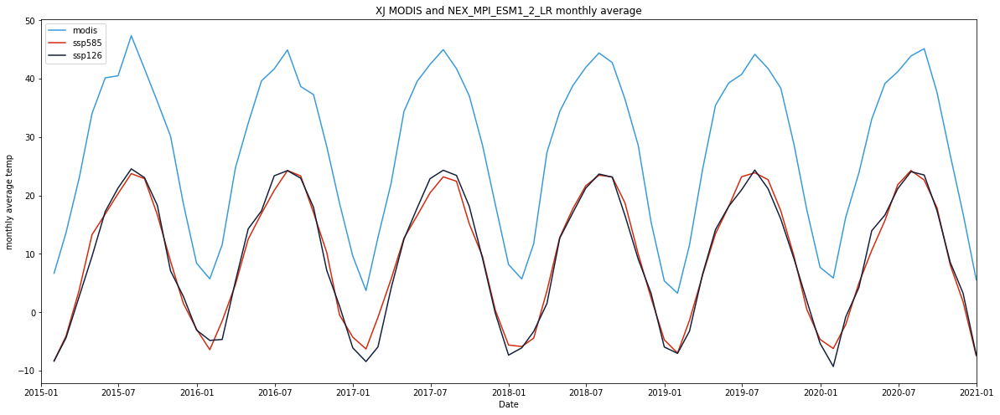

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_MPI_ESM1_2_LR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_MPI_ESM1_2_LR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp)) 
XJ_ssp585_MPI_ESM1_2_LR_monthly_rmse

18.60206500461847

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_MPI_ESM1_2_LR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp)) 
XJ_ssp126_MPI_ESM1_2_LR_monthly_rmse

18.713592702057078

#### time series analysis

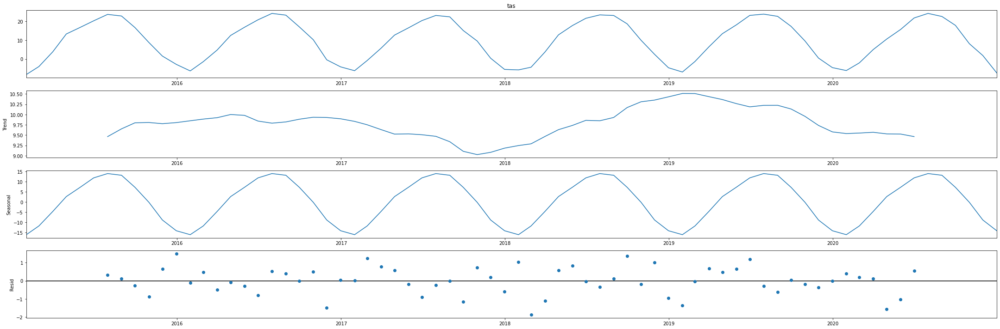

In [ ]:

XJ_ssp585_MPI_ESM1_2_LR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp, model='additive')
fig = XJ_ssp585_MPI_ESM1_2_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

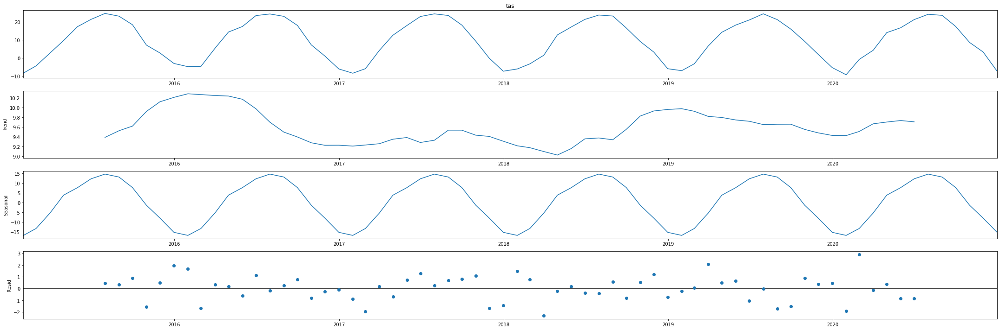

In [ ]:

XJ_ssp126_MPI_ESM1_2_LR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp, model='additive')
fig = XJ_ssp126_MPI_ESM1_2_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_MPI_ESM1_2_LR_model = LinearRegression()
x = XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_MPI_ESM1_2_LR_model.fit(x, y)
XJ_ssp585_MPI_ESM1_2_LR_r_squared =XJ_ssp585_MPI_ESM1_2_LR_model.score(x, y)
XJ_ssp585_MPI_ESM1_2_LR_r_squared

0.9670233640143538

In [ ]:
XJ_ssp126_MPI_ESM1_2_LR_model = LinearRegression()
x = XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_MPI_ESM1_2_LR_model.fit(x, y)
XJ_ssp126_MPI_ESM1_2_LR_r_squared = XJ_ssp126_MPI_ESM1_2_LR_model.score(x, y)
XJ_ssp126_MPI_ESM1_2_LR_r_squared

0.963115152848437

#### seasonal analysis

In [ ]:
month = XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp.index.month
XJ_ssp585_MPI_ESM1_2_LR_winter = pd.concat([XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 1], XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 2],XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 12]])
XJ_ssp585_MPI_ESM1_2_LR_spring = pd.concat([XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 3], XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 4],XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 5]])
XJ_ssp585_MPI_ESM1_2_LR_summer = pd.concat([XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 6], XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 7],XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 8]])
XJ_ssp585_MPI_ESM1_2_LR_fall = pd.concat([XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 9], XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 10],XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp[month == 11]])
XJ_ssp585_MPI_ESM1_2_LR_winter.sort_index()
XJ_ssp585_MPI_ESM1_2_LR_spring.sort_index()
XJ_ssp585_MPI_ESM1_2_LR_summer.sort_index()
XJ_ssp585_MPI_ESM1_2_LR_fall.sort_index()

time
2015-09-30    16.712339
2015-10-31     8.751837
2015-11-30     1.517599
2016-09-30    17.072916
2016-10-31    10.242077
2016-11-30    -0.468617
2017-09-30    15.150499
2017-10-31     9.547206
2017-11-30     0.370864
2018-09-30    18.708361
2018-10-31     9.940466
2018-11-30     2.455962
2019-09-30    17.372735
2019-10-31     9.575666
2019-11-30     0.469841
2020-09-30    17.898691
2020-10-31     8.120067
2020-11-30     1.817241
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp.index.month
XJ_ssp126_MPI_ESM1_2_LR_winter = pd.concat([XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 1], XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 2],XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 12]])
XJ_ssp126_MPI_ESM1_2_LR_spring = pd.concat([XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 3], XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 4],XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 5]])
XJ_ssp126_MPI_ESM1_2_LR_summer = pd.concat([XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 6], XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 7],XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 8]])
XJ_ssp126_MPI_ESM1_2_LR_fall = pd.concat([XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 9], XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 10],XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp[month == 11]])
XJ_ssp126_MPI_ESM1_2_LR_winter.sort_index()
XJ_ssp126_MPI_ESM1_2_LR_spring.sort_index()
XJ_ssp126_MPI_ESM1_2_LR_summer.sort_index()
XJ_ssp126_MPI_ESM1_2_LR_fall.sort_index()

time
2015-09-30    18.331418
2015-10-31     7.090913
2015-11-30     2.732923
2016-09-30    17.971199
2016-10-31     7.178007
2016-11-30     1.062726
2017-09-30    18.140937
2017-10-31     9.238599
2017-11-30    -0.160513
2018-09-30    16.540284
2018-10-31     9.078059
2018-11-30     3.247473
2019-09-30    15.956254
2019-10-31     9.146396
2019-11-30     1.950843
2020-09-30    17.412543
2020-10-31     8.557095
2020-11-30     3.289649
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_MPI_ESM1_2_LR_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5340634982769072
coef:  [[1.22932513]]
intercept:  [15.4383033]


In [ ]:
x = XJ_ssp126_MPI_ESM1_2_LR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8920339511601887
coef:  [[1.0557287]]
intercept:  [20.46853905]


In [ ]:
x = XJ_ssp126_MPI_ESM1_2_LR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.496696833562572
coef:  [[1.1908456]]
intercept:  [15.42081373]


In [ ]:
x = XJ_ssp126_MPI_ESM1_2_LR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9130252364291943
coef:  [[1.20563458]]
intercept:  [16.60569546]


#####ssp585

In [ ]:
x = XJ_ssp585_MPI_ESM1_2_LR_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6074813827245378
coef:  [[1.30070321]]
intercept:  [14.58656248]


In [ ]:
x = XJ_ssp585_MPI_ESM1_2_LR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9344226531924871
coef:  [[1.21213407]]
intercept:  [18.63683473]


In [ ]:
x = XJ_ssp585_MPI_ESM1_2_LR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.21940972103450052
coef:  [[0.81375373]]
intercept:  [24.31166734]


In [ ]:
x = XJ_ssp585_MPI_ESM1_2_LR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9549456673139965
coef:  [[1.18411665]]
intercept:  [16.90432486]


### XJ_NEX_MPI-ESM1-2-HR

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1PvHmHO5AygzQK9pHLsucEhXpa31UPQJB/view?usp=share_link
id = "1PvHmHO5AygzQK9pHLsucEhXpa31UPQJB"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_MPI-ESM1-2-HR.csv')

XJ_ssp585_MPI_ESM1_2_HR = pd.read_csv('XJ_ssp585_MPI-ESM1-2-HR.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_MPI_ESM1_2_HR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-5.434357
2015-01-01,1,39.125,82.375,-5.593079
2015-01-01,2,39.125,82.625,-5.734131
2015-01-01,3,39.125,82.875,-5.556030
2015-01-01,4,39.125,83.125,-5.242188


In [ ]:
XJ_ssp585_MPI_ESM1_2_HR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-5.434357
2015-01-01,1,39.125,82.375,-5.593079
2015-01-01,2,39.125,82.625,-5.734131
2015-01-01,3,39.125,82.875,-5.556030
2015-01-01,4,39.125,83.125,-5.242188
...,...,...,...,...
2020-12-31,315643,36.375,83.875,-14.646423
2020-12-31,315644,36.375,84.125,-14.441132
2020-12-31,315645,36.375,84.375,-13.521027


In [ ]:
XJ_ssp585_MPI_ESM1_2_HR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_MPI_ESM1_2_HR_avg_temp = XJ_ssp585_MPI_ESM1_2_HR.groupby(XJ_ssp585_MPI_ESM1_2_HR.index)['tas'].mean()
XJ_ssp585_MPI_ESM1_2_HR_avg_temp

time
2015-01-01   -8.112726
2015-01-02   -1.784966
2015-01-03   -1.986308
2015-01-04   -5.457210
2015-01-05   -5.990495
                ...   
2020-12-27   -6.702620
2020-12-28   -8.141353
2020-12-29   -7.691372
2020-12-30   -5.325921
2020-12-31   -5.395225
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp = XJ_ssp585_MPI_ESM1_2_HR_avg_temp.resample('M').mean()
XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp

time
2015-01-31    -7.849218
2015-02-28    -5.796928
2015-03-31     1.879415
2015-04-30    11.679852
2015-05-31    15.667318
                ...    
2020-08-31    22.224413
2020-09-30    17.670022
2020-10-31     9.125845
2020-11-30     1.799757
2020-12-31    -4.978488
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1BO0ZxZducEg7vbRsMMqgh16fVvM248lw/view?usp=share_link
id = "1BO0ZxZducEg7vbRsMMqgh16fVvM248lw"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_MPI-ESM1-2-HR_ssp126.csv')

XJ_ssp126_MPI_ESM1_2_HR= pd.read_csv('XJ_MPI-ESM1-2-HR_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_MPI_ESM1_2_HR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-15.495117
2015-01-01,1,36.375,82.375,-18.696579
2015-01-01,2,36.375,82.625,-18.943314
2015-01-01,3,36.375,82.875,-18.259674
2015-01-01,4,36.375,83.125,-20.396180


In [ ]:
XJ_ssp126_MPI_ESM1_2_HR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_MPI_ESM1_2_HR_avg_temp = XJ_ssp126_MPI_ESM1_2_HR.groupby(XJ_ssp126_MPI_ESM1_2_HR.index)['tas'].mean()
XJ_ssp126_MPI_ESM1_2_HR_avg_temp

time
2015-01-01    -8.182377
2015-01-02    -1.617385
2015-01-03    -1.827891
2015-01-04    -5.696989
2015-01-05    -6.097200
                ...    
2020-12-27    -8.106147
2020-12-28   -10.320357
2020-12-29   -10.737972
2020-12-30   -10.891143
2020-12-31   -10.971396
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp = XJ_ssp126_MPI_ESM1_2_HR_avg_temp.resample('M').mean()
XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp 

time
2015-01-31    -8.189944
2015-02-28    -3.234520
2015-03-31     2.225224
2015-04-30    12.070621
2015-05-31    19.065408
                ...    
2020-08-31    22.035975
2020-09-30    17.500335
2020-10-31     9.030676
2020-11-30     1.807752
2020-12-31    -6.877542
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

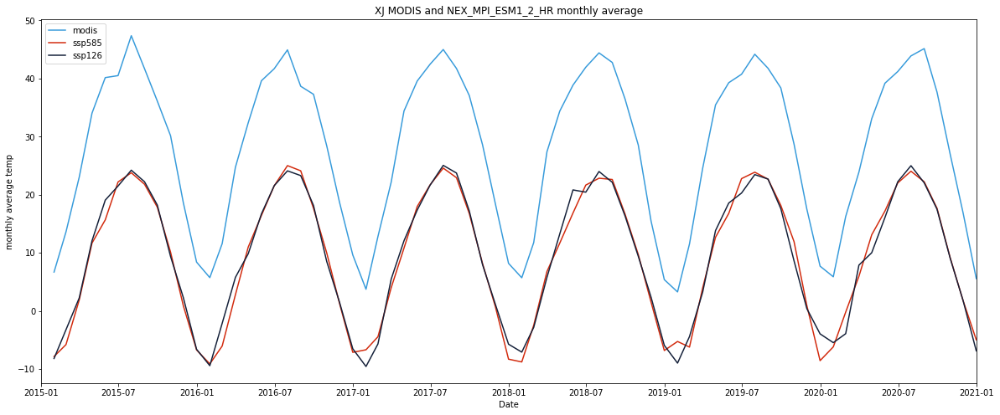

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_MPI_ESM1_2_HR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_MPI_ESM1_2_HR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp)) 
XJ_ssp585_MPI_ESM1_2_HR_monthly_rmse

18.9103190345695

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_MPI_ESM1_2_HR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp)) 
XJ_ssp126_MPI_ESM1_2_HR_monthly_rmse

18.740392262327152

#### time series analysis

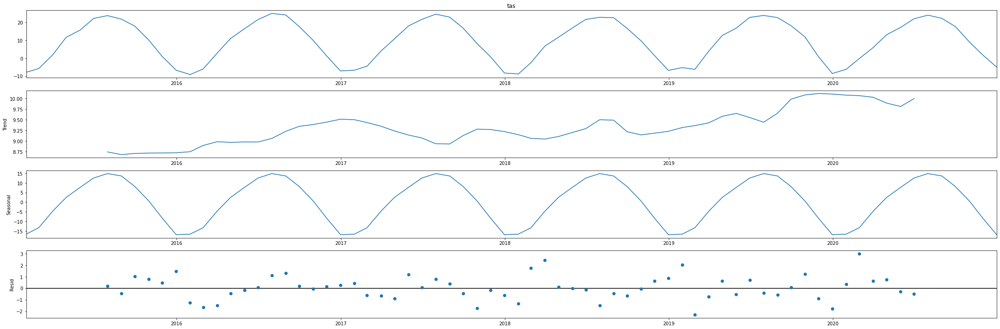

In [ ]:

XJ_ssp585_MPI_ESM1_2_HR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp, model='additive')
fig = XJ_ssp585_MPI_ESM1_2_HR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

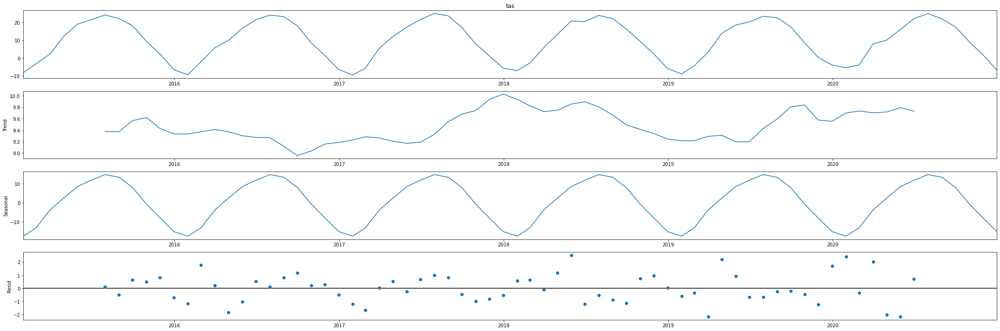

In [ ]:

XJ_ssp126_MPI_ESM1_2_HR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp, model='additive')
fig = XJ_ssp126_MPI_ESM1_2_HR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_MPI_ESM1_2_HR_model = LinearRegression()
x = XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_MPI_ESM1_2_HR_model.fit(x, y)
XJ_ssp585_MPI_ESM1_2_HR_r_squared =XJ_ssp585_MPI_ESM1_2_HR_model.score(x, y)
XJ_ssp585_MPI_ESM1_2_HR_r_squared

0.9654182952903343

In [ ]:
XJ_ssp126_MPI_ESM1_2_HR_model = LinearRegression()
x = XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_MPI_ESM1_2_HR_model.fit(x, y)
XJ_ssp126_MPI_ESM1_2_HR_r_squared = XJ_ssp126_MPI_ESM1_2_HR_model.score(x, y)
XJ_ssp126_MPI_ESM1_2_HR_r_squared

0.9708389300287121

#### seasonal analysis

In [ ]:
month = XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp.index.month
XJ_ssp585_MPI_ESM1_2_HR_winter = pd.concat([XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 1], XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 2],XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 12]])
XJ_ssp585_MPI_ESM1_2_HR_spring = pd.concat([XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 3], XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 4],XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 5]])
XJ_ssp585_MPI_ESM1_2_HR_summer = pd.concat([XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 6], XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 7],XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 8]])
XJ_ssp585_MPI_ESM1_2_HR_fall = pd.concat([XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 9], XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 10],XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp[month == 11]])
XJ_ssp585_MPI_ESM1_2_HR_winter.sort_index()
XJ_ssp585_MPI_ESM1_2_HR_spring.sort_index()
XJ_ssp585_MPI_ESM1_2_HR_summer.sort_index()
XJ_ssp585_MPI_ESM1_2_HR_fall.sort_index()

time
2015-09-30    17.851358
2015-10-31    10.123888
2015-11-30     0.882342
2016-09-30    17.648704
2016-10-31     9.970877
2016-11-30     1.268667
2017-09-30    16.762197
2017-10-31     8.174932
2017-11-30     0.768713
2018-09-30    16.664919
2018-10-31     9.706073
2018-11-30     1.502807
2019-09-30    18.160334
2019-10-31    11.923920
2019-11-30     0.916780
2020-09-30    17.670022
2020-10-31     9.125845
2020-11-30     1.799757
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp.index.month
XJ_ssp126_MPI_ESM1_2_HR_winter = pd.concat([XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 1], XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 2],XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 12]])
XJ_ssp126_MPI_ESM1_2_HR_spring = pd.concat([XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 3], XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 4],XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 5]])
XJ_ssp126_MPI_ESM1_2_HR_summer = pd.concat([XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 6], XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 7],XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 8]])
XJ_ssp126_MPI_ESM1_2_HR_fall = pd.concat([XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 9], XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 10],XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp[month == 11]])
XJ_ssp126_MPI_ESM1_2_HR_winter.sort_index()
XJ_ssp126_MPI_ESM1_2_HR_spring.sort_index()
XJ_ssp126_MPI_ESM1_2_HR_summer.sort_index()
XJ_ssp126_MPI_ESM1_2_HR_fall.sort_index()

time
2015-09-30    18.213608
2015-10-31     9.379204
2015-11-30     2.275141
2016-09-30    18.139081
2016-10-31     8.496759
2016-11-30     1.479732
2017-09-30    17.204894
2017-10-31     7.987556
2017-11-30     1.168604
2018-09-30    16.344300
2018-10-31     9.402030
2018-11-30     2.349324
2019-09-30    17.605169
2019-10-31     8.610888
2019-11-30     0.390339
2020-09-30    17.500335
2020-10-31     9.030676
2020-11-30     1.807752
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_MPI_ESM1_2_HR_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5812036024482654
coef:  [[1.25635638]]
intercept:  [15.95752473]


In [ ]:
x = XJ_ssp126_MPI_ESM1_2_HR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9009294727180734
coef:  [[1.08384601]]
intercept:  [19.91846112]


In [ ]:
x = XJ_ssp126_MPI_ESM1_2_HR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3023827817453112
coef:  [[0.81411342]]
intercept:  [24.25387062]


In [ ]:
x = XJ_ssp126_MPI_ESM1_2_HR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9615135268587557
coef:  [[1.20909074]]
intercept:  [16.53198924]


#####ssp585

In [ ]:
x = XJ_ssp585_MPI_ESM1_2_HR_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.3612760136169426
coef:  [[0.98825618]]
intercept:  [14.6465022]


In [ ]:
x = XJ_ssp585_MPI_ESM1_2_HR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9526305224534521
coef:  [[1.17132095]]
intercept:  [19.73434449]


In [ ]:
x = XJ_ssp585_MPI_ESM1_2_HR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.1657765394502394
coef:  [[0.79951503]]
intercept:  [24.46286413]


In [ ]:
x = XJ_ssp585_MPI_ESM1_2_HR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9746571942321558
coef:  [[1.1896029]]
intercept:  [16.4794703]


### XJ_NEX_MIROC6

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1ZDH9Z95LQ_UzO9gekGowxxAaIbkLLaxo/view?usp=share_link
id = "1ZDH9Z95LQ_UzO9gekGowxxAaIbkLLaxo"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_MIROC6.csv')

XJ_ssp585_MIROC6 = pd.read_csv('XJ_ssp585_MIROC6.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_MIROC6.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-10.670410
2015-01-01,1,39.125,82.375,-10.900238
2015-01-01,2,39.125,82.625,-11.223083
2015-01-01,3,39.125,82.875,-11.337463
2015-01-01,4,39.125,83.125,-11.383362


In [ ]:
XJ_ssp585_MIROC6

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-10.670410
2015-01-01,1,39.125,82.375,-10.900238
2015-01-01,2,39.125,82.625,-11.223083
2015-01-01,3,39.125,82.875,-11.337463
2015-01-01,4,39.125,83.125,-11.383362
...,...,...,...,...
2020-12-31,315643,36.375,83.875,-21.126038
2020-12-31,315644,36.375,84.125,-21.232727
2020-12-31,315645,36.375,84.375,-20.624650


In [ ]:
XJ_ssp585_MIROC6['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_MIROC6_avg_temp = XJ_ssp585_MIROC6.groupby(XJ_ssp585_MIROC6.index)['tas'].mean()
XJ_ssp585_MIROC6_avg_temp

time
2015-01-01   -11.342456
2015-01-02   -11.260417
2015-01-03    -8.739839
2015-01-04    -7.159996
2015-01-05    -7.093369
                ...    
2020-12-27    -8.728799
2020-12-28    -8.931220
2020-12-29   -10.201928
2020-12-30   -10.176541
2020-12-31    -9.997751
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp585_MIROC6_monthly_avg_temp = XJ_ssp585_MIROC6_avg_temp.resample('M').mean()
XJ_ssp585_MIROC6_monthly_avg_temp

time
2015-01-31    -9.590473
2015-02-28    -4.888264
2015-03-31     8.367082
2015-04-30    12.004148
2015-05-31    16.160506
                ...    
2020-08-31    21.655340
2020-09-30    17.838072
2020-10-31    10.415203
2020-11-30     2.392763
2020-12-31    -3.527379
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1tyCOJ_e6lv50zxZ9ID_E_DK4x2J8ivIQ/view?usp=share_link
id = "1tyCOJ_e6lv50zxZ9ID_E_DK4x2J8ivIQ"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_MIROC6.csv')

XJ_ssp126_MIROC6= pd.read_csv('XJ_ssp126_MIROC6.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_MIROC6.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-15.106995
2015-01-01,1,36.375,82.375,-18.144714
2015-01-01,2,36.375,82.625,-18.227478
2015-01-01,3,36.375,82.875,-17.379608
2015-01-01,4,36.375,83.125,-19.399399


In [ ]:
XJ_ssp126_MIROC6['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_MIROC6_avg_temp = XJ_ssp126_MIROC6.groupby(XJ_ssp126_MIROC6.index)['tas'].mean()
XJ_ssp126_MIROC6_avg_temp

time
2015-01-01   -11.284593
2015-01-02   -11.162640
2015-01-03    -8.637852
2015-01-04    -7.038218
2015-01-05    -7.007181
                ...    
2020-12-27    -6.964869
2020-12-28    -5.603730
2020-12-29    -3.298959
2020-12-30    -1.335475
2020-12-31    -2.670076
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_MIROC6_monthly_avg_temp = XJ_ssp126_MIROC6_avg_temp.resample('M').mean()
XJ_ssp126_MIROC6_monthly_avg_temp 

time
2015-01-31   -11.118733
2015-02-28    -8.018728
2015-03-31     4.779915
2015-04-30    12.767274
2015-05-31    17.056560
                ...    
2020-08-31    22.197598
2020-09-30    18.885738
2020-10-31     8.674395
2020-11-30     1.277049
2020-12-31    -4.261141
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

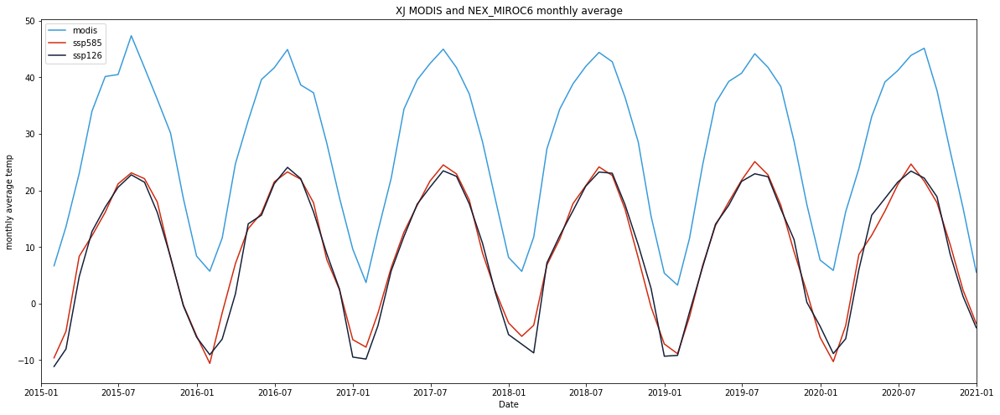

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_MIROC6_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_MIROC6_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_MIROC6 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_MIROC6_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_MIROC6_monthly_avg_temp)) 
XJ_ssp585_MIROC6_monthly_rmse

18.61897359188872

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_MIROC6_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_MIROC6_monthly_avg_temp)) 
XJ_ssp126_MIROC6_monthly_rmse

19.063831177385715

#### time series analysis

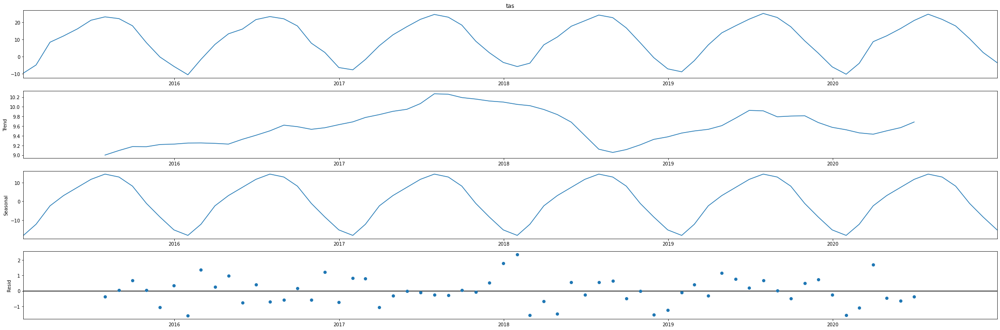

In [ ]:

XJ_ssp585_MIROC6_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_MIROC6_monthly_avg_temp, model='additive')
fig = XJ_ssp585_MIROC6_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

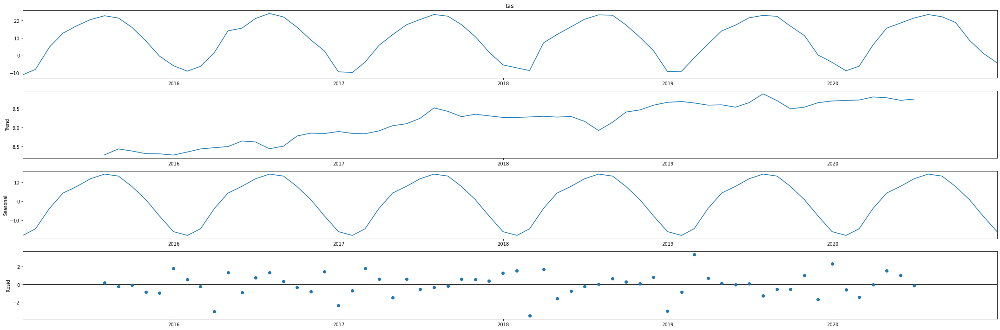

In [ ]:

XJ_ssp126_MIROC6_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_MIROC6_monthly_avg_temp, model='additive')
fig = XJ_ssp126_MIROC6_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_MIROC6_model = LinearRegression()
x = XJ_ssp585_MIROC6_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_MIROC6_model.fit(x, y)
XJ_ssp585_MIROC6_r_squared = XJ_ssp585_MIROC6_model.score(x, y)
XJ_ssp585_MIROC6_r_squared

0.9692703092919721

In [ ]:
XJ_ssp126_MIROC6_model = LinearRegression()
x = XJ_ssp126_MIROC6_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_MIROC6_model.fit(x, y)
XJ_ssp126_MIROC6_r_squared = XJ_ssp126_MIROC6_model.score(x, y)
XJ_ssp126_MIROC6_r_squared

0.9656627161217466

#### seasonal analysis

In [ ]:
month = XJ_ssp585_MIROC6_monthly_avg_temp.index.month
XJ_ssp585_MIROC6_winter = pd.concat([XJ_ssp585_MIROC6_monthly_avg_temp[month == 1], XJ_ssp585_MIROC6_monthly_avg_temp[month == 2],XJ_ssp585_MIROC6_monthly_avg_temp[month == 12]])
XJ_ssp585_MIROC6_spring = pd.concat([XJ_ssp585_MIROC6_monthly_avg_temp[month == 3], XJ_ssp585_MIROC6_monthly_avg_temp[month == 4],XJ_ssp585_MIROC6_monthly_avg_temp[month == 5]])
XJ_ssp585_MIROC6_summer = pd.concat([XJ_ssp585_MIROC6_monthly_avg_temp[month == 6], XJ_ssp585_MIROC6_monthly_avg_temp[month == 7],XJ_ssp585_MIROC6_monthly_avg_temp[month == 8]])
XJ_ssp585_MIROC6_fall = pd.concat([XJ_ssp585_MIROC6_monthly_avg_temp[month == 9], XJ_ssp585_MIROC6_monthly_avg_temp[month == 10],XJ_ssp585_MIROC6_monthly_avg_temp[month == 11]])
XJ_ssp585_MIROC6_winter.sort_index()
XJ_ssp585_MIROC6_spring.sort_index()
XJ_ssp585_MIROC6_summer.sort_index()
XJ_ssp585_MIROC6_fall.sort_index()

time
2015-09-30    17.939786
2015-10-31     8.065290
2015-11-30    -0.241602
2016-09-30    17.842661
2016-10-31     7.803114
2016-11-30     2.412897
2017-09-30    18.321470
2017-10-31     8.944950
2017-11-30     2.277448
2018-09-30    16.694048
2018-10-31     8.048757
2018-11-30    -0.609622
2019-09-30    17.399620
2019-10-31     9.172817
2019-11-30     2.036466
2020-09-30    17.838072
2020-10-31    10.415203
2020-11-30     2.392763
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_MIROC6_monthly_avg_temp.index.month
XJ_ssp126_MIROC6_winter = pd.concat([XJ_ssp126_MIROC6_monthly_avg_temp[month == 1], XJ_ssp126_MIROC6_monthly_avg_temp[month == 2],XJ_ssp126_MIROC6_monthly_avg_temp[month == 12]])
XJ_ssp126_MIROC6_spring = pd.concat([XJ_ssp126_MIROC6_monthly_avg_temp[month == 3], XJ_ssp126_MIROC6_monthly_avg_temp[month == 4],XJ_ssp126_MIROC6_monthly_avg_temp[month == 5]])
XJ_ssp126_MIROC6_summer = pd.concat([XJ_ssp126_MIROC6_monthly_avg_temp[month == 6], XJ_ssp126_MIROC6_monthly_avg_temp[month == 7],XJ_ssp126_MIROC6_monthly_avg_temp[month == 8]])
XJ_ssp126_MIROC6_fall = pd.concat([XJ_ssp126_MIROC6_monthly_avg_temp[month == 9], XJ_ssp126_MIROC6_monthly_avg_temp[month == 10],XJ_ssp126_MIROC6_monthly_avg_temp[month == 11]])
XJ_ssp126_MIROC6_winter.sort_index()
XJ_ssp126_MIROC6_spring.sort_index()
XJ_ssp126_MIROC6_summer.sort_index()
XJ_ssp126_MIROC6_fall.sort_index()

time
2015-09-30    16.106463
2015-10-31     8.243132
2015-11-30    -0.382822
2016-09-30    16.230887
2016-10-31     8.843088
2016-11-30     2.538387
2017-09-30    17.651205
2017-10-31    10.683203
2017-11-30     1.958173
2018-09-30    17.492147
2018-10-31    10.355279
2018-11-30     2.684264
2019-09-30    16.729005
2019-10-31    11.323813
2019-11-30     0.236632
2020-09-30    18.885738
2020-10-31     8.674395
2020-11-30     1.277049
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_MIROC6_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.15734579281332806
coef:  [[0.5661626]]
intercept:  [12.55216678]


In [ ]:
x = XJ_ssp126_MIROC6_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8952505411583946
coef:  [[1.17896307]]
intercept:  [18.47138746]


In [ ]:
x = XJ_ssp126_MIROC6_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3648920644971718
coef:  [[1.19640702]]
intercept:  [16.19608822]


In [ ]:
x = XJ_ssp126_MIROC6_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9533242458052462
coef:  [[1.20295733]]
intercept:  [16.44569622]


#####ssp585

In [ ]:
x = XJ_ssp585_MIROC6_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.45339092555494576
coef:  [[0.87156727]]
intercept:  [13.51544549]


In [ ]:
x = XJ_ssp585_MIROC6_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9082223294964061
coef:  [[1.51641506]]
intercept:  [13.95677292]


In [ ]:
x = XJ_ssp585_MIROC6_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.33010633606084194
coef:  [[0.92443198]]
intercept:  [21.87529998]


In [ ]:
x = XJ_ssp585_MIROC6_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9517230470958082
coef:  [[1.16846221]]
intercept:  [16.95077917]


### XJ_NEX_MIROC-ES2L

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1x91kWVoIo1Aw0dkfVtaA_hYC7ddqZ9rh/view?usp=share_link
id = "1x91kWVoIo1Aw0dkfVtaA_hYC7ddqZ9rh"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_MIROC-ES2L.csv')

XJ_ssp585_MIROC_ES2L = pd.read_csv('XJ_ssp585_MIROC-ES2L.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_MIROC_ES2L.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-8.494019
2015-01-01,1,39.125,82.375,-8.651550
2015-01-01,2,39.125,82.625,-8.902100
2015-01-01,3,39.125,82.875,-8.944153
2015-01-01,4,39.125,83.125,-8.850555


In [ ]:
XJ_ssp585_MIROC_ES2L

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-8.494019
2015-01-01,1,39.125,82.375,-8.651550
2015-01-01,2,39.125,82.625,-8.902100
2015-01-01,3,39.125,82.875,-8.944153
2015-01-01,4,39.125,83.125,-8.850555
...,...,...,...,...
2020-12-31,315643,36.375,83.875,-14.626099
2020-12-31,315644,36.375,84.125,-14.726562
2020-12-31,315645,36.375,84.375,-14.112183


In [ ]:
XJ_ssp585_MIROC_ES2L['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_MIROC_ES2L_avg_temp = XJ_ssp585_MIROC_ES2L.groupby(XJ_ssp585_MIROC_ES2L.index)['tas'].mean()
XJ_ssp585_MIROC_ES2L_avg_temp

time
2015-01-01   -13.197267
2015-01-02   -13.713862
2015-01-03    -7.826311
2015-01-04    -6.655129
2015-01-05    -9.720837
                ...    
2020-12-27    -8.824937
2020-12-28    -9.108097
2020-12-29   -11.557889
2020-12-30   -11.433535
2020-12-31    -5.790302
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp585_MIROC_ES2L_monthly_avg_temp = XJ_ssp585_MIROC_ES2L_avg_temp.resample('M').mean()
XJ_ssp585_MIROC_ES2L_monthly_avg_temp

time
2015-01-31    -4.931751
2015-02-28    -1.821714
2015-03-31     7.310615
2015-04-30    13.426105
2015-05-31    16.936655
                ...    
2020-08-31    23.074393
2020-09-30    17.881788
2020-10-31    10.553334
2020-11-30     3.677877
2020-12-31    -4.661670
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/15ZRqUQruX5yQVYWLLJCkk5Fuvas5W51W/view?usp=share_link
id = "15ZRqUQruX5yQVYWLLJCkk5Fuvas5W51W"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_MIROC-ES2L_ssp126.csv')

XJ_ssp126_MIROC_ES2L= pd.read_csv('XJ_MIROC-ES2L_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_MIROC_ES2L.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-20.602768
2015-01-01,1,36.375,82.375,-23.890121
2015-01-01,2,36.375,82.625,-24.222534
2015-01-01,3,36.375,82.875,-23.624298
2015-01-01,4,36.375,83.125,-25.846207


In [ ]:
XJ_ssp126_MIROC_ES2L['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_MIROC_ES2L_avg_temp = XJ_ssp126_MIROC_ES2L.groupby(XJ_ssp126_MIROC_ES2L.index)['tas'].mean()
XJ_ssp126_MIROC_ES2L_avg_temp

time
2015-01-01   -13.243953
2015-01-02   -13.523912
2015-01-03    -9.106036
2015-01-04    -6.708934
2015-01-05    -9.814453
                ...    
2020-12-27    -6.544724
2020-12-28    -5.491862
2020-12-29    -7.709998
2020-12-30    -8.667716
2020-12-31    -9.770913
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_MIROC_ES2L_monthly_avg_temp = XJ_ssp126_MIROC_ES2L_avg_temp.resample('M').mean()
XJ_ssp126_MIROC_ES2L_monthly_avg_temp 

time
2015-01-31    -5.568620
2015-02-28    -1.742684
2015-03-31     7.700372
2015-04-30    13.523645
2015-05-31    18.342119
                ...    
2020-08-31    22.366993
2020-09-30    17.641253
2020-10-31     9.995272
2020-11-30     2.248550
2020-12-31    -2.767444
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

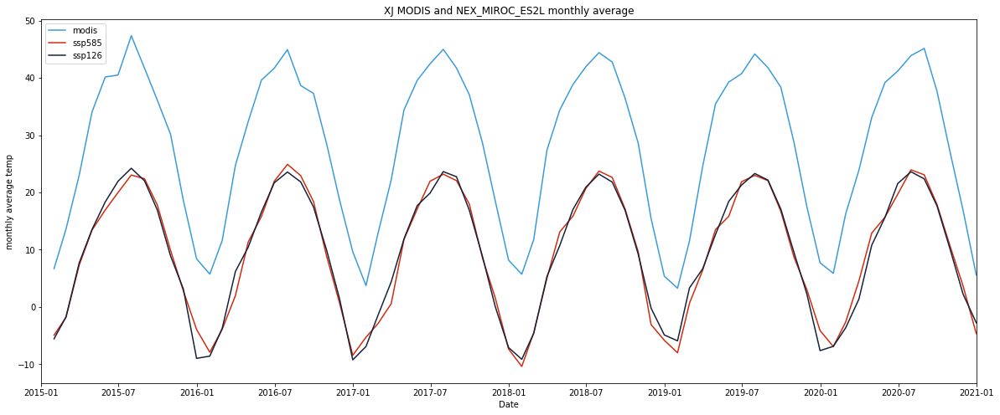

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_MIROC_ES2L_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_MIROC_ES2L_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_MIROC_ES2L monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_MIROC_ES2L_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_MIROC_ES2L_monthly_avg_temp)) 
XJ_ssp585_MIROC_ES2L_monthly_rmse

18.837180229019413

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_MIROC_ES2L_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_MIROC_ES2L_monthly_avg_temp)) 
XJ_ssp126_MIROC_ES2L_monthly_rmse

18.84428394679405

#### time series analysis

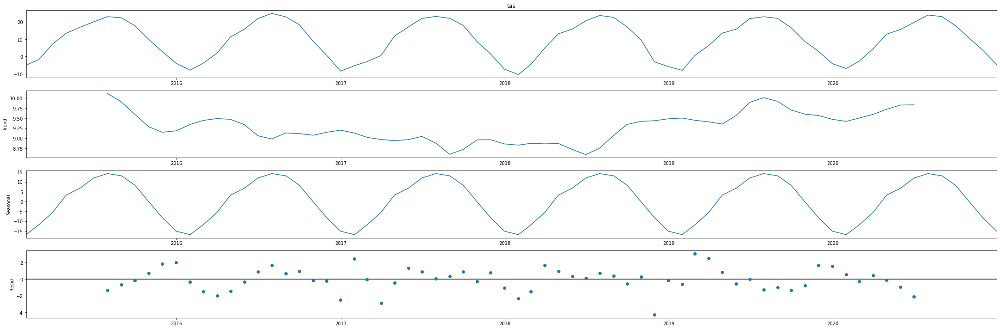

In [ ]:

XJ_ssp585_MIROC_ES2L_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_MIROC_ES2L_monthly_avg_temp, model='additive')
fig = XJ_ssp585_MIROC_ES2L_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

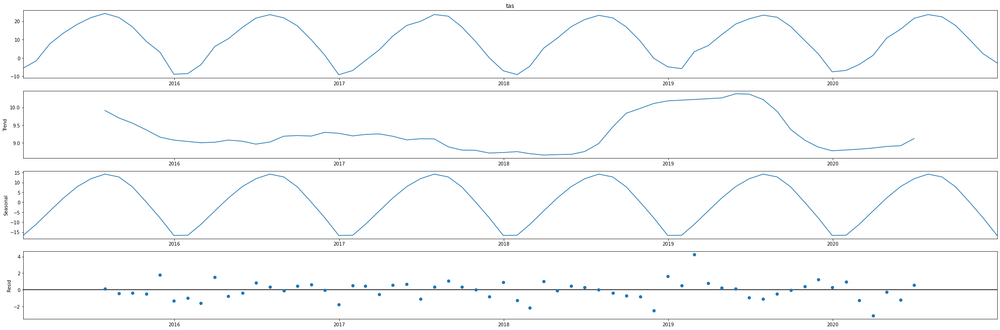

In [ ]:

XJ_ssp126_MIROC_ES2L_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_MIROC_ES2L_monthly_avg_temp, model='additive')
fig = XJ_ssp126_MIROC_ES2L_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_MIROC_ES2L_model = LinearRegression()
x = XJ_ssp585_MIROC_ES2L_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_MIROC_ES2L_model.fit(x, y)
XJ_ssp585_MIROC_ES2L_r_squared =XJ_ssp585_MIROC_ES2L_model.score(x, y)
XJ_ssp585_MIROC_ES2L_r_squared

0.9616301822061541

In [ ]:
XJ_ssp126_MIROC_ES2L_model = LinearRegression()
x = XJ_ssp126_MIROC_ES2L_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_MIROC_ES2L_model.fit(x, y)
XJ_ssp126_MIROC_ES2L_r_squared = XJ_ssp126_MIROC_ES2L_model.score(x, y)
XJ_ssp126_MIROC_ES2L_r_squared

0.9602275174339507

#### seasonal analysis

In [ ]:
month = XJ_ssp585_MIROC_ES2L_monthly_avg_temp.index.month
XJ_ssp585_MIROC_ES2L_winter = pd.concat([XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 1], XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 2],XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 12]])
XJ_ssp585_MIROC_ES2L_spring = pd.concat([XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 3], XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 4],XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 5]])
XJ_ssp585_MIROC_ES2L_summer = pd.concat([XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 6], XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 7],XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 8]])
XJ_ssp585_MIROC_ES2L_fall = pd.concat([XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 9], XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 10],XJ_ssp585_MIROC_ES2L_monthly_avg_temp[month == 11]])
XJ_ssp585_MIROC_ES2L_winter.sort_index()
XJ_ssp585_MIROC_ES2L_spring.sort_index()
XJ_ssp585_MIROC_ES2L_summer.sort_index()
XJ_ssp585_MIROC_ES2L_fall.sort_index()

time
2015-09-30    17.795869
2015-10-31     9.883102
2015-11-30     2.799947
2016-09-30    18.396185
2016-10-31     8.792358
2016-11-30     0.693814
2017-09-30    17.975370
2017-10-31     8.536200
2017-11-30     1.538762
2018-09-30    17.117535
2018-10-31     9.599091
2018-11-30    -3.082739
2019-09-30    16.720129
2019-10-31     8.672306
2019-11-30     3.025364
2020-09-30    17.881788
2020-10-31    10.553334
2020-11-30     3.677877
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_MIROC_ES2L_monthly_avg_temp.index.month
XJ_ssp126_MIROC_ES2L_winter = pd.concat([XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 1], XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 2],XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 12]])
XJ_ssp126_MIROC_ES2L_spring = pd.concat([XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 3], XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 4],XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 5]])
XJ_ssp126_MIROC_ES2L_summer = pd.concat([XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 6], XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 7],XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 8]])
XJ_ssp126_MIROC_ES2L_fall = pd.concat([XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 9], XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 10],XJ_ssp126_MIROC_ES2L_monthly_avg_temp[month == 11]])
XJ_ssp126_MIROC_ES2L_winter.sort_index()
XJ_ssp126_MIROC_ES2L_spring.sort_index()
XJ_ssp126_MIROC_ES2L_summer.sort_index()
XJ_ssp126_MIROC_ES2L_fall.sort_index()

time
2015-09-30    16.929022
2015-10-31     8.908397
2015-11-30     3.132134
2016-09-30    17.452767
2016-10-31     9.847638
2016-11-30     1.421727
2017-09-30    16.904468
2017-10-31     8.802286
2017-11-30     0.022152
2018-09-30    16.884107
2018-10-31     9.167784
2018-11-30    -0.216842
2019-09-30    17.089115
2019-10-31     9.482190
2019-11-30     2.264438
2020-09-30    17.641253
2020-10-31     9.995272
2020-11-30     2.248550
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_MIROC_ES2L_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.2648919204783484
coef:  [[0.5777713]]
intercept:  [11.58744233]


In [ ]:
x = XJ_ssp126_MIROC_ES2L_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8975413975946073
coef:  [[1.17718796]]
intercept:  [19.13692679]


In [ ]:
x = XJ_ssp126_MIROC_ES2L_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4692849551118117
coef:  [[1.29546517]]
intercept:  [13.87042135]


In [ ]:
x = XJ_ssp126_MIROC_ES2L_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9721115705220215
coef:  [[1.23336668]]
intercept:  [16.26574261]


#####ssp585

In [ ]:
x = XJ_ssp585_MIROC_ES2L_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.4139982248947629
coef:  [[0.87837204]]
intercept:  [13.05658449]


In [ ]:
x = XJ_ssp585_MIROC_ES2L_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9160801931280569
coef:  [[1.1704354]]
intercept:  [19.61919632]


In [ ]:
x = XJ_ssp585_MIROC_ES2L_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3436819919288284
coef:  [[0.94074329]]
intercept:  [21.71772297]


In [ ]:
x = XJ_ssp585_MIROC_ES2L_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9501053910755065
coef:  [[1.16163902]]
intercept:  [16.76732526]


### XJ_NEX_KIOST-ESM

#### ssp585

In [ ]:
#https://drive.google.com/file/d/18y--r18u726yAWhKS26j8XYs1dsGWYi9/view?usp=share_link
id = "18y--r18u726yAWhKS26j8XYs1dsGWYi9"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_KIOST-ESM.csv')

XJ_ssp585_KIOST_ESM = pd.read_csv('XJ_ssp585_KIOST-ESM.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_KIOST_ESM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.862488
2015-01-01,39.125,82.375,-4.759491
2015-01-01,39.125,82.625,-4.749512
2015-01-01,39.125,82.875,-4.531006
2015-01-01,39.125,83.125,-4.176880


In [ ]:
XJ_ssp585_KIOST_ESM

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.862488
2015-01-01,39.125,82.375,-4.759491
2015-01-01,39.125,82.625,-4.749512
2015-01-01,39.125,82.875,-4.531006
2015-01-01,39.125,83.125,-4.176880
...,...,...,...
2020-12-29,36.375,83.875,-13.948944
2020-12-29,36.375,84.125,-13.844421
2020-12-29,36.375,84.375,-13.025269


In [ ]:
XJ_ssp585_KIOST_ESM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_KIOST_ESM_avg_temp = XJ_ssp585_KIOST_ESM.groupby(XJ_ssp585_KIOST_ESM.index)['tas'].mean()
XJ_ssp585_KIOST_ESM_avg_temp

time
2015-01-01    -6.188082
2015-01-02    -5.326344
2015-01-03    -5.850604
2015-01-04    -9.846139
2015-01-05   -11.099281
                ...    
2020-12-25    -4.948781
2020-12-26    -3.361629
2020-12-27    -2.785119
2020-12-28    -1.262980
2020-12-29    -1.714109
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_KIOST_ESM_monthly_avg_temp = XJ_ssp585_KIOST_ESM_avg_temp.resample('M').mean()
XJ_ssp585_KIOST_ESM_monthly_avg_temp

time
2015-01-31    -9.802696
2015-02-28    -1.709878
2015-03-31     6.094745
2015-04-30    12.346497
2015-05-31    18.799073
                ...    
2020-08-31    25.438593
2020-09-30    18.775216
2020-10-31    10.468645
2020-11-30     0.213777
2020-12-31    -6.630812
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1cWOt3pQJr90uJxEFg_7XzsDl9ZgvxTzl/view?usp=share_link
id = "1cWOt3pQJr90uJxEFg_7XzsDl9ZgvxTzl"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_KIOST-ESM.csv')

XJ_ssp126_KIOST_ESM= pd.read_csv('XJ_ssp126_KIOST-ESM.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_KIOST_ESM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.305481
2015-01-01,39.125,82.375,-3.369812
2015-01-01,39.125,82.625,-3.527161
2015-01-01,39.125,82.875,-3.475983
2015-01-01,39.125,83.125,-3.289154


In [ ]:
XJ_ssp126_KIOST_ESM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_KIOST_ESM_avg_temp = XJ_ssp126_KIOST_ESM.groupby(XJ_ssp126_KIOST_ESM.index)['tas'].mean()
XJ_ssp126_KIOST_ESM_avg_temp

time
2015-01-01    -5.843116
2015-01-02    -5.136911
2015-01-03    -5.218160
2015-01-04    -9.199146
2015-01-05   -10.858870
                ...    
2020-12-25    -3.422293
2020-12-26    -5.310003
2020-12-27    -5.191009
2020-12-28    -4.290043
2020-12-29    -4.044675
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_KIOST_ESM_monthly_avg_temp = XJ_ssp126_KIOST_ESM_avg_temp.resample('M').mean()
XJ_ssp126_KIOST_ESM_monthly_avg_temp 

time
2015-01-31    -9.664953
2015-02-28    -1.681774
2015-03-31     6.090234
2015-04-30    15.092758
2015-05-31    17.488593
                ...    
2020-08-31    23.773088
2020-09-30    17.811621
2020-10-31    10.171426
2020-11-30     1.454346
2020-12-31    -2.653185
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

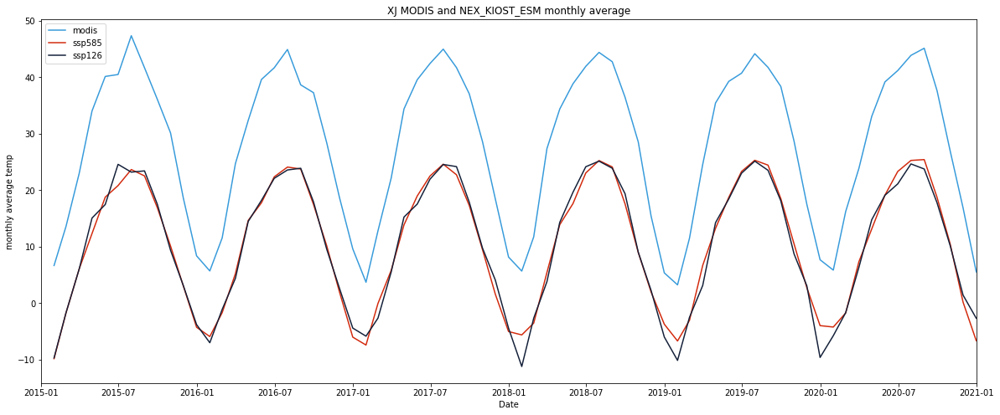

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_KIOST_ESM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_KIOST_ESM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_KIOST_ESM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_KIOST_ESM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_KIOST_ESM_monthly_avg_temp)) 
XJ_ssp585_KIOST_ESM_monthly_rmse

17.759778377477996

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_KIOST_ESM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_KIOST_ESM_monthly_avg_temp)) 
XJ_ssp126_KIOST_ESM_monthly_rmse

17.87843620147996

#### time series analysis

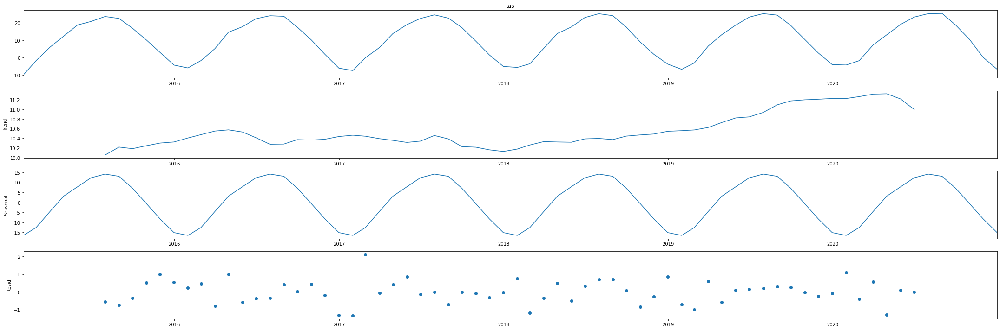

In [ ]:

XJ_ssp585_KIOST_ESM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_KIOST_ESM_monthly_avg_temp, model='additive')
fig = XJ_ssp585_KIOST_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

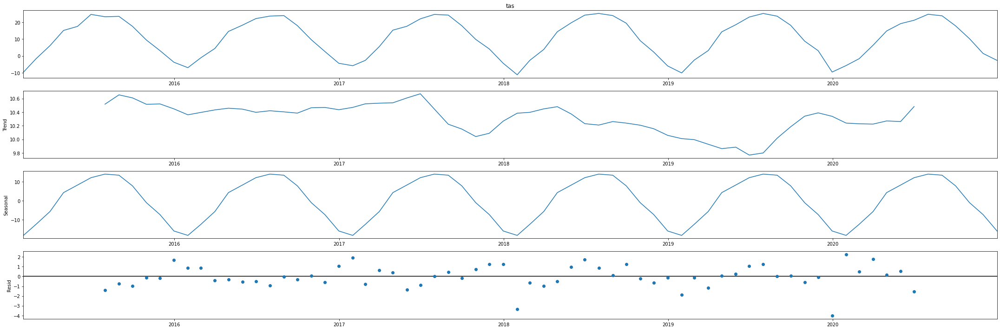

In [ ]:

XJ_ssp126_KIOST_ESM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_KIOST_ESM_monthly_avg_temp, model='additive')
fig = XJ_ssp126_KIOST_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_KIOST_ESM_model = LinearRegression()
x = XJ_ssp585_KIOST_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_KIOST_ESM_model.fit(x, y)
XJ_ssp585_KIOST_ESM_r_squared =XJ_ssp585_KIOST_ESM_model.score(x, y)
XJ_ssp585_KIOST_ESM_r_squared

0.973801036398718

In [ ]:
XJ_ssp126_KIOST_ESM_model = LinearRegression()
x = XJ_ssp126_KIOST_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_KIOST_ESM_model.fit(x, y)
XJ_ssp126_KIOST_ESM_r_squared = XJ_ssp126_KIOST_ESM_model.score(x, y)
XJ_ssp126_KIOST_ESM_r_squared

0.966777588941063

#### seasonal analysis

In [ ]:
month = XJ_ssp585_KIOST_ESM_monthly_avg_temp.index.month
XJ_ssp585_KIOST_ESM_winter = pd.concat([XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 1], XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 2],XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 12]])
XJ_ssp585_KIOST_ESM_spring = pd.concat([XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 3], XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 4],XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 5]])
XJ_ssp585_KIOST_ESM_summer = pd.concat([XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 6], XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 7],XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 8]])
XJ_ssp585_KIOST_ESM_fall = pd.concat([XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 9], XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 10],XJ_ssp585_KIOST_ESM_monthly_avg_temp[month == 11]])
XJ_ssp585_KIOST_ESM_winter.sort_index()
XJ_ssp585_KIOST_ESM_spring.sort_index()
XJ_ssp585_KIOST_ESM_summer.sort_index()
XJ_ssp585_KIOST_ESM_fall.sort_index()

time
2015-09-30    16.923947
2015-10-31    10.135630
2015-11-30     3.057668
2016-09-30    17.486436
2016-10-31    10.163101
2016-11-30     1.963579
2017-09-30    17.302831
2017-10-31     9.492368
2017-11-30     1.618827
2018-09-30    17.602051
2018-10-31     8.993828
2018-11-30     1.998163
2019-09-30    18.532741
2019-10-31    10.524081
2019-11-30     2.755457
2020-09-30    18.775216
2020-10-31    10.468645
2020-11-30     0.213777
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_KIOST_ESM_monthly_avg_temp.index.month
XJ_ssp126_KIOST_ESM_winter = pd.concat([XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 1], XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 2],XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 12]])
XJ_ssp126_KIOST_ESM_spring = pd.concat([XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 3], XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 4],XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 5]])
XJ_ssp126_KIOST_ESM_summer = pd.concat([XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 6], XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 7],XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 8]])
XJ_ssp126_KIOST_ESM_fall = pd.concat([XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 9], XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 10],XJ_ssp126_KIOST_ESM_monthly_avg_temp[month == 11]])
XJ_ssp126_KIOST_ESM_winter.sort_index()
XJ_ssp126_KIOST_ESM_spring.sort_index()
XJ_ssp126_KIOST_ESM_summer.sort_index()
XJ_ssp126_KIOST_ESM_fall.sort_index()

time
2015-09-30    17.536000
2015-10-31     9.387562
2015-11-30     3.125805
2016-09-30    17.953993
2016-10-31     9.566196
2016-11-30     2.620003
2017-09-30    17.885326
2017-10-31     9.767530
2017-11-30     4.117599
2018-09-30    19.396825
2018-10-31     9.028962
2018-11-30     2.273113
2019-09-30    18.135991
2019-10-31     8.744994
2019-11-30     3.087065
2020-09-30    17.811621
2020-10-31    10.171426
2020-11-30     1.454346
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_KIOST_ESM_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5158718938799993
coef:  [[0.8218775]]
intercept:  [12.74035602]


In [ ]:
x = XJ_ssp126_KIOST_ESM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9108896765669575
coef:  [[1.05381012]]
intercept:  [19.20847614]


In [ ]:
x = XJ_ssp126_KIOST_ESM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.059423733930475287
coef:  [[0.47374162]]
intercept:  [31.56202296]


In [ ]:
x = XJ_ssp126_KIOST_ESM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9585031789509633
coef:  [[1.24999161]]
intercept:  [15.13227869]


#####ssp585

In [ ]:
x = XJ_ssp585_KIOST_ESM_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5722782832064128
coef:  [[1.15221177]]
intercept:  [13.68501442]


In [ ]:
x = XJ_ssp585_KIOST_ESM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9384332514309961
coef:  [[1.19904045]]
intercept:  [17.30745058]


In [ ]:
x = XJ_ssp585_KIOST_ESM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.30619160434337234
coef:  [[0.93638045]]
intercept:  [20.57069727]


In [ ]:
x = XJ_ssp585_KIOST_ESM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9778291271639656
coef:  [[1.22527607]]
intercept:  [15.65836475]


### XJ_NEX_KACE-1-0-G

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1FzFn9E6CDp4SdOtfXyPtNP6b8AJ1vkrG/view?usp=share_link
id = "1FzFn9E6CDp4SdOtfXyPtNP6b8AJ1vkrG"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_KACE-1-0-G.csv')

XJ_ssp585_KACE_1_0_G = pd.read_csv('XJ_ssp585_KACE-1-0-G.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_KACE_1_0_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-16.076965
2015-01-01,39.125,82.375,-16.182617
2015-01-01,39.125,82.625,-16.381256
2015-01-01,39.125,82.875,-16.371399
2015-01-01,39.125,83.125,-16.225891


In [ ]:
XJ_ssp585_KACE_1_0_G

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-16.076965
2015-01-01,39.125,82.375,-16.182617
2015-01-01,39.125,82.625,-16.381256
2015-01-01,39.125,82.875,-16.371399
2015-01-01,39.125,83.125,-16.225891
...,...,...,...
2020-11-29,36.375,83.875,-16.430359
2020-11-29,36.375,84.125,-16.570282
2020-11-29,36.375,84.375,-15.996521


In [ ]:
XJ_ssp585_KACE_1_0_G['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_KACE_1_0_G_avg_temp = XJ_ssp585_KACE_1_0_G.groupby(XJ_ssp585_KACE_1_0_G.index)['tas'].mean()
XJ_ssp585_KACE_1_0_G_avg_temp

time
2015-01-01   -12.677896
2015-01-02   -10.940203
2015-01-03   -10.578442
2015-01-04    -9.762784
2015-01-05    -9.285655
                ...    
2020-11-25    -5.300992
2020-11-26    -5.880627
2020-11-27    -6.666332
2020-11-28    -4.962358
2020-11-29    -5.634535
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp585_KACE_1_0_G_monthly_avg_temp = XJ_ssp585_KACE_1_0_G_avg_temp.resample('M').mean()
XJ_ssp585_KACE_1_0_G_monthly_avg_temp

time
2015-01-31   -10.518436
2015-02-28    -5.651077
2015-03-31     6.365546
2015-04-30    14.296079
2015-05-31    16.261765
                ...    
2020-07-31    23.806596
2020-08-31    18.083908
2020-09-30     8.938833
2020-10-31     2.405843
2020-11-30    -3.595365
Freq: M, Name: tas, Length: 71, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1oG0QVb8eezKSuh8xfB4wfB11k8qcoDyZ/view?usp=share_link
id = "1oG0QVb8eezKSuh8xfB4wfB11k8qcoDyZ"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_KACE-1-0-G.csv')

XJ_ssp126_KACE_1_0_G= pd.read_csv('XJ_ssp126_KACE-1-0-G.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_KACE_1_0_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-14.723022
2015-01-01,39.125,82.375,-14.787781
2015-01-01,39.125,82.625,-14.945557
2015-01-01,39.125,82.875,-14.894897
2015-01-01,39.125,83.125,-14.708496


In [ ]:
XJ_ssp126_KACE_1_0_G['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_KACE_1_0_G_avg_temp = XJ_ssp126_KACE_1_0_G.groupby(XJ_ssp126_KACE_1_0_G.index)['tas'].mean()
XJ_ssp126_KACE_1_0_G_avg_temp

time
2015-01-01   -12.330291
2015-01-02   -10.951448
2015-01-03   -10.456583
2015-01-04    -9.677638
2015-01-05    -9.229708
                ...    
2020-11-25    -7.993162
2020-11-26    -5.916207
2020-11-27    -5.764140
2020-11-28    -7.467443
2020-11-29    -8.150195
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp126_KACE_1_0_G_monthly_avg_temp = XJ_ssp126_KACE_1_0_G_avg_temp.resample('M').mean()
XJ_ssp126_KACE_1_0_G_monthly_avg_temp 

time
2015-01-31   -10.219241
2015-02-28    -6.919933
2015-03-31     5.922726
2015-04-30    14.225610
2015-05-31    18.742720
                ...    
2020-07-31    23.957023
2020-08-31    18.318714
2020-09-30     9.354092
2020-10-31     1.574892
2020-11-30    -4.928763
Freq: M, Name: tas, Length: 71, dtype: float64

#### compare modis with ssp585 and ssp126

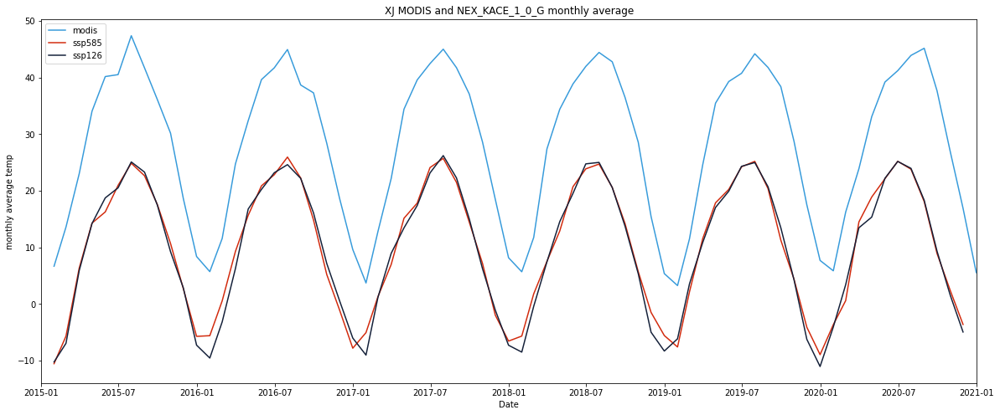

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_KACE_1_0_G_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_KACE_1_0_G_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_KACE_1_0_G monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_KACE_1_0_G_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp585_KACE_1_0_G_monthly_avg_temp)) 
XJ_ssp585_KACE_1_0_G_monthly_rmse

18.603571077238826

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_KACE_1_0_G_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp126_KACE_1_0_G_monthly_avg_temp)) 
XJ_ssp126_KACE_1_0_G_monthly_rmse

18.857916061163436

#### time series analysis

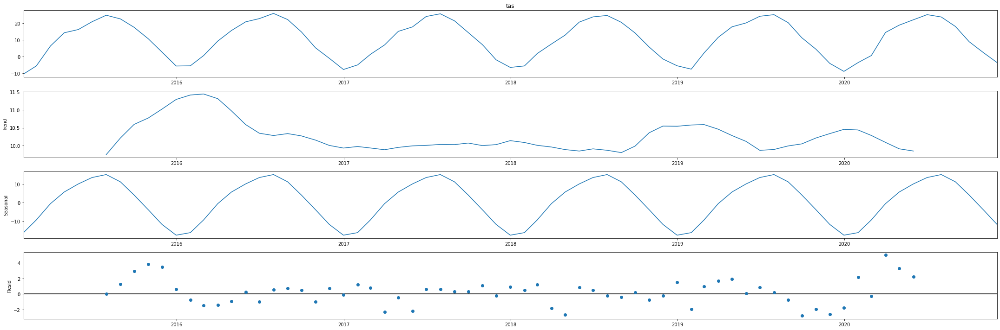

In [ ]:

XJ_ssp585_KACE_1_0_G_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_KACE_1_0_G_monthly_avg_temp, model='additive')
fig = XJ_ssp585_KACE_1_0_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

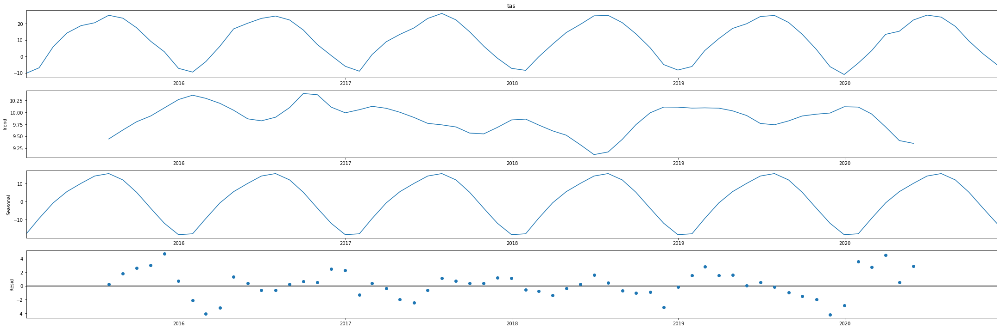

In [ ]:

XJ_ssp126_KACE_1_0_G_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_KACE_1_0_G_monthly_avg_temp, model='additive')
fig = XJ_ssp126_KACE_1_0_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_KACE_1_0_G_model = LinearRegression()
x = XJ_ssp585_KACE_1_0_G_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
XJ_ssp585_KACE_1_0_G_model.fit(x, y)
XJ_ssp585_KACE_1_0_G_r_squared =XJ_ssp585_KACE_1_0_G_model.score(x, y)
XJ_ssp585_KACE_1_0_G_r_squared

0.9043798190626489

In [ ]:
XJ_ssp126_KACE_1_0_G_model = LinearRegression()
x = XJ_ssp126_KACE_1_0_G_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)


In [ ]:
XJ_ssp126_KACE_1_0_G_model.fit(x, y)
XJ_ssp126_KACE_1_0_G_r_squared = XJ_ssp126_KACE_1_0_G_model.score(x, y)
XJ_ssp126_KACE_1_0_G_r_squared

0.9171708138173654

#### seasonal analysis

In [ ]:
month = XJ_ssp585_KACE_1_0_G_monthly_avg_temp.index.month
XJ_ssp585_KACE_1_0_G_winter = pd.concat([XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 1], XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 2],XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 12]])
XJ_ssp585_KACE_1_0_G_spring = pd.concat([XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 3], XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 4],XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 5]])
XJ_ssp585_KACE_1_0_G_summer = pd.concat([XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 6], XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 7],XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 8]])
XJ_ssp585_KACE_1_0_G_fall = pd.concat([XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 9], XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 10],XJ_ssp585_KACE_1_0_G_monthly_avg_temp[month == 11]])
XJ_ssp585_KACE_1_0_G_winter.sort_index()
XJ_ssp585_KACE_1_0_G_spring.sort_index()
XJ_ssp585_KACE_1_0_G_summer.sort_index()
XJ_ssp585_KACE_1_0_G_fall.sort_index()

time
2015-09-30    17.588266
2015-10-31    10.688593
2015-11-30     2.702761
2016-09-30    14.840493
2016-10-31     5.228812
2016-11-30    -1.034459
2017-09-30    14.450820
2017-10-31     7.176678
2017-11-30    -1.954300
2018-09-30    14.203117
2018-10-31     5.708243
2018-11-30    -1.470150
2019-09-30    11.289752
2019-10-31     4.373725
2019-11-30    -4.088907
2020-09-30     8.938833
2020-10-31     2.405843
2020-11-30    -3.595365
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_KACE_1_0_G_monthly_avg_temp.index.month
XJ_ssp126_KACE_1_0_G_winter = pd.concat([XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 1], XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 2],XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 12]])
XJ_ssp126_KACE_1_0_G_spring = pd.concat([XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 3], XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 4],XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 5]])
XJ_ssp126_KACE_1_0_G_summer = pd.concat([XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 6], XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 7],XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 8]])
XJ_ssp126_KACE_1_0_G_fall = pd.concat([XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 9], XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 10],XJ_ssp126_KACE_1_0_G_monthly_avg_temp[month == 11]])
XJ_ssp126_KACE_1_0_G_winter.sort_index()
XJ_ssp126_KACE_1_0_G_spring.sort_index()
XJ_ssp126_KACE_1_0_G_summer.sort_index()
XJ_ssp126_KACE_1_0_G_fall.sort_index()

time
2015-09-30    17.484150
2015-10-31     9.235939
2015-11-30     2.845569
2016-09-30    16.092686
2016-10-31     7.176001
2016-11-30     0.606837
2017-09-30    15.029529
2017-10-31     6.246134
2017-11-30    -1.070000
2018-09-30    13.748786
2018-10-31     5.352117
2018-11-30    -4.968341
2019-09-30    13.480867
2019-10-31     4.267459
2019-11-30    -6.221746
2020-09-30     9.354092
2020-10-31     1.574892
2020-11-30    -4.928763
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_KACE_1_0_G_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.516924011153771
coef:  [[0.57419761]]
intercept:  [11.7156227]


In [ ]:
x = XJ_ssp126_KACE_1_0_G_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7969952079487458
coef:  [[1.17211456]]
intercept:  [15.47791654]


In [ ]:
x = XJ_ssp126_KACE_1_0_G_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.07078037790924097
coef:  [[0.26778024]]
intercept:  [36.55629957]


In [ ]:
x = XJ_ssp126_KACE_1_0_G_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8752489377604517
coef:  [[1.03526079]]
intercept:  [21.71891913]


#####ssp585

In [ ]:
x = XJ_ssp585_KACE_1_0_G_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.40598675220541236
coef:  [[0.59164516]]
intercept:  [11.18756565]


In [ ]:
x = XJ_ssp585_KACE_1_0_G_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7339932618747007
coef:  [[1.12505057]]
intercept:  [15.74887871]


In [ ]:
x = XJ_ssp585_KACE_1_0_G_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.0761841973407077
coef:  [[0.26955786]]
intercept:  [36.53648168]


In [ ]:
x = XJ_ssp585_KACE_1_0_G_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8586287528326686
coef:  [[1.11997967]]
intercept:  [21.08972393]


### XJ_NEX_IPSL-CM6A-LR

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1M1i8LX3nlb3BHokZSBUX_k0kWUNR4Pzj/view?usp=share_link
id = "1M1i8LX3nlb3BHokZSBUX_k0kWUNR4Pzj"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_IPSL-CM6A-LR.csv')

XJ_ssp585_IPSL_CM6A_LR = pd.read_csv('XJ_ssp585_IPSL-CM6A-LR.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_IPSL_CM6A_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-13.855347
2015-01-01,1,36.375,82.375,-17.143616
2015-01-01,2,36.375,82.625,-17.352509
2015-01-01,3,36.375,82.875,-16.506287
2015-01-01,4,36.375,83.125,-18.480255


In [ ]:
XJ_ssp585_IPSL_CM6A_LR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-13.855347
2015-01-01,1,36.375,82.375,-17.143616
2015-01-01,2,36.375,82.625,-17.352509
2015-01-01,3,36.375,82.875,-16.506287
2015-01-01,4,36.375,83.125,-18.480255
...,...,...,...,...
2020-12-30,315355,39.125,83.875,-8.688721
2020-12-30,315356,39.125,84.125,-8.704651
2020-12-30,315357,39.125,84.375,-8.753113


In [ ]:
XJ_ssp585_IPSL_CM6A_LR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_IPSL_CM6A_LR_avg_temp = XJ_ssp585_IPSL_CM6A_LR.groupby(XJ_ssp585_IPSL_CM6A_LR.index)['tas'].mean()
XJ_ssp585_IPSL_CM6A_LR_avg_temp

time
2015-01-01    -8.412076
2015-01-02    -7.216175
2015-01-03    -7.944189
2015-01-04    -8.954436
2015-01-05    -9.729591
                ...    
2020-12-26   -10.983638
2020-12-27    -9.980529
2020-12-28    -9.386259
2020-12-29    -9.798728
2020-12-30    -9.973939
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp = XJ_ssp585_IPSL_CM6A_LR_avg_temp.resample('M').mean()
XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp

time
2015-01-31    -6.515861
2015-02-28    -5.081818
2015-03-31     5.649944
2015-04-30    15.092823
2015-05-31    16.481926
                ...    
2020-08-31    23.128917
2020-09-30    17.344519
2020-10-31     9.970621
2020-11-30     2.252996
2020-12-31    -7.762141
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1zoD6m9ka6Y0oDE-tXkhI1CKycg3AU-gJ/view?usp=share_link
id = "1zoD6m9ka6Y0oDE-tXkhI1CKycg3AU-gJ"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_IPSL-CM6A_LR.csv')

XJ_ssp126_IPSL_CM6A_LR= pd.read_csv('XJ_ssp126_IPSL-CM6A_LR.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_IPSL_CM6A_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-8.772522
2015-01-01,1,39.125,82.375,-8.906616
2015-01-01,2,39.125,82.625,-9.091187
2015-01-01,3,39.125,82.875,-9.024719
2015-01-01,4,39.125,83.125,-8.822601


In [ ]:
XJ_ssp126_IPSL_CM6A_LR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_IPSL_CM6A_LR_avg_temp = XJ_ssp126_IPSL_CM6A_LR.groupby(XJ_ssp126_IPSL_CM6A_LR.index)['tas'].mean()
XJ_ssp126_IPSL_CM6A_LR_avg_temp

time
2015-01-01   -8.689540
2015-01-02   -7.224861
2015-01-03   -8.232371
2015-01-04   -9.240867
2015-01-05   -9.641850
                ...   
2020-12-27   -5.731621
2020-12-28   -4.943861
2020-12-29   -3.169813
2020-12-30   -3.092673
2020-12-31   -5.865268
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp = XJ_ssp126_IPSL_CM6A_LR_avg_temp.resample('M').mean()
XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp 

time
2015-01-31    -5.788573
2015-02-28    -0.587487
2015-03-31     7.748666
2015-04-30    12.937140
2015-05-31    17.127112
                ...    
2020-08-31    22.203553
2020-09-30    16.372205
2020-10-31    10.099313
2020-11-30     5.252631
2020-12-31    -4.741692
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

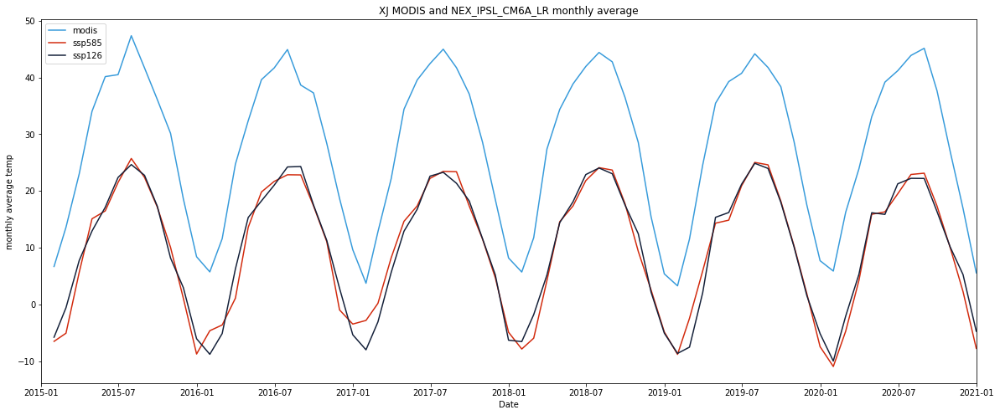

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_IPSL_CM6A_LR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_IPSL_CM6A_LR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp)) 
XJ_ssp585_IPSL_CM6A_LR_monthly_rmse

18.396823631651973

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_IPSL_CM6A_LR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp)) 
XJ_ssp126_IPSL_CM6A_LR_monthly_rmse

18.211841182001262

#### time series analysis

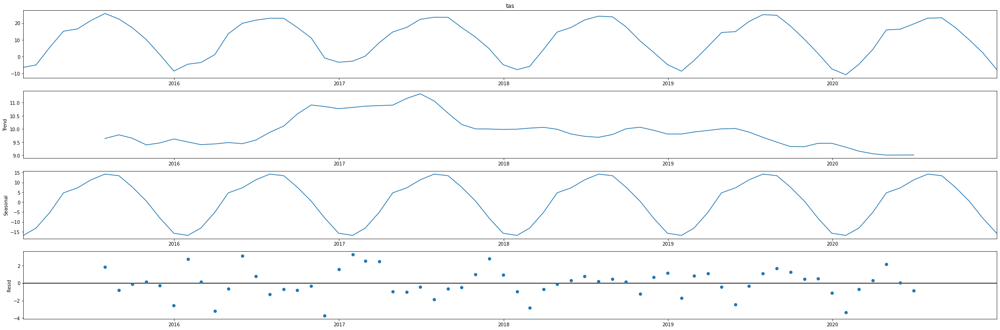

In [ ]:

XJ_ssp585_IPSL_CM6A_LR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp, model='additive')
fig = XJ_ssp585_IPSL_CM6A_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

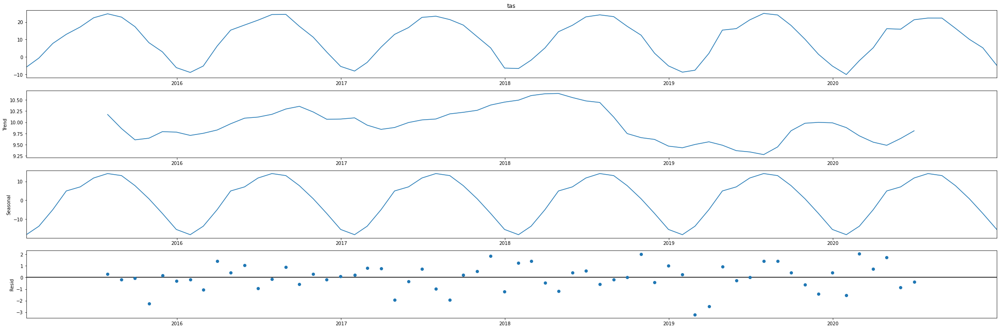

In [ ]:

XJ_ssp126_IPSL_CM6A_LR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp, model='additive')
fig = XJ_ssp126_IPSL_CM6A_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_IPSL_CM6A_LR_model = LinearRegression()
x = XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_IPSL_CM6A_LR_model.fit(x, y)
XJ_ssp585_IPSL_CM6A_LR_r_squared =XJ_ssp585_IPSL_CM6A_LR_model.score(x, y)
XJ_ssp585_IPSL_CM6A_LR_r_squared

0.9588948482389856

In [ ]:
XJ_ssp126_IPSL_CM6A_LR_model = LinearRegression()
x = XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_IPSL_CM6A_LR_model.fit(x, y)
XJ_ssp126_IPSL_CM6A_LR_r_squared = XJ_ssp126_IPSL_CM6A_LR_model.score(x, y)
XJ_ssp126_IPSL_CM6A_LR_r_squared

0.9669536183070057

#### seasonal analysis

In [ ]:
month = XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp.index.month
XJ_ssp585_IPSL_CM6A_LR_winter = pd.concat([XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 1], XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 2],XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 12]])
XJ_ssp585_IPSL_CM6A_LR_spring = pd.concat([XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 3], XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 4],XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 5]])
XJ_ssp585_IPSL_CM6A_LR_summer = pd.concat([XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 6], XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 7],XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 8]])
XJ_ssp585_IPSL_CM6A_LR_fall = pd.concat([XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 9], XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 10],XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp[month == 11]])
XJ_ssp585_IPSL_CM6A_LR_winter.sort_index()
XJ_ssp585_IPSL_CM6A_LR_spring.sort_index()
XJ_ssp585_IPSL_CM6A_LR_summer.sort_index()
XJ_ssp585_IPSL_CM6A_LR_fall.sort_index()

time
2015-09-30    17.146135
2015-10-31    10.043947
2015-11-30     1.075411
2016-09-30    17.364607
2016-10-31    11.069997
2016-11-30    -0.973044
2017-09-30    17.314491
2017-10-31    11.519082
2017-11-30     4.682796
2018-09-30    17.740322
2018-10-31     9.345202
2018-11-30     2.537774
2019-09-30    18.223931
2019-10-31    10.307866
2019-11-30     1.884638
2020-09-30    17.344519
2020-10-31     9.970621
2020-11-30     2.252996
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp.index.month
XJ_ssp126_IPSL_CM6A_LR_winter = pd.concat([XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 1], XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 2],XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 12]])
XJ_ssp126_IPSL_CM6A_LR_spring = pd.concat([XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 3], XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 4],XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 5]])
XJ_ssp126_IPSL_CM6A_LR_summer = pd.concat([XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 6], XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 7],XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 8]])
XJ_ssp126_IPSL_CM6A_LR_fall = pd.concat([XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 9], XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 10],XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp[month == 11]])
XJ_ssp126_IPSL_CM6A_LR_winter.sort_index()
XJ_ssp126_IPSL_CM6A_LR_spring.sort_index()
XJ_ssp126_IPSL_CM6A_LR_summer.sort_index()
XJ_ssp126_IPSL_CM6A_LR_fall.sort_index()

time
2015-09-30    17.300664
2015-10-31     8.173871
2015-11-30     2.948050
2016-09-30    17.530875
2016-10-31    11.288216
2016-11-30     2.836953
2017-09-30    18.218335
2017-10-31    11.591010
2017-11-30     5.199917
2018-09-30    17.511660
2018-10-31    12.454516
2018-11-30     2.156925
2019-09-30    18.004468
2019-10-31    10.134659
2019-11-30     1.550560
2020-09-30    16.372205
2020-10-31    10.099313
2020-11-30     5.252631
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_IPSL_CM6A_LR_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5557805877605455
coef:  [[1.07907419]]
intercept:  [14.55645527]


In [ ]:
x = XJ_ssp126_IPSL_CM6A_LR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.861288032064994
coef:  [[1.13824435]]
intercept:  [18.55410013]


In [ ]:
x = XJ_ssp126_IPSL_CM6A_LR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.1682153736722205
coef:  [[0.69890858]]
intercept:  [26.77127486]


In [ ]:
x = XJ_ssp126_IPSL_CM6A_LR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9411612459190202
coef:  [[1.32437093]]
intercept:  [13.89726092]


#####ssp585

In [ ]:
x = XJ_ssp585_IPSL_CM6A_LR_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.22022475874554992
coef:  [[0.63530508]]
intercept:  [12.06629119]


In [ ]:
x = XJ_ssp585_IPSL_CM6A_LR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8285455653944941
coef:  [[1.05495435]]
intercept:  [19.69530752]


In [ ]:
x = XJ_ssp585_IPSL_CM6A_LR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3735575520681098
coef:  [[0.85381427]]
intercept:  [23.25090295]


In [ ]:
x = XJ_ssp585_IPSL_CM6A_LR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9535806490264583
coef:  [[1.21617436]]
intercept:  [15.69142101]


### XJ_NEX_INM-CM5-0

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1CCPHjNdbP6ncV5SSbs7nFp4Rw9RlqxXF/view?usp=share_link
id = "1CCPHjNdbP6ncV5SSbs7nFp4Rw9RlqxXF"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_INM-CM5-0.csv')

XJ_ssp585_INM_CM5_0 = pd.read_csv('XJ_ssp585_INM-CM5-0.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_INM_CM5_0.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-5.441132
2015-01-01,39.125,82.375,-5.544891
2015-01-01,39.125,82.625,-5.741669
2015-01-01,39.125,82.875,-5.729950
2015-01-01,39.125,83.125,-5.582550


In [ ]:
XJ_ssp585_INM_CM5_0

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-5.441132
2015-01-01,39.125,82.375,-5.544891
2015-01-01,39.125,82.625,-5.741669
2015-01-01,39.125,82.875,-5.729950
2015-01-01,39.125,83.125,-5.582550
...,...,...,...
2020-12-29,36.375,83.875,-18.464660
2020-12-29,36.375,84.125,-18.589890
2020-12-29,36.375,84.375,-18.003036


In [ ]:
XJ_ssp585_INM_CM5_0['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_INM_CM5_0_avg_temp = XJ_ssp585_INM_CM5_0.groupby(XJ_ssp585_INM_CM5_0.index)['tas'].mean()
XJ_ssp585_INM_CM5_0_avg_temp

time
2015-01-01    -6.303738
2015-01-02    -7.105124
2015-01-03    -8.353588
2015-01-04   -10.016560
2015-01-05   -10.554409
                ...    
2020-12-25    -9.316245
2020-12-26    -5.919606
2020-12-27    -7.027045
2020-12-28    -7.696759
2020-12-29    -7.289900
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_INM_CM5_0_monthly_avg_temp = XJ_ssp585_INM_CM5_0_avg_temp.resample('M').mean()
XJ_ssp585_INM_CM5_0_monthly_avg_temp

time
2015-01-31    -8.489016
2015-02-28    -2.875160
2015-03-31     5.638544
2015-04-30    11.244697
2015-05-31    16.740295
                ...    
2020-08-31    22.578236
2020-09-30    16.441197
2020-10-31     6.986934
2020-11-30     1.449121
2020-12-31    -5.428441
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/100FBSEjED4kpQC75f8b4f6jV6MmND9A4/view?usp=share_link
id = "100FBSEjED4kpQC75f8b4f6jV6MmND9A4"
file.GetContentFile('XJ_ssp126_INM-CM5-0.csv')

XJ_ssp126_INM_CM5_0= pd.read_csv('XJ_ssp126_INM-CM5-0.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_INM_CM5_0.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-5.441132
2015-01-01,39.125,82.375,-5.544891
2015-01-01,39.125,82.625,-5.741669
2015-01-01,39.125,82.875,-5.729950
2015-01-01,39.125,83.125,-5.582550


In [ ]:
XJ_ssp126_INM_CM5_0['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_INM_CM5_0_avg_temp = XJ_ssp126_INM_CM5_0.groupby(XJ_ssp126_INM_CM5_0.index)['tas'].mean()
XJ_ssp126_INM_CM5_0_avg_temp

time
2015-01-01    -6.303738
2015-01-02    -7.105124
2015-01-03    -8.353588
2015-01-04   -10.016560
2015-01-05   -10.554409
                ...    
2020-12-25    -9.316245
2020-12-26    -5.919606
2020-12-27    -7.027045
2020-12-28    -7.696759
2020-12-29    -7.289900
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_INM_CM5_0_monthly_avg_temp = XJ_ssp126_INM_CM5_0_avg_temp.resample('M').mean()
XJ_ssp126_INM_CM5_0_monthly_avg_temp 

time
2015-01-31    -8.489016
2015-02-28    -2.875160
2015-03-31     5.638544
2015-04-30    11.244697
2015-05-31    16.740295
                ...    
2020-08-31    22.578236
2020-09-30    16.441197
2020-10-31     6.986934
2020-11-30     1.449121
2020-12-31    -5.428441
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

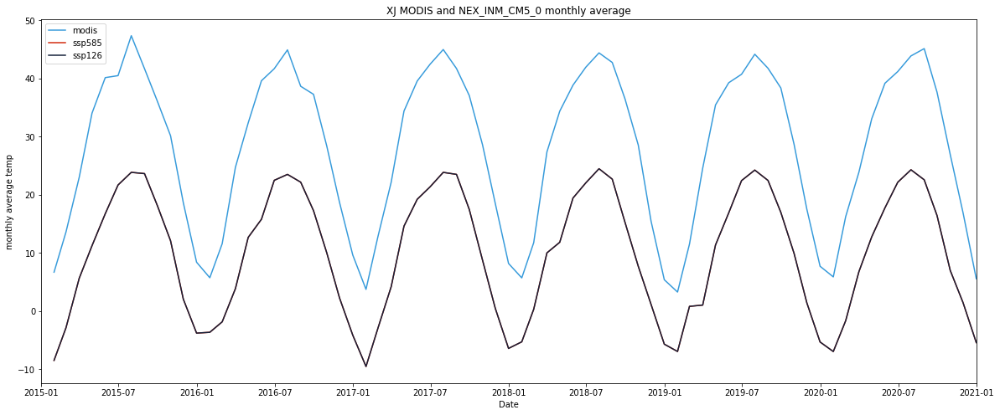

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_INM_CM5_0_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_INM_CM5_0_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_INM_CM5_0 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_INM_CM5_0_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_INM_CM5_0_monthly_avg_temp)) 
XJ_ssp585_INM_CM5_0_monthly_rmse

18.40494459854134

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_INM_CM5_0_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_INM_CM5_0_monthly_avg_temp)) 
XJ_ssp126_INM_CM5_0_monthly_rmse

18.40494459854134

#### time series analysis

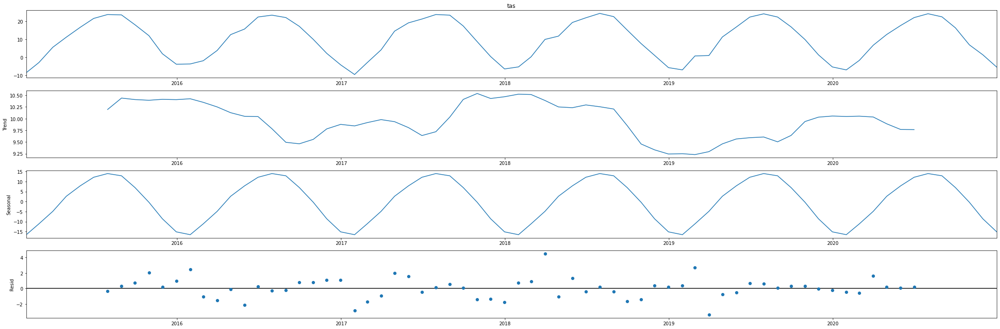

In [ ]:

XJ_ssp585_INM_CM5_0_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_INM_CM5_0_monthly_avg_temp, model='additive')
fig = XJ_ssp585_INM_CM5_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

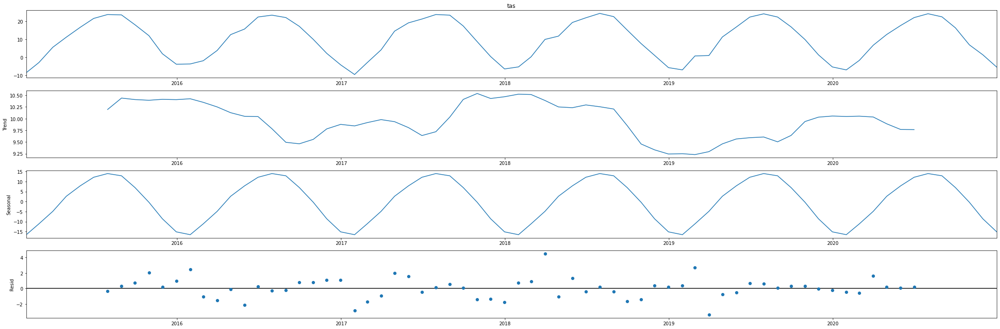

In [ ]:

XJ_ssp126_INM_CM5_0_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_INM_CM5_0_monthly_avg_temp, model='additive')
fig = XJ_ssp126_INM_CM5_0_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_INM_CM5_0_model = LinearRegression()
x = XJ_ssp585_INM_CM5_0_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_INM_CM5_0_model.fit(x, y)
XJ_ssp585_INM_CM5_0_r_squared =XJ_ssp585_INM_CM5_0_model.score(x, y)
XJ_ssp585_INM_CM5_0_r_squared

0.9649751089346785

In [ ]:
XJ_ssp126_INM_CM5_0_model = LinearRegression()
x = XJ_ssp126_INM_CM5_0_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_INM_CM5_0_model.fit(x, y)
XJ_ssp126_INM_CM5_0_r_squared = XJ_ssp126_INM_CM5_0_model.score(x, y)
XJ_ssp126_INM_CM5_0_r_squared

0.9649751089346785

#### seasonal analysis

In [ ]:
month = XJ_ssp585_INM_CM5_0_monthly_avg_temp.index.month
XJ_ssp585_INM_CM5_0_winter = pd.concat([XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 1], XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 2],XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 12]])
XJ_ssp585_INM_CM5_0_spring = pd.concat([XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 3], XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 4],XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 5]])
XJ_ssp585_INM_CM5_0_summer = pd.concat([XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 6], XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 7],XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 8]])
XJ_ssp585_INM_CM5_0_fall = pd.concat([XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 9], XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 10],XJ_ssp585_INM_CM5_0_monthly_avg_temp[month == 11]])
XJ_ssp585_INM_CM5_0_winter.sort_index()
XJ_ssp585_INM_CM5_0_spring.sort_index()
XJ_ssp585_INM_CM5_0_summer.sort_index()
XJ_ssp585_INM_CM5_0_fall.sort_index()

time
2015-09-30    18.158643
2015-10-31    12.094305
2015-11-30     2.028305
2016-09-30    17.267402
2016-10-31    10.027927
2016-11-30     2.244454
2017-09-30    17.472326
2017-10-31     8.767386
2017-11-30     0.454282
2018-09-30    15.234969
2018-10-31     7.696945
2018-11-30     1.135387
2019-09-30    16.982454
2019-10-31     9.936627
2019-11-30     1.410966
2020-09-30    16.441197
2020-10-31     6.986934
2020-11-30     1.449121
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_INM_CM5_0_monthly_avg_temp.index.month
XJ_ssp126_INM_CM5_0_winter = pd.concat([XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 1], XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 2],XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 12]])
XJ_ssp126_INM_CM5_0_spring = pd.concat([XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 3], XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 4],XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 5]])
XJ_ssp126_INM_CM5_0_summer = pd.concat([XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 6], XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 7],XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 8]])
XJ_ssp126_INM_CM5_0_fall = pd.concat([XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 9], XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 10],XJ_ssp126_INM_CM5_0_monthly_avg_temp[month == 11]])
XJ_ssp126_INM_CM5_0_winter.sort_index()
XJ_ssp126_INM_CM5_0_spring.sort_index()
XJ_ssp126_INM_CM5_0_summer.sort_index()
XJ_ssp126_INM_CM5_0_fall.sort_index()

time
2015-09-30    18.158643
2015-10-31    12.094305
2015-11-30     2.028305
2016-09-30    17.267402
2016-10-31    10.027927
2016-11-30     2.244454
2017-09-30    17.472326
2017-10-31     8.767386
2017-11-30     0.454282
2018-09-30    15.234969
2018-10-31     7.696945
2018-11-30     1.135387
2019-09-30    16.982454
2019-10-31     9.936627
2019-11-30     1.410966
2020-09-30    16.441197
2020-10-31     6.986934
2020-11-30     1.449121
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_INM_CM5_0_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5970851112280433
coef:  [[1.01494914]]
intercept:  [13.02889376]


In [ ]:
x = XJ_ssp126_INM_CM5_0_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8783228625144471
coef:  [[1.10047784]]
intercept:  [19.61595079]


In [ ]:
x = XJ_ssp126_INM_CM5_0_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3915994231372528
coef:  [[1.37631661]]
intercept:  [11.16315633]


In [ ]:
x = XJ_ssp126_NorESM2_LM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9639763908558774
coef:  [[1.20686613]]
intercept:  [15.84201924]


#####ssp585

In [ ]:
x = XJ_ssp585_INM_CM5_0_winter.values.reshape(-1, 1)
y = XJ_winter[:].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5970851112280433
coef:  [[1.01494914]]
intercept:  [13.02889376]


In [ ]:
x = XJ_ssp585_INM_CM5_0_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8783228625144471
coef:  [[1.10047784]]
intercept:  [19.61595079]


In [ ]:
x = XJ_ssp585_INM_CM5_0_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3915994231372528
coef:  [[1.37631661]]
intercept:  [11.16315633]


In [ ]:
x = XJ_ssp585_INM_CM5_0_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9690886186291813
coef:  [[1.23578311]]
intercept:  [16.39332827]


### XJ_NEX_IITM-ESM

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1DErK1mW3VBDB_ww_rpsMA4fzfEsmCD5J/view?usp=share_link
id = "1DErK1mW3VBDB_ww_rpsMA4fzfEsmCD5J"

file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_IITM-ESM.csv')

XJ_ssp585_IITM_ESM = pd.read_csv('XJ_ssp585_IITM-ESM.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_IITM_ESM.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-17.477234
2015-01-01,1,36.375,82.375,-20.532303
2015-01-01,2,36.375,82.625,-20.632294
2015-01-01,3,36.375,82.875,-19.804626
2015-01-01,4,36.375,83.125,-21.790405


In [ ]:
XJ_ssp585_IITM_ESM

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-17.477234
2015-01-01,1,36.375,82.375,-20.532303
2015-01-01,2,36.375,82.625,-20.632294
2015-01-01,3,36.375,82.875,-19.804626
2015-01-01,4,36.375,83.125,-21.790405
...,...,...,...,...
2020-12-30,315211,39.125,83.875,-7.117645
2020-12-30,315212,39.125,84.125,-7.017609
2020-12-30,315213,39.125,84.375,-6.933350


In [ ]:
XJ_ssp585_IITM_ESM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_IITM_ESM_avg_temp = XJ_ssp585_IITM_ESM.groupby(XJ_ssp585_IITM_ESM.index)['tas'].mean()
XJ_ssp585_IITM_ESM_avg_temp

time
2015-01-01   -10.511838
2015-01-02   -13.246166
2015-01-03   -12.205809
2015-01-04    -9.821797
2015-01-05   -10.726589
                ...    
2020-12-26    -5.352416
2020-12-27    -7.458452
2020-12-28    -8.382208
2020-12-29    -8.673440
2020-12-30    -8.693751
Name: tas, Length: 2189, dtype: float64

In [ ]:
XJ_ssp585_IITM_ESM_monthly_avg_temp = XJ_ssp585_IITM_ESM_avg_temp.resample('M').mean()
XJ_ssp585_IITM_ESM_monthly_avg_temp

time
2015-01-31    -8.637717
2015-02-28    -3.884962
2015-03-31     7.784106
2015-04-30    11.440569
2015-05-31    17.762773
                ...    
2020-08-31    24.130457
2020-09-30    17.143913
2020-10-31     6.638734
2020-11-30     2.017804
2020-12-31    -5.059114
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1ld85QYaaVPXyb4V8ajQ5HkAxsbDe_1T3/view?usp=share_link
id = "1ld85QYaaVPXyb4V8ajQ5HkAxsbDe_1T3"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_IITM-ESM.csv')

XJ_ssp126_IITM_ESM= pd.read_csv('XJ_ssp126_IITM-ESM.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_IITM_ESM.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-17.007477
2015-01-01,1,36.375,82.375,-20.133957
2015-01-01,2,36.375,82.625,-20.314194
2015-01-01,3,36.375,82.875,-19.575607
2015-01-01,4,36.375,83.125,-21.650497


In [ ]:
XJ_ssp126_IITM_ESM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_IITM_ESM_avg_temp = XJ_ssp126_IITM_ESM.groupby(XJ_ssp126_IITM_ESM.index)['tas'].mean()
XJ_ssp126_IITM_ESM_avg_temp

time
2015-01-01   -9.816223
2015-01-02   -8.751097
2015-01-03   -8.809656
2015-01-04   -9.403389
2015-01-05   -9.039599
                ...   
2020-12-26   -3.323895
2020-12-27   -4.270339
2020-12-28   -4.762782
2020-12-29   -5.749977
2020-12-30   -9.948762
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_IITM_ESM_monthly_avg_temp = XJ_ssp126_IITM_ESM_avg_temp.resample('M').mean()
XJ_ssp126_IITM_ESM_monthly_avg_temp 

time
2015-01-31    -8.176571
2015-02-28    -0.964034
2015-03-31     6.594353
2015-04-30    11.250774
2015-05-31    17.721356
                ...    
2020-08-31    20.592376
2020-09-30    15.166153
2020-10-31     8.917377
2020-11-30     1.540606
2020-12-31    -3.004666
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

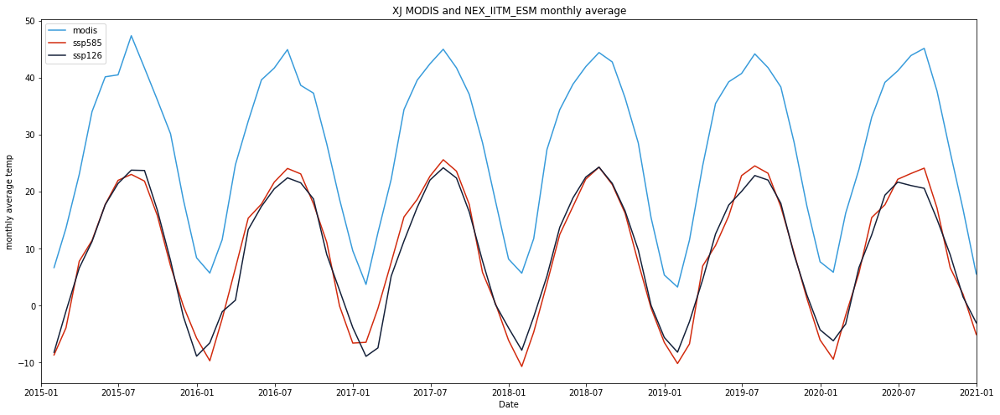

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_IITM_ESM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_IITM_ESM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_IITM_ESM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_IITM_ESM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_IITM_ESM_monthly_avg_temp)) 
XJ_ssp585_IITM_ESM_monthly_rmse

18.704508983250626

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_IITM_ESM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_IITM_ESM_monthly_avg_temp)) 
XJ_ssp126_IITM_ESM_monthly_rmse

18.867547809585197

#### time series analysis

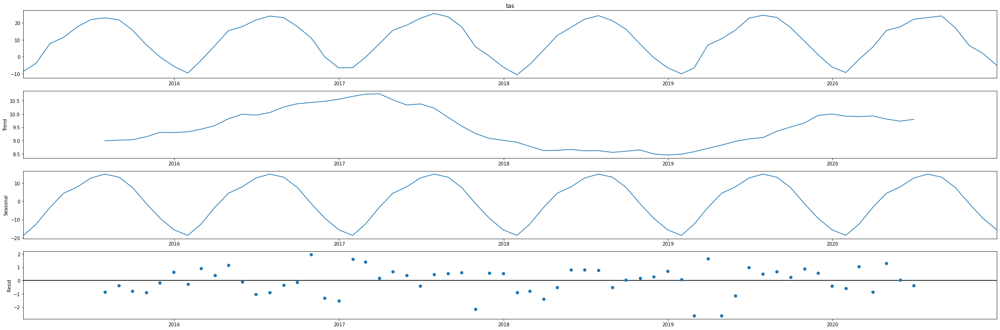

In [ ]:

XJ_ssp585_IITM_ESM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_IITM_ESM_monthly_avg_temp, model='additive')
fig = XJ_ssp585_IITM_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

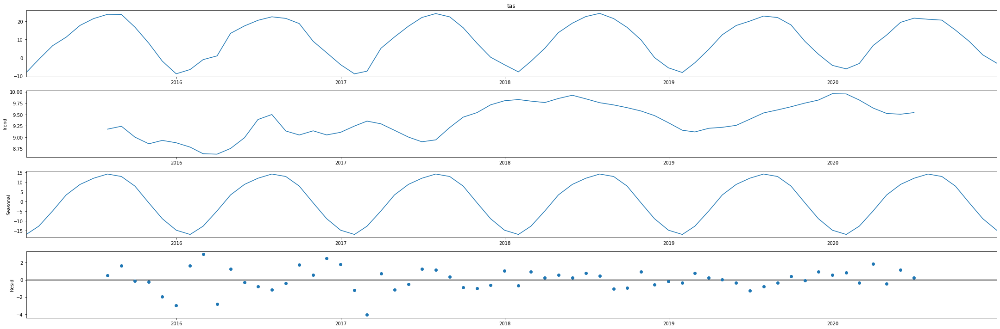

In [ ]:

XJ_ssp126_IITM_ESM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_IITM_ESM_monthly_avg_temp, model='additive')
fig = XJ_ssp126_IITM_ESM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_IITM_ESM_model = LinearRegression()
x = XJ_ssp585_IITM_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_IITM_ESM_model.fit(x, y)
XJ_ssp585_IITM_ESM_r_squared =XJ_ssp585_IITM_ESM_model.score(x, y)
XJ_ssp585_IITM_ESM_r_squared

0.9667222311876834

In [ ]:
XJ_ssp126_IITM_ESM_model = LinearRegression()
x = XJ_ssp126_IITM_ESM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_IITM_ESM_model.fit(x, y)
XJ_ssp126_IITM_ESM_r_squared = XJ_ssp126_IITM_ESM_model.score(x, y)
XJ_ssp126_IITM_ESM_r_squared

0.9633317678828857

#### seasonal analysis

In [ ]:
month = XJ_ssp585_IITM_ESM_monthly_avg_temp.index.month
XJ_ssp585_IITM_ESM_winter = pd.concat([XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 1], XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 2],XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 12]])
XJ_ssp585_IITM_ESM_spring = pd.concat([XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 3], XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 4],XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 5]])
XJ_ssp585_IITM_ESM_summer = pd.concat([XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 6], XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 7],XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 8]])
XJ_ssp585_IITM_ESM_fall = pd.concat([XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 9], XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 10],XJ_ssp585_IITM_ESM_monthly_avg_temp[month == 11]])
XJ_ssp585_IITM_ESM_winter.sort_index()
XJ_ssp585_IITM_ESM_spring.sort_index()
XJ_ssp585_IITM_ESM_summer.sort_index()
XJ_ssp585_CanESM5_fall.sort_index()

time
2015-09-30    15.682388
2015-10-31     4.118502
2015-11-30     3.016507
2016-09-30    15.617548
2016-10-31     9.947045
2016-11-30     0.063712
2017-09-30    16.065594
2017-10-31    10.642127
2017-11-30    -0.053156
2018-09-30    16.291755
2018-10-31     8.313677
2018-11-30     2.615198
2019-09-30    16.388212
2019-10-31    10.277112
2019-11-30     2.615365
2020-09-30    17.747734
2020-10-31    11.804628
2020-11-30     2.372952
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_IITM_ESM_monthly_avg_temp.index.month
XJ_ssp126_IITM_ESM_winter = pd.concat([XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 1], XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 2],XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 12]])
XJ_ssp126_IITM_ESM_spring = pd.concat([XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 3], XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 4],XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 5]])
XJ_ssp126_IITM_ESM_summer = pd.concat([XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 6], XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 7],XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 8]])
XJ_ssp126_IITM_ESM_fall = pd.concat([XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 9], XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 10],XJ_ssp126_IITM_ESM_monthly_avg_temp[month == 11]])
XJ_ssp126_IITM_ESM_winter.sort_index()
XJ_ssp126_IITM_ESM_spring.sort_index()
XJ_ssp126_IITM_ESM_summer.sort_index()
XJ_ssp126_IITM_ESM_fall.sort_index()

time
2015-09-30    16.768908
2015-10-31     7.916125
2015-11-30    -1.895702
2016-09-30    18.715047
2016-10-31     8.976510
2016-11-30     2.703998
2017-09-30    16.436207
2017-10-31     7.848513
2017-11-30     0.257047
2018-09-30    16.629426
2018-10-31     9.779366
2018-11-30     0.052378
2019-09-30    17.972819
2019-10-31     8.956800
2019-11-30     1.902571
2020-09-30    15.166153
2020-10-31     8.917377
2020-11-30     1.540606
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_IITM_ESM_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.39113339274187964
coef:  [[0.85367097]]
intercept:  [12.90783333]


In [ ]:
x = XJ_ssp126_IITM_ESM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8897060525682439
coef:  [[1.07909211]]
intercept:  [19.84133151]


In [ ]:
x = XJ_ssp126_IITM_ESM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.21349948281829068
coef:  [[0.77501763]]
intercept:  [25.61375789]


In [ ]:
x = XJ_ssp126_IITM_ESM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9492891230781716
coef:  [[1.1707054]]
intercept:  [17.45746497]


#####ssp585

In [ ]:
x = XJ_ssp585_IITM_ESM_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6043939961337466
coef:  [[0.98900293]]
intercept:  [14.58691914]


In [ ]:
x = XJ_ssp585_IITM_ESM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8093671973245219
coef:  [[1.18622762]]
intercept:  [17.76709403]


In [ ]:
x = XJ_ssp585_IITM_ESM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.2728989242366181
coef:  [[0.96849103]]
intercept:  [20.42137158]


In [ ]:
x = XJ_ssp585_IITM_ESM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9422675877936237
coef:  [[1.14140237]]
intercept:  [18.08290978]


### XJ_NEX_HadGEM3-GC31-MM

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1wvr8yl0rcHIXkJpxN4DfuK0rCW_j46uN/view?usp=share_link
id = "1wvr8yl0rcHIXkJpxN4DfuK0rCW_j46uN"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_HadGEM3-GC31-MM.csv')

XJ_ssp585_HadGEM3_GC31_MM = pd.read_csv('XJ_ssp585_HadGEM3-GC31-MM.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_HadGEM3_GC31_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,1.375671
2015-01-01,39.125,82.375,1.224487
2015-01-01,39.125,82.625,0.980316
2015-01-01,39.125,82.875,0.944641
2015-01-01,39.125,83.125,1.059021


In [ ]:
XJ_ssp585_HadGEM3_GC31_MM

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,1.375671
2015-01-01,39.125,82.375,1.224487
2015-01-01,39.125,82.625,0.980316
2015-01-01,39.125,82.875,0.944641
2015-01-01,39.125,83.125,1.059021
...,...,...,...
2020-11-29,36.375,83.875,-15.070038
2020-11-29,36.375,84.125,-15.179138
2020-11-29,36.375,84.375,-14.574585


In [ ]:
XJ_ssp585_HadGEM3_GC31_MM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_HadGEM3_GC31_MM_avg_temp = XJ_ssp585_HadGEM3_GC31_MM.groupby(XJ_ssp585_HadGEM3_GC31_MM.index)['tas'].mean()
XJ_ssp585_HadGEM3_GC31_MM_avg_temp

time
2015-01-01   -2.644041
2015-01-02   -3.315146
2015-01-03   -4.272400
2015-01-04   -4.625555
2015-01-05   -4.234286
                ...   
2020-11-25   -6.813012
2020-11-26   -6.918092
2020-11-27   -7.608889
2020-11-28   -6.703342
2020-11-29   -5.353726
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp = XJ_ssp585_HadGEM3_GC31_MM_avg_temp.resample('M').mean()
XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp

time
2015-01-31    -6.142526
2015-02-28    -1.254716
2015-03-31     3.374180
2015-04-30    13.404671
2015-05-31    16.593117
                ...    
2020-07-31    23.832575
2020-08-31    19.033709
2020-09-30    11.130331
2020-10-31     3.535515
2020-11-30    -5.534911
Freq: M, Name: tas, Length: 71, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1XAildAVzJtqytnm1vYASUzuiweB9j4lU/view?usp=share_link
id = "1XAildAVzJtqytnm1vYASUzuiweB9j4lU"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_HadGEM3-GC31-MM.csv')

XJ_ssp126_HadGEM3_GC31_MM= pd.read_csv('XJ_ssp126_HadGEM3-GC31-MM.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_HadGEM3_GC31_MM.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,1.359436
2015-01-01,39.125,82.375,1.209534
2015-01-01,39.125,82.625,0.966614
2015-01-01,39.125,82.875,0.932190
2015-01-01,39.125,83.125,1.063782


In [ ]:
XJ_ssp126_HadGEM3_GC31_MM['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_HadGEM3_GC31_MM_avg_temp = XJ_ssp126_HadGEM3_GC31_MM.groupby(XJ_ssp126_HadGEM3_GC31_MM.index)['tas'].mean()
XJ_ssp126_HadGEM3_GC31_MM_avg_temp

time
2015-01-01   -2.596699
2015-01-02   -3.294167
2015-01-03   -4.263967
2015-01-04   -4.608608
2015-01-05   -4.311123
                ...   
2020-11-25   -3.276704
2020-11-26   -4.687225
2020-11-27   -4.831518
2020-11-28   -5.144210
2020-11-29   -4.463008
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp = XJ_ssp126_HadGEM3_GC31_MM_avg_temp.resample('M').mean()
XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp 

time
2015-01-31    -7.012406
2015-02-28    -1.706362
2015-03-31     3.976305
2015-04-30    11.385503
2015-05-31    17.394914
                ...    
2020-07-31    23.955066
2020-08-31    20.106876
2020-09-30     9.405167
2020-10-31     3.630400
2020-11-30    -3.015395
Freq: M, Name: tas, Length: 71, dtype: float64

#### compare modis with ssp585 and ssp126

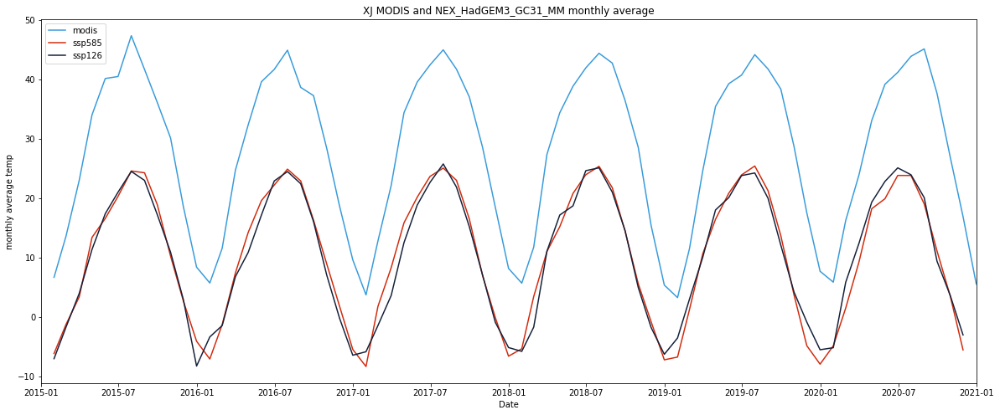

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_HadGEM3_GC31_MM monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_HadGEM3_GC31_MM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp)) 
XJ_ssp585_HadGEM3_GC31_MM_monthly_rmse

18.24946775271153

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_HadGEM3_GC31_MM_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp)) 
XJ_ssp126_HadGEM3_GC31_MM_monthly_rmse

18.496739035022845

#### time series analysis

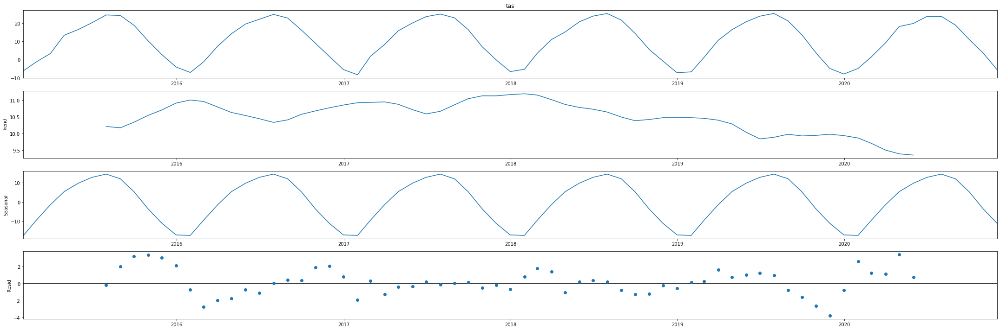

In [ ]:

XJ_ssp585_HadGEM3_GC31_MM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp, model='additive')
fig = XJ_ssp585_HadGEM3_GC31_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

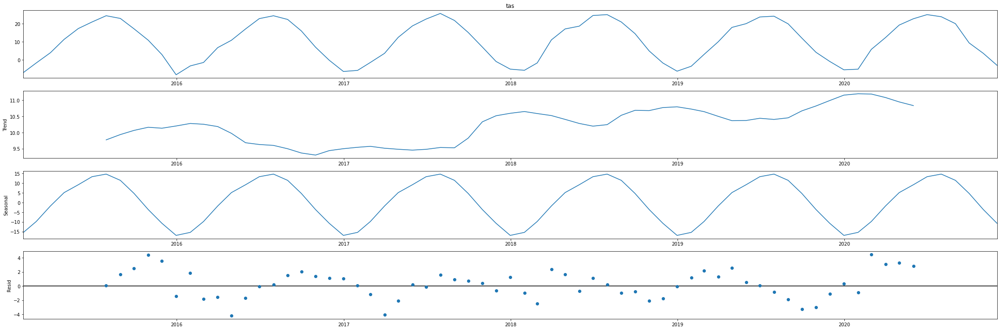

In [ ]:

XJ_ssp126_HadGEM3_GC31_MM_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp, model='additive')
fig = XJ_ssp126_HadGEM3_GC31_MM_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_HadGEM3_GC31_MM_model = LinearRegression()
x = XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
XJ_ssp585_HadGEM3_GC31_MM_model.fit(x, y)
XJ_ssp585_HadGEM3_GC31_MM_r_squared =XJ_ssp585_HadGEM3_GC31_MM_model.score(x, y)
XJ_ssp585_HadGEM3_GC31_MM_r_squared

0.9319420935187231

In [ ]:
XJ_ssp126_HadGEM3_GC31_MM_model = LinearRegression()
x = XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)


In [ ]:
XJ_ssp126_HadGEM3_GC31_MM_model.fit(x, y)
XJ_ssp126_HadGEM3_GC31_MM_r_squared = XJ_ssp126_HadGEM3_GC31_MM_model.score(x, y)
XJ_ssp126_HadGEM3_GC31_MM_r_squared

0.9176767371262712

#### seasonal analysis

In [ ]:
month = XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp.index.month
XJ_ssp585_HadGEM3_GC31_MM_winter = pd.concat([XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 1], XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 2],XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 12]])
XJ_ssp585_HadGEM3_GC31_MM_spring = pd.concat([XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 3], XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 4],XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 5]])
XJ_ssp585_HadGEM3_GC31_MM_summer = pd.concat([XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 6], XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 7],XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 8]])
XJ_ssp585_HadGEM3_GC31_MM_fall = pd.concat([XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 9], XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 10],XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp[month == 11]])
XJ_ssp585_HadGEM3_GC31_MM_winter.sort_index()
XJ_ssp585_HadGEM3_GC31_MM_spring.sort_index()
XJ_ssp585_HadGEM3_GC31_MM_summer.sort_index()
XJ_ssp585_HadGEM3_GC31_MM_fall.sort_index()

time
2015-09-30    18.904056
2015-10-31    10.266247
2015-11-30     2.707082
2016-09-30    16.318690
2016-10-31     8.940520
2016-11-30     1.825656
2017-09-30    16.538696
2017-10-31     7.016718
2017-11-30    -0.091475
2018-09-30    14.497146
2018-10-31     5.589301
2018-11-30    -0.778958
2019-09-30    13.700258
2019-10-31     3.699247
2019-11-30    -4.833590
2020-09-30    11.130331
2020-10-31     3.535515
2020-11-30    -5.534911
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp.index.month
XJ_ssp126_HadGEM3_GC31_MM_winter = pd.concat([XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 1], XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 2],XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 12]])
XJ_ssp126_HadGEM3_GC31_MM_spring = pd.concat([XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 3], XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 4],XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 5]])
XJ_ssp126_HadGEM3_GC31_MM_summer = pd.concat([XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 6], XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 7],XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 8]])
XJ_ssp126_HadGEM3_GC31_MM_fall = pd.concat([XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 9], XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 10],XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp[month == 11]])
XJ_ssp126_HadGEM3_GC31_MM_winter.sort_index()
XJ_ssp126_HadGEM3_GC31_MM_spring.sort_index()
XJ_ssp126_HadGEM3_GC31_MM_summer.sort_index()
XJ_ssp126_HadGEM3_GC31_MM_fall.sort_index()

time
2015-09-30    17.227567
2015-10-31    10.927070
2015-11-30     2.938308
2016-09-30    16.070086
2016-10-31     7.060721
2016-11-30    -0.192655
2017-09-30    15.232909
2017-10-31     7.120688
2017-11-30    -0.886070
2018-09-30    14.566247
2018-10-31     4.955388
2018-11-30    -1.747326
2019-09-30    12.101665
2019-10-31     4.195072
2019-11-30    -0.860719
2020-09-30     9.405167
2020-10-31     3.630400
2020-11-30    -3.015395
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_HadGEM3_GC31_MM_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5254574742652955
coef:  [[0.73276589]]
intercept:  [11.26807847]


In [ ]:
x = XJ_ssp126_HadGEM3_GC31_MM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7540723133156081
coef:  [[1.00631291]]
intercept:  [18.45859474]


In [ ]:
x = XJ_ssp126_HadGEM3_GC31_MM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.1038402004836888
coef:  [[0.38481316]]
intercept:  [33.86869115]


In [ ]:
x = XJ_ssp126_HadGEM3_GC31_MM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8706772666091888
coef:  [[1.1663174]]
intercept:  [20.08244939]


#####ssp585

In [ ]:
x = XJ_ssp585_HadGEM3_GC31_MM_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.7227718950232191
coef:  [[0.81797601]]
intercept:  [11.78674891]


In [ ]:
x = XJ_ssp585_HadGEM3_GC31_MM_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8696280741107016
coef:  [[1.17354106]]
intercept:  [15.52594863]


In [ ]:
x = XJ_ssp585_HadGEM3_GC31_MM_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.08113222583619528
coef:  [[0.33952605]]
intercept:  [34.86620508]


In [ ]:
x = XJ_ssp585_HadGEM3_GC31_MM_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8602481959262235
coef:  [[1.04026328]]
intercept:  [20.64220476]


### XJ_NEX_HadGEM3-GC31-LL

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1xItjCMvqghDj-n3cxuO4RoK2sOrJdf5-/view?usp=share_link
id = "1xItjCMvqghDj-n3cxuO4RoK2sOrJdf5-"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_HadGEM3-GC31-LL.csv')

XJ_ssp585_HadGEM3_GC31_LL = pd.read_csv('XJ_ssp585_HadGEM3-GC31-LL.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_HadGEM3_GC31_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.528137
2015-01-01,39.125,82.375,-4.846527
2015-01-01,39.125,82.625,-5.257935
2015-01-01,39.125,82.875,-5.460877
2015-01-01,39.125,83.125,-5.528107


In [ ]:
XJ_ssp585_HadGEM3_GC31_LL

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.528137
2015-01-01,39.125,82.375,-4.846527
2015-01-01,39.125,82.625,-5.257935
2015-01-01,39.125,82.875,-5.460877
2015-01-01,39.125,83.125,-5.528107
...,...,...,...
2020-11-29,36.375,83.875,-24.169556
2020-11-29,36.375,84.125,-23.850830
2020-11-29,36.375,84.375,-22.818436


In [ ]:
XJ_ssp585_HadGEM3_GC31_LL['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_HadGEM3_GC31_LL_avg_temp = XJ_ssp585_HadGEM3_GC31_LL.groupby(XJ_ssp585_HadGEM3_GC31_LL.index)['tas'].mean()
XJ_ssp585_HadGEM3_GC31_LL_avg_temp

time
2015-01-01    -7.278149
2015-01-02    -7.465509
2015-01-03    -7.086663
2015-01-04    -5.899148
2015-01-05    -5.133838
                ...    
2020-11-25    -7.425588
2020-11-26    -7.402432
2020-11-27    -8.522264
2020-11-28   -10.627354
2020-11-29   -12.110798
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp = XJ_ssp585_HadGEM3_GC31_LL_avg_temp.resample('M').mean()
XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp

time
2015-01-31    -6.701372
2015-02-28    -3.492544
2015-03-31     2.314587
2015-04-30    13.265414
2015-05-31    16.607639
                ...    
2020-07-31    25.243536
2020-08-31    18.824360
2020-09-30    11.013123
2020-10-31     3.952302
2020-11-30    -5.172011
Freq: M, Name: tas, Length: 71, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1vk0KUS_tqFuIqf3nCH8l1ZMpJDjYIZnO/view?usp=share_link

id = "1vk0KUS_tqFuIqf3nCH8l1ZMpJDjYIZnO"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_HadGEM3-GC31-LL.csv')

XJ_ssp126_HadGEM3_GC31_LL= pd.read_csv('XJ_ssp126_HadGEM3-GC31-LL.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_HadGEM3_GC31_LL.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.759644
2015-01-01,39.125,82.375,-4.134399
2015-01-01,39.125,82.625,-4.602173
2015-01-01,39.125,82.875,-4.861450
2015-01-01,39.125,83.125,-4.985046


In [ ]:
XJ_ssp126_HadGEM3_GC31_LL['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_HadGEM3_GC31_LL_avg_temp = XJ_ssp126_HadGEM3_GC31_LL.groupby(XJ_ssp126_HadGEM3_GC31_LL.index)['tas'].mean()
XJ_ssp126_HadGEM3_GC31_LL_avg_temp

time
2015-01-01   -7.499176
2015-01-02   -7.649055
2015-01-03   -7.314711
2015-01-04   -6.076164
2015-01-05   -5.417794
                ...   
2020-11-25   -4.789829
2020-11-26   -4.438843
2020-11-27   -4.185747
2020-11-28   -4.985833
2020-11-29   -6.295700
Name: tas, Length: 2160, dtype: float64

In [ ]:
XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp = XJ_ssp126_HadGEM3_GC31_LL_avg_temp.resample('M').mean()
XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp 

time
2015-01-31    -7.640427
2015-02-28    -4.579488
2015-03-31     4.158705
2015-04-30    14.289771
2015-05-31    18.734940
                ...    
2020-07-31    24.204489
2020-08-31    18.333470
2020-09-30    12.776020
2020-10-31     4.494555
2020-11-30    -2.416606
Freq: M, Name: tas, Length: 71, dtype: float64

#### compare modis with ssp585 and ssp126

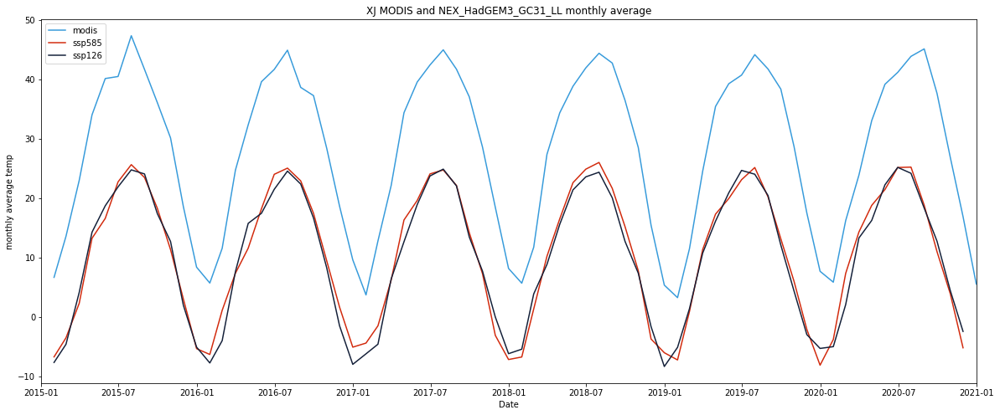

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_HadGEM3_GC31_LL monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_HadGEM3_GC31_LL_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp)) 
XJ_ssp585_HadGEM3_GC31_LL_monthly_rmse

18.084502564654738

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_HadGEM3_GC31_LL_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:-1], XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp)) 
XJ_ssp126_HadGEM3_GC31_LL_monthly_rmse

18.45970879957149

#### time series analysis

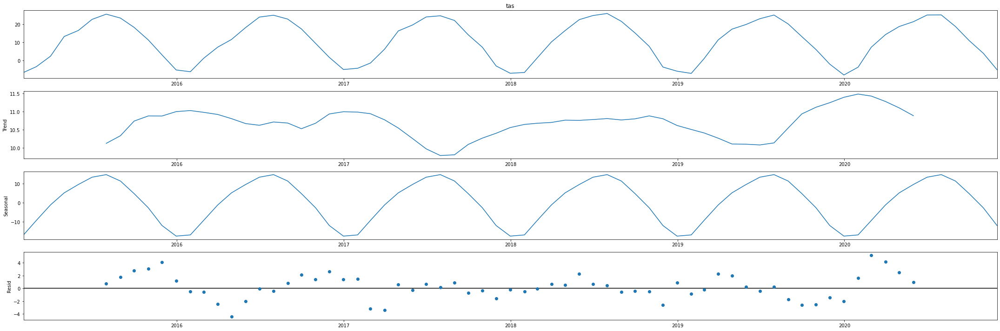

In [ ]:

XJ_ssp585_HadGEM3_GC31_LL_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp, model='additive')
fig = XJ_ssp585_HadGEM3_GC31_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

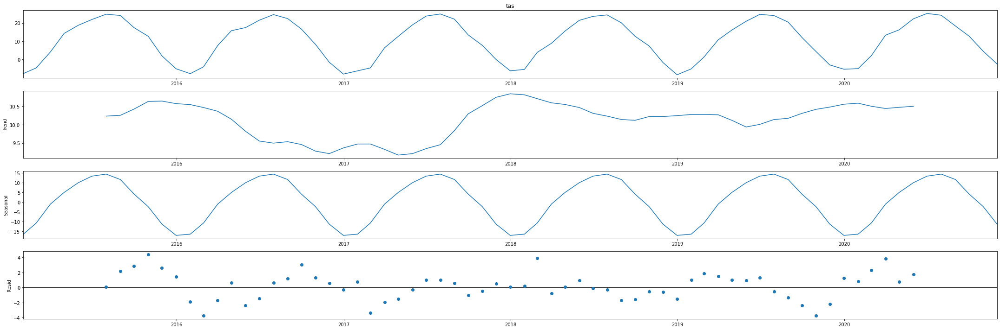

In [ ]:

XJ_ssp126_HadGEM3_GC31_LL_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp, model='additive')
fig = XJ_ssp126_HadGEM3_GC31_LL_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_HadGEM3_GC31_LL_model = LinearRegression()
x = XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)

In [ ]:
XJ_ssp585_HadGEM3_GC31_LL_model.fit(x, y)
XJ_ssp585_HadGEM3_GC31_LL_r_squared =XJ_ssp585_HadGEM3_GC31_LL_model.score(x, y)
XJ_ssp585_HadGEM3_GC31_LL_r_squared

0.9204817872893692

In [ ]:
XJ_ssp126_HadGEM3_GC31_LL_model = LinearRegression()
x = XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month[:-1].values.reshape(-1, 1)


In [ ]:
XJ_ssp126_HadGEM3_GC31_LL_model.fit(x, y)
XJ_ssp126_HadGEM3_GC31_LL_r_squared = XJ_ssp126_HadGEM3_GC31_LL_model.score(x, y)
XJ_ssp126_HadGEM3_GC31_LL_r_squared

0.9302563938987495

#### seasonal analysis

In [ ]:
month = XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp.index.month
XJ_ssp585_HadGEM3_GC31_LL_winter = pd.concat([XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 1], XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 2],XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 12]])
XJ_ssp585_HadGEM3_GC31_LL_spring = pd.concat([XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 3], XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 4],XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 5]])
XJ_ssp585_HadGEM3_GC31_LL_summer = pd.concat([XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 6], XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 7],XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 8]])
XJ_ssp585_HadGEM3_GC31_LL_fall = pd.concat([XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 9], XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 10],XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp[month == 11]])
XJ_ssp585_HadGEM3_GC31_LL_winter.sort_index()
XJ_ssp585_HadGEM3_GC31_LL_spring.sort_index()
XJ_ssp585_HadGEM3_GC31_LL_summer.sort_index()
XJ_ssp585_HadGEM3_GC31_LL_fall.sort_index()

time
2015-09-30    18.319848
2015-10-31    11.353438
2015-11-30     3.048775
2016-09-30    17.463208
2016-10-31     9.457845
2016-11-30     1.680870
2017-09-30    14.201001
2017-10-31     7.301718
2017-11-30    -3.081556
2018-09-30    15.216307
2018-10-31     7.797094
2018-11-30    -3.701929
2019-09-30    13.179261
2019-10-31     6.012209
2019-11-30    -2.078968
2020-09-30    11.013123
2020-10-31     3.952302
2020-11-30    -5.172011
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp.index.month
XJ_ssp126_HadGEM3_GC31_LL_winter = pd.concat([XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 1], XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 2],XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 12]])
XJ_ssp126_HadGEM3_GC31_LL_spring = pd.concat([XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 3], XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 4],XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 5]])
XJ_ssp126_HadGEM3_GC31_LL_summer = pd.concat([XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 6], XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 7],XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 8]])
XJ_ssp126_HadGEM3_GC31_LL_fall = pd.concat([XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 9], XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 10],XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp[month == 11]])
XJ_ssp126_HadGEM3_GC31_LL_winter.sort_index()
XJ_ssp126_HadGEM3_GC31_LL_spring.sort_index()
XJ_ssp126_HadGEM3_GC31_LL_summer.sort_index()
XJ_ssp126_HadGEM3_GC31_LL_fall.sort_index()

time
2015-09-30    17.423963
2015-10-31    12.716699
2015-11-30     1.994604
2016-09-30    16.669743
2016-10-31     8.273663
2016-11-30    -1.461017
2017-09-30    13.476332
2017-10-31     7.730910
2017-11-30     0.015568
2018-09-30    12.735374
2018-10-31     7.390524
2018-11-30    -1.620471
2019-09-30    12.122184
2019-10-31     4.374316
2019-11-30    -2.951826
2020-09-30    12.776020
2020-10-31     4.494555
2020-11-30    -2.416606
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_HadGEM3_GC31_LL_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.4101909068991353
coef:  [[0.66613104]]
intercept:  [11.65414004]


In [ ]:
x = XJ_ssp126_HadGEM3_GC31_LL_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8179387912343363
coef:  [[1.12171494]]
intercept:  [16.25737705]


In [ ]:
x = XJ_ssp126_HadGEM3_GC31_LL_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.024819724771039886
coef:  [[0.17065914]]
intercept:  [38.84408841]


In [ ]:
x = XJ_ssp126_HadGEM3_GC31_LL_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9015617505800548
coef:  [[1.15394047]]
intercept:  [19.84256151]


#####ssp585

In [ ]:
x = XJ_ssp585_HadGEM3_GC31_LL_winter.values.reshape(-1, 1)
y = XJ_winter[:-1].values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6207498030467793
coef:  [[0.70418997]]
intercept:  [11.21591025]


In [ ]:
x = XJ_ssp585_HadGEM3_GC31_LL_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7437817446415398
coef:  [[1.01338403]]
intercept:  [17.68778381]


In [ ]:
x = XJ_ssp585_HadGEM3_GC31_LL_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.06842757666544108
coef:  [[0.28355902]]
intercept:  [36.07804327]


In [ ]:
x = XJ_ssp585_HadGEM3_GC31_LL_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8889773647181487
coef:  [[1.052913]]
intercept:  [20.40735241]


### XJ_NEX_GISS-E2-1-G

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1m-Gg7Yh4uLnd8rxdPr4nvi0vuSnrV9jV/view?usp=share_link
id = "1m-Gg7Yh4uLnd8rxdPr4nvi0vuSnrV9jV"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_GISS-E2-1-G.csv')

XJ_ssp585_GISS_E2_1_G = pd.read_csv('XJ_ssp585_GISS-E2-1-G.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_GISS_E2_1_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-2.490356
2015-01-01,39.125,82.375,-2.692963
2015-01-01,39.125,82.625,-2.988647
2015-01-01,39.125,82.875,-3.075806
2015-01-01,39.125,83.125,-3.027283


In [ ]:
XJ_ssp585_GISS_E2_1_G

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-2.490356
2015-01-01,39.125,82.375,-2.692963
2015-01-01,39.125,82.625,-2.988647
2015-01-01,39.125,82.875,-3.075806
2015-01-01,39.125,83.125,-3.027283
...,...,...,...
2020-12-29,36.375,83.875,-18.318787
2020-12-29,36.375,84.125,-18.293274
2020-12-29,36.375,84.375,-17.553070


In [ ]:
XJ_ssp585_GISS_E2_1_G['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_GISS_E2_1_G_avg_temp = XJ_ssp585_GISS_E2_1_G.groupby(XJ_ssp585_GISS_E2_1_G.index)['tas'].mean()
XJ_ssp585_GISS_E2_1_G_avg_temp

time
2015-01-01    -5.361987
2015-01-02    -9.034256
2015-01-03   -10.148274
2015-01-04    -9.134970
2015-01-05   -11.306150
                ...    
2020-12-25    -7.511782
2020-12-26    -5.182417
2020-12-27    -5.475123
2020-12-28    -5.914417
2020-12-29    -7.534331
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_GISS_E2_1_G_monthly_avg_temp = XJ_ssp585_GISS_E2_1_G_avg_temp.resample('M').mean()
XJ_ssp585_GISS_E2_1_G_monthly_avg_temp

time
2015-01-31    -7.625357
2015-02-28    -1.347067
2015-03-31     4.963061
2015-04-30    10.854348
2015-05-31    16.040089
                ...    
2020-08-31    22.077091
2020-09-30    17.506008
2020-10-31     7.651151
2020-11-30     0.516673
2020-12-31    -6.481945
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1Bll48_PAwV4hzh-VPdtaR3q0j-QB6CSU/view?usp=share_link
id = "1Bll48_PAwV4hzh-VPdtaR3q0j-QB6CSU"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_GISS-E2-1-G.csv')

XJ_ssp126_GISS_E2_1_G= pd.read_csv('XJ_ssp126_GISS-E2-1-G.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_GISS_E2_1_G.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.066589
2015-01-01,39.125,82.375,-3.118286
2015-01-01,39.125,82.625,-3.262970
2015-01-01,39.125,82.875,-3.199158
2015-01-01,39.125,83.125,-2.999664


In [ ]:
XJ_ssp126_GISS_E2_1_G['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_GISS_E2_1_G_avg_temp = XJ_ssp126_GISS_E2_1_G.groupby(XJ_ssp126_GISS_E2_1_G.index)['tas'].mean()
XJ_ssp126_GISS_E2_1_G_avg_temp

time
2015-01-01    -5.249581
2015-01-02    -8.964086
2015-01-03    -9.898758
2015-01-04    -9.721131
2015-01-05   -11.034691
                ...    
2020-12-25    -1.233518
2020-12-26    -2.139433
2020-12-27    -3.600047
2020-12-28    -3.269889
2020-12-29    -0.946180
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_GISS_E2_1_G_monthly_avg_temp = XJ_ssp126_GISS_E2_1_G_avg_temp.resample('M').mean()
XJ_ssp126_GISS_E2_1_G_monthly_avg_temp 

time
2015-01-31    -7.445920
2015-02-28    -1.684231
2015-03-31     4.727829
2015-04-30    15.623469
2015-05-31    17.101194
                ...    
2020-08-31    22.023079
2020-09-30    19.465311
2020-10-31     9.339789
2020-11-30     0.890740
2020-12-31    -4.876349
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

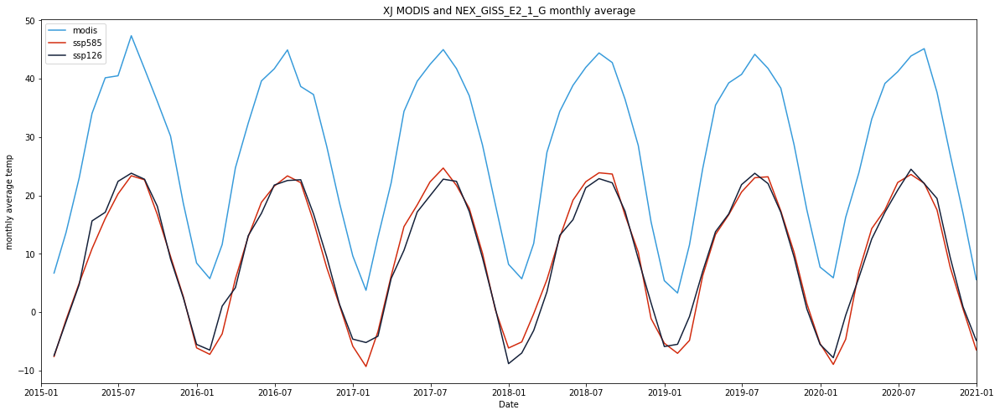

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_GISS_E2_1_G_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_GISS_E2_1_G_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_GISS_E2_1_G monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_GISS_E2_1_G_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_GISS_E2_1_G_monthly_avg_temp)) 
XJ_ssp585_GISS_E2_1_G_monthly_rmse

18.604195042214236

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_GISS_E2_1_G_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_GISS_E2_1_G_monthly_avg_temp)) 
XJ_ssp126_GISS_E2_1_G_monthly_rmse

18.58718664272825

#### time series analysis

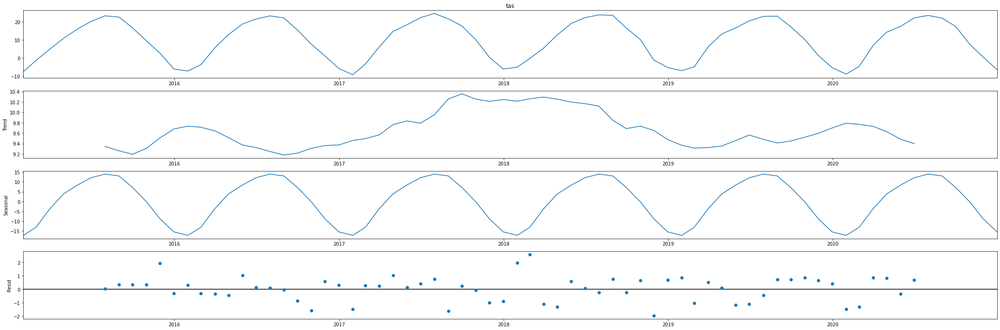

In [ ]:

XJ_ssp585_GISS_E2_1_G_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_GISS_E2_1_G_monthly_avg_temp, model='additive')
fig = XJ_ssp585_GISS_E2_1_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

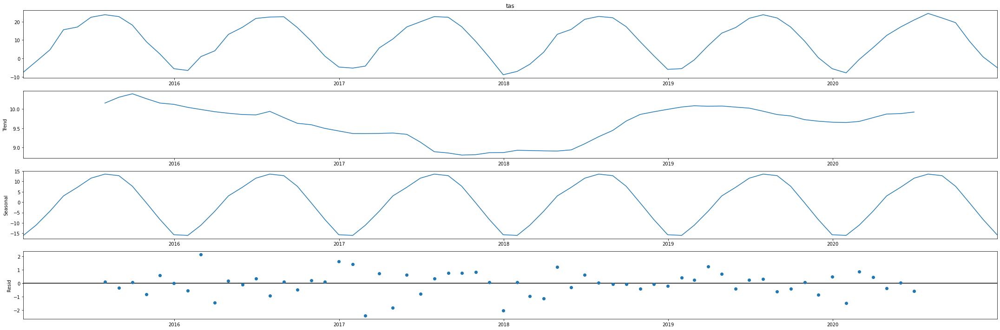

In [ ]:

XJ_ssp126_GISS_E2_1_G_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_GISS_E2_1_G_monthly_avg_temp, model='additive')
fig = XJ_ssp126_GISS_E2_1_G_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_GISS_E2_1_G_model = LinearRegression()
x = XJ_ssp585_GISS_E2_1_G_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_GISS_E2_1_G_model.fit(x, y)
XJ_ssp585_GISS_E2_1_G_r_squared =XJ_ssp585_GISS_E2_1_G_model.score(x, y)
XJ_ssp585_GISS_E2_1_G_r_squared

0.9768446417287442

In [ ]:
XJ_ssp126_GISS_E2_1_G_model = LinearRegression()
x = XJ_ssp126_GISS_E2_1_G_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_GISS_E2_1_G_model.fit(x, y)
XJ_ssp126_GISS_E2_1_G_r_squared = XJ_ssp126_GISS_E2_1_G_model.score(x, y)
XJ_ssp126_GISS_E2_1_G_r_squared

0.9677062501323886

#### seasonal analysis

In [ ]:
month = XJ_ssp585_GISS_E2_1_G_monthly_avg_temp.index.month
XJ_ssp585_GISS_E2_1_G_winter = pd.concat([XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 1], XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 2],XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 12]])
XJ_ssp585_GISS_E2_1_G_spring = pd.concat([XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 3], XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 4],XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 5]])
XJ_ssp585_GISS_E2_1_G_summer = pd.concat([XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 6], XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 7],XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 8]])
XJ_ssp585_GISS_E2_1_G_fall = pd.concat([XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 9], XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 10],XJ_ssp585_GISS_E2_1_G_monthly_avg_temp[month == 11]])
XJ_ssp585_GISS_E2_1_G_winter.sort_index()
XJ_ssp585_GISS_E2_1_G_spring.sort_index()
XJ_ssp585_GISS_E2_1_G_summer.sort_index()
XJ_ssp585_GISS_E2_1_G_fall.sort_index()

time
2015-09-30    16.718210
2015-10-31     9.541658
2015-11-30     2.632451
2016-09-30    15.525191
2016-10-31     7.615070
2016-11-30     1.142516
2017-09-30    17.767591
2017-10-31    10.076549
2017-11-30     0.415458
2018-09-30    16.606574
2018-10-31    10.259084
2018-11-30    -1.121180
2019-09-30    17.332469
2019-10-31    10.251860
2019-11-30     1.443905
2020-09-30    17.506008
2020-10-31     7.651151
2020-11-30     0.516673
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_GISS_E2_1_G_monthly_avg_temp.index.month
XJ_ssp126_GISS_E2_1_G_winter = pd.concat([XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 1], XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 2],XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 12]])
XJ_ssp126_GISS_E2_1_G_spring = pd.concat([XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 3], XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 4],XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 5]])
XJ_ssp126_GISS_E2_1_G_summer = pd.concat([XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 6], XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 7],XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 8]])
XJ_ssp126_GISS_E2_1_G_fall = pd.concat([XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 9], XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 10],XJ_ssp126_GISS_E2_1_G_monthly_avg_temp[month == 11]])
XJ_ssp126_GISS_E2_1_G_winter.sort_index()
XJ_ssp126_GISS_E2_1_G_spring.sort_index()
XJ_ssp126_GISS_E2_1_G_summer.sort_index()
XJ_ssp126_GISS_E2_1_G_fall.sort_index()

time
2015-09-30    18.125801
2015-10-31     9.110523
2015-11-30     2.437289
2016-09-30    16.832638
2016-10-31     9.442470
2016-11-30     1.309068
2017-09-30    17.225522
2017-10-31     9.289421
2017-11-30     0.649973
2018-09-30    17.277907
2018-10-31     9.119772
2018-11-30     1.550923
2019-09-30    17.097460
2019-10-31     9.434742
2019-11-30     0.544508
2020-09-30    19.465311
2020-10-31     9.339789
2020-11-30     0.890740
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_GISS_E2_1_G_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.524100303748078
coef:  [[0.98503525]]
intercept:  [13.12525332]


In [ ]:
x = XJ_ssp126_GISS_E2_1_G_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9006686950839543
coef:  [[1.21011488]]
intercept:  [18.3981162]


In [ ]:
x = XJ_ssp126_GISS_E2_1_G_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.18314503986791153
coef:  [[0.84886223]]
intercept:  [23.79865917]


In [ ]:
x = XJ_ssp126_GISS_E2_1_G_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9704208964660627
coef:  [[1.17769871]]
intercept:  [16.70885719]


#####ssp585

In [ ]:
x = XJ_ssp585_GISS_E2_1_G_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5375176289896262
coef:  [[1.15760503]]
intercept:  [14.88362481]


In [ ]:
x = XJ_ssp585_GISS_E2_1_G_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9173219197139285
coef:  [[1.22535665]]
intercept:  [17.51491175]


In [ ]:
x = XJ_ssp585_GISS_E2_1_G_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3966353228599364
coef:  [[1.17465611]]
intercept:  [16.24389064]


In [ ]:
x = XJ_ssp585_GISS_E2_1_G_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.981959636455743
coef:  [[1.20235503]]
intercept:  [16.96228958]


### XJ_NEX_GFDL-ESM4

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1UuWIExUKwhJ64D6dWCdjj4pyHZWRRUBS/view?usp=share_link

id = "1UuWIExUKwhJ64D6dWCdjj4pyHZWRRUBS"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_GFDL-ESM4.csv')

XJ_ssp585_GFDL_ESM4 = pd.read_csv('XJ_ssp585_GFDL-ESM4.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_GFDL_ESM4.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.419464
2015-01-01,39.125,82.375,-3.679352
2015-01-01,39.125,82.625,-4.032227
2015-01-01,39.125,82.875,-4.176666
2015-01-01,39.125,83.125,-4.185394


In [ ]:
XJ_ssp585_GFDL_ESM4

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.419464
2015-01-01,39.125,82.375,-3.679352
2015-01-01,39.125,82.625,-4.032227
2015-01-01,39.125,82.875,-4.176666
2015-01-01,39.125,83.125,-4.185394
...,...,...,...
2020-12-29,36.375,83.875,-23.066376
2020-12-29,36.375,84.125,-23.319977
2020-12-29,36.375,84.375,-22.858902


In [ ]:
XJ_ssp585_GFDL_ESM4['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_GFDL_ESM4_avg_temp = XJ_ssp585_GFDL_ESM4.groupby(XJ_ssp585_GFDL_ESM4.index)['tas'].mean()
XJ_ssp585_GFDL_ESM4_avg_temp

time
2015-01-01    -5.208172
2015-01-02    -5.395178
2015-01-03    -7.821414
2015-01-04    -8.872204
2015-01-05    -9.712922
                ...    
2020-12-25    -9.144914
2020-12-26    -8.375375
2020-12-27    -9.400951
2020-12-28   -11.161896
2020-12-29   -10.642844
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_GFDL_ESM4_monthly_avg_temp = XJ_ssp585_GFDL_ESM4_avg_temp.resample('M').mean()
XJ_ssp585_GFDL_ESM4_monthly_avg_temp

time
2015-01-31    -5.864104
2015-02-28    -3.105861
2015-03-31     4.558783
2015-04-30    11.848472
2015-05-31    19.211932
                ...    
2020-08-31    22.961437
2020-09-30    17.936301
2020-10-31    10.539568
2020-11-30     3.575445
2020-12-31    -7.051396
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1QnFVLBycqdTkJB26bDuePmW8J89FOW4H/view?usp=share_link
id = "1QnFVLBycqdTkJB26bDuePmW8J89FOW4H"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_GFDL-ESM4.csv')

XJ_ssp126_GFDL_ESM4= pd.read_csv('XJ_ssp126_GFDL-ESM4.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_GFDL_ESM4.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.942383
2015-01-01,39.125,82.375,-4.205902
2015-01-01,39.125,82.625,-4.562439
2015-01-01,39.125,82.875,-4.710480
2015-01-01,39.125,83.125,-4.722839


In [ ]:
XJ_ssp126_GFDL_ESM4['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_GFDL_ESM4_avg_temp = XJ_ssp126_GFDL_ESM4.groupby(XJ_ssp126_GFDL_ESM4.index)['tas'].mean()
XJ_ssp126_GFDL_ESM4_avg_temp

time
2015-01-01    -5.311555
2015-01-02    -5.573267
2015-01-03    -7.850186
2015-01-04    -8.946682
2015-01-05   -10.053461
                ...    
2020-12-25    -5.734865
2020-12-26    -4.072217
2020-12-27    -5.352116
2020-12-28    -5.688733
2020-12-29    -5.479412
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_GFDL_ESM4_monthly_avg_temp = XJ_ssp126_GFDL_ESM4_avg_temp.resample('M').mean()
XJ_ssp126_GFDL_ESM4_monthly_avg_temp 

time
2015-01-31    -6.725567
2015-02-28    -2.803274
2015-03-31     3.591670
2015-04-30    10.200246
2015-05-31    19.341638
                ...    
2020-08-31    22.610814
2020-09-30    17.886229
2020-10-31     9.443386
2020-11-30     0.625176
2020-12-31    -4.669003
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

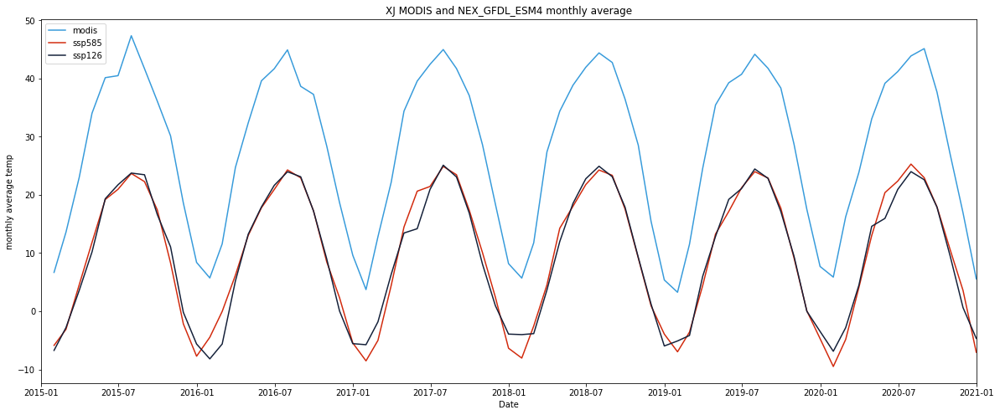

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_GFDL_ESM4_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_GFDL_ESM4_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_GFDL_ESM4 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_GFDL_ESM4_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_GFDL_ESM4_monthly_avg_temp)) 
XJ_ssp585_GFDL_ESM4_monthly_rmse

18.410638479664613

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_GFDL_ESM4_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_GFDL_ESM4_monthly_avg_temp)) 
XJ_ssp126_GFDL_ESM4_monthly_rmse

18.539487006985606

#### time series analysis

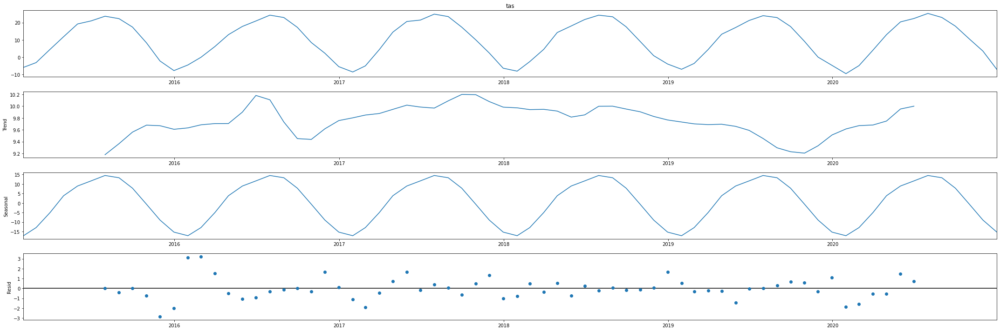

In [ ]:

XJ_ssp585_GFDL_ESM4_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_GFDL_ESM4_monthly_avg_temp, model='additive')
fig = XJ_ssp585_GFDL_ESM4_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

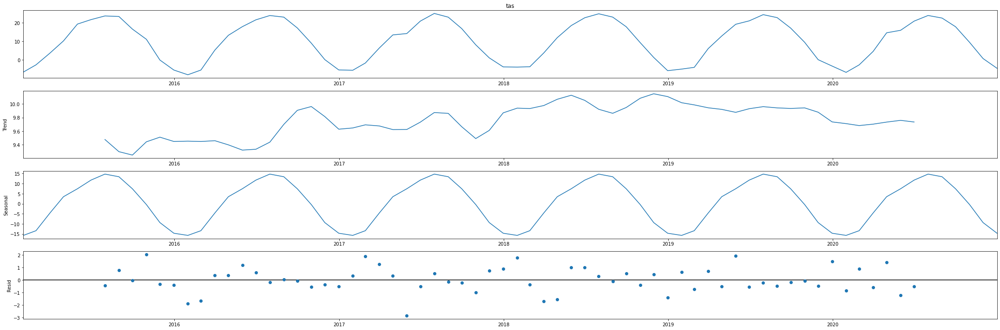

In [ ]:

XJ_ssp126_GFDL_ESM4_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_GFDL_ESM4_monthly_avg_temp, model='additive')
fig = XJ_ssp126_GFDL_ESM4_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_GFDL_ESM4_model = LinearRegression()
x = XJ_ssp585_GFDL_ESM4_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_GFDL_ESM4_model.fit(x, y)
XJ_ssp585_GFDL_ESM4_r_squared =XJ_ssp585_GFDL_ESM4_model.score(x, y)
XJ_ssp585_GFDL_ESM4_r_squared

0.9689218036813875

In [ ]:
XJ_ssp126_GFDL_ESM4_model = LinearRegression()
x = XJ_ssp126_GFDL_ESM4_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_GFDL_ESM4_model.fit(x, y)
XJ_ssp126_GFDL_ESM4_r_squared = XJ_ssp126_GFDL_ESM4_model.score(x, y)
XJ_ssp126_GFDL_ESM4_r_squared

0.962670628298589

#### seasonal analysis

In [ ]:
month = XJ_ssp585_GFDL_ESM4_monthly_avg_temp.index.month
XJ_ssp585_GFDL_ESM4_winter = pd.concat([XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 1], XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 2],XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 12]])
XJ_ssp585_GFDL_ESM4_spring = pd.concat([XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 3], XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 4],XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 5]])
XJ_ssp585_GFDL_ESM4_summer = pd.concat([XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 6], XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 7],XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 8]])
XJ_ssp585_GFDL_ESM4_fall = pd.concat([XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 9], XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 10],XJ_ssp585_GFDL_ESM4_monthly_avg_temp[month == 11]])
XJ_ssp585_GFDL_ESM4_winter.sort_index()
XJ_ssp585_GFDL_ESM4_spring.sort_index()
XJ_ssp585_GFDL_ESM4_summer.sort_index()
XJ_ssp585_GFDL_ESM4_fall.sort_index()

time
2015-09-30    17.408863
2015-10-31     8.318952
2015-11-30    -2.165261
2016-09-30    17.263348
2016-10-31     8.478920
2016-11-30     2.331711
2017-09-30    17.362402
2017-10-31    10.067005
2017-11-30     2.460065
2018-09-30    17.571972
2018-10-31     9.150893
2018-11-30     0.924563
2019-09-30    17.732056
2019-10-31     9.140632
2019-11-30     0.069537
2020-09-30    17.936301
2020-10-31    10.539568
2020-11-30     3.575445
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_GFDL_ESM4_monthly_avg_temp.index.month
XJ_ssp126_GFDL_ESM4_winter = pd.concat([XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 1], XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 2],XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 12]])
XJ_ssp126_GFDL_ESM4_spring = pd.concat([XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 3], XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 4],XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 5]])
XJ_ssp126_GFDL_ESM4_summer = pd.concat([XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 6], XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 7],XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 8]])
XJ_ssp126_GFDL_ESM4_fall = pd.concat([XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 9], XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 10],XJ_ssp126_GFDL_ESM4_monthly_avg_temp[month == 11]])
XJ_ssp126_GFDL_ESM4_winter.sort_index()
XJ_ssp126_GFDL_ESM4_spring.sort_index()
XJ_ssp126_GFDL_ESM4_summer.sort_index()
XJ_ssp126_GFDL_ESM4_fall.sort_index()

time
2015-09-30    16.613954
2015-10-31    11.076556
2015-11-30    -0.186039
2016-09-30    17.232023
2016-10-31     8.997346
2016-11-30     0.049715
2017-09-30    16.866073
2017-10-31     8.087252
2017-11-30     0.992475
2018-09-30    17.889249
2018-10-31     9.271660
2018-11-30     1.224927
2019-09-30    17.154953
2019-10-31     9.449025
2019-11-30     0.005099
2020-09-30    17.886229
2020-10-31     9.443386
2020-11-30     0.625176
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_GFDL_ESM4_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.39800349860110107
coef:  [[1.4251702]]
intercept:  [15.40161732]


In [ ]:
x = XJ_ssp126_GFDL_ESM4_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8761593050173703
coef:  [[1.09975747]]
intercept:  [19.68054644]


In [ ]:
x = XJ_ssp126_GFDL_ESM4_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.33307098720712847
coef:  [[0.93736484]]
intercept:  [21.23743939]


In [ ]:
x = XJ_ssp126_GFDL_ESM4_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9771832411464675
coef:  [[1.15431103]]
intercept:  [17.34320564]


#####ssp585

In [ ]:
x = XJ_ssp585_GFDL_ESM4_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.3614709591758509
coef:  [[0.93633645]]
intercept:  [13.59981405]


In [ ]:
x = XJ_ssp585_GFDL_ESM4_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9490841768339747
coef:  [[1.04882916]]
intercept:  [19.6610568]


In [ ]:
x = XJ_ssp585_GFDL_ESM4_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.38319709825872583
coef:  [[0.98112004]]
intercept:  [20.26093873]


In [ ]:
x = XJ_ssp585_GFDL_ESM4_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9404343731605874
coef:  [[1.15331262]]
intercept:  [17.00060238]


### XJ_NEX_FGOALS-g3

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1Ia5YD33RgWUnH-FGGBOvcix5nk24AyU8/view?usp=share_link
id = "1Ia5YD33RgWUnH-FGGBOvcix5nk24AyU8"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_FGOALS-g3.csv')

XJ_ssp585_FGOALS_g3 = pd.read_csv('XJ_ssp585_FGOALS-g3.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_FGOALS_g3.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-1.213501
2015-01-01,39.125,82.375,-1.124634
2015-01-01,39.125,82.625,-1.128723
2015-01-01,39.125,82.875,-0.924377
2015-01-01,39.125,83.125,-0.584320


In [ ]:
XJ_ssp585_FGOALS_g3

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-1.213501
2015-01-01,39.125,82.375,-1.124634
2015-01-01,39.125,82.625,-1.128723
2015-01-01,39.125,82.875,-0.924377
2015-01-01,39.125,83.125,-0.584320
...,...,...,...
2020-12-29,36.375,83.875,-15.125183
2020-12-29,36.375,84.125,-15.228088
2020-12-29,36.375,84.375,-14.732727


In [ ]:
XJ_ssp585_FGOALS_g3['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_FGOALS_g3_avg_temp = XJ_ssp585_FGOALS_g3.groupby(XJ_ssp585_FGOALS_g3.index)['tas'].mean()
XJ_ssp585_FGOALS_g3_avg_temp

time
2015-01-01    -1.434691
2015-01-02    -1.476753
2015-01-03    -2.849651
2015-01-04    -4.729615
2015-01-05    -5.255333
                ...    
2020-12-25    -7.796698
2020-12-26    -8.560520
2020-12-27   -10.001379
2020-12-28    -8.732669
2020-12-29    -5.815362
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_FGOALS_g3_monthly_avg_temp = XJ_ssp585_FGOALS_g3_avg_temp.resample('M').mean()
XJ_ssp585_FGOALS_g3_monthly_avg_temp

time
2015-01-31    -5.212602
2015-02-28     0.818327
2015-03-31     7.650855
2015-04-30    13.256308
2015-05-31    18.397223
                ...    
2020-08-31    23.298844
2020-09-30    18.095672
2020-10-31     9.883762
2020-11-30     4.034714
2020-12-31    -4.336661
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1noLgZss2lNVpya4d4nK8K1tnnVi2gk6n/view?usp=share_link
id = "1noLgZss2lNVpya4d4nK8K1tnnVi2gk6n"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_FGOALS-g3.csv')

XJ_ssp126_FGOALS_g3= pd.read_csv('XJ_ssp126_FGOALS-g3.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_FGOALS_g3.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-3.026917
2015-01-01,39.125,82.375,-3.200745
2015-01-01,39.125,82.625,-3.467621
2015-01-01,39.125,82.875,-3.525971
2015-01-01,39.125,83.125,-3.448639


In [ ]:
XJ_ssp126_FGOALS_g3['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_FGOALS_g3_avg_temp = XJ_ssp126_FGOALS_g3.groupby(XJ_ssp126_FGOALS_g3.index)['tas'].mean()
XJ_ssp126_FGOALS_g3_avg_temp

time
2015-01-01    -6.729725
2015-01-02    -6.189000
2015-01-03    -6.416588
2015-01-04    -8.764473
2015-01-05    -9.460279
                ...    
2020-12-25   -11.540971
2020-12-26   -11.174541
2020-12-27    -9.584211
2020-12-28   -10.904263
2020-12-29   -11.782617
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_FGOALS_g3_monthly_avg_temp = XJ_ssp126_FGOALS_g3_avg_temp.resample('M').mean()
XJ_ssp126_FGOALS_g3_monthly_avg_temp 

time
2015-01-31    -6.163436
2015-02-28    -0.723724
2015-03-31     3.177140
2015-04-30     8.662887
2015-05-31    15.108572
                ...    
2020-08-31    22.122348
2020-09-30    16.727628
2020-10-31    10.317015
2020-11-30     0.729531
2020-12-31    -2.089153
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

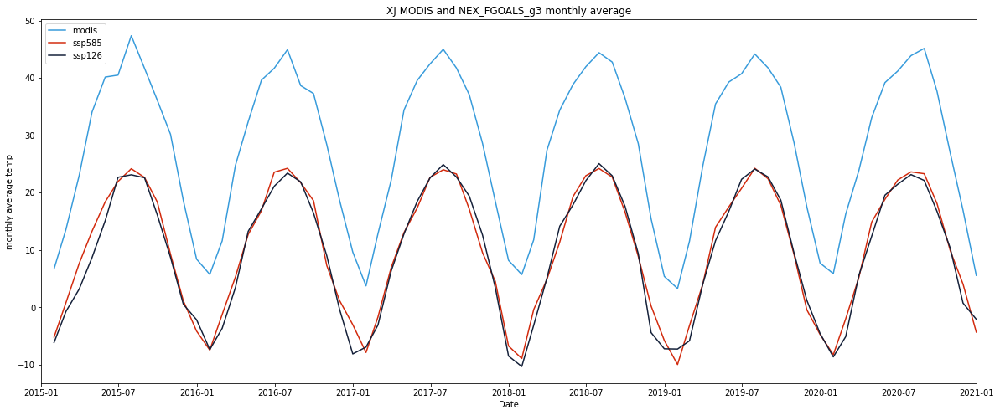

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_FGOALS_g3_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_FGOALS_g3_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_FGOALS_g3 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_FGOALS_g3_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_FGOALS_g3_monthly_avg_temp)) 
XJ_ssp585_FGOALS_g3_monthly_rmse

18.193142785928014

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_FGOALS_g3_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_FGOALS_g3_monthly_avg_temp)) 
XJ_ssp126_FGOALS_g3_monthly_rmse

18.788846573021797

#### time series analysis

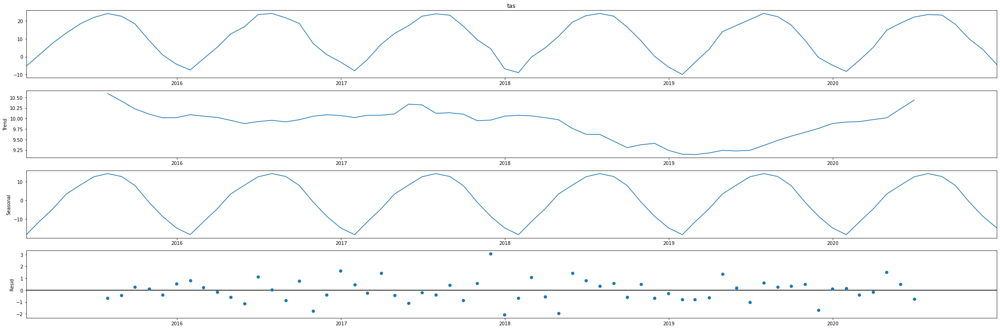

In [ ]:

XJ_ssp585_FGOALS_g3_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_FGOALS_g3_monthly_avg_temp, model='additive')
fig = XJ_ssp585_FGOALS_g3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

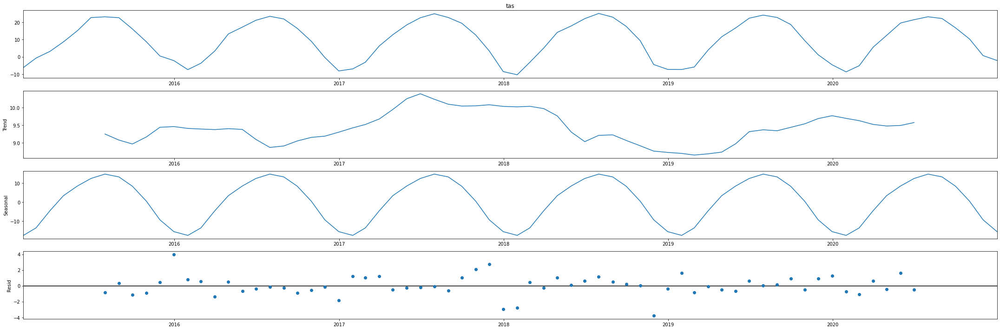

In [ ]:

XJ_ssp126_FGOALS_g3_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_FGOALS_g3_monthly_avg_temp, model='additive')
fig = XJ_ssp126_FGOALS_g3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_FGOALS_g3_model = LinearRegression()
x = XJ_ssp585_FGOALS_g3_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_FGOALS_g3_model.fit(x, y)
XJ_ssp585_FGOALS_g3_r_squared =XJ_ssp585_FGOALS_g3_model.score(x, y)
XJ_ssp585_FGOALS_g3_r_squared

0.972805697122531

In [ ]:
XJ_ssp126_FGOALS_g3_model = LinearRegression()
x = XJ_ssp126_FGOALS_g3_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_FGOALS_g3_model.fit(x, y)
XJ_ssp126_FGOALS_g3_r_squared = XJ_ssp126_FGOALS_g3_model.score(x, y)
XJ_ssp126_FGOALS_g3_r_squared

0.9578211066727885

#### seasonal analysis

In [ ]:
month = XJ_ssp585_FGOALS_g3_monthly_avg_temp.index.month
XJ_ssp585_FGOALS_g3_winter = pd.concat([XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 1], XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 2],XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 12]])
XJ_ssp585_FGOALS_g3_spring = pd.concat([XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 3], XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 4],XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 5]])
XJ_ssp585_FGOALS_g3_summer = pd.concat([XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 6], XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 7],XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 8]])
XJ_ssp585_FGOALS_g3_fall = pd.concat([XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 9], XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 10],XJ_ssp585_FGOALS_g3_monthly_avg_temp[month == 11]])
XJ_ssp585_FGOALS_g3_winter.sort_index()
XJ_ssp585_FGOALS_g3_spring.sort_index()
XJ_ssp585_FGOALS_g3_summer.sort_index()
XJ_ssp585_FGOALS_g3_fall.sort_index()

time
2015-09-30    18.356475
2015-10-31     9.228993
2015-11-30     1.121678
2016-09-30    18.589963
2016-10-31     7.303146
2016-11-30     1.178720
2017-09-30    17.111314
2017-10-31     9.526569
2017-11-30     4.509398
2018-09-30    16.600505
2018-10-31     8.867292
2018-11-30     0.219027
2019-09-30    17.794880
2019-10-31     9.187444
2019-11-30    -0.450035
2020-09-30    18.095672
2020-10-31     9.883762
2020-11-30     4.034714
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_FGOALS_g3_monthly_avg_temp.index.month
XJ_ssp126_FGOALS_g3_winter = pd.concat([XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 1], XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 2],XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 12]])
XJ_ssp126_FGOALS_g3_spring = pd.concat([XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 3], XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 4],XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 5]])
XJ_ssp126_FGOALS_g3_summer = pd.concat([XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 6], XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 7],XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 8]])
XJ_ssp126_FGOALS_g3_fall = pd.concat([XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 9], XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 10],XJ_ssp126_FGOALS_g3_monthly_avg_temp[month == 11]])
XJ_ssp126_FGOALS_g3_winter.sort_index()
XJ_ssp126_FGOALS_g3_spring.sort_index()
XJ_ssp126_FGOALS_g3_summer.sort_index()
XJ_ssp126_FGOALS_g3_fall.sort_index()

time
2015-09-30    16.104586
2015-10-31     8.696077
2015-11-30     0.513517
2016-09-30    16.438980
2016-10-31     9.015865
2016-11-30    -0.344777
2017-09-30    19.386532
2017-10-31    12.610667
2017-11-30     3.421129
2018-09-30    17.607635
2018-10-31     9.359342
2018-11-30    -4.417991
2019-09-30    18.682178
2019-10-31     9.459338
2019-11-30     1.210198
2020-09-30    16.727628
2020-10-31    10.317015
2020-11-30     0.729531
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_FGOALS_g3_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.2661211659341952
coef:  [[0.70687324]]
intercept:  [12.49062071]


In [ ]:
x = XJ_ssp126_FGOALS_g3_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8807606145498782
coef:  [[1.09040086]]
intercept:  [20.1284027]


In [ ]:
x = XJ_ssp126_FGOALS_g3_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.33259997640106864
coef:  [[1.16557683]]
intercept:  [16.17084693]


In [ ]:
x = XJ_ssp126_FGOALS_g3_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9535288006166351
coef:  [[1.08046953]]
intercept:  [17.84018728]


#####ssp585

In [ ]:
x = XJ_ssp585_FGOALS_g3_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.7500216405299771
coef:  [[1.02396082]]
intercept:  [13.31640682]


In [ ]:
x = XJ_ssp585_FGOALS_g3_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8954156653486728
coef:  [[1.1570464]]
intercept:  [18.33962821]


In [ ]:
x = XJ_ssp585_FGOALS_g3_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.6602712577594902
coef:  [[1.72819369]]
intercept:  [2.97401639]


In [ ]:
x = XJ_ssp585_FGOALS_g3_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9426625046977495
coef:  [[1.17618636]]
intercept:  [16.59135806]


### XJ_NEX_EC-Earth3-Veg-LR

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1MW51eMkQqfKxTEts99yNrStTaK7SdynI/view?usp=share_link
id = "1MW51eMkQqfKxTEts99yNrStTaK7SdynI"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_EC-Earth3-Veg-LR.csv')

XJ_ssp585_EC_Earth3_Veg_LR = pd.read_csv('XJ_ssp585_EC-Earth3-Veg-LR.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_EC_Earth3_Veg_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-13.894836
2015-01-01,1,36.375,82.375,-17.182053
2015-01-01,2,36.375,82.625,-17.514359
2015-01-01,3,36.375,82.875,-16.916016
2015-01-01,4,36.375,83.125,-19.137833


In [ ]:
XJ_ssp585_EC_Earth3_Veg_LR

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-13.894836
2015-01-01,1,36.375,82.375,-17.182053
2015-01-01,2,36.375,82.625,-17.514359
2015-01-01,3,36.375,82.875,-16.916016
2015-01-01,4,36.375,83.125,-19.137833
...,...,...,...,...
2020-12-30,315355,39.125,83.875,-6.728455
2020-12-30,315356,39.125,84.125,-6.686676
2020-12-30,315357,39.125,84.375,-6.677399


In [ ]:
XJ_ssp585_EC_Earth3_Veg_LR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_EC_Earth3_Veg_LR_avg_temp = XJ_ssp585_EC_Earth3_Veg_LR.groupby(XJ_ssp585_EC_Earth3_Veg_LR.index)['tas'].mean()
XJ_ssp585_EC_Earth3_Veg_LR_avg_temp

time
2015-01-01   -7.283211
2015-01-02   -7.490591
2015-01-03   -8.250923
2015-01-04   -6.309139
2015-01-05   -5.514544
                ...   
2020-12-26   -5.687779
2020-12-27   -5.646143
2020-12-28   -6.845773
2020-12-29   -8.457588
2020-12-30   -8.811717
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp = XJ_ssp585_EC_Earth3_Veg_LR_avg_temp.resample('M').mean()
XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp

time
2015-01-31    -8.641124
2015-02-28    -3.613950
2015-03-31     5.668223
2015-04-30    11.708718
2015-05-31    19.591039
                ...    
2020-08-31    23.208809
2020-09-30    16.906360
2020-10-31     8.314327
2020-11-30     1.964102
2020-12-31    -4.906591
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1mAhFlVlCMidsg6eLoa5oGSUUrH1Pn5NW/view?usp=share_link
id = "1mAhFlVlCMidsg6eLoa5oGSUUrH1Pn5NW"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_EC-Earth3-Veg-LR.csv')

XJ_ssp126_EC_Earth3_Veg_LR= pd.read_csv('XJ_ssp126_EC-Earth3-Veg-LR.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_EC_Earth3_Veg_LR.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,39.125,82.125,-5.524048
2015-01-01,1,39.125,82.375,-5.846741
2015-01-01,2,39.125,82.625,-6.262451
2015-01-01,3,39.125,82.875,-6.469665
2015-01-01,4,39.125,83.125,-6.541199


In [ ]:
XJ_ssp126_EC_Earth3_Veg_LR['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_EC_Earth3_Veg_LR_avg_temp = XJ_ssp126_EC_Earth3_Veg_LR.groupby(XJ_ssp126_EC_Earth3_Veg_LR.index)['tas'].mean()
XJ_ssp126_EC_Earth3_Veg_LR_avg_temp

time
2015-01-01    -7.347705
2015-01-02    -7.526038
2015-01-03    -8.294869
2015-01-04    -6.284794
2015-01-05    -5.504714
                ...    
2020-12-27   -10.013263
2020-12-28   -10.327068
2020-12-29    -9.021354
2020-12-30    -9.188875
2020-12-31    -8.852668
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp = XJ_ssp126_EC_Earth3_Veg_LR_avg_temp.resample('M').mean()
XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp 

time
2015-01-31    -8.402920
2015-02-28    -2.502884
2015-03-31     4.836653
2015-04-30    13.043851
2015-05-31    17.101477
                ...    
2020-08-31    23.056844
2020-09-30    19.243360
2020-10-31    10.127058
2020-11-30     1.040530
2020-12-31    -5.163303
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

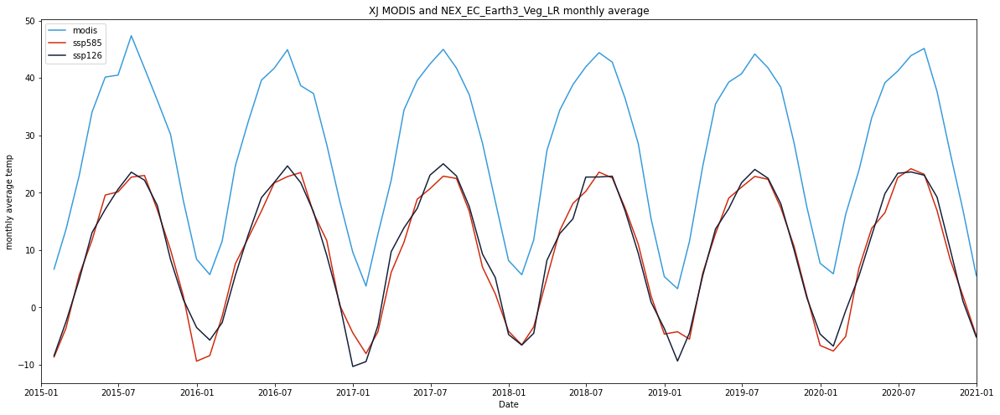

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_EC_Earth3_Veg_LR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_EC_Earth3_Veg_LR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp)) 
XJ_ssp585_EC_Earth3_Veg_LR_monthly_rmse

18.596741923365762

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_EC_Earth3_Veg_LR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp)) 
XJ_ssp126_EC_Earth3_Veg_LR_monthly_rmse

18.296137371296542

#### time series analysis

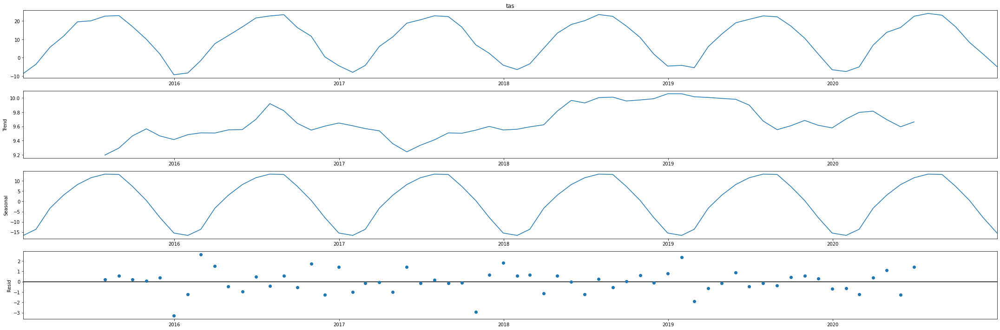

In [ ]:

XJ_ssp585_EC_Earth3_Veg_LR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp, model='additive')
fig = XJ_ssp585_EC_Earth3_Veg_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

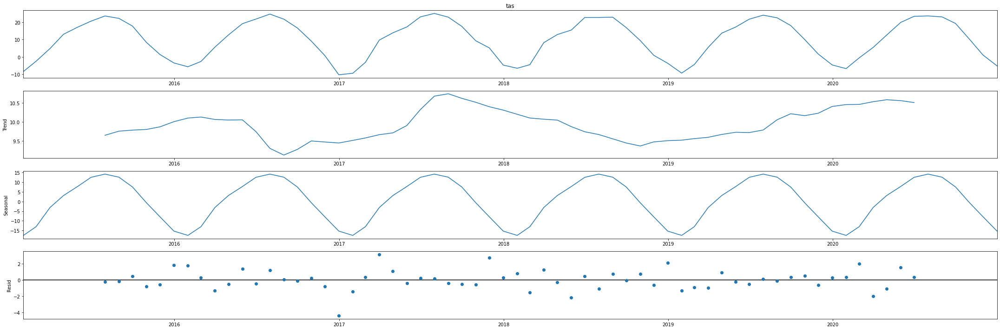

In [ ]:

XJ_ssp126_EC_Earth3_Veg_LR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp, model='additive')
fig = XJ_ssp126_EC_Earth3_Veg_LR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_EC_Earth3_Veg_LR_model = LinearRegression()
x = XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_EC_Earth3_Veg_LR_model.fit(x, y)
XJ_ssp585_EC_Earth3_Veg_LR_r_squared =XJ_ssp585_EC_Earth3_Veg_LR_model.score(x, y)
XJ_ssp585_EC_Earth3_Veg_LR_r_squared

0.9680770777904649

In [ ]:
XJ_ssp126_EC_Earth3_Veg_LR_model = LinearRegression()
x = XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_EC_Earth3_Veg_LR_model.fit(x, y)
XJ_ssp126_EC_Earth3_Veg_LR_r_squared = XJ_ssp126_EC_Earth3_Veg_LR_model.score(x, y)
XJ_ssp126_EC_Earth3_Veg_LR_r_squared

0.9727370946424394

#### seasonal analysis

In [ ]:
month = XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp.index.month
XJ_ssp585_EC_Earth3_Veg_LR_winter = pd.concat([XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 1], XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 2],XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 12]])
XJ_ssp585_EC_Earth3_Veg_LR_spring = pd.concat([XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 3], XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 4],XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 5]])
XJ_ssp585_EC_Earth3_Veg_LR_summer = pd.concat([XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 6], XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 7],XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 8]])
XJ_ssp585_EC_Earth3_Veg_LR_fall = pd.concat([XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 9], XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 10],XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp[month == 11]])
XJ_ssp585_EC_Earth3_Veg_LR_winter.sort_index()
XJ_ssp585_EC_Earth3_Veg_LR_spring.sort_index()
XJ_ssp585_EC_Earth3_Veg_LR_summer.sort_index()
XJ_ssp585_EC_Earth3_Veg_LR_fall.sort_index()

time
2015-09-30    17.016605
2015-10-31    10.042794
2015-11-30     1.970689
2016-09-30    16.446973
2016-10-31    11.670915
2016-11-30     0.443428
2017-09-30    16.756466
2017-10-31     7.025497
2017-11-30     2.364444
2018-09-30    17.349694
2018-10-31    11.008705
2018-11-30     1.997766
2019-09-30    17.364536
2019-10-31    10.672586
2019-11-30     2.028360
2020-09-30    16.906360
2020-10-31     8.314327
2020-11-30     1.964102
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp.index.month
XJ_ssp126_EC_Earth3_Veg_LR_winter = pd.concat([XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 1], XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 2],XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 12]])
XJ_ssp126_EC_Earth3_Veg_LR_spring = pd.concat([XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 3], XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 4],XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 5]])
XJ_ssp126_EC_Earth3_Veg_LR_summer = pd.concat([XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 6], XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 7],XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 8]])
XJ_ssp126_EC_Earth3_Veg_LR_fall = pd.concat([XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 9], XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 10],XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp[month == 11]])
XJ_ssp126_EC_Earth3_Veg_LR_winter.sort_index()
XJ_ssp126_EC_Earth3_Veg_LR_spring.sort_index()
XJ_ssp126_EC_Earth3_Veg_LR_summer.sort_index()
XJ_ssp126_EC_Earth3_Veg_LR_fall.sort_index()

time
2015-09-30    17.770711
2015-10-31     8.347841
2015-11-30     1.381303
2016-09-30    16.677371
2016-10-31     9.086155
2016-11-30     0.761367
2017-09-30    17.589201
2017-10-31     9.294274
2017-11-30     5.203007
2018-09-30    16.874406
2018-10-31     9.444388
2018-11-30     0.932677
2019-09-30    18.084629
2019-10-31    10.035327
2019-11-30     1.703930
2020-09-30    19.243360
2020-10-31    10.127058
2020-11-30     1.040530
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_EC_Earth3_Veg_LR_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.4845784572873363
coef:  [[0.95611963]]
intercept:  [13.61332315]


In [ ]:
x = XJ_ssp126_EC_Earth3_Veg_LR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8988268589682525
coef:  [[1.26880056]]
intercept:  [16.76572938]


In [ ]:
x = XJ_ssp126_EC_Earth3_Veg_LR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5174919190891247
coef:  [[1.39608543]]
intercept:  [10.79790279]


In [ ]:
x = XJ_ssp126_EC_Earth3_Veg_LR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9562537657752008
coef:  [[1.20002223]]
intercept:  [16.20216819]


#####ssp585

In [ ]:
x = XJ_ssp585_EC_Earth3_Veg_LR_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.22186747193306355
coef:  [[0.81119662]]
intercept:  [13.06406477]


In [ ]:
x = XJ_ssp585_EC_Earth3_Veg_LR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9143850076474601
coef:  [[1.22498043]]
intercept:  [17.4821776]


In [ ]:
x = XJ_ssp585_EC_Earth3_Veg_LR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.13604853333113154
coef:  [[0.67396859]]
intercept:  [27.70555973]


In [ ]:
x = XJ_ssp585_EC_Earth3_Veg_LR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9611438721644237
coef:  [[1.25793041]]
intercept:  [15.80115514]


### XJ_NEX_EC-Earth3

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1lEHnpbZnPNMZnbPiNWzlQ42yquCBiAxw/view?usp=share_link

id = "1lEHnpbZnPNMZnbPiNWzlQ42yquCBiAxw"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_EC-Earth3.csv')

XJ_ssp585_EC_Earth3 = pd.read_csv('XJ_ssp585_EC-Earth3.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_EC_Earth3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-10.592163
2015-01-01,1,36.375,82.375,-13.921509
2015-01-01,2,36.375,82.625,-14.422150
2015-01-01,3,36.375,82.875,-13.992188
2015-01-01,4,36.375,83.125,-16.466827


In [ ]:
XJ_ssp585_EC_Earth3

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-10.592163
2015-01-01,1,36.375,82.375,-13.921509
2015-01-01,2,36.375,82.625,-14.422150
2015-01-01,3,36.375,82.875,-13.992188
2015-01-01,4,36.375,83.125,-16.466827
...,...,...,...,...
2020-12-30,315355,39.125,83.875,-6.661865
2020-12-30,315356,39.125,84.125,-6.521973
2020-12-30,315357,39.125,84.375,-6.414551


In [ ]:
XJ_ssp585_EC_Earth3['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_EC_Earth3_avg_temp = XJ_ssp585_EC_Earth3.groupby(XJ_ssp585_EC_Earth3.index)['tas'].mean()
XJ_ssp585_EC_Earth3_avg_temp

time
2015-01-01   -3.919253
2015-01-02   -3.582900
2015-01-03   -2.731742
2015-01-04   -4.550451
2015-01-05   -6.475217
                ...   
2020-12-26   -8.803425
2020-12-27   -8.219970
2020-12-28   -7.063683
2020-12-29   -6.788376
2020-12-30   -7.495542
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_EC_Earth3_monthly_avg_temp = XJ_ssp585_EC_Earth3_avg_temp.resample('M').mean()
XJ_ssp585_EC_Earth3_monthly_avg_temp

time
2015-01-31    -7.867256
2015-02-28    -0.785409
2015-03-31     5.989186
2015-04-30    12.642032
2015-05-31    19.212177
                ...    
2020-08-31    24.179961
2020-09-30    17.833039
2020-10-31     9.772395
2020-11-30     0.616408
2020-12-31    -7.653270
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1s1HjLfzPx-W9-4eORjuQC0OdYP3FOxMN/view?usp=share_link
id = "1s1HjLfzPx-W9-4eORjuQC0OdYP3FOxMN"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_EC-Earth3.csv')

XJ_ssp126_EC_Earth3= pd.read_csv('XJ_ssp126_EC-Earth3.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_EC_Earth3.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-10.579285
2015-01-01,1,36.375,82.375,-13.910126
2015-01-01,2,36.375,82.625,-14.420929
2015-01-01,3,36.375,82.875,-14.001099
2015-01-01,4,36.375,83.125,-16.474304


In [ ]:
XJ_ssp126_EC_Earth3['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_EC_Earth3_avg_temp = XJ_ssp126_EC_Earth3.groupby(XJ_ssp126_EC_Earth3.index)['tas'].mean()
XJ_ssp126_EC_Earth3_avg_temp

time
2015-01-01   -3.907906
2015-01-02   -3.540861
2015-01-03   -2.724513
2015-01-04   -4.541122
2015-01-05   -6.583035
                ...   
2020-12-27   -8.831427
2020-12-28   -7.354743
2020-12-29   -5.430859
2020-12-30   -4.696110
2020-12-31   -5.023450
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_EC_Earth3_monthly_avg_temp = XJ_ssp126_EC_Earth3_avg_temp.resample('M').mean()
XJ_ssp126_EC_Earth3_monthly_avg_temp 

time
2015-01-31    -7.117419
2015-02-28    -3.174110
2015-03-31     6.241323
2015-04-30    15.160521
2015-05-31    17.676153
                ...    
2020-08-31    23.970191
2020-09-30    18.962183
2020-10-31    10.614653
2020-11-30     2.351968
2020-12-31    -5.349126
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

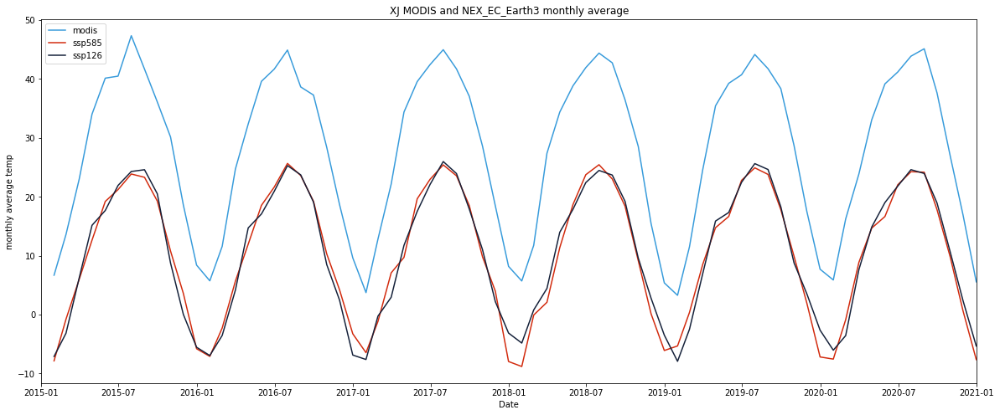

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_EC_Earth3_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_EC_Earth3_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_EC_Earth3 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_EC_Earth3_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_EC_Earth3_monthly_avg_temp)) 
XJ_ssp585_EC_Earth3_monthly_rmse

17.85244116970508

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_EC_Earth3_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_EC_Earth3_monthly_avg_temp)) 
XJ_ssp126_EC_Earth3_monthly_rmse

17.753209119835038

#### time series analysis

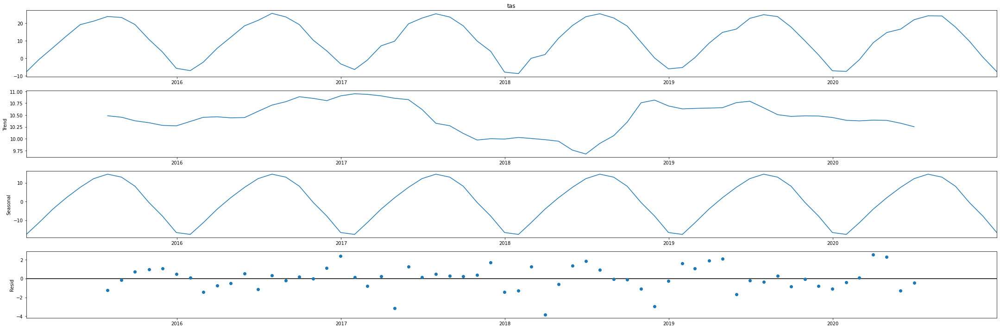

In [ ]:

XJ_ssp585_EC_Earth3_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_EC_Earth3_monthly_avg_temp, model='additive')
fig = XJ_ssp585_EC_Earth3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

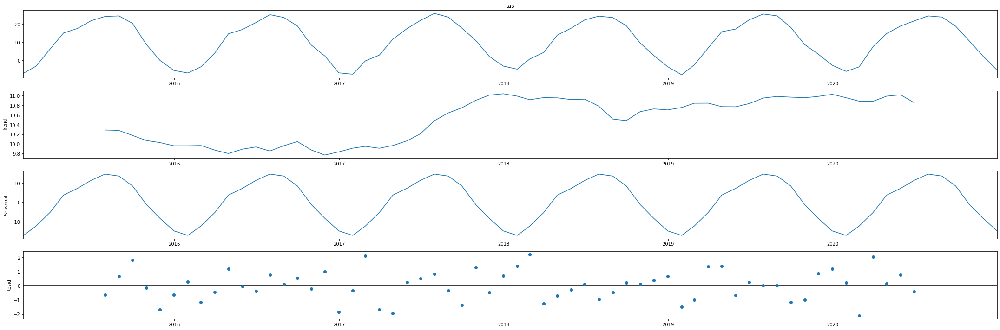

In [ ]:

XJ_ssp126_EC_Earth3_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_EC_Earth3_monthly_avg_temp, model='additive')
fig = XJ_ssp126_EC_Earth3_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_EC_Earth3_model = LinearRegression()
x = XJ_ssp585_EC_Earth3_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_EC_Earth3_model.fit(x, y)
XJ_ssp585_EC_Earth3_r_squared =XJ_ssp585_EC_Earth3_model.score(x, y)
XJ_ssp585_EC_Earth3_r_squared

0.9660787434959507

In [ ]:
XJ_ssp126_EC_Earth3_model = LinearRegression()
x = XJ_ssp126_EC_Earth3_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_EC_Earth3_model.fit(x, y)
XJ_ssp126_EC_Earth3_r_squared = XJ_ssp126_EC_Earth3_model.score(x, y)
XJ_ssp126_EC_Earth3_r_squared

0.9628244050035107

#### seasonal analysis

In [ ]:
month = XJ_ssp585_EC_Earth3_monthly_avg_temp.index.month
XJ_ssp585_EC_Earth3_winter = pd.concat([XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 1], XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 2],XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 12]])
XJ_ssp585_EC_Earth3_spring = pd.concat([XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 3], XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 4],XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 5]])
XJ_ssp585_EC_Earth3_summer = pd.concat([XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 6], XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 7],XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 8]])
XJ_ssp585_EC_Earth3_fall = pd.concat([XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 9], XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 10],XJ_ssp585_EC_Earth3_monthly_avg_temp[month == 11]])
XJ_ssp585_EC_Earth3_winter.sort_index()
XJ_ssp585_EC_Earth3_spring.sort_index()
XJ_ssp585_EC_Earth3_summer.sort_index()
XJ_ssp585_EC_Earth3_fall.sort_index()

time
2015-09-30    19.271997
2015-10-31    10.784656
2015-11-30     3.590304
2016-09-30    19.233446
2016-10-31    10.300877
2016-11-30     4.205657
2017-09-30    18.513300
2017-10-31     9.811106
2017-11-30     3.981028
2018-09-30    18.414846
2018-10-31     9.147429
2018-11-30     0.126671
2019-09-30    17.825442
2019-10-31     9.901799
2019-11-30     1.938219
2020-09-30    17.833039
2020-10-31     9.772395
2020-11-30     0.616408
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_EC_Earth3_monthly_avg_temp.index.month
XJ_ssp126_EC_Earth3_winter = pd.concat([XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 1], XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 2],XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 12]])
XJ_ssp126_EC_Earth3_spring = pd.concat([XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 3], XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 4],XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 5]])
XJ_ssp126_EC_Earth3_summer = pd.concat([XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 6], XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 7],XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 8]])
XJ_ssp126_EC_Earth3_fall = pd.concat([XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 9], XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 10],XJ_ssp126_EC_Earth3_monthly_avg_temp[month == 11]])
XJ_ssp126_EC_Earth3_winter.sort_index()
XJ_ssp126_EC_Earth3_spring.sort_index()
XJ_ssp126_EC_Earth3_summer.sort_index()
XJ_ssp126_EC_Earth3_fall.sort_index()

time
2015-09-30    20.512800
2015-10-31     8.744232
2015-11-30     0.029328
2016-09-30    19.091904
2016-10-31     8.483058
2016-11-30     2.450913
2017-09-30    17.917292
2017-10-31    11.019569
2017-11-30     2.209129
2018-09-30    19.223163
2018-10-31     9.589645
2018-11-30     2.773936
2019-09-30    18.311420
2019-10-31     8.777778
2019-11-30     3.520898
2020-09-30    18.962183
2020-10-31    10.614653
2020-11-30     2.351968
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_EC_Earth3_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.44140339035456777
coef:  [[0.98707865]]
intercept:  [12.90071756]


In [ ]:
x = XJ_ssp126_EC_Earth3_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9037247940642598
coef:  [[1.12597955]]
intercept:  [18.47421432]


In [ ]:
x = XJ_ssp126_EC_Earth3_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3071630021689379
coef:  [[0.81340959]]
intercept:  [23.50224352]


In [ ]:
x = XJ_ssp126_EC_Earth3_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9304718728784684
coef:  [[1.12109734]]
intercept:  [16.27908045]


#####ssp585

In [ ]:
x = XJ_ssp585_EC_Earth3_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6827959725583592
coef:  [[0.95944357]]
intercept:  [13.10468714]


In [ ]:
x = XJ_ssp585_EC_Earth3_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.7959213023444542
coef:  [[1.0987907]]
intercept:  [18.96577485]


In [ ]:
x = XJ_ssp585_EC_Earth3_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3954626310784578
coef:  [[1.05635607]]
intercept:  [17.80274681]


In [ ]:
x = XJ_ssp585_EC_Earth3_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9724221699722068
coef:  [[1.1934824]]
intercept:  [15.49139432]


### XJ_NEX_CNRM-ESM2-1

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1zs4GcsfdVxWyHL_L8BQqxdnaLyK3cCP1/view?usp=share_link
id = "1zs4GcsfdVxWyHL_L8BQqxdnaLyK3cCP1"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_CNRM-ESM2-1.csv')

XJ_ssp585_CNRM_ESM2_1 = pd.read_csv('XJ_ssp585_CNRM-ESM2-1.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_CNRM_ESM2_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-14.492065
2015-01-01,1,36.375,82.375,-17.882935
2015-01-01,2,36.375,82.625,-18.318878
2015-01-01,3,36.375,82.875,-17.824158
2015-01-01,4,36.375,83.125,-20.069550


In [ ]:
XJ_ssp585_CNRM_ESM2_1

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-14.492065
2015-01-01,1,36.375,82.375,-17.882935
2015-01-01,2,36.375,82.625,-18.318878
2015-01-01,3,36.375,82.875,-17.824158
2015-01-01,4,36.375,83.125,-20.069550
...,...,...,...,...
2020-12-30,315355,39.125,83.875,-3.847961
2020-12-30,315356,39.125,84.125,-3.979217
2020-12-30,315357,39.125,84.375,-4.142975


In [ ]:
XJ_ssp585_CNRM_ESM2_1['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_CNRM_ESM2_1_avg_temp = XJ_ssp585_CNRM_ESM2_1.groupby(XJ_ssp585_CNRM_ESM2_1.index)['tas'].mean()
XJ_ssp585_CNRM_ESM2_1_avg_temp

time
2015-01-01    -8.919566
2015-01-02   -10.030213
2015-01-03   -12.998974
2015-01-04   -14.910890
2015-01-05   -14.536971
                ...    
2020-12-26    -8.346619
2020-12-27    -8.211121
2020-12-28    -7.267300
2020-12-29    -5.968067
2020-12-30    -5.950053
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp = XJ_ssp585_CNRM_ESM2_1_avg_temp.resample('M').mean()
XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp

time
2015-01-31    -8.802176
2015-02-28    -1.605796
2015-03-31     2.502145
2015-04-30    14.731637
2015-05-31    16.310963
                ...    
2020-08-31    22.513077
2020-09-30    17.541734
2020-10-31     9.798174
2020-11-30     2.830484
2020-12-31    -3.944185
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1j84ZTuFPtf2enRGGxSY6xwRu47hHUYKB/view?usp=share_link
id = "1j84ZTuFPtf2enRGGxSY6xwRu47hHUYKB"

file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_CNRM-ESM2-1_ssp126.csv')

XJ_ssp126_CNRM_ESM2_1= pd.read_csv('XJ_CNRM-ESM2-1_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_CNRM_ESM2_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-14.421692
2015-01-01,1,36.375,82.375,-17.820465
2015-01-01,2,36.375,82.625,-18.264313
2015-01-01,3,36.375,82.875,-17.777496
2015-01-01,4,36.375,83.125,-20.017609


In [ ]:
XJ_ssp126_CNRM_ESM2_1['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_CNRM_ESM2_1_avg_temp = XJ_ssp126_CNRM_ESM2_1.groupby(XJ_ssp126_CNRM_ESM2_1.index)['tas'].mean()
XJ_ssp126_CNRM_ESM2_1_avg_temp

time
2015-01-01    -8.940085
2015-01-02   -10.118670
2015-01-03   -12.667888
2015-01-04   -14.906601
2015-01-05   -14.531849
                ...    
2020-12-27    -7.838608
2020-12-28    -8.054657
2020-12-29    -8.625333
2020-12-30   -10.296956
2020-12-31   -10.225696
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp = XJ_ssp126_CNRM_ESM2_1_avg_temp.resample('M').mean()
XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp 

time
2015-01-31    -9.040109
2015-02-28    -5.258215
2015-03-31     6.984531
2015-04-30    15.563505
2015-05-31    14.819721
                ...    
2020-08-31    23.231239
2020-09-30    16.552314
2020-10-31     9.282211
2020-11-30     1.059806
2020-12-31    -7.024644
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

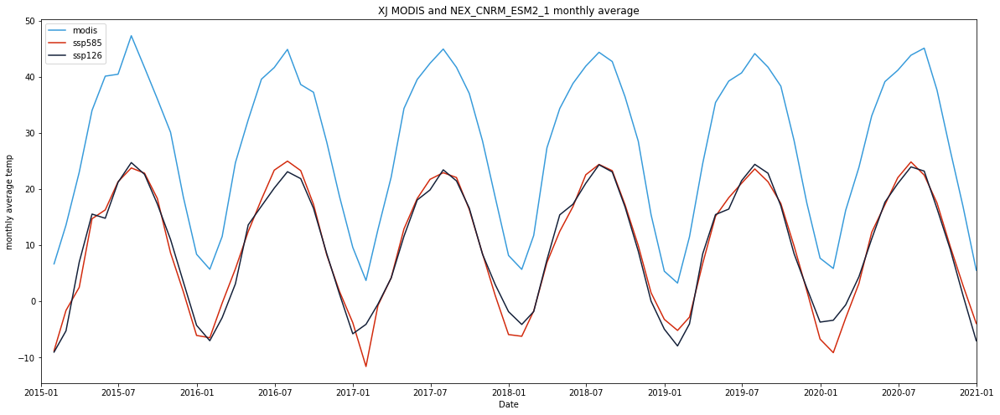

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_CNRM_ESM2_1 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_CNRM_ESM2_1_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp)) 
XJ_ssp585_CNRM_ESM2_1_monthly_rmse

18.381391136113557

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_CNRM_ESM2_1_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp)) 
XJ_ssp126_CNRM_ESM2_1_monthly_rmse

18.42438768149008

#### time series analysis

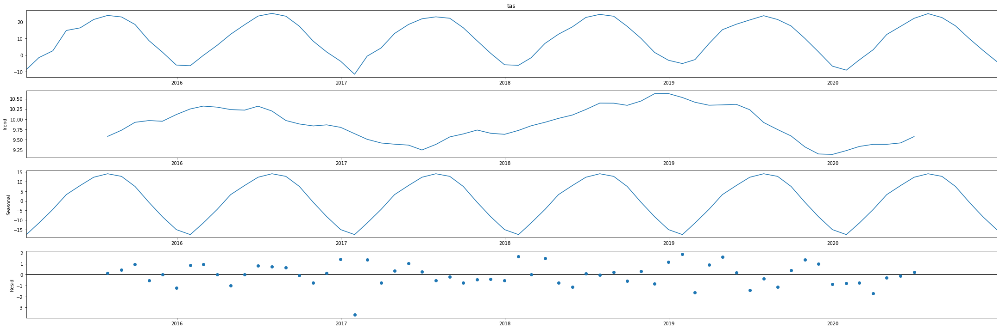

In [ ]:

XJ_ssp585_CNRM_ESM2_1_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp, model='additive')
fig = XJ_ssp585_CNRM_ESM2_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

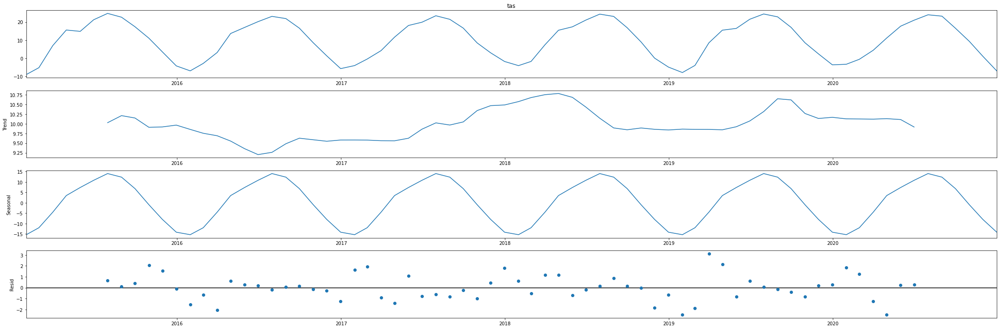

In [ ]:

XJ_ssp126_CNRM_ESM2_1_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp, model='additive')
fig = XJ_ssp126_CNRM_ESM2_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_CNRM_ESM2_1_model = LinearRegression()
x = XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_CNRM_ESM2_1_model.fit(x, y)
XJ_ssp585_CNRM_ESM2_1_r_squared =XJ_ssp585_CNRM_ESM2_1_model.score(x, y)
XJ_ssp585_CNRM_ESM2_1_r_squared

0.9694523465629147

In [ ]:
XJ_ssp126_CNRM_ESM2_1_model = LinearRegression()
x = XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_CNRM_ESM2_1_model.fit(x, y)
XJ_ssp126_CNRM_ESM2_1_r_squared = XJ_ssp126_CNRM_ESM2_1_model.score(x, y)
XJ_ssp126_CNRM_ESM2_1_r_squared

0.9684010526674265

#### seasonal analysis

In [ ]:
month = XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp.index.month
XJ_ssp585_CNRM_ESM2_1_winter = pd.concat([XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 1], XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 2],XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 12]])
XJ_ssp585_CNRM_ESM2_1_spring = pd.concat([XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 3], XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 4],XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 5]])
XJ_ssp585_CNRM_ESM2_1_summer = pd.concat([XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 6], XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 7],XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 8]])
XJ_ssp585_CNRM_ESM2_1_fall = pd.concat([XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 9], XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 10],XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp[month == 11]])
XJ_ssp585_CNRM_ESM2_1_winter.sort_index()
XJ_ssp585_CNRM_ESM2_1_spring.sort_index()
XJ_ssp585_CNRM_ESM2_1_summer.sort_index()
XJ_ssp585_CNRM_ESM2_1_fall.sort_index()

time
2015-09-30    18.354474
2015-10-31     8.649332
2015-11-30     1.715978
2016-09-30    17.301084
2016-10-31     8.279143
2016-11-30     1.757055
2017-09-30    16.374187
2017-10-31     8.500020
2017-11-30     1.007242
2018-09-30    17.221315
2018-10-31     9.940512
2018-11-30     1.532658
2019-09-30    17.460162
2019-10-31     9.899675
2019-11-30     1.889186
2020-09-30    17.541734
2020-10-31     9.798174
2020-11-30     2.830484
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp.index.month
XJ_ssp126_CNRM_ESM2_1_winter = pd.concat([XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 1], XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 2],XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 12]])
XJ_ssp126_CNRM_ESM2_1_spring = pd.concat([XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 3], XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 4],XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 5]])
XJ_ssp126_CNRM_ESM2_1_summer = pd.concat([XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 6], XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 7],XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 8]])
XJ_ssp126_CNRM_ESM2_1_fall = pd.concat([XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 9], XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 10],XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp[month == 11]])
XJ_ssp126_CNRM_ESM2_1_winter.sort_index()
XJ_ssp126_CNRM_ESM2_1_spring.sort_index()
XJ_ssp126_CNRM_ESM2_1_summer.sort_index()
XJ_ssp126_CNRM_ESM2_1_fall.sort_index()

time
2015-09-30    17.372828
2015-10-31    11.033029
2015-11-30     3.474496
2016-09-30    16.593782
2016-10-31     8.510074
2016-11-30     1.287756
2017-09-30    16.624458
2017-10-31     8.424399
2017-11-30     2.960773
2018-09-30    16.835102
2018-10-31     8.949249
2018-11-30     0.040966
2019-09-30    17.035263
2019-10-31     8.511928
2019-11-30     2.367852
2020-09-30    16.552314
2020-10-31     9.282211
2020-11-30     1.059806
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_CNRM_ESM2_1_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.3739448101596645
coef:  [[0.93819584]]
intercept:  [12.59470446]


In [ ]:
x = XJ_ssp126_CNRM_ESM2_1_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8862155766207764
coef:  [[1.20320523]]
intercept:  [17.93628083]


In [ ]:
x = XJ_ssp126_CNRM_ESM2_1_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5041368523533838
coef:  [[1.0152622]]
intercept:  [19.98385236]


In [ ]:
x = XJ_ssp126_CNRM_ESM2_1_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9777206275660013
coef:  [[1.29080699]]
intercept:  [15.80573457]


#####ssp585

In [ ]:
x = XJ_ssp585_CNRM_ESM2_1_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.495437122546288
coef:  [[0.84134375]]
intercept:  [12.59496368]


In [ ]:
x = XJ_ssp585_CNRM_ESM2_1_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9654035979939994
coef:  [[1.15273476]]
intercept:  [18.79857298]


In [ ]:
x = XJ_ssp585_CNRM_ESM2_1_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.29318956509182115
coef:  [[0.9688537]]
intercept:  [20.59056428]


In [ ]:
x = XJ_ssp585_CNRM_ESM2_1_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9600959022522914
coef:  [[1.23495054]]
intercept:  [16.10853394]


### XJ_NEX_CNRM-CM6-1

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1njSk2t3FH-rIR8teoUhB1qrWWYsmhLwV/view?usp=share_link
id = "1njSk2t3FH-rIR8teoUhB1qrWWYsmhLwV"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_CNRM-CM6-1.csv')

XJ_ssp585_CNRM_CM6_1 = pd.read_csv('XJ_ssp585_CNRM-CM6-1.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_CNRM_CM6_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-7.804871
2015-01-01,1,36.375,82.375,-10.908813
2015-01-01,2,36.375,82.625,-11.057800
2015-01-01,3,36.375,82.875,-10.276154
2015-01-01,4,36.375,83.125,-12.294495


In [ ]:
XJ_ssp585_CNRM_CM6_1

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-7.804871
2015-01-01,1,36.375,82.375,-10.908813
2015-01-01,2,36.375,82.625,-11.057800
2015-01-01,3,36.375,82.875,-10.276154
2015-01-01,4,36.375,83.125,-12.294495
...,...,...,...,...
2020-12-30,315355,39.125,83.875,-3.554352
2020-12-30,315356,39.125,84.125,-3.719177
2020-12-30,315357,39.125,84.375,-3.916504


In [ ]:
XJ_ssp585_CNRM_CM6_1['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_CNRM_CM6_1_avg_temp = XJ_ssp585_CNRM_CM6_1.groupby(XJ_ssp585_CNRM_CM6_1.index)['tas'].mean()
XJ_ssp585_CNRM_CM6_1_avg_temp

time
2015-01-01   -1.695945
2015-01-02   -0.115503
2015-01-03   -2.198153
2015-01-04   -3.344370
2015-01-05   -4.555829
                ...   
2020-12-26   -8.681573
2020-12-27   -7.262027
2020-12-28   -6.165152
2020-12-29   -5.848599
2020-12-30   -4.996409
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_CNRM_CM6_1_monthly_avg_temp = XJ_ssp585_CNRM_CM6_1_avg_temp.resample('M').mean()
XJ_ssp585_CNRM_CM6_1_monthly_avg_temp

time
2015-01-31    -7.407246
2015-02-28    -9.296498
2015-03-31     7.218540
2015-04-30    15.365203
2015-05-31    17.669573
                ...    
2020-08-31    23.841055
2020-09-30    16.416883
2020-10-31    10.880044
2020-11-30     2.127290
2020-12-31    -5.874620
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1wYH9O7lpLNEYTtDdcsGZWuPYvoq76vRR/view?usp=share_link
id = "1wYH9O7lpLNEYTtDdcsGZWuPYvoq76vRR"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_CNRM-CM6-1_ssp126.csv')

XJ_ssp126_CNRM_CM6_1 = pd.read_csv('XJ_CNRM-CM6-1_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_CNRM_CM6_1.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-7.951691
2015-01-01,1,36.375,82.375,-11.018921
2015-01-01,2,36.375,82.625,-11.131195
2015-01-01,3,36.375,82.875,-10.312836
2015-01-01,4,36.375,83.125,-12.312225


In [ ]:
XJ_ssp126_CNRM_CM6_1['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_CNRM_CM6_1_avg_temp = XJ_ssp126_CNRM_CM6_1.groupby(XJ_ssp126_CNRM_CM6_1.index)['tas'].mean()
XJ_ssp126_CNRM_CM6_1_avg_temp

time
2015-01-01   -1.873434
2015-01-02   -0.604836
2015-01-03   -3.261537
2015-01-04   -3.778883
2015-01-05   -4.916756
                ...   
2020-12-27   -6.754986
2020-12-28   -7.762303
2020-12-29   -7.011239
2020-12-30   -7.673725
2020-12-31   -6.519816
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_CNRM_CM6_1_monthly_avg_temp = XJ_ssp126_CNRM_CM6_1_avg_temp.resample('M').mean()
XJ_ssp126_CNRM_CM6_1_monthly_avg_temp 

time
2015-01-31    -7.647799
2015-02-28    -4.080432
2015-03-31     2.516106
2015-04-30    10.702140
2015-05-31    16.029800
                ...    
2020-08-31    22.457149
2020-09-30    17.767277
2020-10-31    10.645140
2020-11-30     2.843943
2020-12-31    -4.710307
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

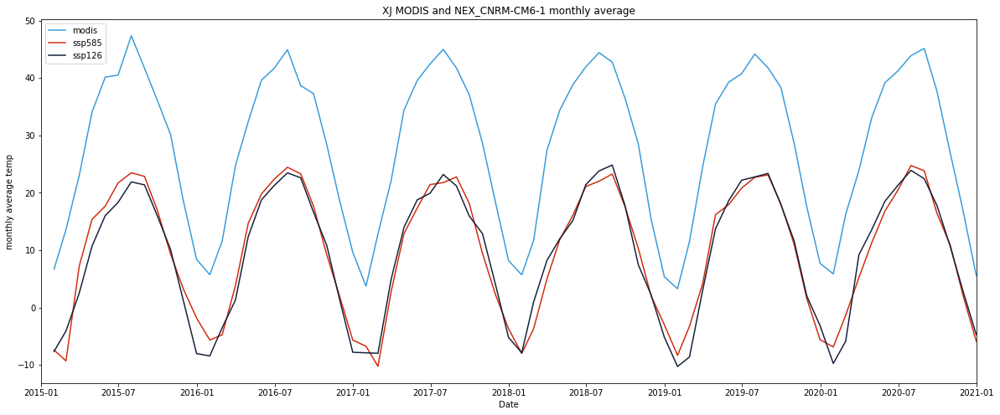

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_CNRM_CM6_1_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_CNRM_CM6_1_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_CNRM-CM6-1 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_CNRM_CM6_1_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp585_CNRM_CM6_1_monthly_avg_temp)) 
XJ_ssp585_CNRM_CM6_1_monthly_rmse

18.55497362305078

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_CNRM_CM6_1_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp126_CNRM_CM6_1_monthly_avg_temp)) 
XJ_ssp126_CNRM_CM6_1_monthly_rmse

18.871911019230545

#### time series analysis

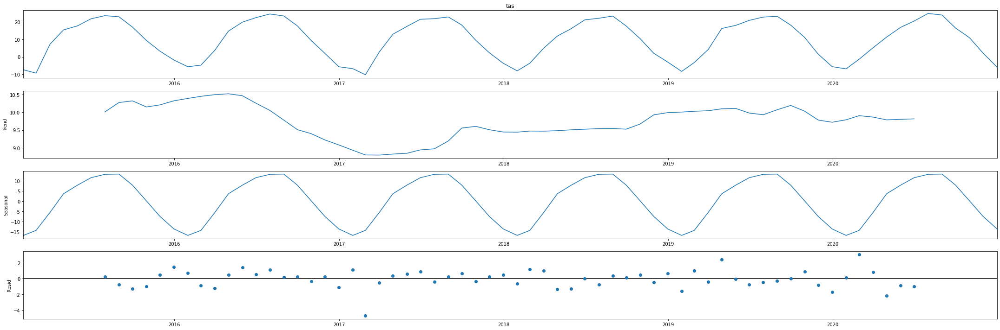

In [ ]:

XJ_ssp585_CNRM_CM6_1_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_CNRM_CM6_1_monthly_avg_temp, model='additive')
fig = XJ_ssp585_CNRM_CM6_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

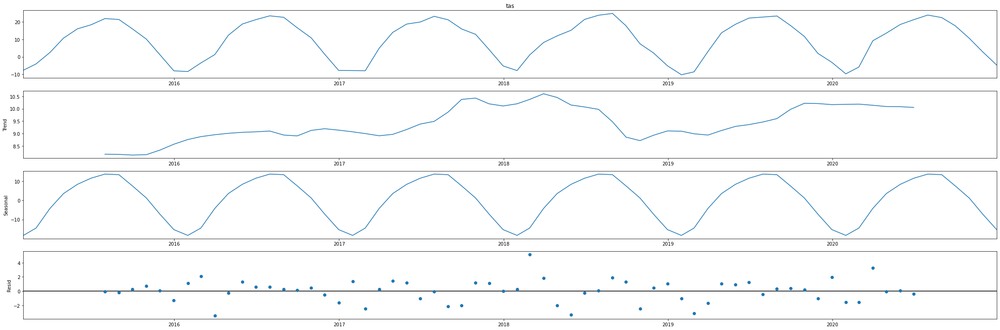

In [ ]:

XJ_ssp126_CNRM_CM6_1_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_CNRM_CM6_1_monthly_avg_temp, model='additive')
fig = XJ_ssp126_CNRM_CM6_1_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_CNRM_CM6_1_model = LinearRegression()
x = XJ_ssp585_CNRM_CM6_1_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_CNRM_CM6_1_model.fit(x, y)
XJ_ssp585_CNRM_CM6_1_r_squared =XJ_ssp585_CNRM_CM6_1_model.score(x, y)
XJ_ssp585_CNRM_CM6_1_r_squared

0.9576447056646412

In [ ]:
XJ_ssp126_CNRM_CM6_1_model = LinearRegression()
x = XJ_ssp126_CNRM_CM6_1_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_CNRM_CM6_1_model.fit(x, y)
XJ_ssp126_CNRM_CM6_1_r_squared = XJ_ssp126_CNRM_CM6_1_model.score(x, y)
XJ_ssp126_CNRM_CM6_1_r_squared

0.9562957725811336

#### seasonal analysis

In [ ]:
month = XJ_ssp585_CNRM_CM6_1_monthly_avg_temp.index.month
XJ_ssp585_CNRM_CM6_1_winter = pd.concat([XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 1], XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 2],XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 12]])
XJ_ssp585_CNRM_CM6_1_spring = pd.concat([XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 3], XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 4],XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 5]])
XJ_ssp585_CNRM_CM6_1_summer = pd.concat([XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 6], XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 7],XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 8]])
XJ_ssp585_CNRM_CM6_1_fall = pd.concat([XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 9], XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 10],XJ_ssp585_CNRM_CM6_1_monthly_avg_temp[month == 11]])
XJ_ssp585_CNRM_CM6_1_winter.sort_index()
XJ_ssp585_CNRM_CM6_1_spring.sort_index()
XJ_ssp585_CNRM_CM6_1_summer.sort_index()
XJ_ssp585_CNRM_CM6_1_fall.sort_index()

time
2015-09-30    16.965477
2015-10-31     9.334374
2015-11-30     3.240273
2016-09-30    17.665652
2016-10-31     9.223921
2016-11-30     2.015668
2017-09-30    18.137045
2017-10-31     9.435245
2017-11-30     2.343991
2018-09-30    17.568089
2018-10-31    10.321433
2018-11-30     2.045323
2019-09-30    18.102186
2019-10-31    11.069338
2019-11-30     1.553543
2020-09-30    16.416883
2020-10-31    10.880044
2020-11-30     2.127290
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_CNRM_CM6_1_monthly_avg_temp.index.month
XJ_ssp126_CNRM_CM6_1_winter = pd.concat([XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 1], XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 2],XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 12]])
XJ_ssp126_CNRM_CM6_1_spring = pd.concat([XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 3], XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 4],XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 5]])
XJ_ssp126_CNRM_CM6_1_summer = pd.concat([XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 6], XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 7],XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 8]])
XJ_ssp126_CNRM_CM6_1_fall = pd.concat([XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 9], XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 10],XJ_ssp126_CNRM_CM6_1_monthly_avg_temp[month == 11]])
XJ_ssp126_CNRM_CM6_1_winter.sort_index()
XJ_ssp126_CNRM_CM6_1_spring.sort_index()
XJ_ssp126_CNRM_CM6_1_summer.sort_index()
XJ_ssp126_CNRM_CM6_1_fall.sort_index()

time
2015-09-30    15.994982
2015-10-31    10.128113
2015-11-30     1.211265
2016-09-30    16.622204
2016-10-31    10.851824
2016-11-30     1.455905
2017-09-30    15.938979
2017-10-31    12.871150
2017-11-30     4.139334
2018-09-30    17.751373
2018-10-31     7.476887
2018-11-30     2.221114
2019-09-30    17.959006
2019-10-31    11.667806
2019-11-30     1.989160
2020-09-30    17.767277
2020-10-31    10.645140
2020-11-30     2.843943
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_CNRM_CM6_1_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.16189240531792115
coef:  [[0.52777365]]
intercept:  [11.88798464]


In [ ]:
x = XJ_ssp126_CNRM_CM6_1_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8766136194235145
coef:  [[1.05808504]]
intercept:  [20.13635523]


In [ ]:
x = XJ_ssp126_CNRM_CM6_1_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.14322119536329692
coef:  [[0.51347014]]
intercept:  [31.39085459]


In [ ]:
x = XJ_ssp126_CNRM_CM6_1_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9495958896649646
coef:  [[1.28006423]]
intercept:  [15.00794504]


#####ssp585

In [ ]:
x = XJ_ssp585_CNRM_CM6_1_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.049753860213075485
coef:  [[0.32627088]]
intercept:  [10.35368073]


In [ ]:
x = XJ_ssp585_CNRM_CM6_1_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9145983797883115
coef:  [[1.08693056]]
intercept:  [19.51421763]


In [ ]:
x = XJ_ssp585_CNRM_CM6_1_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.16653565427300432
coef:  [[0.70963158]]
intercept:  [26.7679062]


In [ ]:
x = XJ_ssp585_CNRM_CM6_1_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9723873223577891
coef:  [[1.26969676]]
intercept:  [15.18821726]


### XJ_NEX_CMCC-CM2-SR5

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1NU0FE3rfWS4Q1q1oFet0ylPj0Eidd-Dq/view?usp=share_link
id = "1NU0FE3rfWS4Q1q1oFet0ylPj0Eidd-Dq"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_CMCC-CM2-SR5.csv')

XJ_ssp585_CMCC_CM2_SR5 = pd.read_csv('XJ_ssp585_CMCC-CM2-SR5.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_CMCC_CM2_SR5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,0.222046
2015-01-01,39.125,82.375,0.082184
2015-01-01,39.125,82.625,-0.136169
2015-01-01,39.125,82.875,-0.131500
2015-01-01,39.125,83.125,0.008850


In [ ]:
XJ_ssp585_CMCC_CM2_SR5

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,0.222046
2015-01-01,39.125,82.375,0.082184
2015-01-01,39.125,82.625,-0.136169
2015-01-01,39.125,82.875,-0.131500
2015-01-01,39.125,83.125,0.008850
...,...,...,...
2020-12-29,36.375,83.875,-11.779816
2020-12-29,36.375,84.125,-11.595032
2020-12-29,36.375,84.375,-10.695557


In [ ]:
XJ_ssp585_CMCC_CM2_SR5['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_CMCC_CM2_SR5_avg_temp = XJ_ssp585_CMCC_CM2_SR5.groupby(XJ_ssp585_CMCC_CM2_SR5.index)['tas'].mean()
XJ_ssp585_CMCC_CM2_SR5_avg_temp

time
2015-01-01   -2.713471
2015-01-02   -2.680630
2015-01-03   -0.954428
2015-01-04    0.182349
2015-01-05   -2.964172
                ...   
2020-12-25   -3.058015
2020-12-26   -3.597804
2020-12-27   -2.391320
2020-12-28   -1.443874
2020-12-29   -2.284244
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp = XJ_ssp585_CMCC_CM2_SR5_avg_temp.resample('M').mean()
XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp

time
2015-01-31     0.601224
2015-02-28     1.957101
2015-03-31    13.535525
2015-04-30    18.685881
2015-05-31    23.215514
                ...    
2020-08-31    26.733413
2020-09-30    20.598134
2020-10-31    15.135068
2020-11-30     5.239186
2020-12-31    -1.697269
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1mrU5A0D9GIChfXu-f1jdMGbwGuCJEmV5/view?usp=share_link
id = "1mrU5A0D9GIChfXu-f1jdMGbwGuCJEmV5"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_CMCC-CM2-SR5.csv')

XJ_ssp126_CMCC_CM2_SR5 = pd.read_csv('XJ_ssp126_CMCC-CM2-SR5.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_CMCC_CM2_SR5.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.498077
2015-01-01,39.125,82.375,-4.575806
2015-01-01,39.125,82.625,-4.785797
2015-01-01,39.125,82.875,-4.836914
2015-01-01,39.125,83.125,-4.750214


In [ ]:
XJ_ssp126_CMCC_CM2_SR5['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_CMCC_CM2_SR5_avg_temp = XJ_ssp126_CMCC_CM2_SR5.groupby(XJ_ssp126_CMCC_CM2_SR5.index)['tas'].mean()
XJ_ssp126_CMCC_CM2_SR5_avg_temp

time
2015-01-01   -7.777731
2015-01-02   -7.622232
2015-01-03   -6.173153
2015-01-04   -5.333233
2015-01-05   -8.169167
                ...   
2020-12-25   -8.638209
2020-12-26   -8.150858
2020-12-27   -6.913689
2020-12-28   -5.749506
2020-12-29   -5.886695
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp = XJ_ssp126_CMCC_CM2_SR5_avg_temp.resample('M').mean()
XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp 

time
2015-01-31    -5.682565
2015-02-28    -0.190755
2015-03-31     4.103590
2015-04-30    10.730626
2015-05-31    18.364987
                ...    
2020-08-31    21.977976
2020-09-30    16.955476
2020-10-31     8.904312
2020-11-30     2.337371
2020-12-31    -5.416420
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

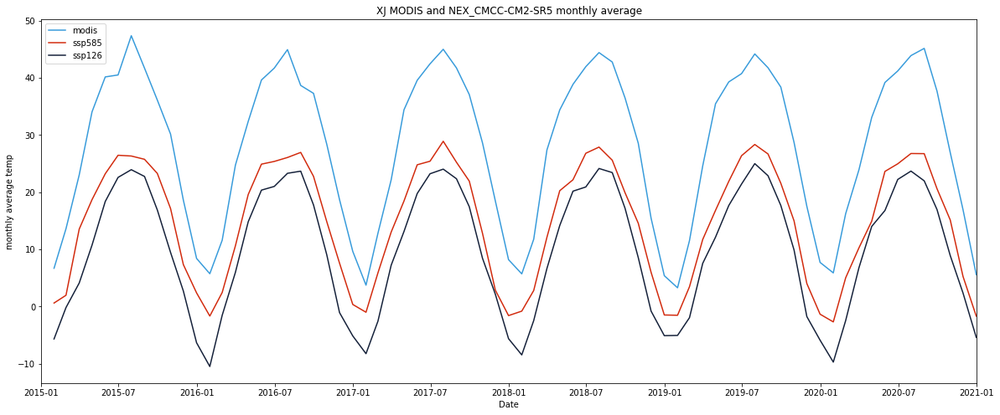

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_CMCC-CM2-SR5 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_CMCC_CM2_SR5_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp)) 
XJ_ssp585_CMCC_CM2_SR5_monthly_rmse

13.725547768625614

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_CMCC_CM2_SR5_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp)) 
XJ_ssp126_CMCC_CM2_SR5_monthly_rmse

18.31692514352521

#### time series analysis

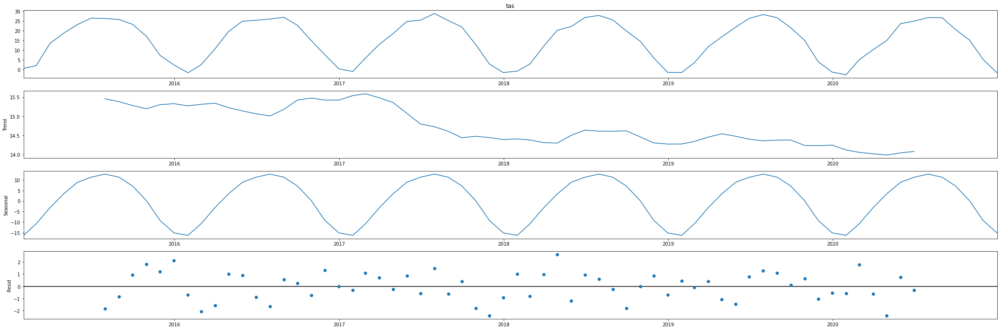

In [ ]:

XJ_ssp585_CMCC_CM2_SR5_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp, model='additive')
fig = XJ_ssp585_CMCC_CM2_SR5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

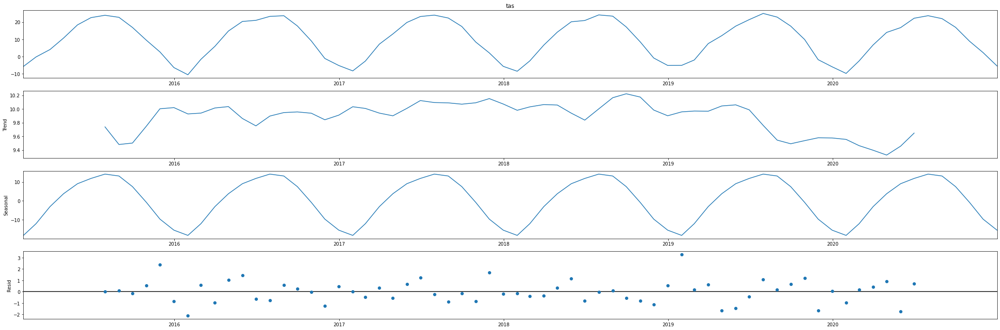

In [ ]:

XJ_ssp126_CMCC_CM2_SR5_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp, model='additive')
fig = XJ_ssp126_CMCC_CM2_SR5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_CMCC_CM2_SR5_model = LinearRegression()
x = XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_CMCC_CM2_SR5_model.fit(x, y)
XJ_ssp585_CMCC_CM2_SR5_r_squared =XJ_ssp585_CMCC_CM2_SR5_model.score(x, y)
XJ_ssp585_CMCC_CM2_SR5_r_squared

0.973753309430719

In [ ]:
XJ_ssp126_CMCC_CM2_SR5_model = LinearRegression()
x = XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_CMCC_CM2_SR5_model.fit(x, y)
XJ_ssp126_CMCC_CM2_SR5_r_squared = XJ_ssp126_CMCC_CM2_SR5_model.score(x, y)
XJ_ssp126_CMCC_CM2_SR5_r_squared

0.972424090199567

#### seasonal analysis

In [ ]:
month = XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp.index.month
XJ_ssp585_CMCC_CM2_SR5_winter = pd.concat([XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 1], XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 2],XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 12]])
XJ_ssp585_CMCC_CM2_SR5_spring = pd.concat([XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 3], XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 4],XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 5]])
XJ_ssp585_CMCC_CM2_SR5_summer = pd.concat([XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 6], XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 7],XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 8]])
XJ_ssp585_CMCC_CM2_SR5_fall = pd.concat([XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 9], XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 10],XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp[month == 11]])
XJ_ssp585_CMCC_CM2_SR5_winter.sort_index()
XJ_ssp585_CMCC_CM2_SR5_spring.sort_index()
XJ_ssp585_CMCC_CM2_SR5_summer.sort_index()
XJ_ssp585_CMCC_CM2_SR5_fall.sort_index()

time
2015-09-30    23.276590
2015-10-31    17.134087
2015-11-30     7.326769
2016-09-30    22.763997
2016-10-31    14.853794
2016-11-30     7.571105
2017-09-30    21.927863
2017-10-31    12.791038
2017-11-30     2.865016
2018-09-30    19.893418
2018-10-31    14.554287
2018-11-30     5.977581
2019-09-30    21.553613
2019-10-31    14.980006
2019-11-30     4.009882
2020-09-30    20.598134
2020-10-31    15.135068
2020-11-30     5.239186
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp.index.month
XJ_ssp126_CMCC_CM2_SR5_winter = pd.concat([XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 1], XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 2],XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 12]])
XJ_ssp126_CMCC_CM2_SR5_spring = pd.concat([XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 3], XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 4],XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 5]])
XJ_ssp126_CMCC_CM2_SR5_summer = pd.concat([XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 6], XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 7],XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 8]])
XJ_ssp126_CMCC_CM2_SR5_fall = pd.concat([XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 9], XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 10],XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp[month == 11]])
XJ_ssp126_CMCC_CM2_SR5_winter.sort_index()
XJ_ssp126_CMCC_CM2_SR5_spring.sort_index()
XJ_ssp126_CMCC_CM2_SR5_summer.sort_index()
XJ_ssp126_CMCC_CM2_SR5_fall.sort_index()

time
2015-09-30    16.885794
2015-10-31     9.454239
2015-11-30     2.704350
2016-09-30    17.758483
2016-10-31     9.064391
2016-11-30    -1.077984
2017-09-30    17.450104
2017-10-31     8.426370
2017-11-30     2.155268
2018-09-30    17.175666
2018-10-31     8.540495
2018-11-30    -0.812083
2019-09-30    17.665965
2019-10-31     9.887320
2019-11-30    -1.771849
2020-09-30    16.955476
2020-10-31     8.904312
2020-11-30     2.337371
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_CMCC_CM2_SR5_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.5990589033668401
coef:  [[0.98599774]]
intercept:  [13.58626674]


In [ ]:
x = XJ_ssp126_CMCC_CM2_SR5_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8913153388158158
coef:  [[1.14266727]]
intercept:  [17.94645002]


In [ ]:
x = XJ_ssp126_CMCC_CM2_SR5_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.1930474300007612
coef:  [[0.82656731]]
intercept:  [23.84150134]


In [ ]:
x = XJ_ssp126_CMCC_CM2_SR5_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9670405048470787
coef:  [[1.14562103]]
intercept:  [17.48382153]


#####ssp585

In [ ]:
x = XJ_ssp585_CMCC_CM2_SR5_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.7393874040217914
coef:  [[1.2302985]]
intercept:  [7.76970811]


In [ ]:
x = XJ_ssp585_CMCC_CM2_SR5_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.8689825549743062
coef:  [[1.20425241]]
intercept:  [11.12170507]


In [ ]:
x = XJ_ssp585_CMCC_CM2_SR5_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.12216901224936838
coef:  [[0.68885926]]
intercept:  [24.54219847]


In [ ]:
x = XJ_ssp585_CMCC_CM2_SR5_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.949620608129551
coef:  [[1.15936048]]
intercept:  [11.51542868]


### XJ_NEX_CESM2

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1Nv9NaW8XOOlmDSysdIKdct4BKbXvBYUQ/view?usp=share_link
id = "1Nv9NaW8XOOlmDSysdIKdct4BKbXvBYUQ"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_CESM2.csv')

XJ_ssp585_CESM2 = pd.read_csv('XJ_ssp585_CESM2.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_CESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.710785
2015-01-01,39.125,82.375,-4.922333
2015-01-01,39.125,82.625,-5.332428
2015-01-01,39.125,82.875,-5.649902
2015-01-01,39.125,83.125,-5.829529


In [ ]:
XJ_ssp585_CESM2

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.710785
2015-01-01,39.125,82.375,-4.922333
2015-01-01,39.125,82.625,-5.332428
2015-01-01,39.125,82.875,-5.649902
2015-01-01,39.125,83.125,-5.829529
...,...,...,...
2020-12-29,36.375,83.875,-14.818024
2020-12-29,36.375,84.125,-15.009888
2020-12-29,36.375,84.375,-14.477264


In [ ]:
XJ_ssp585_CESM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_CESM2_avg_temp = XJ_ssp585_CESM2.groupby(XJ_ssp585_CESM2.index)['tas'].mean()
XJ_ssp585_CESM2_avg_temp

time
2015-01-01   -7.884365
2015-01-02   -5.990585
2015-01-03   -6.722005
2015-01-04   -5.940320
2015-01-05   -6.726862
                ...   
2020-12-25   -5.536344
2020-12-26   -3.704346
2020-12-27   -2.933859
2020-12-28   -3.506432
2020-12-29   -2.421213
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_CESM2_monthly_avg_temp = XJ_ssp585_CESM2_avg_temp.resample('M').mean()
XJ_ssp585_CESM2_monthly_avg_temp

time
2015-01-31    -6.540143
2015-02-28    -2.590603
2015-03-31     4.892463
2015-04-30    12.493806
2015-05-31    18.473261
                ...    
2020-08-31    23.874096
2020-09-30    16.862019
2020-10-31     6.505743
2020-11-30     2.324250
2020-12-31    -3.080383
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1PGaHU9djgq4M1H78xEVhQzuul2YEJElI/view?usp=share_link
id = "1PGaHU9djgq4M1H78xEVhQzuul2YEJElI"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_CESM2.csv')

XJ_ssp126_CESM2 = pd.read_csv('XJ_ssp126_CESM2.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_CESM2.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-4.439728
2015-01-01,39.125,82.375,-4.643433
2015-01-01,39.125,82.625,-5.051239
2015-01-01,39.125,82.875,-5.371918
2015-01-01,39.125,83.125,-5.554779


In [ ]:
XJ_ssp126_CESM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_CESM2_avg_temp = XJ_ssp126_CESM2.groupby(XJ_ssp126_CESM2.index)['tas'].mean()
XJ_ssp126_CESM2_avg_temp

time
2015-01-01   -7.910872
2015-01-02   -6.056635
2015-01-03   -6.837242
2015-01-04   -6.019887
2015-01-05   -6.754068
                ...   
2020-12-25   -3.262779
2020-12-26   -1.929651
2020-12-27   -1.958668
2020-12-28    0.797248
2020-12-29   -2.616377
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_CESM2_monthly_avg_temp = XJ_ssp126_CESM2_avg_temp.resample('M').mean()
XJ_ssp126_CESM2_monthly_avg_temp 

time
2015-01-31    -7.283867
2015-02-28     0.106617
2015-03-31     5.408889
2015-04-30    13.778695
2015-05-31    15.014363
                ...    
2020-08-31    23.219416
2020-09-30    15.897949
2020-10-31     8.238397
2020-11-30    -0.608174
2020-12-31    -5.350721
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

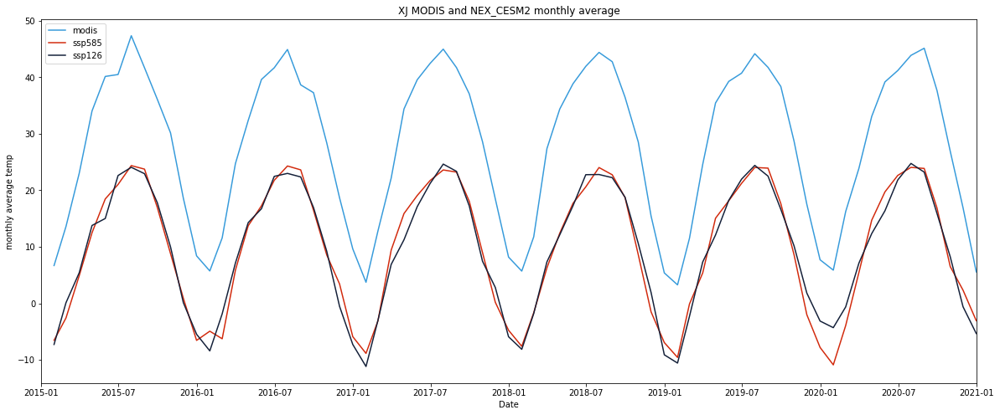

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_CESM2_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_CESM2_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_CESM2 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_CESM2_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp585_CESM2_monthly_avg_temp)) 
XJ_ssp585_CESM2_monthly_rmse

18.412530052762488

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_CESM2_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp126_CESM2_monthly_avg_temp)) 
XJ_ssp126_CESM2_monthly_rmse

18.4952939436428

#### time series analysis

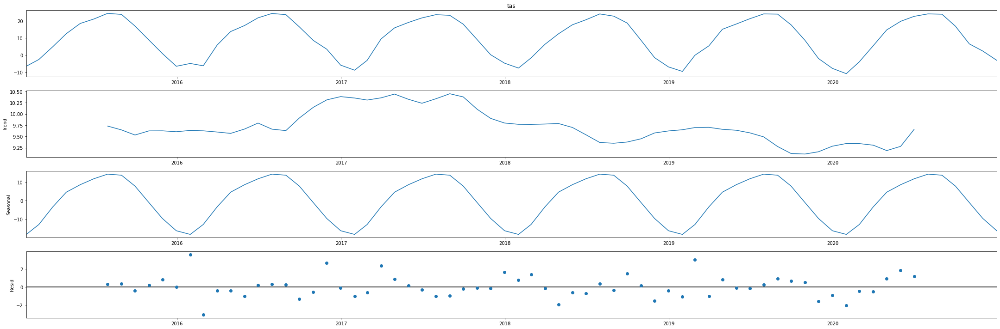

In [ ]:

XJ_ssp585_CESM2_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_CESM2_monthly_avg_temp, model='additive')
fig = XJ_ssp585_CESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

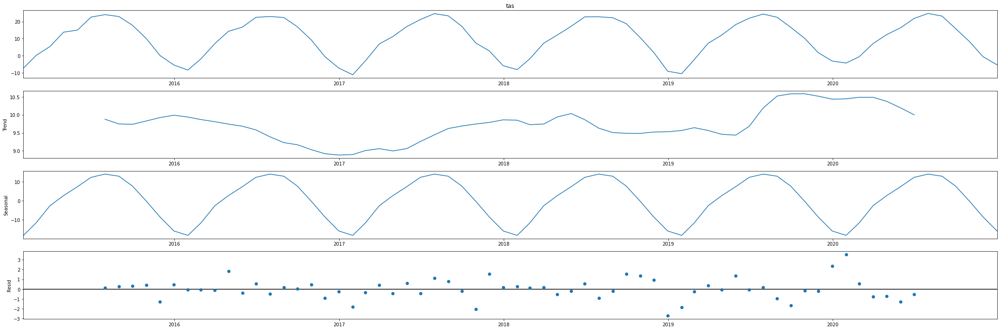

In [ ]:

XJ_ssp126_CESM2_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_CESM2_monthly_avg_temp, model='additive')
fig = XJ_ssp126_CESM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_CESM2_model = LinearRegression()
x = XJ_ssp585_CESM2_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_CESM2_model.fit(x, y)
XJ_ssp585_CESM2_r_squared =XJ_ssp585_CESM2_model.score(x, y)
XJ_ssp585_CESM2_r_squared

0.9707305312020506

In [ ]:
XJ_ssp126_CESM2_model = LinearRegression()
x = XJ_ssp126_CESM2_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_CESM2_model.fit(x, y)
XJ_ssp126_CESM2_r_squared = XJ_ssp126_CESM2_model.score(x, y)
XJ_ssp126_CESM2_r_squared

0.972170925154283

#### seasonal analysis

In [ ]:
month = XJ_ssp585_CESM2_monthly_avg_temp.index.month
XJ_ssp585_CESM2_winter = pd.concat([XJ_ssp585_CESM2_monthly_avg_temp[month == 1], XJ_ssp585_CESM2_monthly_avg_temp[month == 2],XJ_ssp585_CESM2_monthly_avg_temp[month == 12]])
XJ_ssp585_CESM2_spring = pd.concat([XJ_ssp585_CESM2_monthly_avg_temp[month == 3], XJ_ssp585_CESM2_monthly_avg_temp[month == 4],XJ_ssp585_CESM2_monthly_avg_temp[month == 5]])
XJ_ssp585_CESM2_summer = pd.concat([XJ_ssp585_CESM2_monthly_avg_temp[month == 6], XJ_ssp585_CESM2_monthly_avg_temp[month == 7],XJ_ssp585_CESM2_monthly_avg_temp[month == 8]])
XJ_ssp585_CESM2_fall = pd.concat([XJ_ssp585_CESM2_monthly_avg_temp[month == 9], XJ_ssp585_CESM2_monthly_avg_temp[month == 10],XJ_ssp585_CESM2_monthly_avg_temp[month == 11]])
XJ_ssp585_CESM2_winter.sort_index()
XJ_ssp585_CESM2_spring.sort_index()
XJ_ssp585_CESM2_summer.sort_index()
XJ_ssp585_CESM2_fall.sort_index()

time
2015-09-30    16.969085
2015-10-31     8.784178
2015-11-30     0.888196
2016-09-30    16.464013
2016-10-31     8.558867
2016-11-30     3.428594
2017-09-30    18.048466
2017-10-31     8.992370
2017-11-30     0.185299
2018-09-30    18.718683
2018-10-31     8.598836
2018-11-30    -1.517699
2019-09-30    17.656351
2019-10-31     8.596847
2019-11-30    -2.019651
2020-09-30    16.862019
2020-10-31     6.505743
2020-11-30     2.324250
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_CESM2_monthly_avg_temp.index.month
XJ_ssp126_CESM2_winter = pd.concat([XJ_ssp126_CESM2_monthly_avg_temp[month == 1], XJ_ssp126_CESM2_monthly_avg_temp[month == 2],XJ_ssp126_CESM2_monthly_avg_temp[month == 12]])
XJ_ssp126_CESM2_spring = pd.concat([XJ_ssp126_CESM2_monthly_avg_temp[month == 3], XJ_ssp126_CESM2_monthly_avg_temp[month == 4],XJ_ssp126_CESM2_monthly_avg_temp[month == 5]])
XJ_ssp126_CESM2_summer = pd.concat([XJ_ssp126_CESM2_monthly_avg_temp[month == 6], XJ_ssp126_CESM2_monthly_avg_temp[month == 7],XJ_ssp126_CESM2_monthly_avg_temp[month == 8]])
XJ_ssp126_CESM2_fall = pd.concat([XJ_ssp126_CESM2_monthly_avg_temp[month == 9], XJ_ssp126_CESM2_monthly_avg_temp[month == 10],XJ_ssp126_CESM2_monthly_avg_temp[month == 11]])
XJ_ssp126_CESM2_winter.sort_index()
XJ_ssp126_CESM2_spring.sort_index()
XJ_ssp126_CESM2_summer.sort_index()
XJ_ssp126_CESM2_fall.sort_index()

time
2015-09-30    17.806608
2015-10-31     9.972516
2015-11-30     0.108177
2016-09-30    16.955277
2016-10-31     9.220423
2016-11-30    -0.532352
2017-09-30    17.224102
2017-10-31     7.443715
2017-11-30     2.808274
2018-09-30    18.772845
2018-10-31    10.594751
2018-11-30     1.916909
2019-09-30    16.633269
2019-10-31    10.171230
2019-11-30     1.808634
2020-09-30    15.897949
2020-10-31     8.238397
2020-11-30    -0.608174
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_CESM2_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.7610245518123444
coef:  [[0.94060802]]
intercept:  [13.52076316]


In [ ]:
x = XJ_ssp126_CESM2_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9099011971604272
coef:  [[1.45608787]]
intercept:  [14.94758237]


In [ ]:
x = XJ_ssp126_CESM2_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.37275405828410524
coef:  [[1.30879439]]
intercept:  [12.73706156]


In [ ]:
x = XJ_ssp126_CESM2_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9511772445997875
coef:  [[1.16488053]]
intercept:  [17.13420299]


#####ssp585

In [ ]:
x = XJ_ssp585_CESM2_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.45229687885477066
coef:  [[0.86621107]]
intercept:  [13.38827352]


In [ ]:
x = XJ_ssp585_CESM2_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9019374093973653
coef:  [[1.16455246]]
intercept:  [17.55726962]


In [ ]:
x = XJ_ssp585_CESM2_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3107839155700215
coef:  [[0.95596714]]
intercept:  [20.76002783]


In [ ]:
x = XJ_ssp585_CESM2_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9584044781654603
coef:  [[1.12269579]]
intercept:  [17.91800542]


### XJ_NEX_BCC-CSM2-MR

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1E4a2Goa4mh5HvKi42sFqk13CVxpTRPvW/view?usp=share_link
id = "1E4a2Goa4mh5HvKi42sFqk13CVxpTRPvW"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_BCC-CSM2-MR.csv')

XJ_ssp585_BCC_CSM2_MR = pd.read_csv('XJ_ssp585_BCC-CSM2-MR.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_BCC_CSM2_MR.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-8.948608
2015-01-01,39.125,82.375,-8.951599
2015-01-01,39.125,82.625,-9.047607
2015-01-01,39.125,82.875,-8.935120
2015-01-01,39.125,83.125,-8.686951


In [ ]:
XJ_ssp585_BCC_CSM2_MR

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-8.948608
2015-01-01,39.125,82.375,-8.951599
2015-01-01,39.125,82.625,-9.047607
2015-01-01,39.125,82.875,-8.935120
2015-01-01,39.125,83.125,-8.686951
...,...,...,...
2020-12-29,36.375,83.875,-15.619568
2020-12-29,36.375,84.125,-16.175934
2020-12-29,36.375,84.375,-16.017609


In [ ]:
XJ_ssp585_CESM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_BCC_CSM2_MR_avg_temp = XJ_ssp585_BCC_CSM2_MR.groupby(XJ_ssp585_BCC_CSM2_MR.index)['tas'].mean()
XJ_ssp585_BCC_CSM2_MR_avg_temp

time
2015-01-01   -8.663023
2015-01-02   -7.471145
2015-01-03   -7.686002
2015-01-04   -7.987730
2015-01-05   -8.019936
                ...   
2020-12-25   -7.871229
2020-12-26   -7.948663
2020-12-27   -7.457784
2020-12-28   -6.356679
2020-12-29   -5.209768
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp = XJ_ssp585_BCC_CSM2_MR_avg_temp.resample('M').mean()
XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp

time
2015-01-31    -7.109888
2015-02-28    -3.510141
2015-03-31     4.159553
2015-04-30    11.992664
2015-05-31    16.485713
                ...    
2020-08-31    21.766586
2020-09-30    18.046010
2020-10-31    10.551313
2020-11-30     2.131035
2020-12-31    -4.546576
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1nzOkHT6HX_RKeM_blGURftcPQ5ZkCxAm/view?usp=share_link
id = "1nzOkHT6HX_RKeM_blGURftcPQ5ZkCxAm"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp126_BCC-CSM2-MR.csv')

XJ_ssp126_BCC_CSM2_MR = pd.read_csv('XJ_ssp126_BCC-CSM2-MR.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_BCC_CSM2_MR.head()

,lat,lon,tas
time,,,
2015-01-01,39.125,82.125,-8.926727
2015-01-01,39.125,82.375,-8.933228
2015-01-01,39.125,82.625,-9.032745
2015-01-01,39.125,82.875,-8.923767
2015-01-01,39.125,83.125,-8.679108


In [ ]:
XJ_ssp126_CESM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_BCC_CSM2_MR_avg_temp = XJ_ssp126_BCC_CSM2_MR.groupby(XJ_ssp126_BCC_CSM2_MR.index)['tas'].mean()
XJ_ssp126_BCC_CSM2_MR_avg_temp

time
2015-01-01   -8.546819
2015-01-02   -7.421721
2015-01-03   -7.719468
2015-01-04   -8.166718
2015-01-05   -7.798300
                ...   
2020-12-25   -6.995606
2020-12-26   -5.990502
2020-12-27   -9.806080
2020-12-28   -8.368071
2020-12-29   -5.035656
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp = XJ_ssp126_BCC_CSM2_MR_avg_temp.resample('M').mean()
XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp 

time
2015-01-31   -10.076841
2015-02-28    -1.539547
2015-03-31     5.051901
2015-04-30    12.740853
2015-05-31    17.411271
                ...    
2020-08-31    22.675924
2020-09-30    17.830752
2020-10-31    12.641207
2020-11-30     1.359895
2020-12-31    -7.000499
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

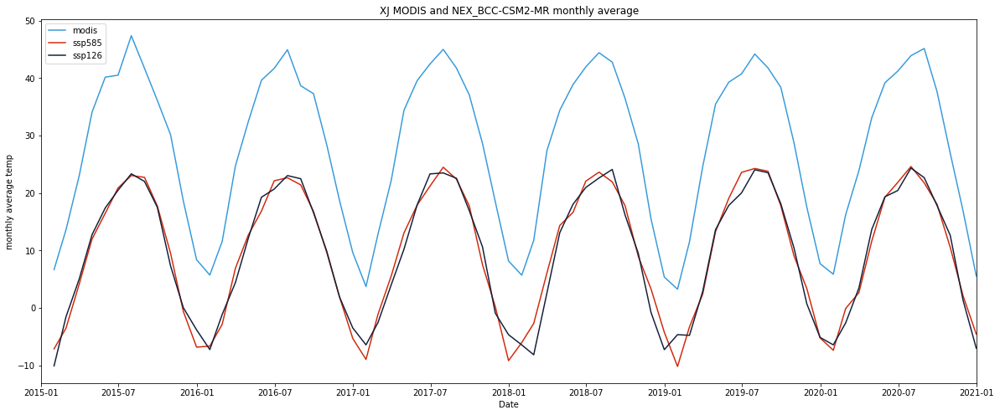

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_BCC-CSM2-MR monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_BCC_CSM2_MR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp)) 
XJ_ssp585_BCC_CSM2_MR_monthly_rmse

18.556544715479333

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_BCC_CSM2_MR_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp)) 
XJ_ssp126_BCC_CSM2_MR_monthly_rmse

18.74117836050443

#### time series analysis

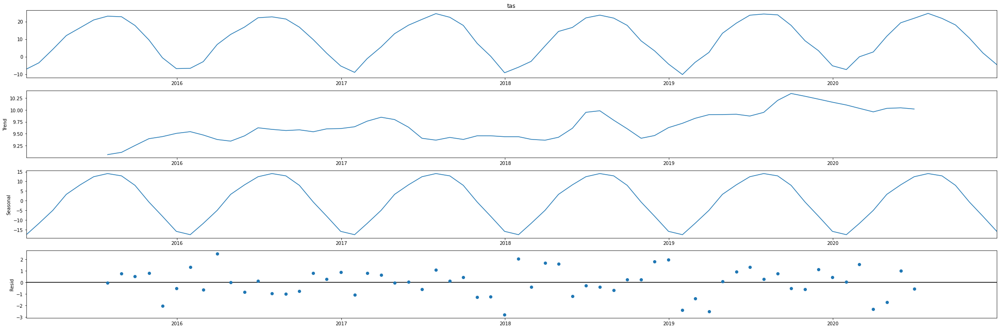

In [ ]:

XJ_ssp585_BCC_CSM2_MR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp, model='additive')
fig = XJ_ssp585_BCC_CSM2_MR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

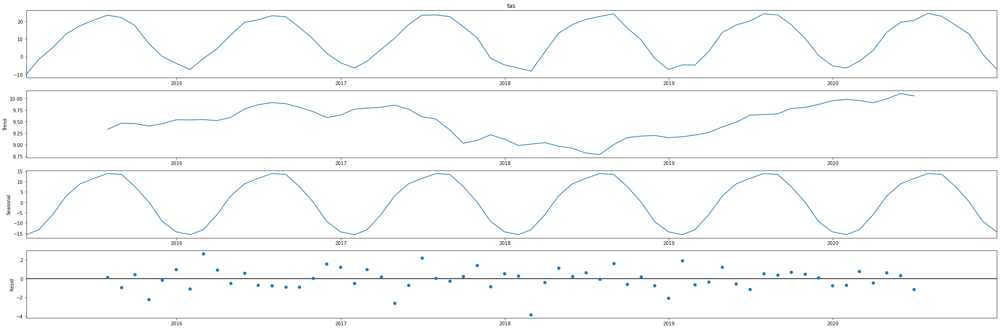

In [ ]:

XJ_ssp126_BCC_CSM2_MR_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp, model='additive')
fig = XJ_ssp126_BCC_CSM2_MR_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_BCC_CSM2_MR_model = LinearRegression()
x = XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_BCC_CSM2_MR_model.fit(x, y)
XJ_ssp585_BCC_CSM2_MR_r_squared =XJ_ssp585_BCC_CSM2_MR_model.score(x, y)
XJ_ssp585_BCC_CSM2_MR_r_squared

0.9700507336268025

In [ ]:
XJ_ssp126_BCC_CSM2_MR_model = LinearRegression()
x = XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_BCC_CSM2_MR_model.fit(x, y)
XJ_ssp126_BCC_CSM2_MR_r_squared = XJ_ssp126_CESM2_model.score(x, y)
XJ_ssp126_BCC_CSM2_MR_r_squared

0.9623176103955972

#### seasonal analysis

In [ ]:
month = XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp.index.month
XJ_ssp585_BCC_CSM2_MR_winter = pd.concat([XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 1], XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 2],XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 12]])
XJ_ssp585_BCC_CSM2_MR_spring = pd.concat([XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 3], XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 4],XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 5]])
XJ_ssp585_BCC_CSM2_MR_summer = pd.concat([XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 6], XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 7],XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 8]])
XJ_ssp585_BCC_CSM2_MR_fall = pd.concat([XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 9], XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 10],XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp[month == 11]])
XJ_ssp585_BCC_CSM2_MR_winter.sort_index()
XJ_ssp585_BCC_CSM2_MR_spring.sort_index()
XJ_ssp585_BCC_CSM2_MR_summer.sort_index()
XJ_ssp585_BCC_CSM2_MR_fall.sort_index()

time
2015-09-30    17.740572
2015-10-31     9.535641
2015-11-30    -0.609004
2016-09-30    16.791547
2016-10-31     9.671525
2016-11-30     1.912845
2017-09-30    17.770105
2017-10-31     7.527051
2017-11-30     0.222864
2018-09-30    17.800085
2018-10-31     8.978156
2018-11-30     3.284948
2019-09-30    17.792424
2019-10-31     9.044853
2019-11-30     3.368716
2020-09-30    18.046010
2020-10-31    10.551313
2020-11-30     2.131035
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp.index.month
XJ_ssp126_BCC_CSM2_MR_winter = pd.concat([XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 1], XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 2],XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 12]])
XJ_ssp126_BCC_CSM2_MR_spring = pd.concat([XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 3], XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 4],XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 5]])
XJ_ssp126_BCC_CSM2_MR_summer = pd.concat([XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 6], XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 7],XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 8]])
XJ_ssp126_BCC_CSM2_MR_fall = pd.concat([XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 9], XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 10],XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp[month == 11]])
XJ_ssp126_BCC_CSM2_MR_winter.sort_index()
XJ_ssp126_BCC_CSM2_MR_spring.sort_index()
XJ_ssp126_BCC_CSM2_MR_summer.sort_index()
XJ_ssp126_BCC_CSM2_MR_fall.sort_index()

time
2015-09-30    17.523809
2015-10-31     7.331194
2015-11-30     0.049734
2016-09-30    16.574296
2016-10-31     9.883695
2016-11-30     1.903848
2017-09-30    16.932095
2017-10-31    10.628270
2017-11-30    -0.903768
2018-09-30    16.192517
2018-10-31     9.504395
2018-11-30    -0.811161
2019-09-30    18.129526
2019-10-31    10.419722
2019-11-30     0.712666
2020-09-30    17.830752
2020-10-31    12.641207
2020-11-30     1.359895
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_BCC_CSM2_MR_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.37396693554343696
coef:  [[0.93640734]]
intercept:  [13.3668952]


In [ ]:
x = XJ_ssp126_BCC_CSM2_MR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9288277260434454
coef:  [[1.01179491]]
intercept:  [20.88462172]


In [ ]:
x = XJ_ssp126_BCC_CSM2_MR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.3040532557683403
coef:  [[0.84503498]]
intercept:  [23.80422114]


In [ ]:
x = XJ_ssp126_BCC_CSM2_MR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9491217665727026
coef:  [[1.12396646]]
intercept:  [17.41615937]


#####ssp585

In [ ]:
x = XJ_ssp585_BCC_CSM2_MR_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.6775520472682577
coef:  [[1.0923179]]
intercept:  [14.28443877]


In [ ]:
x = XJ_ssp585_BCC_CSM2_MR_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9344061541174584
coef:  [[1.1096282]]
intercept:  [19.55699367]


In [ ]:
x = XJ_ssp585_BCC_CSM2_MR_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.20766924248691887
coef:  [[0.83959933]]
intercept:  [23.72496629]


In [ ]:
x = XJ_ssp585_BCC_CSM2_MR_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9332230796594416
coef:  [[1.18146198]]
intercept:  [16.51486132]


### XJ_NEX_ACCESS-ESM1-5

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1FC6tXzQ4c_xdUjNIIMwyVm80BGNk6S93/view?usp=share_link
id = "1FC6tXzQ4c_xdUjNIIMwyVm80BGNk6S93"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_ACCESS-ESM1-5.csv')

XJ_ssp585_ACCESS_ESM1_5 = pd.read_csv('XJ_ssp585_ACCESS-ESM1-5.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_ACCESS_ESM1_5.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-12.771820
2015-01-01,1,36.375,82.375,-15.579346
2015-01-01,2,36.375,82.625,-15.595276
2015-01-01,3,36.375,82.875,-14.843933
2015-01-01,4,36.375,83.125,-16.912750


In [ ]:
XJ_ssp585_ACCESS_ESM1_5

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-12.771820
2015-01-01,1,36.375,82.375,-15.579346
2015-01-01,2,36.375,82.625,-15.595276
2015-01-01,3,36.375,82.875,-14.843933
2015-01-01,4,36.375,83.125,-16.912750
...,...,...,...,...
2020-12-30,315355,39.125,83.875,-0.911377
2020-12-30,315356,39.125,84.125,-0.919861
2020-12-30,315357,39.125,84.375,-0.960876


In [ ]:
XJ_ssp585_ACCESS_ESM1_5['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_ACCESS_ESM1_5_avg_temp = XJ_ssp585_ACCESS_ESM1_5.groupby(XJ_ssp585_ACCESS_ESM1_5.index)['tas'].mean()
XJ_ssp585_ACCESS_ESM1_5_avg_temp

time
2015-01-01   -7.642116
2015-01-02   -8.583162
2015-01-03   -7.952942
2015-01-04   -7.353266
2015-01-05   -8.125808
                ...   
2020-12-26   -3.534841
2020-12-27   -3.163454
2020-12-28   -3.293338
2020-12-29   -4.232706
2020-12-30   -4.044752
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp = XJ_ssp585_ACCESS_ESM1_5_avg_temp.resample('M').mean()
XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp

time
2015-01-31    -8.930414
2015-02-28    -5.702179
2015-03-31     3.533511
2015-04-30    14.792299
2015-05-31    16.741510
                ...    
2020-08-31    24.749563
2020-09-30    17.191047
2020-10-31    10.856820
2020-11-30     1.554696
2020-12-31    -1.890591
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1gHE7kxl1KY2Gq84D4DT9f737geXNH81w/view?usp=share_link
id = "1gHE7kxl1KY2Gq84D4DT9f737geXNH81w"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ACCESS-ESM1-5_ssp126.csv')

XJ_ssp126_ACCESS_ESM1_5 = pd.read_csv('XJ_ACCESS-ESM1-5_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_ACCESS_ESM1_5.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-13.056702
2015-01-01,1,36.375,82.375,-15.946167
2015-01-01,2,36.375,82.625,-16.003174
2015-01-01,3,36.375,82.875,-15.252014
2015-01-01,4,36.375,83.125,-17.320984


In [ ]:
XJ_ssp126_ACCESS_ESM1_5['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_ACCESS_ESM1_5_avg_temp = XJ_ssp126_ACCESS_ESM1_5.groupby(XJ_ssp126_ACCESS_ESM1_5.index)['tas'].mean()
XJ_ssp126_ACCESS_ESM1_5_avg_temp

time
2015-01-01   -7.826247
2015-01-02   -8.837298
2015-01-03   -8.137807
2015-01-04   -7.961034
2015-01-05   -8.307699
                ...   
2020-12-27   -4.135565
2020-12-28   -4.297461
2020-12-29   -4.105588
2020-12-30   -2.012642
2020-12-31   -0.980086
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp = XJ_ssp126_ACCESS_ESM1_5_avg_temp.resample('M').mean()
XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp 

time
2015-01-31    -8.618086
2015-02-28    -3.551715
2015-03-31     5.148535
2015-04-30    11.672641
2015-05-31    17.269619
                ...    
2020-08-31    24.426594
2020-09-30    15.962609
2020-10-31    10.022355
2020-11-30    -0.083912
2020-12-31    -6.429654
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

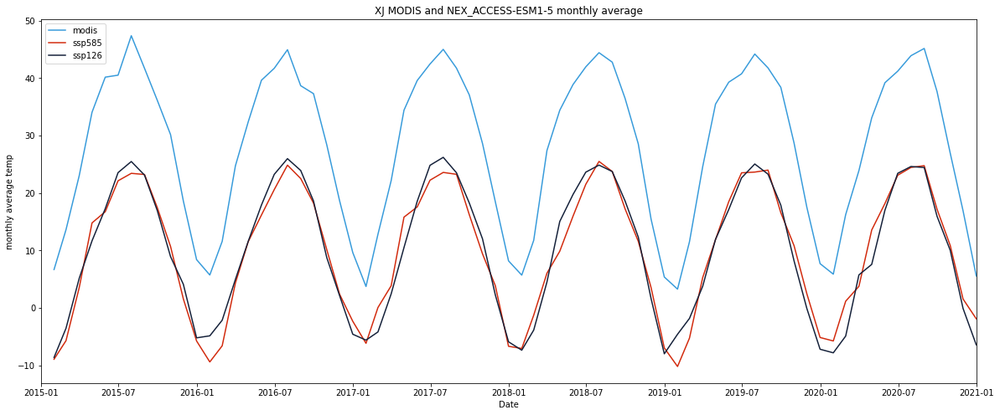

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_ACCESS-ESM1-5 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_ACCESS_ESM1_5_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp)) 
XJ_ssp585_ACCESS_ESM1_5_monthly_rmse

18.317154486666112

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_ACCESS_ESM1_5_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp)) 
XJ_ssp126_ACCESS_ESM1_5_monthly_rmse

18.2686534844317

#### time series analysis

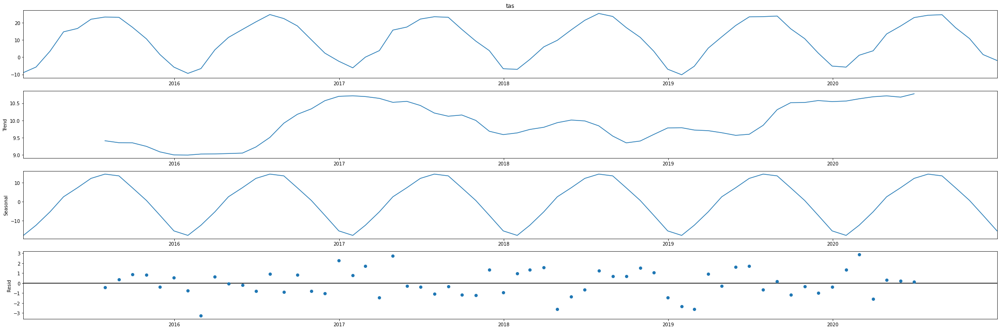

In [ ]:

XJ_ssp585_ACCESS_ESM1_5_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp, model='additive')
fig = XJ_ssp585_ACCESS_ESM1_5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

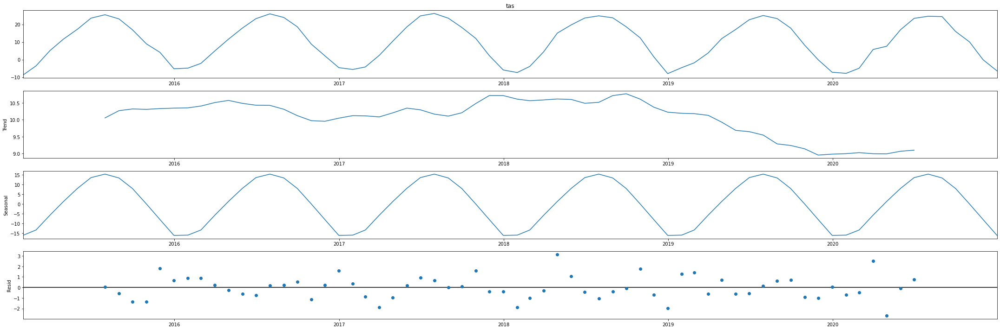

In [ ]:

XJ_ssp126_ACCESS_ESM1_5_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp, model='additive')
fig = XJ_ssp126_ACCESS_ESM1_5_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_ACCESS_ESM1_5_model = LinearRegression()
x = XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_ACCESS_ESM1_5_model.fit(x, y)
XJ_ssp585_ACCESS_ESM1_5_r_squared =XJ_ssp585_ACCESS_ESM1_5_model.score(x, y)
XJ_ssp585_ACCESS_ESM1_5_r_squared

0.9617274867094315

In [ ]:
XJ_ssp126_ACCESS_ESM1_5_model = LinearRegression()
x = XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_ACCESS_ESM1_5_model.fit(x, y)
XJ_ssp126_ACCESS_ESM1_5_r_squared = XJ_ssp126_ACCESS_ESM1_5_model.score(x, y)
XJ_ssp126_ACCESS_ESM1_5_r_squared

0.955197006162519

#### seasonal analysis

In [ ]:
month = XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp.index.month
XJ_ssp585_ACCESS_ESM1_5_winter = pd.concat([XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 1], XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 2],XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 12]])
XJ_ssp585_ACCESS_ESM1_5_spring = pd.concat([XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 3], XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 4],XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 5]])
XJ_ssp585_ACCESS_ESM1_5_summer = pd.concat([XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 6], XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 7],XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 8]])
XJ_ssp585_ACCESS_ESM1_5_fall = pd.concat([XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 9], XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 10],XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp[month == 11]])
XJ_ssp585_ACCESS_ESM1_5_winter.sort_index()
XJ_ssp585_ACCESS_ESM1_5_spring.sort_index()
XJ_ssp585_ACCESS_ESM1_5_summer.sort_index()
XJ_ssp585_ACCESS_ESM1_5_fall.sort_index()

time
2015-09-30    17.437607
2015-10-31    10.694070
2015-11-30     1.571928
2016-09-30    18.230631
2016-10-31    10.170753
2016-11-30     2.405255
2017-09-30    16.232634
2017-10-31     9.408633
2017-11-30     3.862404
2018-09-30    17.255470
2018-10-31    11.582742
2018-11-30     3.528469
2019-09-30    16.568461
2019-10-31    10.836281
2019-11-30     2.464214
2020-09-30    17.191047
2020-10-31    10.856820
2020-11-30     1.554696
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp.index.month
XJ_ssp126_ACCESS_ESM1_5_winter = pd.concat([XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 1], XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 2],XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 12]])
XJ_ssp126_ACCESS_ESM1_5_spring = pd.concat([XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 3], XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 4],XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 5]])
XJ_ssp126_ACCESS_ESM1_5_summer = pd.concat([XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 6], XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 7],XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 8]])
XJ_ssp126_ACCESS_ESM1_5_fall = pd.concat([XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 9], XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 10],XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp[month == 11]])
XJ_ssp126_ACCESS_ESM1_5_winter.sort_index()
XJ_ssp126_ACCESS_ESM1_5_spring.sort_index()
XJ_ssp126_ACCESS_ESM1_5_summer.sort_index()
XJ_ssp126_ACCESS_ESM1_5_fall.sort_index()

time
2015-09-30    16.917479
2015-10-31     8.927888
2015-11-30     4.108852
2016-09-30    18.601614
2016-10-31     8.772564
2016-11-30     2.160807
2017-09-30    18.261047
2017-10-31    12.020644
2017-11-30     2.270047
2018-09-30    18.624950
2018-10-31    12.327888
2018-11-30     1.615998
2019-09-30    17.876580
2019-10-31     8.192374
2019-11-30    -0.097130
2020-09-30    15.962609
2020-10-31    10.022355
2020-11-30    -0.083912
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_ACCESS_ESM1_5_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.34223223037134765
coef:  [[1.11069412]]
intercept:  [14.47932147]


In [ ]:
x = XJ_ssp126_ACCESS_ESM1_5_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9026413064807944
coef:  [[1.0577191]]
intercept:  [20.66670967]


In [ ]:
x = XJ_ssp126_ACCESS_ESM1_5_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.5949748816067506
coef:  [[1.58348746]]
intercept:  [4.47621526]


In [ ]:
x = XJ_ssp126_ACCESS_ESM1_5_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9483236797985777
coef:  [[1.17264115]]
intercept:  [16.27828384]


#####ssp585

In [ ]:
x = XJ_ssp585_ACCESS_ESM1_5_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.44771325941182927
coef:  [[0.77411249]]
intercept:  [12.55500163]


In [ ]:
x = XJ_ssp585_ACCESS_ESM1_5_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9282761081891779
coef:  [[1.12235161]]
intercept:  [19.63705864]


In [ ]:
x = XJ_ssp585_ACCESS_ESM1_5_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.28230519469767457
coef:  [[0.92222419]]
intercept:  [21.26613506]


In [ ]:
x = XJ_ssp585_ACCESS_ESM1_5_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9651507716515714
coef:  [[1.31746642]]
intercept:  [14.46532654]


### XJ_NEX_ACCESS-CM2

#### ssp585

In [ ]:
#https://drive.google.com/file/d/1MdPIl_wVbfr2IXAzcieTsDeIiMKxQhHN/view?usp=share_link
id = "1MdPIl_wVbfr2IXAzcieTsDeIiMKxQhHN"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ssp585_ACCESS-CM2.csv')

XJ_ssp585_ACCESS_CM2 = pd.read_csv('XJ_ssp585_ACCESS-CM2.csv', parse_dates=['time'], index_col='time')
XJ_ssp585_ACCESS_CM2.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-12.805359
2015-01-01,1,36.375,82.375,-15.993561
2015-01-01,2,36.375,82.625,-16.226807
2015-01-01,3,36.375,82.875,-15.529419
2015-01-01,4,36.375,83.125,-17.652160


In [ ]:
XJ_ssp585_ACCESS_CM2

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-12.805359
2015-01-01,1,36.375,82.375,-15.993561
2015-01-01,2,36.375,82.625,-16.226807
2015-01-01,3,36.375,82.875,-15.529419
2015-01-01,4,36.375,83.125,-17.652160
...,...,...,...,...
2020-12-30,315355,39.125,83.875,-2.200012
2020-12-30,315356,39.125,84.125,-2.147400
2020-12-30,315357,39.125,84.375,-2.127319


In [ ]:
XJ_ssp585_ACCESS_CM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp585_ACCESS_CM2_avg_temp = XJ_ssp585_ACCESS_CM2.groupby(XJ_ssp585_ACCESS_CM2.index)['tas'].mean()
XJ_ssp585_ACCESS_CM2_avg_temp

time
2015-01-01   -6.218719
2015-01-02   -6.582032
2015-01-03   -6.628862
2015-01-04   -7.574334
2015-01-05   -5.678037
                ...   
2020-12-26   -5.537671
2020-12-27   -5.124610
2020-12-28   -4.593205
2020-12-29   -4.773404
2020-12-30   -4.550887
Name: tas, Length: 2190, dtype: float64

In [ ]:
XJ_ssp585_ACCESS_CM2_monthly_avg_temp = XJ_ssp585_ACCESS_CM2_avg_temp.resample('M').mean()
XJ_ssp585_ACCESS_CM2_monthly_avg_temp

time
2015-01-31    -5.916683
2015-02-28    -3.688608
2015-03-31     5.439430
2015-04-30    12.858755
2015-05-31    16.939340
                ...    
2020-08-31    23.298983
2020-09-30    17.894582
2020-10-31     8.774615
2020-11-30     0.342767
2020-12-31    -4.110212
Freq: M, Name: tas, Length: 72, dtype: float64

#### ssp126

In [ ]:
#https://drive.google.com/file/d/1gh_rdl6cZKolkrSeF-25izz2_oRr8jUg/view?usp=share_link
id = "1gh_rdl6cZKolkrSeF-25izz2_oRr8jUg"
file = drive.CreateFile({'id':id}) 
file.GetContentFile('XJ_ACCESS-CM2_ssp126.csv')

XJ_ssp126_ACCESS_CM2 = pd.read_csv('XJ_ACCESS-CM2_ssp126.csv', parse_dates=['time'], index_col='time')
XJ_ssp126_ACCESS_CM2.head()

,Unnamed: 0,lat,lon,tas
time,,,,
2015-01-01,0,36.375,82.125,-12.862030
2015-01-01,1,36.375,82.375,-16.041748
2015-01-01,2,36.375,82.625,-16.266480
2015-01-01,3,36.375,82.875,-15.560608
2015-01-01,4,36.375,83.125,-17.674866


In [ ]:
XJ_ssp126_ACCESS_CM2['tas'].isnull().sum()

0

In [ ]:
XJ_ssp126_ACCESS_CM2_avg_temp = XJ_ssp126_ACCESS_CM2.groupby(XJ_ssp126_ACCESS_CM2.index)['tas'].mean()
XJ_ssp126_ACCESS_CM2_avg_temp

time
2015-01-01   -6.167921
2015-01-02   -6.549589
2015-01-03   -6.656793
2015-01-04   -7.554383
2015-01-05   -5.632256
                ...   
2020-12-27   -6.093540
2020-12-28   -6.183330
2020-12-29   -6.294592
2020-12-30   -5.961416
2020-12-31   -6.170669
Name: tas, Length: 2192, dtype: float64

In [ ]:
XJ_ssp126_ACCESS_CM2_monthly_avg_temp = XJ_ssp126_ACCESS_CM2_avg_temp.resample('M').mean()
XJ_ssp126_ACCESS_CM2_monthly_avg_temp 

time
2015-01-31    -6.566466
2015-02-28    -3.600723
2015-03-31     4.363417
2015-04-30    13.100009
2015-05-31    17.128891
                ...    
2020-08-31    22.605963
2020-09-30    18.218993
2020-10-31     8.688770
2020-11-30    -0.593065
2020-12-31    -6.097539
Freq: M, Name: tas, Length: 72, dtype: float64

#### compare modis with ssp585 and ssp126

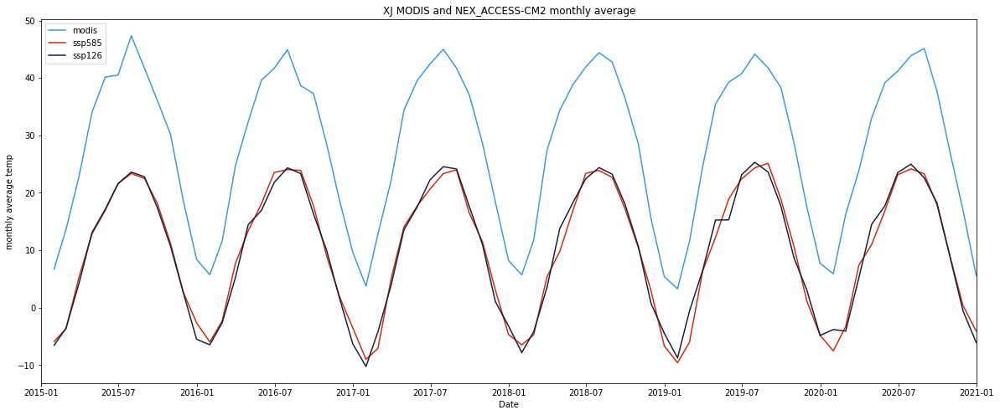

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp585_ACCESS_CM2_monthly_avg_temp, color='#D22A0D', label='ssp585')
ax.plot(XJ_ssp126_ACCESS_CM2_monthly_avg_temp , color='#142039', label='ssp126')
ax.legend(loc='best')
plt.title('XJ MODIS and NEX_ACCESS-CM2 monthly average')
plt.show()


#### RMSE calculation

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#calculate RMSE
#this model missing 2020-12 data
XJ_ssp585_ACCESS_CM2_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp585_ACCESS_CM2_monthly_avg_temp)) 
XJ_ssp585_ACCESS_CM2_monthly_rmse

18.272121734919818

In [ ]:
#calculate RMSE
#this model missing 2020-12 data
XJ_ssp126_ACCESS_CM2_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month[:], XJ_ssp126_ACCESS_CM2_monthly_avg_temp)) 
XJ_ssp126_ACCESS_CM2_monthly_rmse

18.242707904952347

#### time series analysis

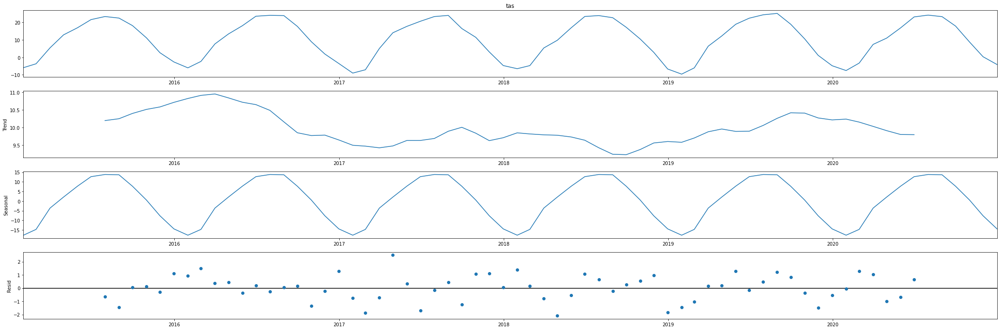

In [ ]:

XJ_ssp585_ACCESS_CM2_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp585_ACCESS_CM2_monthly_avg_temp, model='additive')
fig = XJ_ssp585_ACCESS_CM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

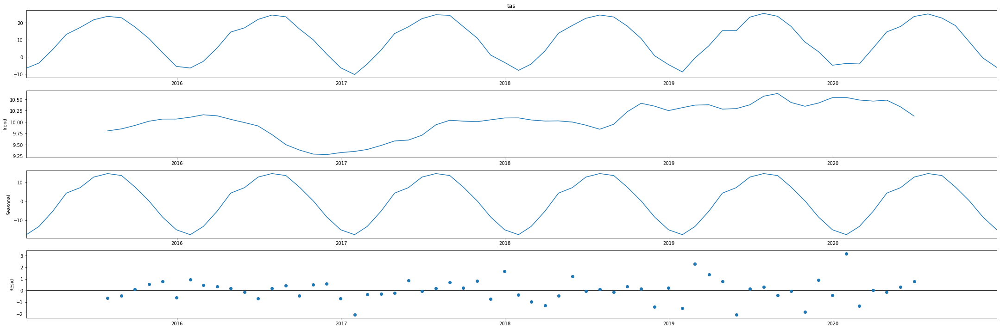

In [ ]:

XJ_ssp126_ACCESS_CM2_Monthly_deco = sm.tsa.seasonal_decompose(XJ_ssp126_ACCESS_CM2_monthly_avg_temp, model='additive')
fig = XJ_ssp126_ACCESS_CM2_Monthly_deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

#### R square

In [ ]:
XJ_ssp585_ACCESS_CM2_model = LinearRegression()
x = XJ_ssp585_ACCESS_CM2_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_ACCESS_CM2_model.fit(x, y)
XJ_ssp585_ACCESS_CM2_r_squared =XJ_ssp585_ACCESS_CM2_model.score(x, y)
XJ_ssp585_ACCESS_CM2_r_squared

0.9659393287799981

In [ ]:
XJ_ssp126_ACCESS_CM2_model = LinearRegression()
x = XJ_ssp126_ACCESS_CM2_monthly_avg_temp.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_ACCESS_CM2_model.fit(x, y)
XJ_ssp126_ACCESS_CM2_r_squared = XJ_ssp126_ACCESS_CM2_model.score(x, y)
XJ_ssp126_ACCESS_CM2_r_squared

0.9687153970300723

#### seasonal analysis

In [ ]:
month = XJ_ssp585_ACCESS_CM2_monthly_avg_temp.index.month
XJ_ssp585_ACCESS_CM2_winter = pd.concat([XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 1], XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 2],XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 12]])
XJ_ssp585_ACCESS_CM2_spring = pd.concat([XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 3], XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 4],XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 5]])
XJ_ssp585_ACCESS_CM2_summer = pd.concat([XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 6], XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 7],XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 8]])
XJ_ssp585_ACCESS_CM2_fall = pd.concat([XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 9], XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 10],XJ_ssp585_ACCESS_CM2_monthly_avg_temp[month == 11]])
XJ_ssp585_ACCESS_CM2_winter.sort_index()
XJ_ssp585_ACCESS_CM2_spring.sort_index()
XJ_ssp585_ACCESS_CM2_summer.sort_index()
XJ_ssp585_ACCESS_CM2_fall.sort_index()

time
2015-09-30    18.172592
2015-10-31    11.165864
2015-11-30     2.643314
2016-09-30    17.722339
2016-10-31     8.955913
2016-11-30     1.904854
2017-09-30    16.490520
2017-10-31    11.460081
2017-11-30     3.094873
2018-09-30    17.198470
2018-10-31    10.478943
2018-11-30     2.881618
2019-09-30    18.960246
2019-10-31    10.590264
2019-11-30     1.141305
2020-09-30    17.894582
2020-10-31     8.774615
2020-11-30     0.342767
Name: tas, dtype: float64

In [ ]:
month = XJ_ssp126_ACCESS_CM2_monthly_avg_temp.index.month
XJ_ssp126_ACCESS_CM2_winter = pd.concat([XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 1], XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 2],XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 12]])
XJ_ssp126_ACCESS_CM2_spring = pd.concat([XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 3], XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 4],XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 5]])
XJ_ssp126_ACCESS_CM2_summer = pd.concat([XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 6], XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 7],XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 8]])
XJ_ssp126_ACCESS_CM2_fall = pd.concat([XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 9], XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 10],XJ_ssp126_ACCESS_CM2_monthly_avg_temp[month == 11]])
XJ_ssp126_ACCESS_CM2_winter.sort_index()
XJ_ssp126_ACCESS_CM2_spring.sort_index()
XJ_ssp126_ACCESS_CM2_summer.sort_index()
XJ_ssp126_ACCESS_CM2_fall.sort_index()

time
2015-09-30    17.406416
2015-10-31    10.696994
2015-11-30     2.576968
2016-09-30    16.305692
2016-10-31     9.927523
2016-11-30     1.617514
2017-09-30    17.627913
2017-10-31    10.977715
2017-11-30     1.063738
2018-09-30    17.977422
2018-10-31    10.720531
2018-11-30     0.684284
2019-09-30    17.760984
2019-10-31     8.636267
2019-11-30     3.045959
2020-09-30    18.218993
2020-10-31     8.688770
2020-11-30    -0.593065
Name: tas, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_ACCESS_CM2_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.44892774991840745
coef:  [[1.06635522]]
intercept:  [14.06194971]


In [ ]:
x = XJ_ssp126_ACCESS_CM2_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9217385837990036
coef:  [[1.14620365]]
intercept:  [18.78715275]


In [ ]:
x = XJ_ssp126_ACCESS_CM2_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.19768986345945294
coef:  [[0.88588817]]
intercept:  [22.02204369]


In [ ]:
x = XJ_ssp126_ACCESS_CM2_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9790514252778263
coef:  [[1.19651169]]
intercept:  [16.25310323]


#####ssp585

In [ ]:
x = XJ_ssp585_ACCESS_CM2_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.3746218383276996
coef:  [[1.08656709]]
intercept:  [14.45331119]


In [ ]:
x = XJ_ssp585_ACCESS_CM2_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9016858818298586
coef:  [[1.26579756]]
intercept:  [17.3669913]


In [ ]:
x = XJ_ssp585_ACCESS_CM2_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.04143833311196887
coef:  [[0.40842603]]
intercept:  [33.26302688]


In [ ]:
x = XJ_ssp585_ACCESS_CM2_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9773780039844544
coef:  [[1.2269556]]
intercept:  [15.51464168]


## overall 

### ssp585

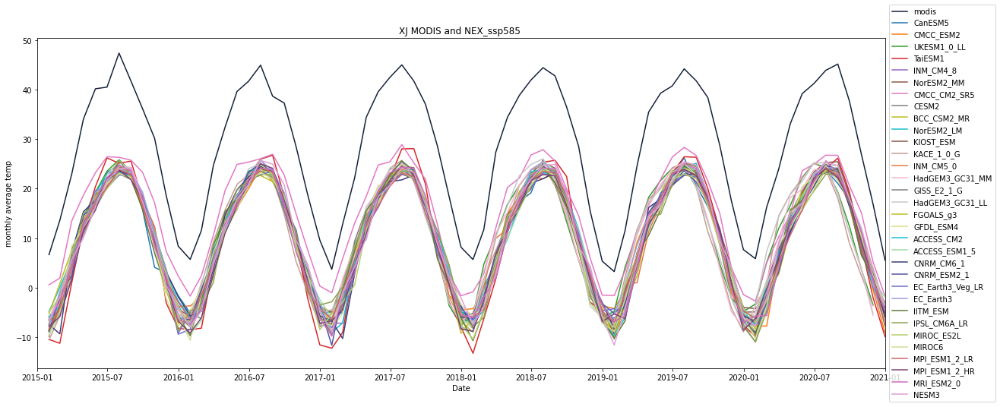

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#142039', label='modis')
ax.plot(XJ_ssp585_CanESM5_monthly_avg_temp, color='#1f77b4', label='CanESM5')
ax.plot(XJ_ssp585_CMCC_ESM2_monthly_avg_temp, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(XJ_ssp585_UKESM1_0_LL_monthly_avg_temp, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(XJ_ssp585_TaiESM1_monthly_avg_temp, color='#d62728', label='TaiESM1')
ax.plot(XJ_ssp585_INM_CM4_8_monthly_avg_temp, color='#9467bd', label='INM_CM4_8')
ax.plot(XJ_ssp585_NorESM2_MM_monthly_avg_temp, color='#8c564b', label='NorESM2_MM')
ax.plot(XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(XJ_ssp585_CESM2_monthly_avg_temp, color='#7f7f7f', label='CESM2')
ax.plot(XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(XJ_ssp585_NorESM2_LM_monthly_avg_temp, color='#17becf', label='NorESM2_LM')
ax.plot(XJ_ssp585_KIOST_ESM_monthly_avg_temp, color='#8c564b', label='KIOST_ESM')
ax.plot(XJ_ssp585_KACE_1_0_G_monthly_avg_temp, color='#c49c94', label='KACE_1_0_G')
ax.plot(XJ_ssp585_INM_CM5_0_monthly_avg_temp, color='#e37742', label='INM_CM5_0')
ax.plot(XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(XJ_ssp585_GISS_E2_1_G_monthly_avg_temp, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(XJ_ssp585_FGOALS_g3_monthly_avg_temp, color='#bcbd22', label='FGOALS_g3')
ax.plot(XJ_ssp585_GFDL_ESM4_monthly_avg_temp, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(XJ_ssp585_ACCESS_CM2_monthly_avg_temp, color='#17becf', label='ACCESS_CM2')
ax.plot(XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(XJ_ssp585_CNRM_CM6_1_monthly_avg_temp, color='#393b79', label='CNRM_CM6_1')
ax.plot(XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(XJ_ssp585_EC_Earth3_monthly_avg_temp, color='#9c9ede', label='EC_Earth3')
ax.plot(XJ_ssp585_IITM_ESM_monthly_avg_temp, color='#637939', label='IITM_ESM')
ax.plot(XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(XJ_ssp585_MIROC_ES2L_monthly_avg_temp, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(XJ_ssp585_MIROC6_monthly_avg_temp, color='#cedb9c', label='MIROC6')

ax.plot(XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(XJ_ssp585_MRI_ESM2_0_monthly_avg_temp, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(XJ_ssp585_NESM3_monthly_avg_temp, color='#de9ed6', label='NESM3')




ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('XJ MODIS and NEX_ssp585 ')
plt.show()

### ssp126

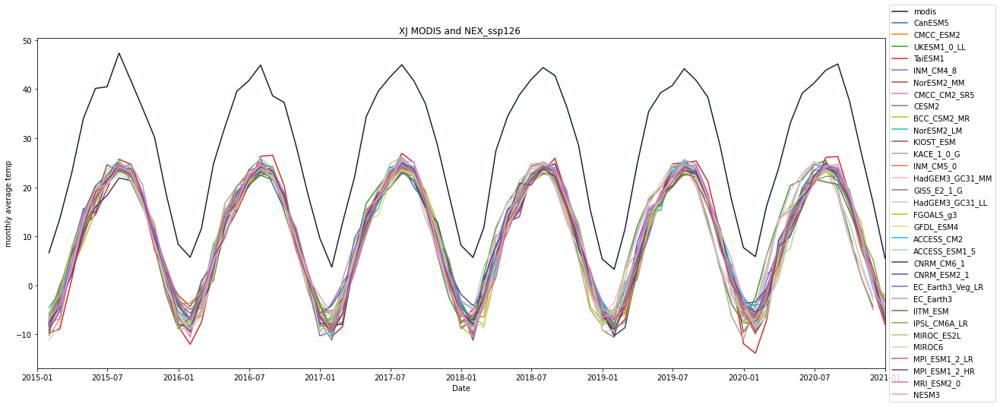

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#142039', label='modis')
ax.plot(XJ_ssp126_CanESM5_monthly_avg_temp, color='#1f77b4', label='CanESM5')
ax.plot(XJ_ssp126_CMCC_ESM2_monthly_avg_temp, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(XJ_ssp126_UKESM1_0_LL_monthly_avg_temp, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(XJ_ssp126_TaiESM1_monthly_avg_temp, color='#d62728', label='TaiESM1')
ax.plot(XJ_ssp126_INM_CM4_8_monthly_avg_temp, color='#9467bd', label='INM_CM4_8')
ax.plot(XJ_ssp126_NorESM2_MM_monthly_avg_temp, color='#8c564b', label='NorESM2_MM')
ax.plot(XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(XJ_ssp126_CESM2_monthly_avg_temp, color='#7f7f7f', label='CESM2')
ax.plot(XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(XJ_ssp126_NorESM2_LM_monthly_avg_temp, color='#17becf', label='NorESM2_LM')
ax.plot(XJ_ssp126_KIOST_ESM_monthly_avg_temp, color='#8c564b', label='KIOST_ESM')
ax.plot(XJ_ssp126_KACE_1_0_G_monthly_avg_temp, color='#c49c94', label='KACE_1_0_G')
ax.plot(XJ_ssp126_INM_CM5_0_monthly_avg_temp, color='#e37742', label='INM_CM5_0')
ax.plot(XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(XJ_ssp126_GISS_E2_1_G_monthly_avg_temp, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(XJ_ssp126_FGOALS_g3_monthly_avg_temp, color='#bcbd22', label='FGOALS_g3')
ax.plot(XJ_ssp126_GFDL_ESM4_monthly_avg_temp, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(XJ_ssp126_ACCESS_CM2_monthly_avg_temp, color='#17becf', label='ACCESS_CM2')
ax.plot(XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(XJ_ssp126_CNRM_CM6_1_monthly_avg_temp, color='#393b79', label='CNRM_CM6_1')
ax.plot(XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(XJ_ssp126_EC_Earth3_monthly_avg_temp, color='#9c9ede', label='EC_Earth3')
ax.plot(XJ_ssp126_IITM_ESM_monthly_avg_temp, color='#637939', label='IITM_ESM')
ax.plot(XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(XJ_ssp126_MIROC_ES2L_monthly_avg_temp, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(XJ_ssp126_MIROC6_monthly_avg_temp, color='#cedb9c', label='MIROC6')

ax.plot(XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(XJ_ssp126_MRI_ESM2_0_monthly_avg_temp, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(XJ_ssp126_NESM3_monthly_avg_temp, color='#de9ed6', label='NESM3')




ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('XJ MODIS and NEX_ssp126 ')
plt.show()

### all model average

In [ ]:
XJ_ssp126_all_model = pd.concat([XJ_ssp126_CanESM5_monthly_avg_temp, 
 XJ_ssp126_CMCC_ESM2_monthly_avg_temp,
 XJ_ssp126_UKESM1_0_LL_monthly_avg_temp,
 XJ_ssp126_TaiESM1_monthly_avg_temp,
 XJ_ssp126_INM_CM4_8_monthly_avg_temp,
 XJ_ssp126_NorESM2_MM_monthly_avg_temp,
 XJ_ssp126_CMCC_CM2_SR5_monthly_avg_temp,
 XJ_ssp126_CESM2_monthly_avg_temp,
 XJ_ssp126_BCC_CSM2_MR_monthly_avg_temp,
 XJ_ssp126_NorESM2_LM_monthly_avg_temp, 
 XJ_ssp126_KIOST_ESM_monthly_avg_temp,
 XJ_ssp126_KACE_1_0_G_monthly_avg_temp,
 XJ_ssp126_INM_CM5_0_monthly_avg_temp,
 XJ_ssp126_HadGEM3_GC31_MM_monthly_avg_temp,
 XJ_ssp126_GISS_E2_1_G_monthly_avg_temp,
 XJ_ssp126_HadGEM3_GC31_LL_monthly_avg_temp,
 XJ_ssp126_FGOALS_g3_monthly_avg_temp,
 XJ_ssp126_GFDL_ESM4_monthly_avg_temp,
 XJ_ssp126_ACCESS_CM2_monthly_avg_temp,
 XJ_ssp126_ACCESS_ESM1_5_monthly_avg_temp,
 XJ_ssp126_CNRM_CM6_1_monthly_avg_temp,
 XJ_ssp126_CNRM_ESM2_1_monthly_avg_temp,
 XJ_ssp126_EC_Earth3_Veg_LR_monthly_avg_temp,
 XJ_ssp126_EC_Earth3_monthly_avg_temp,
 XJ_ssp126_IITM_ESM_monthly_avg_temp,
 XJ_ssp126_IPSL_CM6A_LR_monthly_avg_temp,
 XJ_ssp126_MIROC_ES2L_monthly_avg_temp,
 XJ_ssp126_MIROC6_monthly_avg_temp,
 XJ_ssp126_MPI_ESM1_2_LR_monthly_avg_temp,
 XJ_ssp126_MPI_ESM1_2_HR_monthly_avg_temp,
 XJ_ssp126_MRI_ESM2_0_monthly_avg_temp,
 XJ_ssp126_NESM3_monthly_avg_temp],axis = 1)


XJ_ssp585_all_model = pd.concat([XJ_ssp585_CanESM5_monthly_avg_temp, 
 XJ_ssp585_CMCC_ESM2_monthly_avg_temp,
 XJ_ssp585_UKESM1_0_LL_monthly_avg_temp,
 XJ_ssp585_TaiESM1_monthly_avg_temp,
 XJ_ssp585_INM_CM4_8_monthly_avg_temp,
 XJ_ssp585_NorESM2_MM_monthly_avg_temp,
 XJ_ssp585_CMCC_CM2_SR5_monthly_avg_temp,
 XJ_ssp585_CESM2_monthly_avg_temp,
 XJ_ssp585_BCC_CSM2_MR_monthly_avg_temp,
 XJ_ssp585_NorESM2_LM_monthly_avg_temp, 
 XJ_ssp585_KIOST_ESM_monthly_avg_temp,
 XJ_ssp585_KACE_1_0_G_monthly_avg_temp,
 XJ_ssp585_INM_CM5_0_monthly_avg_temp,
 XJ_ssp585_HadGEM3_GC31_MM_monthly_avg_temp,
 XJ_ssp585_GISS_E2_1_G_monthly_avg_temp,
 XJ_ssp585_HadGEM3_GC31_LL_monthly_avg_temp,
 XJ_ssp585_FGOALS_g3_monthly_avg_temp,
 XJ_ssp585_GFDL_ESM4_monthly_avg_temp,
 XJ_ssp585_ACCESS_CM2_monthly_avg_temp,
 XJ_ssp585_ACCESS_ESM1_5_monthly_avg_temp,
 XJ_ssp585_CNRM_CM6_1_monthly_avg_temp,
 XJ_ssp585_CNRM_ESM2_1_monthly_avg_temp,
 XJ_ssp585_EC_Earth3_Veg_LR_monthly_avg_temp,
 XJ_ssp585_EC_Earth3_monthly_avg_temp,
 XJ_ssp585_IITM_ESM_monthly_avg_temp,
 XJ_ssp585_IPSL_CM6A_LR_monthly_avg_temp,
 XJ_ssp585_MIROC_ES2L_monthly_avg_temp,
 XJ_ssp585_MIROC6_monthly_avg_temp,
 XJ_ssp585_MPI_ESM1_2_LR_monthly_avg_temp,
 XJ_ssp585_MPI_ESM1_2_HR_monthly_avg_temp,
 XJ_ssp585_MRI_ESM2_0_monthly_avg_temp,
 XJ_ssp585_NESM3_monthly_avg_temp],axis = 1)


In [ ]:
#average temp
XJ_ssp126_all_model['average'] = XJ_ssp126_all_model.mean(axis=1)
XJ_ssp585_all_model['average'] = XJ_ssp585_all_model.mean(axis=1)

In [ ]:
XJ_ssp126_all_model_mothly_average = XJ_ssp126_all_model['average'] 
XJ_ssp585_all_model_mothly_average = XJ_ssp585_all_model['average']

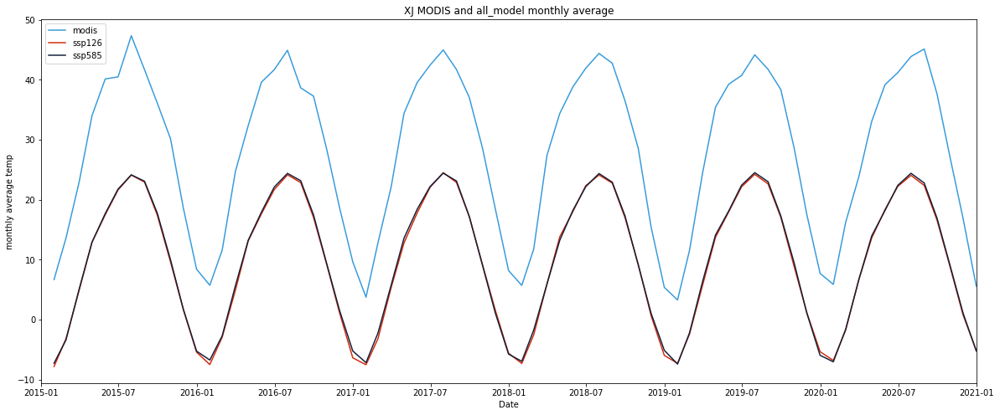

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="monthly average temp")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_data_month, color='#379BDB', label='modis')
ax.plot(XJ_ssp126_all_model_mothly_average, color='#D22A0D', label='ssp126')
ax.plot(XJ_ssp585_all_model_mothly_average , color='#142039', label='ssp585')
ax.legend(loc='best')
plt.title('XJ MODIS and all_model monthly average')
plt.show()

#### RMSE calculation

In [ ]:
#calculate RMSE

XJ_ssp585_all_model_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp585_all_model_mothly_average)) 
XJ_ssp585_all_model_monthly_rmse

18.175102982451868

In [ ]:
#calculate RMSE

XJ_ssp126_all_model_monthly_rmse = sqrt(mean_squared_error(XJ_Monthly_data_month, XJ_ssp126_all_model_mothly_average)) 
XJ_ssp126_all_model_monthly_rmse

18.39365544366405

#### R square

In [ ]:
XJ_ssp585_all_model = LinearRegression()
x = XJ_ssp585_all_model_mothly_average.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)

In [ ]:
XJ_ssp585_all_model.fit(x, y)
XJ_ssp585_all_model_r_squared =XJ_ssp585_all_model.score(x, y)
XJ_ssp585_all_model_r_squared

0.9816937464680487

In [ ]:
XJ_ssp126_all_model = LinearRegression()
x = XJ_ssp126_all_model_mothly_average.values.reshape(-1, 1)
y = XJ_Monthly_data_month.values.reshape(-1, 1)


In [ ]:
XJ_ssp126_all_model.fit(x, y)
XJ_ssp126_all_model_r_squared = XJ_ssp126_all_model.score(x, y)
XJ_ssp126_all_model_r_squared

0.9817962582822118

#### seasonal analysis

In [ ]:
month = XJ_ssp585_all_model_mothly_average.index.month
XJ_ssp585_all_model_winter = pd.concat([XJ_ssp585_all_model_mothly_average[month == 1], XJ_ssp585_all_model_mothly_average[month == 2],XJ_ssp585_all_model_mothly_average[month == 12]])
XJ_ssp585_all_model_spring = pd.concat([XJ_ssp585_all_model_mothly_average[month == 3], XJ_ssp585_all_model_mothly_average[month == 4],XJ_ssp585_all_model_mothly_average[month == 5]])
XJ_ssp585_all_model_summer = pd.concat([XJ_ssp585_all_model_mothly_average[month == 6],XJ_ssp585_all_model_mothly_average[month == 7],XJ_ssp585_all_model_mothly_average[month == 8]])
XJ_ssp585_all_model_fall = pd.concat([XJ_ssp585_all_model_mothly_average[month == 9], XJ_ssp585_all_model_mothly_average[month == 10],XJ_ssp585_all_model_mothly_average[month == 11]])
XJ_ssp585_all_model_winter.sort_index()
XJ_ssp585_all_model_spring.sort_index()
XJ_ssp585_all_model_summer.sort_index()
XJ_ssp585_all_model_fall.sort_index()

time
2015-09-30    17.745118
2015-10-31     9.957161
2015-11-30     1.723526
2016-09-30    17.467254
2016-10-31     9.316363
2016-11-30     1.527679
2017-09-30    17.217599
2017-10-31     9.047507
2017-11-30     1.096518
2018-09-30    17.278548
2018-10-31     9.084279
2018-11-30     1.048766
2019-09-30    17.290929
2019-10-31     9.517834
2019-11-30     1.063777
2020-09-30    16.938784
2020-10-31     8.916424
2020-11-30     1.093261
Name: average, dtype: float64

In [ ]:
month = XJ_ssp126_all_model_mothly_average.index.month
XJ_ssp126_all_model_winter = pd.concat([XJ_ssp126_all_model_mothly_average[month == 1], XJ_ssp126_all_model_mothly_average[month == 2],XJ_ssp126_all_model_mothly_average[month == 12]])
XJ_ssp126_all_model_spring = pd.concat([XJ_ssp126_all_model_mothly_average[month == 3], XJ_ssp126_all_model_mothly_average[month == 4],XJ_ssp126_all_model_mothly_average[month == 5]])
XJ_ssp126_all_model_summer = pd.concat([XJ_ssp126_all_model_mothly_average[month == 6], XJ_ssp126_all_model_mothly_average[month == 7],XJ_ssp126_all_model_mothly_average[month == 8]])
XJ_ssp126_all_model_fall = pd.concat([XJ_ssp126_all_model_mothly_average[month == 9],XJ_ssp126_all_model_mothly_average[month == 10],XJ_ssp126_all_model_mothly_average[month == 11]])
XJ_ssp126_all_model_winter.sort_index()
XJ_ssp126_all_model_spring.sort_index()
XJ_ssp126_all_model_summer.sort_index()
XJ_ssp126_all_model_fall.sort_index()

time
2015-09-30    17.422439
2015-10-31     9.593725
2015-11-30     1.652069
2016-09-30    17.049040
2016-10-31     9.168824
2016-11-30     1.136917
2017-09-30    17.161923
2017-10-31     9.156789
2017-11-30     1.567466
2018-09-30    16.979961
2018-10-31     9.202114
2018-11-30     0.660548
2019-09-30    17.066535
2019-10-31     8.916764
2019-11-30     1.153917
2020-09-30    16.606904
2020-10-31     8.716778
2020-11-30     0.777563
Name: average, dtype: float64

#####ssp126

In [ ]:
x = XJ_ssp126_all_model_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.7957144418222071
coef:  [[1.60231572]]
intercept:  [16.91040699]


In [ ]:
x = XJ_ssp126_all_model_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9662354884942331
coef:  [[1.2289256]]
intercept:  [17.47674166]


In [ ]:
x = XJ_ssp126_all_model_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4733954141619253
coef:  [[1.51785766]]
intercept:  [7.88534643]


In [ ]:
x = XJ_ssp126_all_model_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.985498062528195
coef:  [[1.23231466]]
intercept:  [16.54846188]


#####ssp585

In [ ]:
x = XJ_ssp585_all_model_winter.values.reshape(-1, 1)
y = XJ_winter.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)


r_square:  0.8091402044739067
coef:  [[1.58941364]]
intercept:  [16.39951297]


In [ ]:
x = XJ_ssp585_all_model_spring.values.reshape(-1, 1)
y = XJ_spring.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9665023416883871
coef:  [[1.24302913]]
intercept:  [17.0122482]


In [ ]:
x = XJ_ssp585_all_model_summer.values.reshape(-1, 1)
y = XJ_summer.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.4467671323327743
coef:  [[1.48943188]]
intercept:  [8.23930007]


In [ ]:
x = XJ_ssp585_all_model_fall.values.reshape(-1, 1)
y = XJ_fall.values.reshape(-1, 1)
reg = LinearRegression().fit(x, y)
print("r_square: ",reg.score(x,y))
print("coef: ",reg.coef_)
print("intercept: ",reg.intercept_)

r_square:  0.9839964982279835
coef:  [[1.21809404]]
intercept:  [16.45192426]


###trend

####ssp585

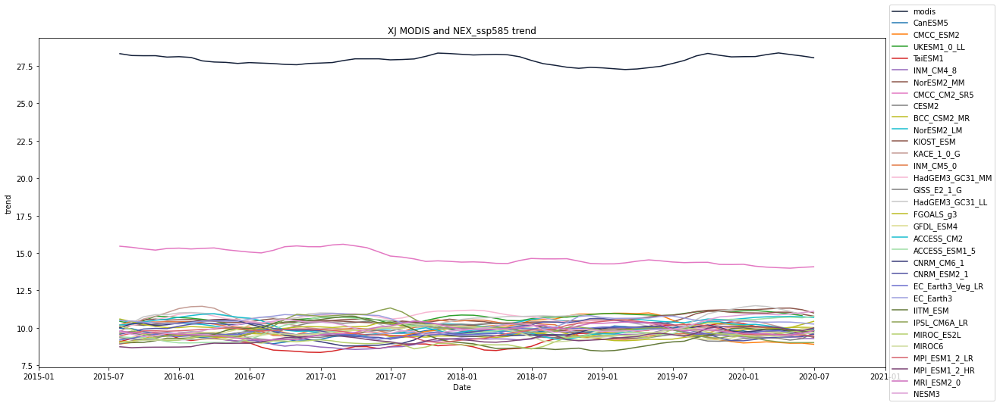

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="trend")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_deco.trend, color='#142039', label='modis')

ax.plot(XJ_ssp585_CanESM5_Monthly_deco.trend, color='#1f77b4', label='CanESM5')
ax.plot(XJ_ssp585_CMCC_ESM2_Monthly_deco.trend, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(XJ_ssp585_UKESM1_0_LL_Monthly_deco.trend, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(XJ_ssp585_TaiESM1_Monthly_deco.trend, color='#d62728', label='TaiESM1')
ax.plot(XJ_ssp585_INM_CM4_8_Monthly_deco.trend, color='#9467bd', label='INM_CM4_8')
ax.plot(XJ_ssp585_NorESM2_MM_Monthly_deco.trend, color='#8c564b', label='NorESM2_MM')
ax.plot(XJ_ssp585_CMCC_CM2_SR5_Monthly_deco.trend, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(XJ_ssp585_CESM2_Monthly_deco.trend, color='#7f7f7f', label='CESM2')
ax.plot(XJ_ssp585_BCC_CSM2_MR_Monthly_deco.trend, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(XJ_ssp585_NorESM2_LM_Monthly_deco.trend, color='#17becf', label='NorESM2_LM')
ax.plot(XJ_ssp585_KIOST_ESM_Monthly_deco.trend, color='#8c564b', label='KIOST_ESM')
ax.plot(XJ_ssp585_KACE_1_0_G_Monthly_deco.trend, color='#c49c94', label='KACE_1_0_G')
ax.plot(XJ_ssp585_INM_CM5_0_Monthly_deco.trend, color='#e37742', label='INM_CM5_0')
ax.plot(XJ_ssp585_HadGEM3_GC31_MM_Monthly_deco.trend, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(XJ_ssp585_GISS_E2_1_G_Monthly_deco.trend, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(XJ_ssp585_HadGEM3_GC31_LL_Monthly_deco.trend, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(XJ_ssp585_FGOALS_g3_Monthly_deco.trend, color='#bcbd22', label='FGOALS_g3')
ax.plot(XJ_ssp585_GFDL_ESM4_Monthly_deco.trend, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(XJ_ssp585_ACCESS_CM2_Monthly_deco.trend, color='#17becf', label='ACCESS_CM2')
ax.plot(XJ_ssp585_ACCESS_ESM1_5_Monthly_deco.trend, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(XJ_ssp585_CNRM_CM6_1_Monthly_deco.trend, color='#393b79', label='CNRM_CM6_1')
ax.plot(XJ_ssp585_CNRM_ESM2_1_Monthly_deco.trend, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(XJ_ssp585_EC_Earth3_Veg_LR_Monthly_deco.trend, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(XJ_ssp585_EC_Earth3_Monthly_deco.trend, color='#9c9ede', label='EC_Earth3')
ax.plot(XJ_ssp585_IITM_ESM_Monthly_deco.trend, color='#637939', label='IITM_ESM')
ax.plot(XJ_ssp585_IPSL_CM6A_LR_Monthly_deco.trend, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(XJ_ssp585_MIROC_ES2L_Monthly_deco.trend, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(XJ_ssp585_MIROC6_Monthly_deco.trend, color='#cedb9c', label='MIROC6')

ax.plot(XJ_ssp585_MPI_ESM1_2_LR_Monthly_deco.trend, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(XJ_ssp585_MPI_ESM1_2_HR_Monthly_deco.trend, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(XJ_ssp585_MRI_ESM2_0_Monthly_deco.trend, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(XJ_ssp585_NESM3_Monthly_deco.trend, color='#de9ed6', label='NESM3')



ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('XJ MODIS and NEX_ssp585 trend')
plt.show()

####ssp126

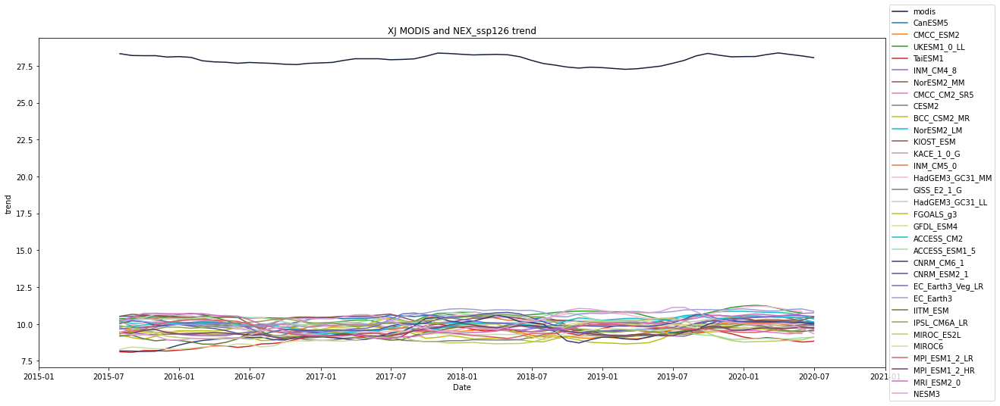

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))


# Set title and labels for axes
ax.set(xlabel="Date",
    ylabel="trend")

ax.set_xlim([datetime.date(2015, 1, 1), datetime.date(2021, 1, 1)])
date_form = DateFormatter("%Y-%m")
ax.xaxis.set_major_formatter(date_form)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.plot(XJ_Monthly_deco.trend, color='#142039', label='modis')

ax.plot(XJ_ssp126_CanESM5_Monthly_deco.trend, color='#1f77b4', label='CanESM5')
ax.plot(XJ_ssp126_CMCC_ESM2_Monthly_deco.trend, color='#ff7f0e', label='CMCC_ESM2')
ax.plot(XJ_ssp126_UKESM1_0_LL_Monthly_deco.trend, color='#2ca02c', label='UKESM1_0_LL')
ax.plot(XJ_ssp126_TaiESM1_Monthly_deco.trend, color='#d62728', label='TaiESM1')
ax.plot(XJ_ssp126_INM_CM4_8_Monthly_deco.trend, color='#9467bd', label='INM_CM4_8')
ax.plot(XJ_ssp126_NorESM2_MM_Monthly_deco.trend, color='#8c564b', label='NorESM2_MM')
ax.plot(XJ_ssp126_CMCC_CM2_SR5_Monthly_deco.trend, color='#e377c2', label='CMCC_CM2_SR5')
ax.plot(XJ_ssp126_CESM2_Monthly_deco.trend, color='#7f7f7f', label='CESM2')
ax.plot(XJ_ssp126_BCC_CSM2_MR_Monthly_deco.trend, color='#bcbd22', label='BCC_CSM2_MR')
ax.plot(XJ_ssp126_NorESM2_LM_Monthly_deco.trend, color='#17becf', label='NorESM2_LM')
ax.plot(XJ_ssp126_KIOST_ESM_Monthly_deco.trend, color='#8c564b', label='KIOST_ESM')
ax.plot(XJ_ssp126_KACE_1_0_G_Monthly_deco.trend, color='#c49c94', label='KACE_1_0_G')
ax.plot(XJ_ssp126_INM_CM5_0_Monthly_deco.trend, color='#e37742', label='INM_CM5_0')
ax.plot(XJ_ssp126_HadGEM3_GC31_MM_Monthly_deco.trend, color='#f7b6d2', label='HadGEM3_GC31_MM')
ax.plot(XJ_ssp126_GISS_E2_1_G_Monthly_deco.trend, color='#7f7f7f', label='GISS_E2_1_G')
ax.plot(XJ_ssp126_HadGEM3_GC31_LL_Monthly_deco.trend, color='#c7c7c7', label='HadGEM3_GC31_LL')
ax.plot(XJ_ssp126_FGOALS_g3_Monthly_deco.trend, color='#bcbd22', label='FGOALS_g3')
ax.plot(XJ_ssp126_GFDL_ESM4_Monthly_deco.trend, color='#dbdb8d', label='GFDL_ESM4')

ax.plot(XJ_ssp126_ACCESS_CM2_Monthly_deco.trend, color='#17becf', label='ACCESS_CM2')
ax.plot(XJ_ssp126_ACCESS_ESM1_5_Monthly_deco.trend, color='#9edea5', label='ACCESS_ESM1_5')
ax.plot(XJ_ssp126_CNRM_CM6_1_Monthly_deco.trend, color='#393b79', label='CNRM_CM6_1')
ax.plot(XJ_ssp126_CNRM_ESM2_1_Monthly_deco.trend, color='#5254a3', label='CNRM_ESM2_1')
ax.plot(XJ_ssp126_EC_Earth3_Veg_LR_Monthly_deco.trend, color='#6b6ecf', label='EC_Earth3_Veg_LR')
ax.plot(XJ_ssp126_EC_Earth3_Monthly_deco.trend, color='#9c9ede', label='EC_Earth3')
ax.plot(XJ_ssp126_IITM_ESM_Monthly_deco.trend, color='#637939', label='IITM_ESM')
ax.plot(XJ_ssp126_IPSL_CM6A_LR_Monthly_deco.trend, color='#8ca252', label='IPSL_CM6A_LR')
ax.plot(XJ_ssp126_MIROC_ES2L_Monthly_deco.trend, color='#b5cf6b', label='MIROC_ES2L')
ax.plot(XJ_ssp126_MIROC6_Monthly_deco.trend, color='#cedb9c', label='MIROC6')

ax.plot(XJ_ssp126_MPI_ESM1_2_LR_Monthly_deco.trend, color='#d6616b', label='MPI_ESM1_2_LR')
ax.plot(XJ_ssp126_MPI_ESM1_2_HR_Monthly_deco.trend, color='#7b4173', label='MPI_ESM1_2_HR')
ax.plot(XJ_ssp126_MRI_ESM2_0_Monthly_deco.trend, color='#ce6dbd', label='MRI_ESM2_0')
ax.plot(XJ_ssp126_NESM3_Monthly_deco.trend, color='#de9ed6', label='NESM3')



ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('XJ MODIS and NEX_ssp126 trend')
plt.show()